# PARAMS

In [1]:
import numpy as np
import pandas as pd
import os
import xarray as xr
import seaborn as sns

from n0_config_params import *
from n0bis_config_analysis_functions import *
from n0ter_stats import *

from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

/home/jules.granget/myenvs/py39c/lib64/python3.9/site-packages/outdated/utils.py:14: OutdatedCacheFailedWarning: Failed to use cache while checking for outdated package.
Set the environment variable OUTDATED_RAISE_EXCEPTION=1 for a full traceback.
Set the environment variable OUTDATED_IGNORE=1 to disable these warnings.
  return warn(
/home/jules.granget/myenvs/py39c/lib64/python3.9/site-packages/outdated/utils.py:14: OutdatedPackageWarning: The package pingouin is out of date. Your version is 0.5.2, the latest is 0.5.3.
Set the environment variable OUTDATED_IGNORE=1 to disable these warnings.
  return warn(


# Load data

In [2]:
os.chdir(os.path.join(path_data, 'psychometric'))
os.listdir()

['OLFADYS_mdp.xlsx',
 'OLFADYS_MAIA.xlsx',
 'OLFADYS_odor_profiles.xlsx',
 'OLFADYS_questionnaire.xlsx',
 'OLFADYS_correspondance_questions.xlsx',
 'OLFADYS_odor_choice.xlsx']

In [3]:
sujet_best_list = np.array(['BD12', 'CM32', 'FA11', 'GM16', 'HJ31', 'JR17', 'MA33',
                            'MN26', 'PD01', 'SC29', 'TA09', 'TJ24', 'TM19', 'VN03','ZV21'])
sujet_best_list_rev = np.array(['12BD', '32CM', '11FA', '16GM', '31HJ', '17JR', '33MA',
                            '26MN', '01PD', '29SC', '09TA', '24TJ', '19TM', '03VN','21ZV'])

sujet_no_respond = np.array(['GB04', 'LV05', 'EF06', 'PB07', 'DM08', 'BH10', 'FP13', 
                             'MD14', 'LG15', 'TY20', 'LF23', 'DF25', 'NT28', 'AR30'])
sujet_no_respond_rev = np.array(['04GB', '05LV', '06EF', '07PB', '08DM', '10BH', '13FP', 
                             '14MD', '15LG', '20TY', '23LF', '25DF', '28NT', '30AR'])

sujet_list_balanced = np.array(['01PD','04GB','05LV','06EF','07PB','08DM','09TA','10BH','11FA','12BD','13FP',
'14MD','15LG','16GM','17JR','19TM','20TY','21ZV','23LF','24TJ','25DF','26MN','28NT','29SC','30AR','31HJ',
'32CM','33MA'])
sujet_list_balanced_rev = np.array(['PD01','GB04','LV05','EF06','PB07','DM08','TA09','BH10','FA11','BD12','FP13',
'MD14','LG15','GM16','JR17','TM19','TY20','ZV21','LF23','TJ24','DF25','MN26','NT28','SC29','AR30','HJ31',
'CM32','MA33'])

sujet_list_erp = np.array(['01PD','03VN','04GB','05LV','06EF','07PB','08DM','09TA','10BH','11FA','12BD',
'14MD','15LG','16GM','17JR','19TM','20TY','21ZV','23LF','24TJ','25DF','26MN','28NT','29SC',
'30AR','31HJ','32CM','33MA'])
sujet_list_erp_rev = np.array(['PD01','VN03','GB04','LV05','EF06','PB07','DM08','TA09','BH10','FA11','BD12',
'MD14','LG15','GM16','JR17','TM19','TY20','ZV21','LF23','TJ24','DF25','MN26','NT28','SC29',
'AR30','HJ31','CM32','MA33'])

In [4]:
df_mdp = pd.read_excel('OLFADYS_mdp.xlsx')
df_q = pd.read_excel('OLFADYS_questionnaire.xlsx')
correspondance_question = pd.read_excel('OLFADYS_correspondance_questions.xlsx')
df_odor_profile = pd.read_excel('OLFADYS_odor_profiles.xlsx')
df_odor_choice = pd.read_excel('OLFADYS_odor_choice.xlsx')
df_MAIA_raw = pd.read_excel('OLFADYS_MAIA.xlsx')

In [15]:
df_mdp = df_mdp.query(f"sujet in {sujet_list_erp_rev.tolist()}")

In [17]:
os.chdir(os.path.join(path_data, 'respi_detection'))
df_respi_paris = pd.read_excel('OLFADYS_alldata_mean.xlsx')

In [20]:
os.chdir(os.path.join(path_data, 'respi_detection'))
df_CO2 = pd.read_excel('OLFADYS_alldata_mean.xlsx').query(f"cond == 'CO2'")[['sujet', 'odor', 'PetCO2', 'VAS_A', 'VAS_S']].reset_index(drop=True)
df_CO2 = df_CO2.query(f"sujet in {sujet_list_erp.tolist()}").reset_index(drop=True)

for row_i in range(df_CO2.shape[0]):

    if df_CO2['odor'][row_i] == 'p':
        df_CO2['odor'][row_i] = '+'
    if df_CO2['odor'][row_i] == 'n':
        df_CO2['odor'][row_i] = '-'

for nan_i in np.where(df_CO2['PetCO2'].isnull().values)[0]:
    odor = df_CO2['odor'][nan_i]
    nan_replace_petCO2 = df_CO2.query(f"odor == '{odor}'")['PetCO2'].median()
    nan_replace_VAS_A = df_CO2.query(f"odor == '{odor}'")['VAS_A'].median()
    nan_replace_VAS_S = df_CO2.query(f"odor == '{odor}'")['VAS_S'].median()
    df_CO2['PetCO2'][nan_i] = nan_replace_petCO2 
    df_CO2['VAS_A'][nan_i] = nan_replace_VAS_A 
    df_CO2['VAS_S'][nan_i] = nan_replace_VAS_S 

/tmp/ipykernel_3137796/3027781124.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_CO2['odor'][row_i] = '+'
/tmp/ipykernel_3137796/3027781124.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_CO2['odor'][row_i] = '-'
/tmp/ipykernel_3137796/3027781124.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_CO2['PetCO2'][nan_i] = nan_replace_petCO2
/tmp/ipykernel_3137796/3027781124.py:18: SettingWithCopyWarning: 
A value is t

In [22]:
df_CO2 = df_CO2.reset_index(drop=True)
A1_val = []
for row_i in range(df_CO2.shape[0]):

    _sujet, _odor = df_CO2['sujet'][row_i], df_CO2['odor'][row_i]
    _sujet_rev = f"{_sujet[2:]}{_sujet[:2]}"
    
    A1_val.append(df_mdp.query(f"sujet == '{_sujet_rev}' and question == 'A1' and session == '{_odor}' and cond == 'CO2'")['value'].values[0])

df_CO2['A1'] = A1_val

In [64]:
val = np.zeros((df_q['sujet'].unique().shape[0]*df_q['session'].unique().shape[0]*df_q['cond'].unique().shape[0], 4), dtype='object')
i = 0
for sujet_i, sujet in enumerate(df_q['sujet'].unique()):
    for session_i, session in enumerate(df_q['session'].unique()):
        for cond_i, cond in enumerate(df_q['cond'].unique()):
            df_i = df_q.query(f"sujet == '{sujet}' & session == '{session}' & cond == '{cond}'")
            val_p = 300 - df_i[df_i['question'].isin([1, 4, 5])]['val'].sum()
            val_n = df_i[df_i['question'].isin([2, 3, 6])]['val'].sum()
            val_stai = ((val_n + val_p)/600)*100
            val[i, :] = np.array([sujet, session, cond, val_stai])
            i += 1
df_stai = pd.DataFrame(val, columns=['sujet', 'session', 'cond', 'val'])
df_stai['val'] = df_stai['val'].astype(np.float64) 
df_stai = df_stai.query(f"sujet in {sujet_list_erp_rev.tolist()}")


In [25]:
df_relax = df_q.query(f"question == 7").drop(['question', 'raw_val', 'scale'], axis=1)
df_relax = df_relax.query(f"sujet in {sujet_list_erp_rev.tolist()}")

In [28]:
question_A2 = ['A2_1', 'A2_2', 'A2_3', 'A2_4', 'A2_5']
df_A2 = df_mdp.query(f"question in {question_A2}").groupby(['sujet', 'session', 'cond']).mean().reset_index()
df_A2 = df_A2.query(f"sujet in {sujet_list_erp_rev.tolist()}")

/tmp/ipykernel_3137796/112943964.py:2: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_A2 = df_mdp.query(f"question in {question_A2}").groupby(['sujet', 'session', 'cond']).mean().reset_index()


In [33]:
MAIA_aspects_list = ['Noticing', 'Not_Distracting', 'Not_Worrying', 'Attention_Regulation', 'Emotional_Awareness', 'Self_Regulation', 'Body_Listening', 'Trusting' ]
dict_MAIA = {'sujet' : [], 'aspect' : [], 'value' : [], 'rep' : []}

for sujet in sujet_list:

    sujet_rev = f"{sujet[2:]}{sujet[:2]}"

    for aspect in MAIA_aspects_list:

        dict_MAIA['sujet'].append(sujet)
        dict_MAIA['aspect'].append(aspect)

        if aspect == 'Noticing':
            val = df_MAIA_raw.query(f"sujet == '{sujet}' and question in [1, 2, 3, 4]")['value'].mean()
        if aspect == 'Not_Distracting':
            val = (5 - df_MAIA_raw.query(f"sujet == '{sujet}' and question in [5, 6, 7]")['value'].values).mean()
        if aspect == 'Not_Worrying':
            val = np.append((5 - df_MAIA_raw.query(f"sujet == '{sujet}' and question in [8, 9]")['value'].values), (df_MAIA_raw.query(f"sujet == '{sujet}' and question in [10]")['value'].values)).mean()
        if aspect == 'Attention_Regulation':
            val = df_MAIA_raw.query(f"sujet == '{sujet}' and question in [11, 12, 13 ,14 ,15 ,16 ,17]")['value'].mean()
        if aspect == 'Emotional_Awareness':
            val = df_MAIA_raw.query(f"sujet == '{sujet}' and question in [18, 19, 20, 21, 22]")['value'].mean()
        if aspect == 'Self_Regulation':
            val = df_MAIA_raw.query(f"sujet == '{sujet}' and question in [23, 24, 25, 26]")['value'].mean()
        if aspect == 'Body_Listening':
            val = df_MAIA_raw.query(f"sujet == '{sujet}' and question in [27, 28, 29]")['value'].mean()
        if aspect == 'Trusting':
            val = df_MAIA_raw.query(f"sujet == '{sujet}' and question in [30, 31, 32]")['value'].mean()

        if sujet_rev in sujet_best_list:
            dict_MAIA['rep'].append('+')
        else:
            dict_MAIA['rep'].append('-')
            
        dict_MAIA['value'].append(val)

df_MAIA = pd.DataFrame(dict_MAIA)
df_MAIA = df_MAIA.query(f"sujet in {sujet_list_erp.tolist()}")


/tmp/ipykernel_3137796/1660341071.py:16: RuntimeWarning: Mean of empty slice.
  val = (5 - df_MAIA_raw.query(f"sujet == '{sujet}' and question in [5, 6, 7]")['value'].values).mean()
/home/jules.granget/myenvs/py39c/lib64/python3.9/site-packages/numpy/core/_methods.py:192: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/tmp/ipykernel_3137796/1660341071.py:18: RuntimeWarning: Mean of empty slice.
  val = np.append((5 - df_MAIA_raw.query(f"sujet == '{sujet}' and question in [8, 9]")['value'].values), (df_MAIA_raw.query(f"sujet == '{sujet}' and question in [10]")['value'].values)).mean()


# FILTER SUBJECTS

## difference hedonicity

In [35]:
val = np.zeros((df_odor_choice['sujet'].unique().shape[0], 2), dtype='object')
i = 0
for sujet_i, sujet in enumerate(df_odor_choice['sujet'].unique()):
    df_i = df_odor_choice.query(f"sujet == '{sujet}'")
    diff_i = df_i[df_i['session'] == 'odor_+']['value'].values[0] - df_i[df_i['session'] == 'odor_-']['value'].values[0]
    val[i, :] = np.array([sujet, diff_i])
    i += 1

df_diff = pd.DataFrame(val, columns=['sujet', 'value'])
df_diff['value'] = df_diff['value'].astype(np.float64) 
df_diff

,sujet,value
0,PD01,46.456693
1,MJ02,40.944882
2,VN03,27.559055
3,GB04,78.740157
4,LV05,33.858268
5,EF06,62.204724
6,PB07,80.314961
7,DM08,78.571429
8,TA09,75.396825
9,BH10,41.269841


<AxesSubplot: xlabel='value', ylabel='Count'>

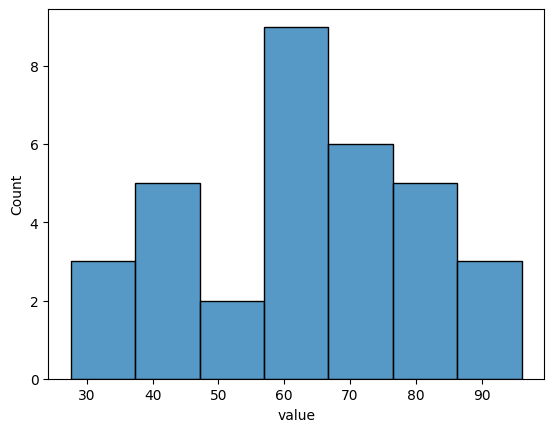

In [36]:
sns.histplot(data=df_diff, x="value")


## selection on A2

In [37]:
data = {'sujet' : [], 'MECA' : [], 'CO2' : []}

for sujet in sujet_list_erp_rev:

    data['sujet'].append(sujet)

    for cond in ['MECA', 'CO2']:

        diff = df_A2.query(f"sujet == '{sujet}' and cond == '{cond}' and session == 'o'")['value'].values - df_A2.query(f"sujet == '{sujet}' and cond == '{cond}' and session == '+'")['value'].values
        data[cond].append(diff[0])

df_sujet_diff_value_selection = pd.DataFrame(data)
df_sujet_diff_value_selection.sort_values('CO2', ascending=False)

,sujet,MECA,CO2
7,TA09,0.4,3.0
27,MA33,1.0,2.8
17,ZV21,0.2,2.0
23,SC29,1.8,1.4
19,TJ24,-0.6,1.4
13,GM16,0.0,1.2
10,BD12,0.2,0.6
15,TM19,0.2,0.6
25,HJ31,-0.8,0.6
21,MN26,0.8,0.4


In [38]:
sujet_best_sel = df_A2['sujet'].unique()[df_A2.query(f"cond == '{cond}' and session == '+'")['value'].values < df_A2.query(f"cond == '{cond}' and session == 'o'")['value'].values]
print(sujet_best_sel)
sujet_best_sel = sujet_best_sel.tolist()

['BD12' 'CM32' 'FA11' 'GM16' 'HJ31' 'JR17' 'MA33' 'MN26' 'PD01' 'SC29'
 'TA09' 'TJ24' 'TM19' 'VN03' 'ZV21']


In [39]:
sujet_no_best_sel = [sujet for sujet in df_A2['sujet'].unique() if sujet not in sujet_best_sel]
print(sujet_no_best_sel)

['AR30', 'BH10', 'DF25', 'DM08', 'EF06', 'GB04', 'LF23', 'LG15', 'LV05', 'MD14', 'NT28', 'PB07', 'TY20']


In [40]:
#### suppress PD01 who wasnt relaxed in MECA at all

In [41]:
print(f"sujet selected = {len([sujet for sujet in sujet_list_erp_rev if sujet in sujet_best_sel])}")
print(f"sujet selected = {[sujet for sujet in sujet_list_erp_rev if sujet in sujet_best_sel]}")

print(f"sujet not selected = {len([sujet for sujet in sujet_list_erp_rev if sujet not in sujet_best_sel])}")
print(f"sujet not selected = {[sujet for sujet in sujet_list_erp_rev if sujet not in sujet_best_sel]}")
sujet_no_best_sel = np.array([sujet for sujet in sujet_list_erp_rev if sujet not in sujet_best_sel])


sujet selected = 15
sujet selected = ['PD01', 'VN03', 'TA09', 'FA11', 'BD12', 'GM16', 'JR17', 'TM19', 'ZV21', 'TJ24', 'MN26', 'SC29', 'HJ31', 'CM32', 'MA33']
sujet not selected = 13
sujet not selected = ['GB04', 'LV05', 'EF06', 'PB07', 'DM08', 'BH10', 'MD14', 'LG15', 'TY20', 'LF23', 'DF25', 'NT28', 'AR30']


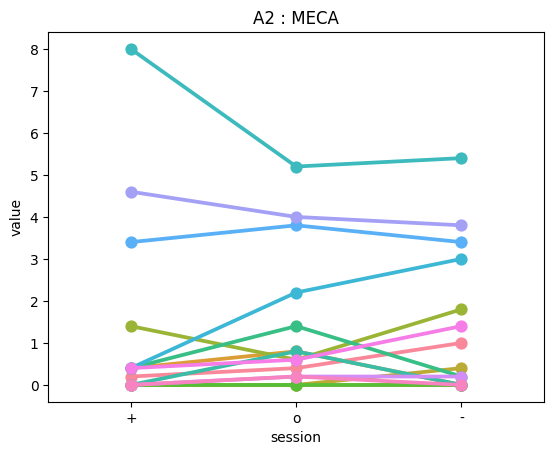

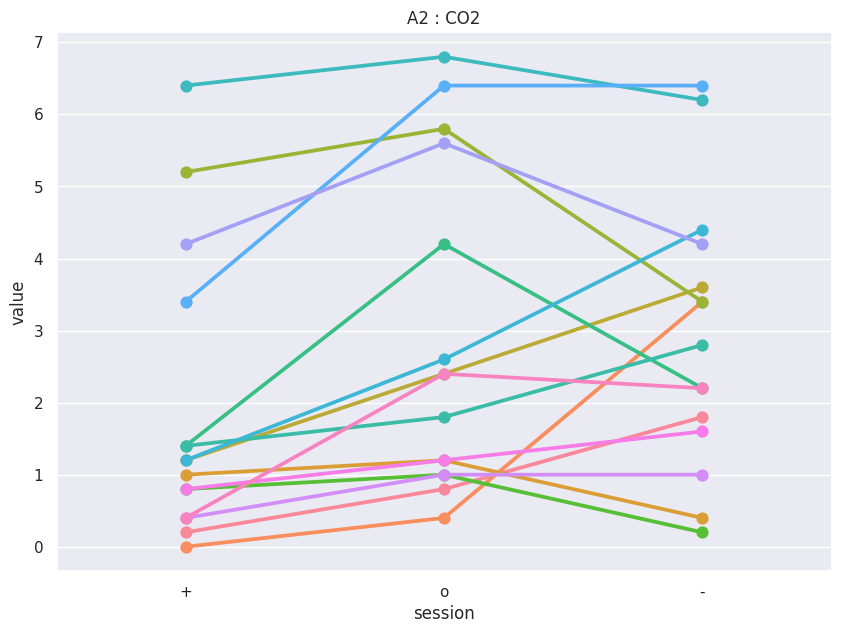

In [42]:
for cond in ['MECA', 'CO2']:
    
    fig, ax = plt.subplots()
    df_plot = df_A2.query(f"cond == '{cond}' and sujet in {sujet_best_sel}")
    sns.pointplot(data=df_plot, x="session", y="value", hue="sujet", ax=ax, order=['+', 'o', '-'])
    plt.legend([],[], frameon=False)
    plt.title(f'A2 : {cond}')
    sns.set(rc={'figure.figsize':(10,7)})

/crnldata/cmo/multisite/DATA_MANIP/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:382: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predictor).std()[outcome].reset_index()[outcome].rename('sd')], axis = 1).round(2).set_index(predictor)
/crnldata/cmo/multisite/DATA_MANIP/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:382: FutureWarning: The default value of numeric_only in DataFrameGroupBy.std is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predictor).std()[outcome].reset_index()[outcome].rena

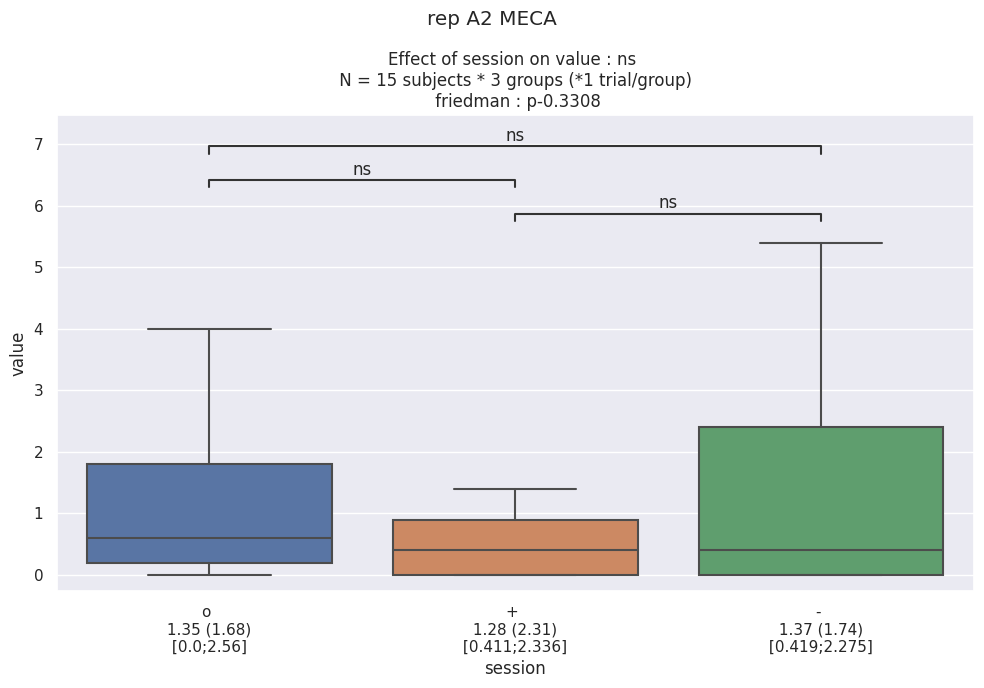

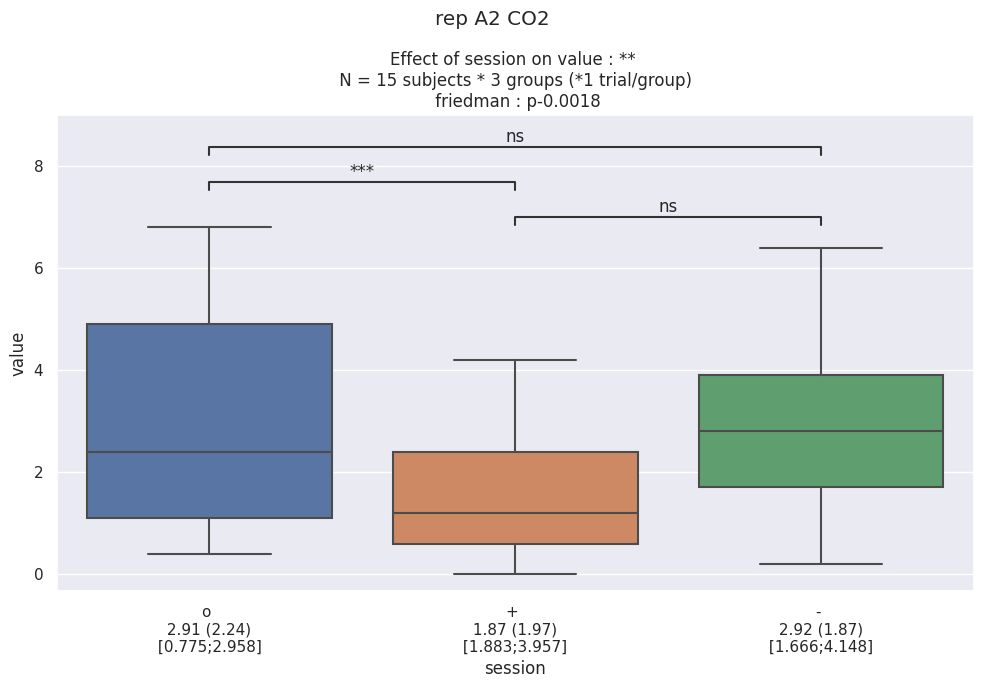

In [43]:
predictor = 'session' 
outcome = 'value'
for cond in ['MECA', 'CO2']:
    df_stats = df_A2.query(f"cond == '{cond}' and sujet in {sujet_best_sel}")
    fig, ax = plt.subplots()
    ax = auto_stats(df_stats, predictor, outcome, ax=ax, subject='sujet', design='within', mode='box', transform=False, verbose=True, order=['o', '+', '-'])
    plt.suptitle(f"rep A2 {cond}")
    plt.tight_layout()

In [44]:
predictor = 'session' 
outcome = 'value'
for cond in ['MECA', 'CO2']:
    df_stats = df_A2.query(f"cond == '{cond}' and sujet in {sujet_no_best_sel}")
    fig, ax = plt.subplots()
    ax = auto_stats(df_stats, predictor, outcome, ax=ax, subject='sujet', design='within', mode='box', transform=False, verbose=True, order=['o', '+', '-'])
    plt.suptitle(f"no rep A2 {cond}")
    plt.tight_layout()

ValueError: multi-line expressions are only valid in the context of data, use DataFrame.eval

/crnldata/cmo/multisite/DATA_MANIP/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:382: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predictor).std()[outcome].reset_index()[outcome].rename('sd')], axis = 1).round(2).set_index(predictor)
/crnldata/cmo/multisite/DATA_MANIP/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:382: FutureWarning: The default value of numeric_only in DataFrameGroupBy.std is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predictor).std()[outcome].reset_index()[outcome].rena

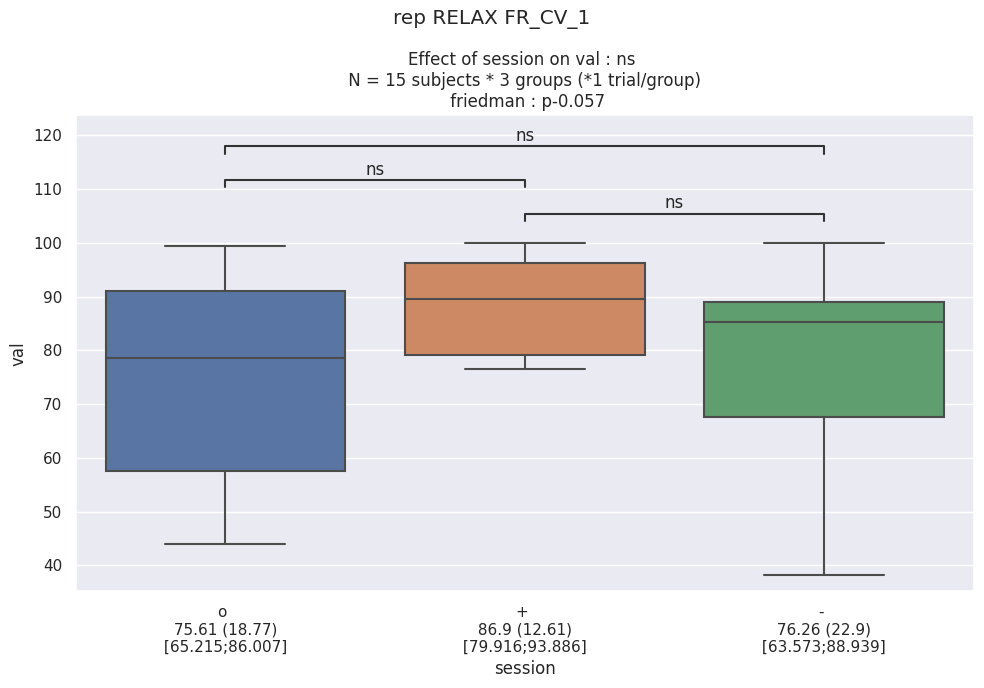

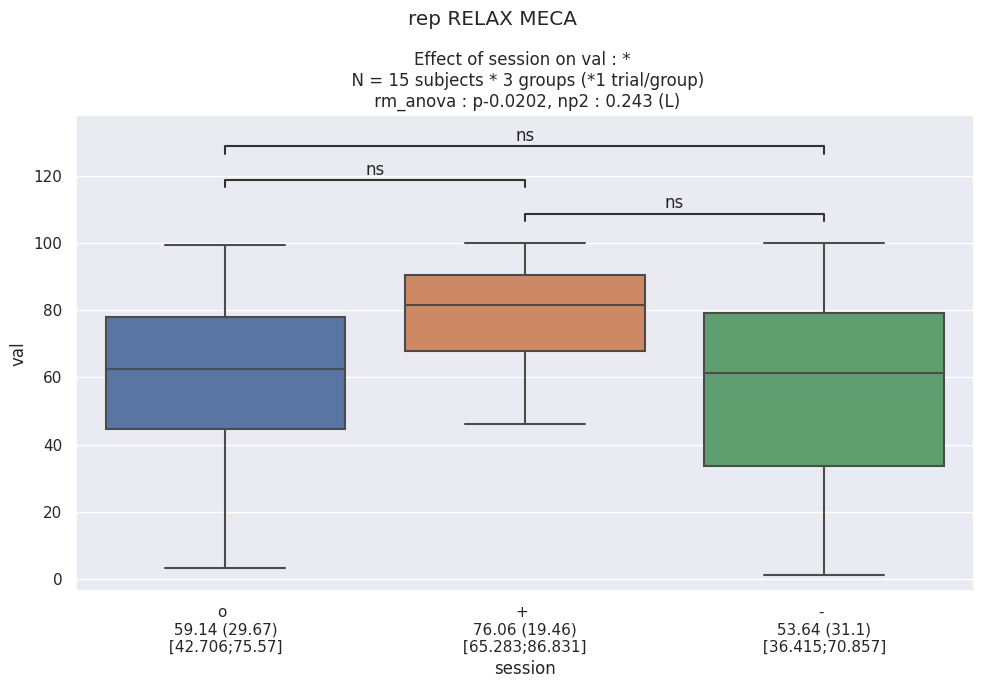

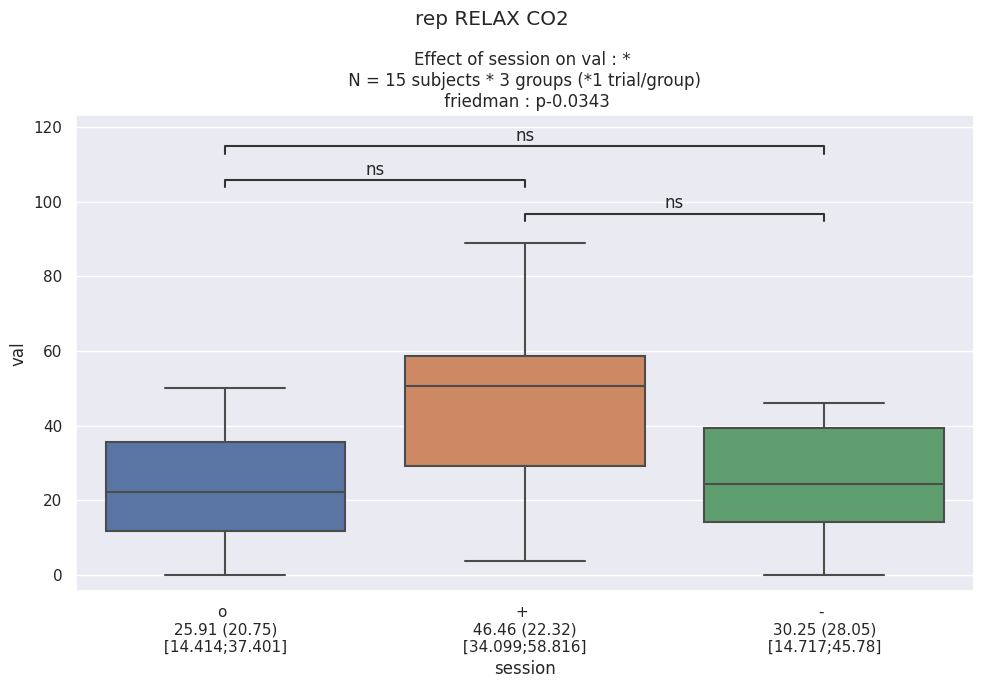

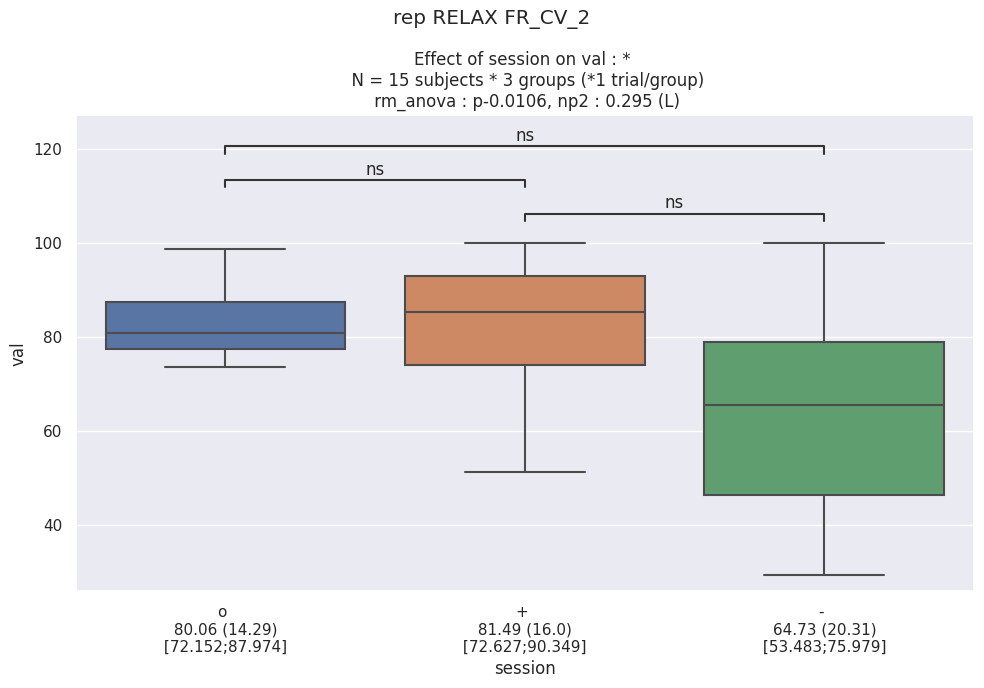

In [ ]:
predictor = 'session' 
outcome = 'val'
for cond in conditions:
    df_stats = df_relax.query(f"cond == '{cond}' and sujet in {sujet_best_sel}")
    fig, ax = plt.subplots()
    ax = auto_stats(df_stats, predictor, outcome, ax=ax, subject='sujet', design='within', mode='box', transform=False, verbose=True, order=['o', '+', '-'])
    plt.suptitle(f"rep RELAX {cond}")
    plt.tight_layout()

/crnldata/cmo/multisite/DATA_MANIP/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:382: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predictor).std()[outcome].reset_index()[outcome].rename('sd')], axis = 1).round(2).set_index(predictor)
/crnldata/cmo/multisite/DATA_MANIP/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:382: FutureWarning: The default value of numeric_only in DataFrameGroupBy.std is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predictor).std()[outcome].reset_index()[outcome].rena

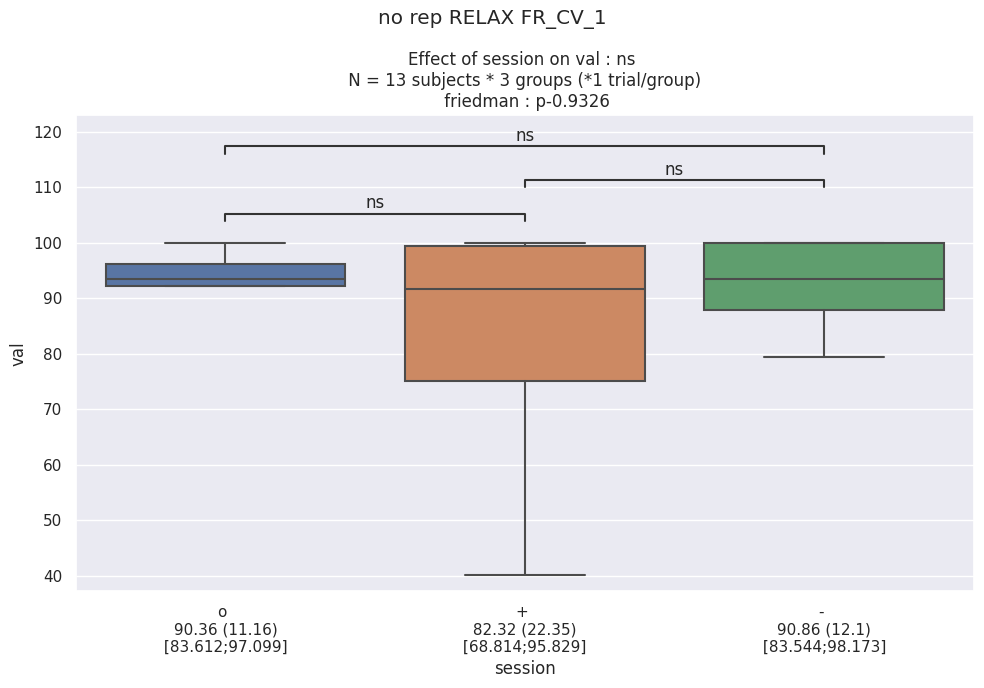

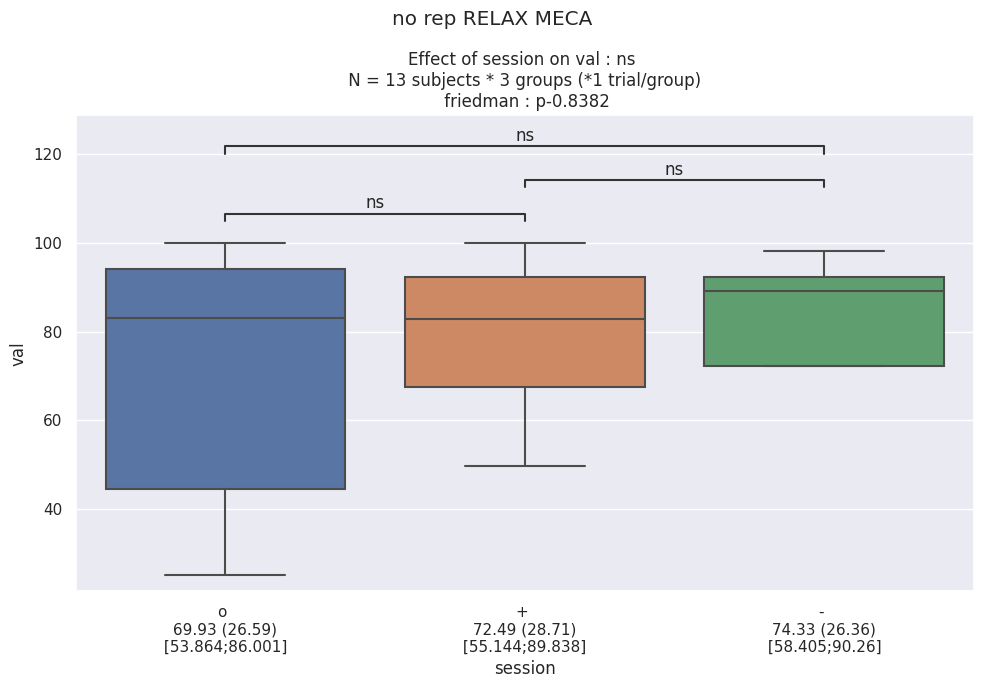

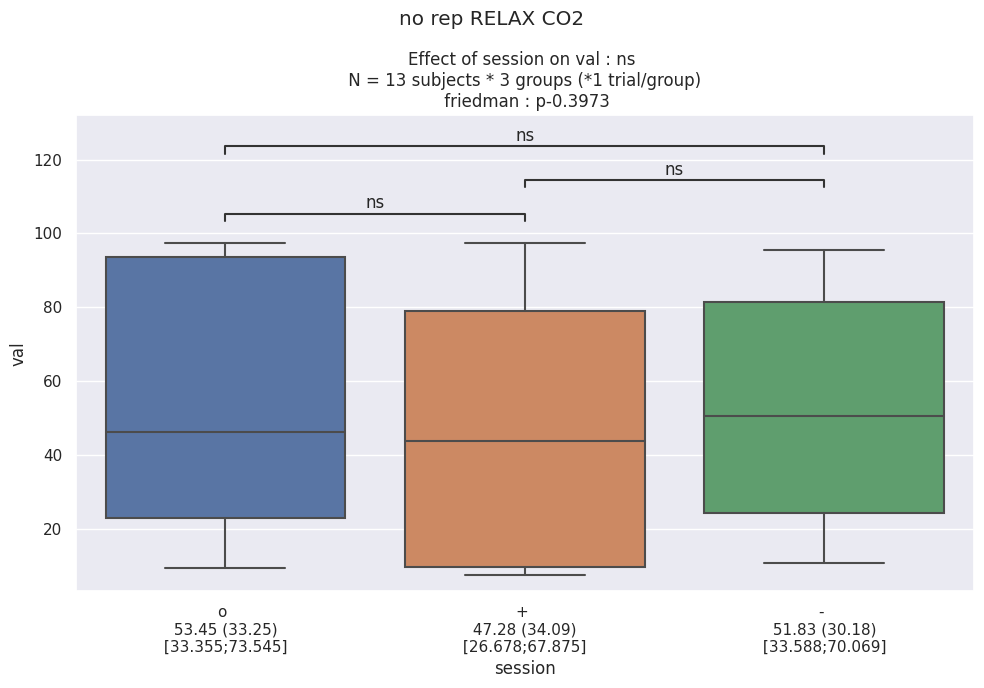

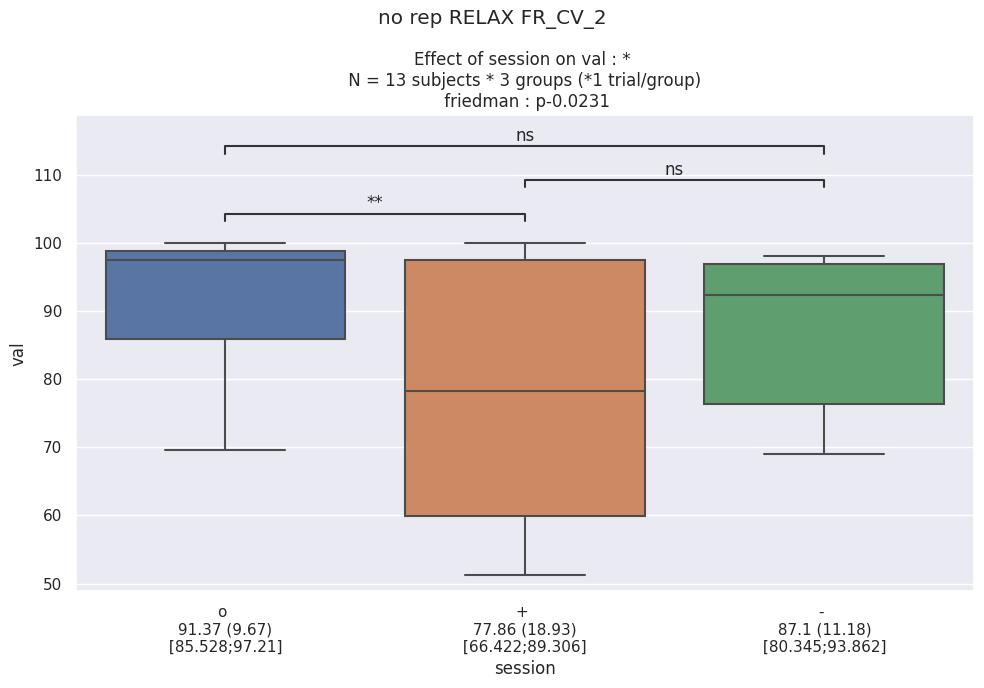

In [ ]:
predictor = 'session' 
outcome = 'val'
for cond in conditions:
    df_stats = df_relax.query(f"cond == '{cond}' and sujet in {sujet_no_best_sel}")
    fig, ax = plt.subplots()
    ax = auto_stats(df_stats, predictor, outcome, ax=ax, subject='sujet', design='within', mode='box', transform=False, verbose=True, order=['o', '+', '-'])
    plt.suptitle(f"no rep RELAX {cond}")
    plt.tight_layout()

/crnldata/cmo/multisite/DATA_MANIP/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:382: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predictor).std()[outcome].reset_index()[outcome].rename('sd')], axis = 1).round(2).set_index(predictor)
/crnldata/cmo/multisite/DATA_MANIP/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:382: FutureWarning: The default value of numeric_only in DataFrameGroupBy.std is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predictor).std()[outcome].reset_index()[outcome].rena

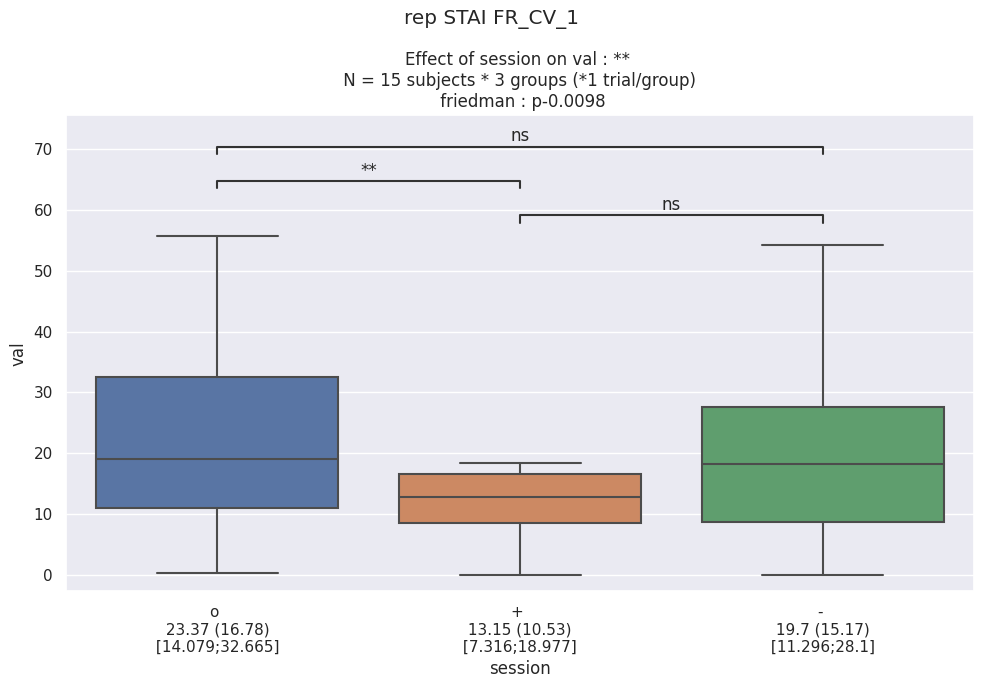

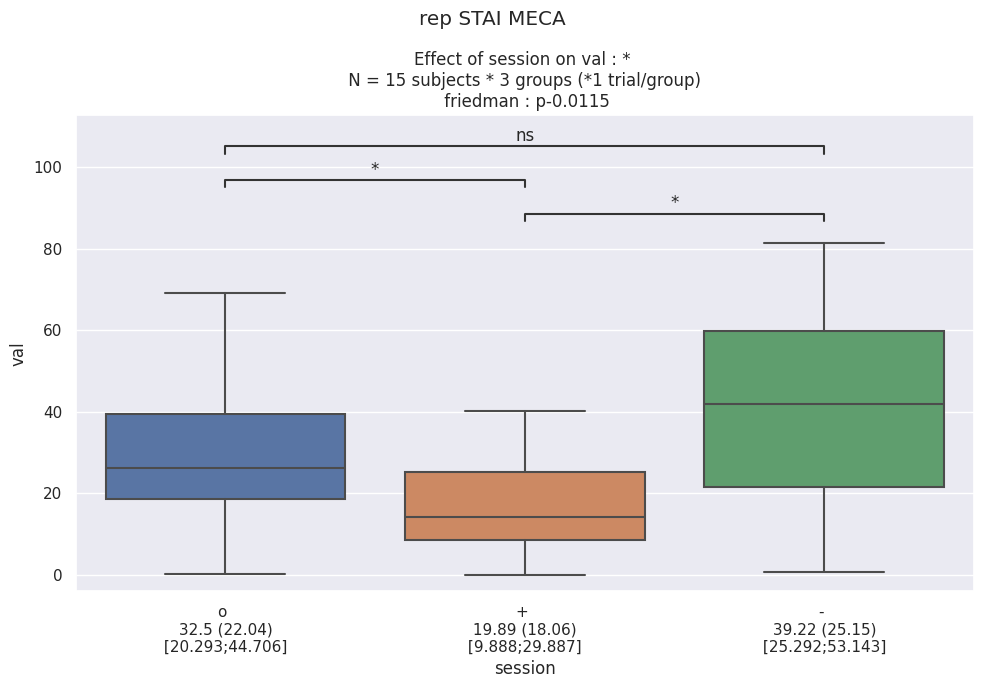

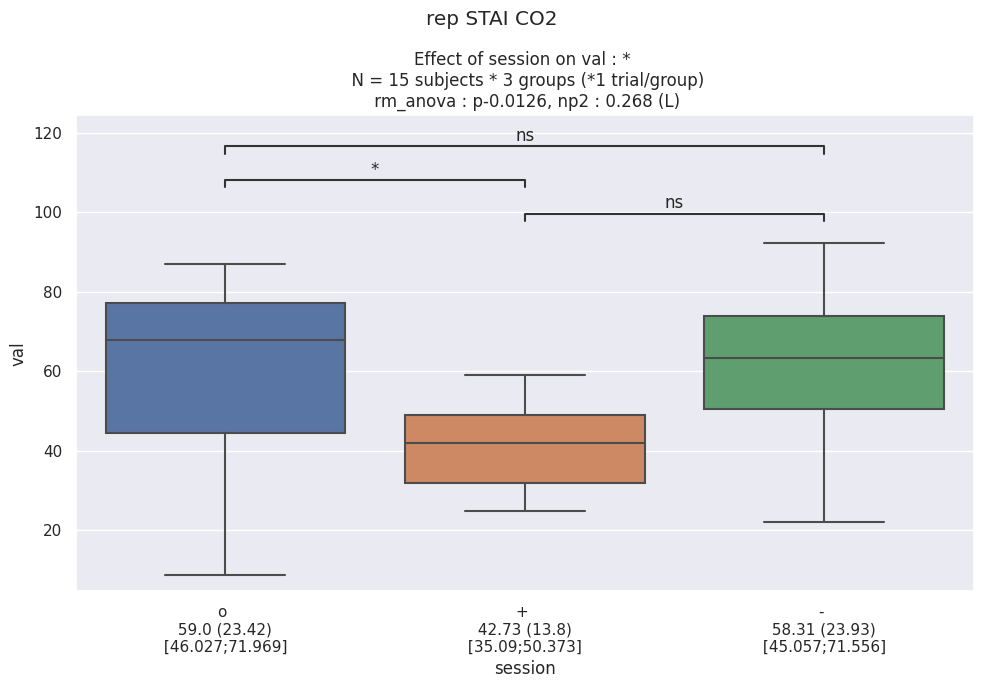

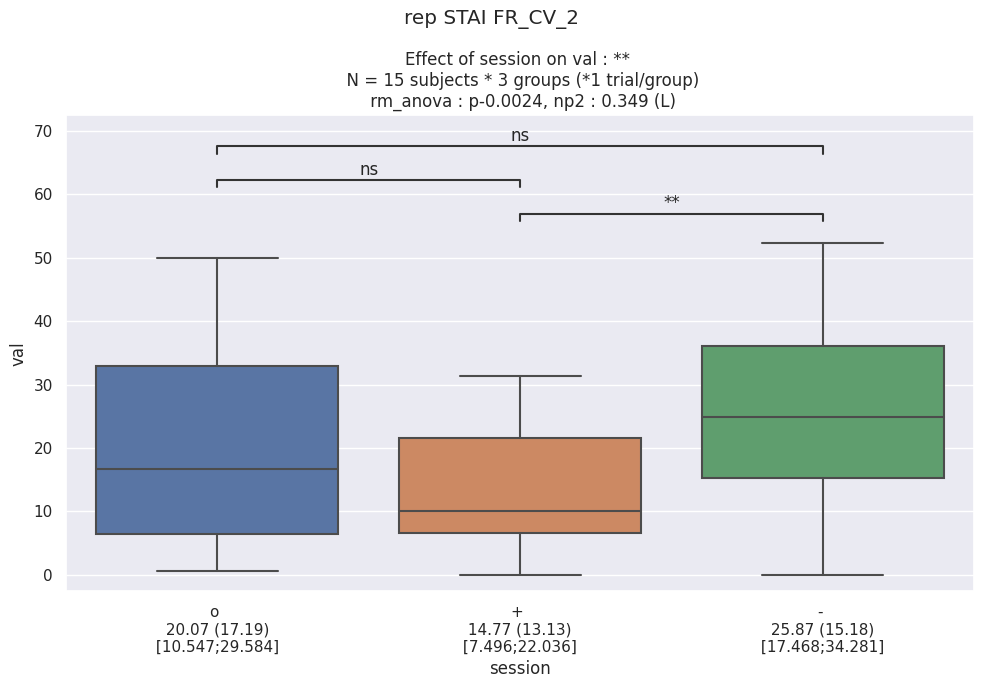

In [ ]:
predictor = 'session' 
outcome = 'val'
for cond in conditions:
    df_stats = df_stai.query(f"cond == '{cond}' and sujet in {sujet_best_sel}")
    fig, ax = plt.subplots()
    ax = auto_stats(df_stats, predictor, outcome, ax=ax, subject='sujet', design='within', mode='box', transform=False, verbose=True, order=['o', '+', '-'])
    plt.suptitle(f"rep STAI {cond}")
    plt.tight_layout()

/crnldata/cmo/multisite/DATA_MANIP/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:382: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predictor).std()[outcome].reset_index()[outcome].rename('sd')], axis = 1).round(2).set_index(predictor)
/crnldata/cmo/multisite/DATA_MANIP/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:382: FutureWarning: The default value of numeric_only in DataFrameGroupBy.std is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predictor).std()[outcome].reset_index()[outcome].rena

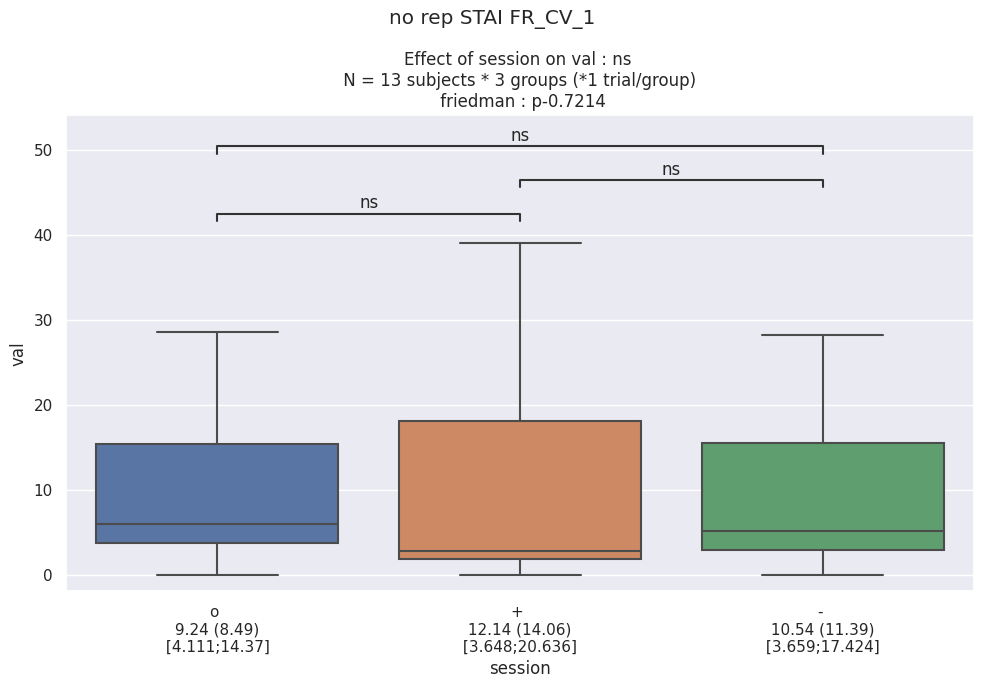

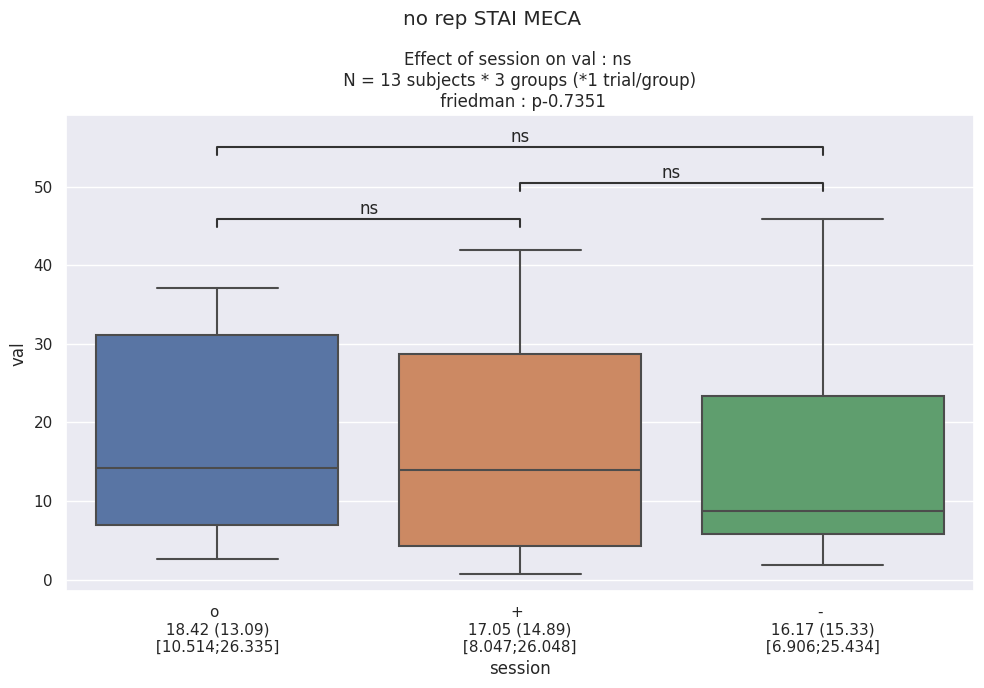

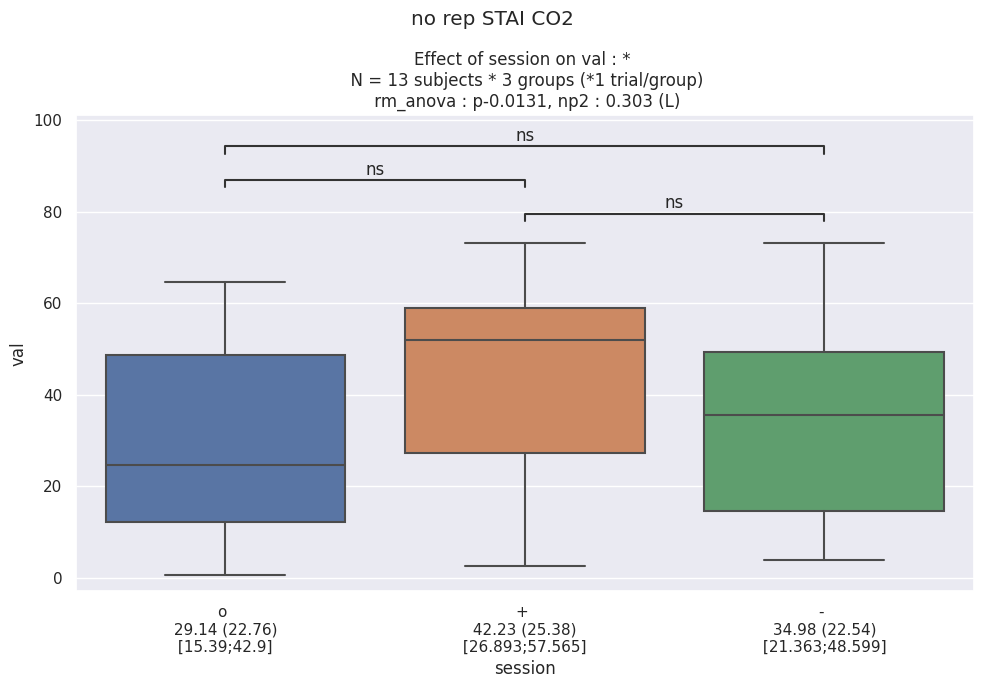

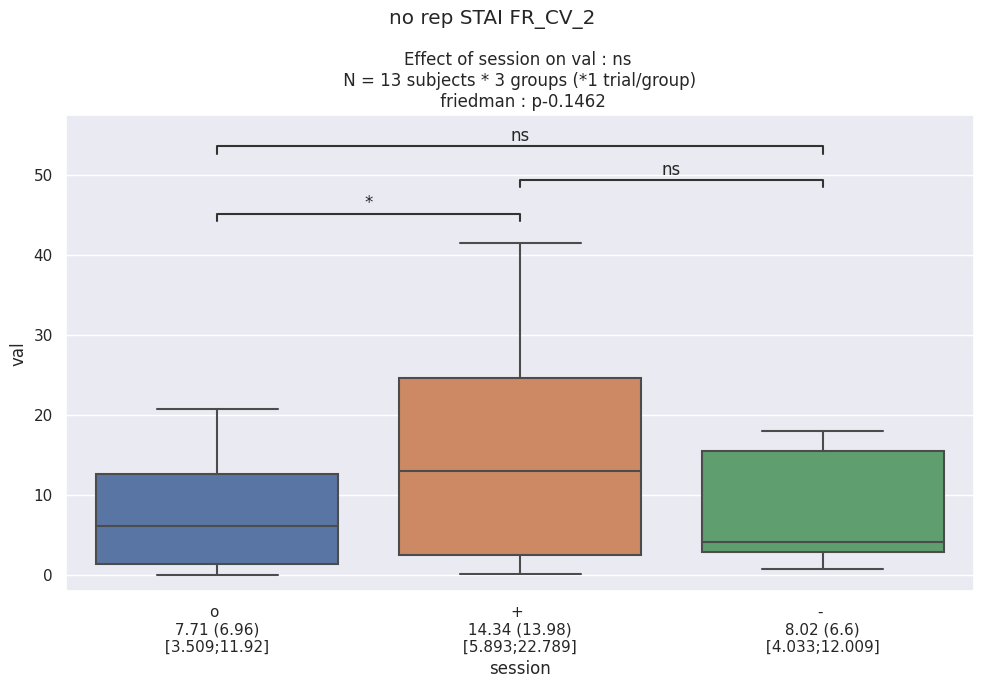

In [ ]:
predictor = 'session' 
outcome = 'val'
for cond in conditions:
    df_stats = df_stai.query(f"cond == '{cond}' and sujet in {sujet_no_best_sel}")
    fig, ax = plt.subplots()
    ax = auto_stats(df_stats, predictor, outcome, ax=ax, subject='sujet', design='within', mode='box', transform=False, verbose=True, order=['o', '+', '-'])
    plt.suptitle(f"no rep STAI {cond}")
    plt.tight_layout()

## relaxation

In [ ]:
df_relax

,sujet,session,cond,val
6,PD01,o,FR_CV_1,45.283019
14,PD01,o,MECA,16.981132
22,PD01,o,CO2,13.207547
30,PD01,o,FR_CV_2,60.377358
38,PD01,+,FR_CV_1,53.503185
...,...,...,...,...
3134,MA33,+,FR_CV_2,90.322581
3142,MA33,-,FR_CV_1,100.000000
3150,MA33,-,MECA,32.258065
3158,MA33,-,CO2,23.076923


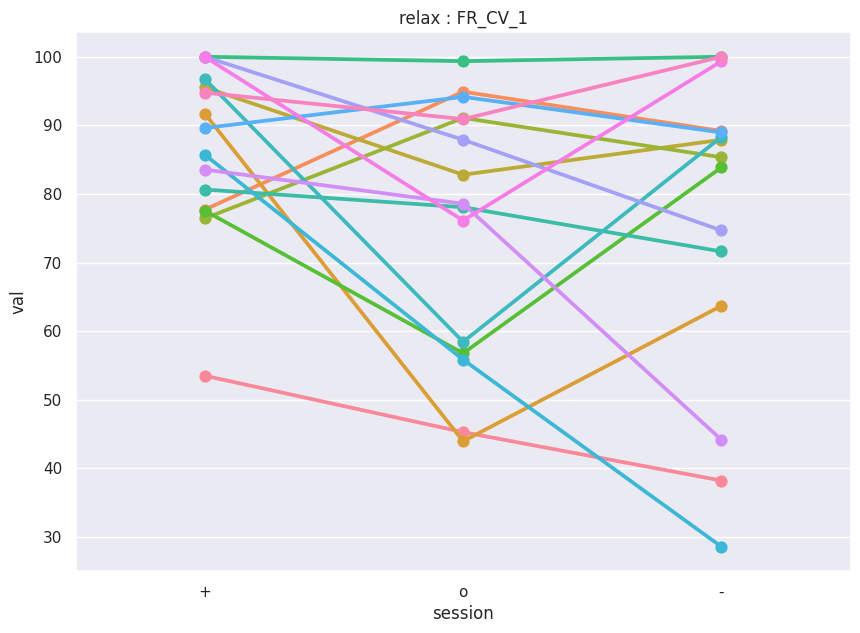

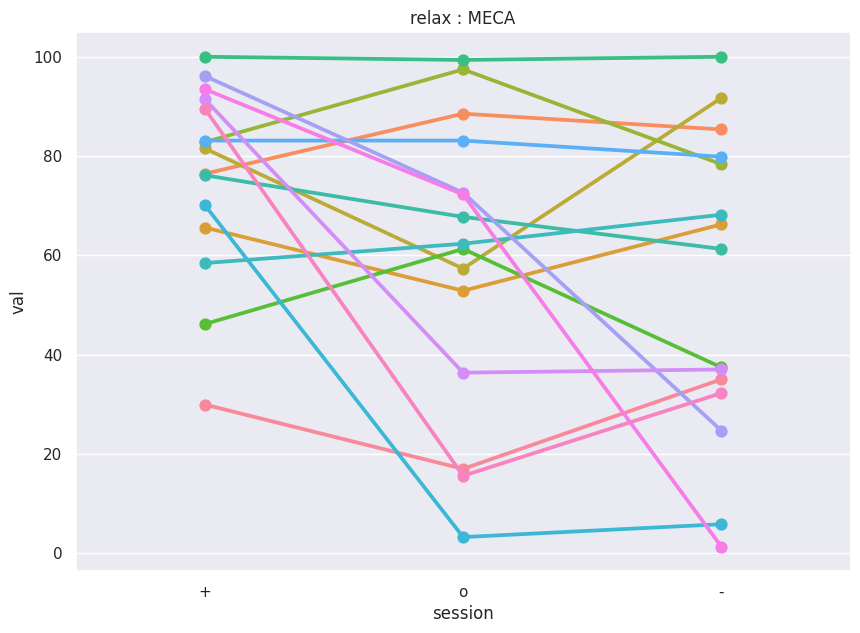

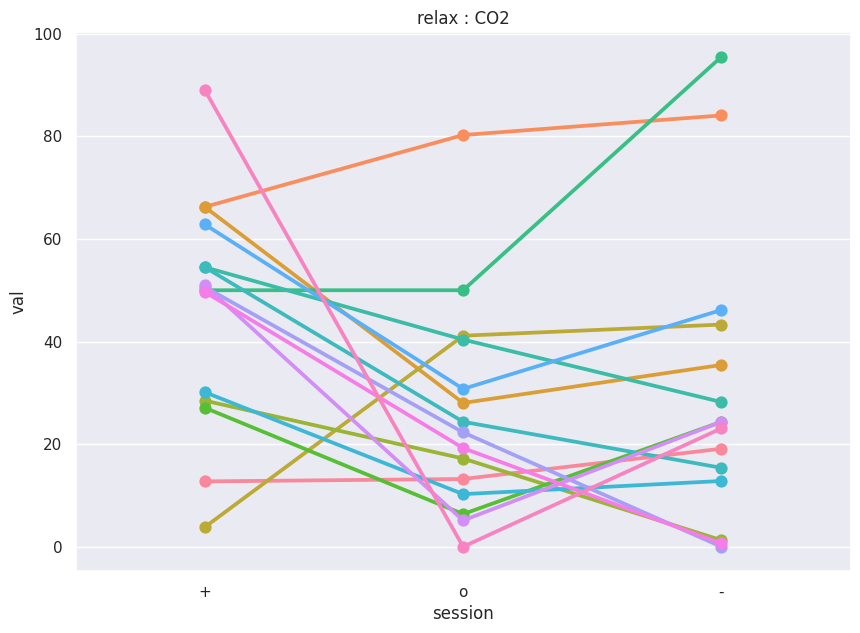

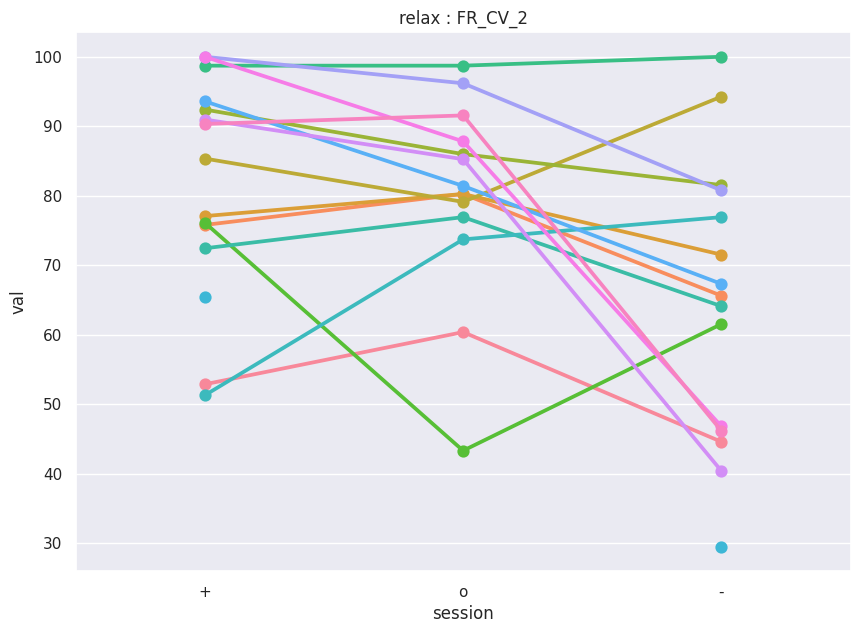

In [ ]:
for cond in conditions:

    fig, ax = plt.subplots()
    df_plot = df_relax.query(f"cond == '{cond}' and sujet in {sujet_best_sel}")
    sns.pointplot(data=df_plot, x="session", y="val", hue="sujet", ax=ax, order=['+', 'o', '-'])
    plt.legend([],[], frameon=False)
    plt.title(f'relax : {cond}')
    sns.set(rc={'figure.figsize':(10,7)})


## all metric

In [ ]:
data = {'sujet' : [], 'cond' : [], 'metric' : [], 'effect' : []}

for sujet in sujet_list:

    for cond in ['MECA', 'CO2']:

        for metric in ['A2', 'STAI', 'RELAX']:

            data['sujet'].append(sujet)
            data['cond'].append(cond)
            data['metric'].append(metric)

            effect = 0

            if metric == 'A2':

                if df_A2.query(f"sujet == '{sujet}' and cond == '{cond}' and session == '+'")['value'].values < df_A2.query(f"sujet == '{sujet}' and cond == '{cond}' and session == 'o'")['value'].values:

                    effect = 1

            if metric == 'STAI':

                if df_stai.query(f"sujet == '{sujet}' and cond == '{cond}' and session == '+'")['val'].values < df_stai.query(f"sujet == '{sujet}' and cond == '{cond}' and session == 'o'")['val'].values:

                    effect = 1

            if metric == 'RELAX':

                if df_relax.query(f"sujet == '{sujet}' and cond == '{cond}' and session == '+'")['val'].values > df_relax.query(f"sujet == '{sujet}' and cond == '{cond}' and session == 'o'")['val'].values:

                    effect = 1

            data['effect'].append(effect)

df_allmetric = pd.DataFrame(data)
df_allmetric
            
    

/tmp/ipykernel_2493849/2440155494.py:17: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if df_A2.query(f"sujet == '{sujet}' and cond == '{cond}' and session == '+'")['value'].values < df_A2.query(f"sujet == '{sujet}' and cond == '{cond}' and session == 'o'")['value'].values:
/tmp/ipykernel_2493849/2440155494.py:23: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if df_stai.query(f"sujet == '{sujet}' and cond == '{cond}' and session == '+'")['val'].values < df_stai.query(f"sujet == '{sujet}' and cond == '{cond}' and session == 'o'")['val'].values:
/tmp/ipykernel_2493849/2440155494.py:29: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an e

,sujet,cond,metric,effect
0,01PD,MECA,A2,0
1,01PD,MECA,STAI,0
2,01PD,MECA,RELAX,0
3,01PD,CO2,A2,0
4,01PD,CO2,STAI,0
...,...,...,...,...
169,33MA,MECA,STAI,0
170,33MA,MECA,RELAX,0
171,33MA,CO2,A2,0
172,33MA,CO2,STAI,0


In [ ]:
df_allmetric.groupby(['sujet', 'cond']).sum().reset_index().query("effect == 3")['sujet'].unique()

/tmp/ipykernel_2493849/254566163.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_allmetric.groupby(['sujet', 'cond']).sum().reset_index().query("effect == 3")['sujet'].unique()


array([], dtype=object)

In [ ]:
np.array([sujet_best_sel])

array([['BD12', 'CM32', 'FA11', 'GM16', 'HJ31', 'JR17', 'MA33', 'MN26',
        'PD01', 'SC29', 'TA09', 'TJ24', 'TM19', 'VN03', 'ZV21']],
      dtype='<U4')

## best sujet exploration

In [ ]:
question_list = df_odor_profile['question'].unique()
question_list

array(['appreciation', 'eveil', 'familiarite', 'intensite', 'evocation'],
      dtype=object)

In [ ]:
print(sujet_best_sel)
print(len(sujet_best_sel))
print(sujet_no_best_sel)
print(len(sujet_no_best_sel))

['BD12', 'CM32', 'FA11', 'GM16', 'HJ31', 'JR17', 'MA33', 'MN26', 'PD01', 'SC29', 'TA09', 'TJ24', 'TM19', 'VN03', 'ZV21']
15
['GB04', 'LV05', 'EF06', 'PB07', 'DM08', 'BH10', 'MD14', 'LG15', 'TY20', 'LF23', 'DF25', 'NT28', 'AR30']
13


In [ ]:
df_odor_profile = df_odor_profile.query(f"sujet not in ['PD01', 'VN03']")
sujet_best_sel_balanced = np.array([sujet for sujet in sujet_best_sel if sujet not in ['PD01', 'VN03']])
sujet_no_best_sel_balanced = sujet_no_best_sel
sujet_list_balanced = np.array([sujet for sujet in sujet_list_erp_rev if sujet not in ['PD01', 'VN03']])

In [ ]:
sujet_sel_mask = []

for row_i in range(df_odor_profile.shape[0]):

    if df_odor_profile['sujet'].iloc[row_i] in sujet_best_sel_balanced:

        sujet_sel_mask.append('YES')

    else:

        sujet_sel_mask.append('NO')

df_odor_profile['select_best'] = sujet_sel_mask
df_odor_profile

,sujet,question,odor,raw_val,scale,value,select_best
30,MJ02,appreciation,11,3.0,12.5,24.0,NO
31,MJ02,appreciation,4,5.0,12.5,40.0,NO
32,MJ02,appreciation,13,5.4,12.5,43.2,NO
33,MJ02,appreciation,12,5.7,12.5,45.6,NO
34,MJ02,appreciation,7,8.9,12.5,71.2,NO
...,...,...,...,...,...,...,...
985,MA33,evocation,13,0.0,12.5,0.0,YES
986,MA33,evocation,6,10.2,12.5,81.6,YES
987,MA33,evocation,12,11.3,12.5,90.4,YES
988,MA33,evocation,7,12.5,12.5,100.0,YES


In [ ]:
odor_choice = {}

for sujet in df_odor_choice['sujet'].unique():

    odor_choice[sujet] = df_odor_choice.query(f"sujet == '{sujet}'")['odor'].values.tolist()

odor_choice

{'PD01': [6, 11],
 'MJ02': [6, 11],
 'VN03': [13, 11],
 'GB04': [9, 11],
 'LV05': [10, 11],
 'EF06': [2, 11],
 'PB07': [3, 11],
 'DM08': [7, 11],
 'TA09': [10, 12],
 'BH10': [2, 11],
 'FA11': [6, 12],
 'BD12': [7, 13],
 'FP13': [3, 12],
 'MD14': [7, 11],
 'LG15': [2, 12],
 'GM16': [6, 11],
 'JR17': [9, 13],
 'SE18': [9, 11],
 'TM19': [7, 1],
 'TY20': [6, 12],
 'ZV21': [4, 11],
 'DI22': [8, 12],
 'LF23': [9, 11],
 'TJ24': [9, 11],
 'DF25': [7, 11],
 'MN26': [6, 12],
 'BD27': [6, 11],
 'NT28': [4, 12],
 'SC29': [4, 11],
 'AR30': [10, 11],
 'HJ31': [8, 11],
 'CM32': [9, 11],
 'MA33': [6, 11]}

In [ ]:
for sujet_i, sujet in enumerate(sujet_list_balanced):

    if sujet_i == 0:

        df_odor_profile_filtered = df_odor_profile.query(f"sujet == '{sujet}' and odor in {odor_choice[sujet]}")

    else:

        df_odor_profile_filtered = pd.concat((df_odor_profile_filtered, df_odor_profile.query(f"sujet == '{sujet}' and odor in {odor_choice[sujet]}")), axis=0)

In [ ]:
for row_i in range(df_odor_profile_filtered.shape[0]):

    sujet_i = df_odor_profile_filtered['sujet'].iloc[row_i]

    if df_odor_profile_filtered['odor'].iloc[row_i] == odor_choice[sujet_i][0]:

        odor_quality = '+'

    elif df_odor_profile_filtered['odor'].iloc[row_i] == odor_choice[sujet_i][1]:

        odor_quality = '-'

    df_odor_profile_filtered['odor'].iloc[row_i] = odor_quality

/tmp/ipykernel_2493849/2745226153.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_odor_profile_filtered['odor'].iloc[row_i] = odor_quality


In [ ]:
df_odor_profile_filtered

,sujet,question,odor,raw_val,scale,value,select_best
90,GB04,appreciation,-,1.5,12.5,12.0,NO
94,GB04,appreciation,+,9.6,12.5,76.8,NO
96,GB04,eveil,-,0.4,12.5,3.2,NO
101,GB04,eveil,+,4.2,12.5,33.6,NO
102,GB04,familiarite,-,0.4,12.5,3.2,NO
...,...,...,...,...,...,...,...
976,MA33,familiarite,+,12.5,12.5,100.0,YES
978,MA33,intensite,+,5.4,12.5,43.2,YES
983,MA33,intensite,-,12.5,12.5,100.0,YES
984,MA33,evocation,-,0.0,12.5,0.0,YES


In [ ]:
data = {'question' : [], 'odor' : [], 'pval' : []}

for question in df_odor_profile_filtered['question'].unique():
    
    for odor in ['+', '-']:

        df_stats = df_odor_profile_filtered.query(f"question == '{question}' and odor == '{odor}'")
        pval = get_stats_df(df=df_stats, predictor='select_best', outcome='value', subject='sujet', design='within')
        data['question'].append(question)
        data['pval'].append(pval)
        data['odor'].append(odor)

df_odor_profile_signi = pd.DataFrame(data)
df_odor_profile_signi

/home/jules.granget/myenvs/py39c/lib64/python3.9/site-packages/scipy/stats/_morestats.py:3337: UserWarning: Exact p-value calculation does not work if there are zeros. Switching to normal approximation.
  warnings.warn("Exact p-value calculation does not work if there are "
/home/jules.granget/myenvs/py39c/lib64/python3.9/site-packages/scipy/stats/_morestats.py:3337: UserWarning: Exact p-value calculation does not work if there are zeros. Switching to normal approximation.
  warnings.warn("Exact p-value calculation does not work if there are "
/home/jules.granget/myenvs/py39c/lib64/python3.9/site-packages/scipy/stats/_morestats.py:3337: UserWarning: Exact p-value calculation does not work if there are zeros. Switching to normal approximation.
  warnings.warn("Exact p-value calculation does not work if there are "


,question,odor,pval
0,appreciation,+,0.2163
1,appreciation,-,0.4496
2,eveil,+,0.7966
3,eveil,-,0.6101
4,familiarite,+,0.3396
5,familiarite,-,0.3396
6,intensite,+,0.1117
7,intensite,-,0.1677
8,evocation,+,0.4143
9,evocation,-,0.6103


### odor profile

In [ ]:
df_odor_profile_filtered = df_odor_profile_filtered.query(f"sujet in {sujet_list_balanced.tolist()}")

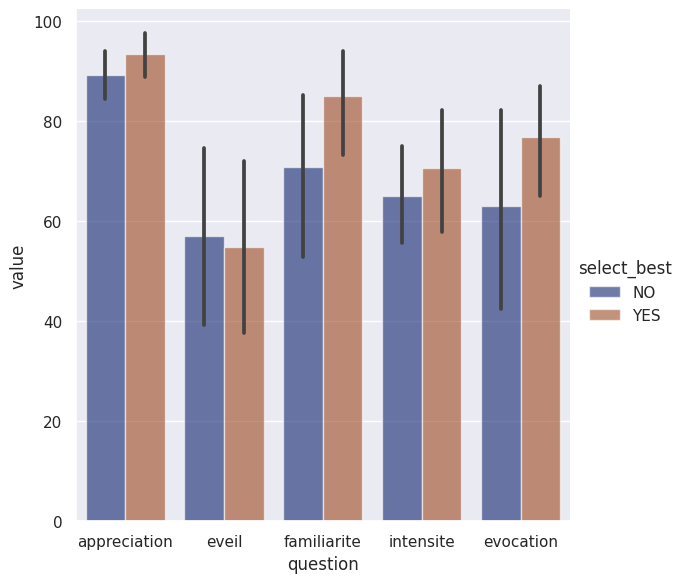

In [ ]:
sns.catplot(data=df_odor_profile_filtered.query("odor == '+'"), kind="bar", x="question", y="value", hue="select_best", palette="dark", alpha=.6, height=6)

/crnldata/cmo/multisite/DATA_MANIP/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:382: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predictor).std()[outcome].reset_index()[outcome].rename('sd')], axis = 1).round(2).set_index(predictor)
/crnldata/cmo/multisite/DATA_MANIP/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:382: FutureWarning: The default value of numeric_only in DataFrameGroupBy.std is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predictor).std()[outcome].reset_index()[outcome].rena

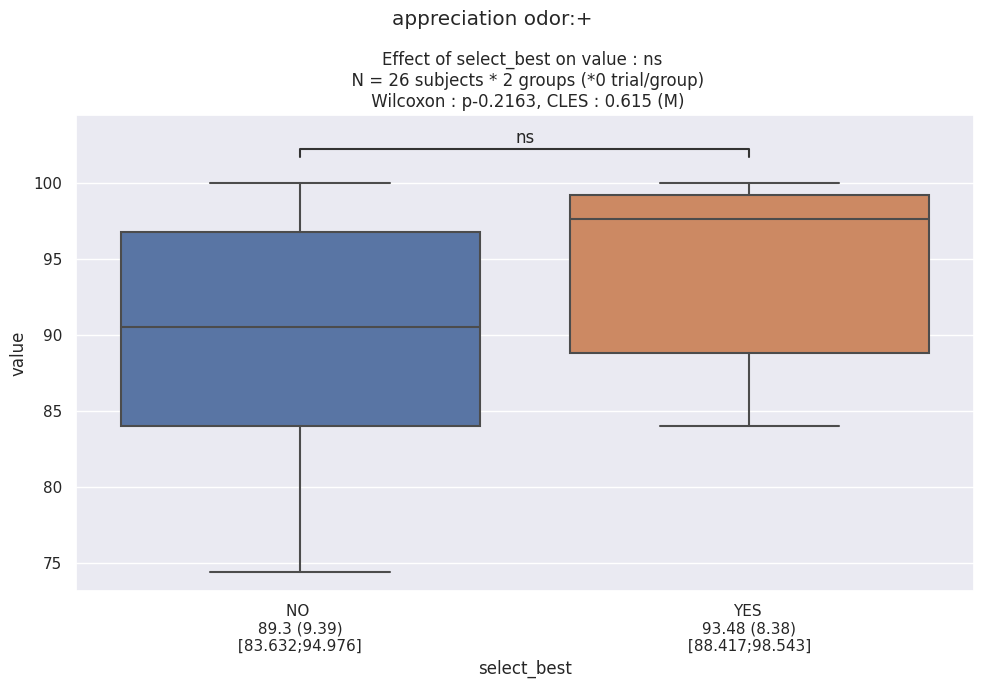

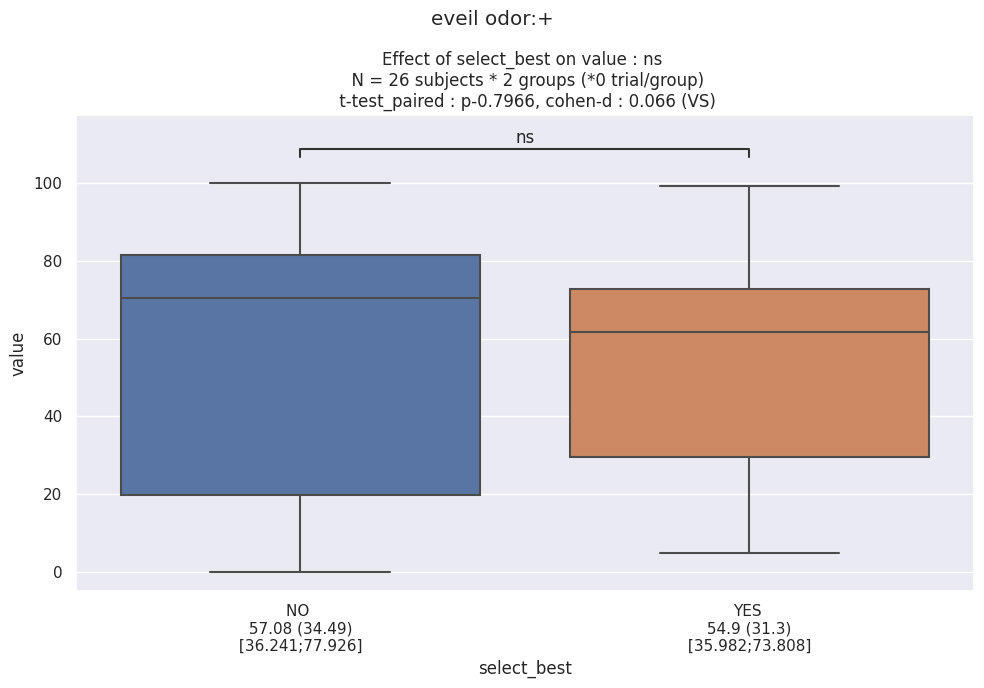

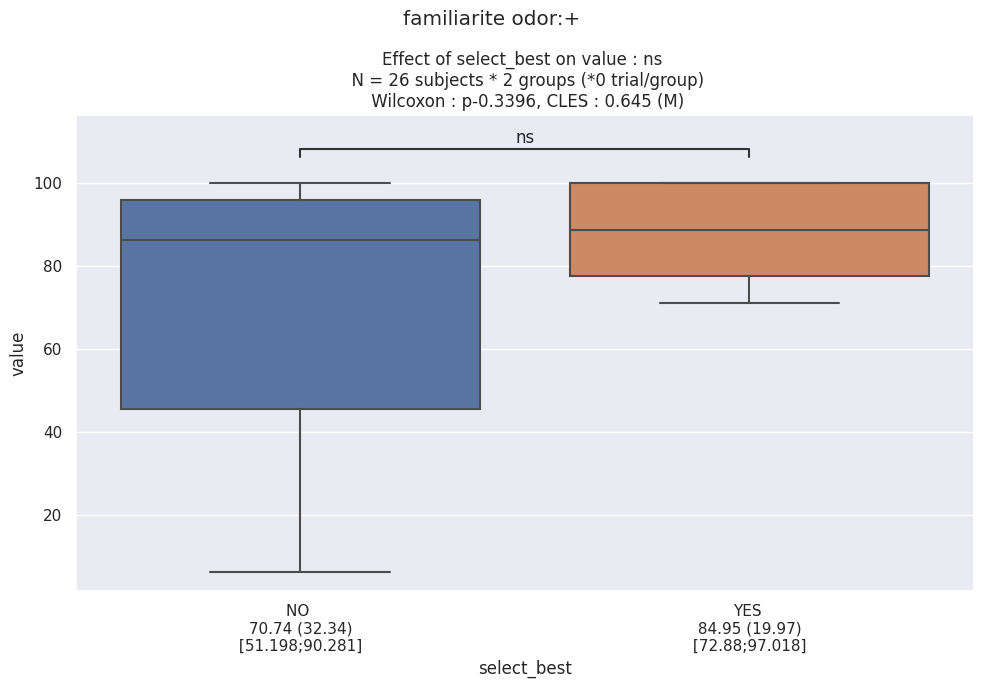

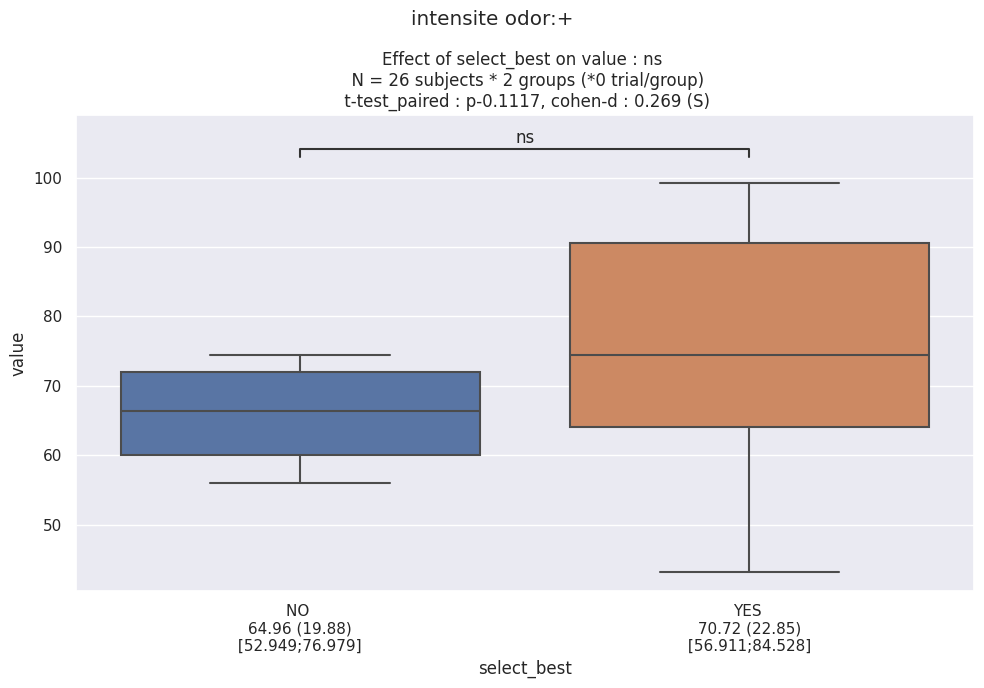

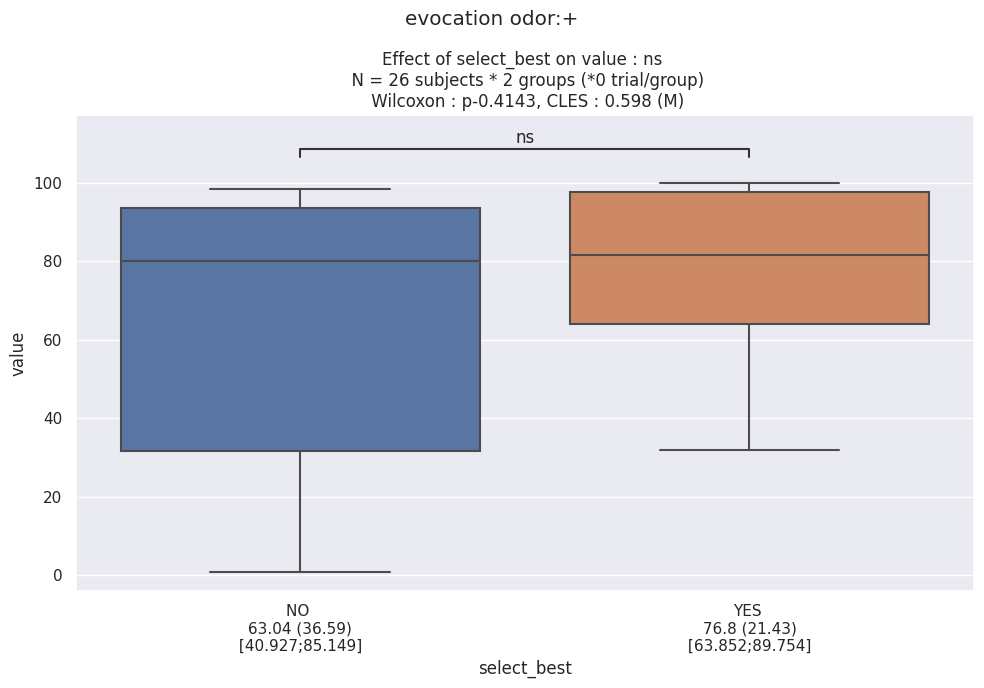

In [ ]:
predictor = 'select_best' 
outcome = 'value'
for question in question_list:
    df_stats = df_odor_profile_filtered.query(f"question == '{question}' and odor == '+'")
    fig, ax = plt.subplots()
    ax = auto_stats(df_stats, predictor, outcome, ax=ax, subject='sujet', design='within', mode='box', transform=False, verbose=True, order=None)
    plt.suptitle(f"{question} odor:+")
    plt.tight_layout()

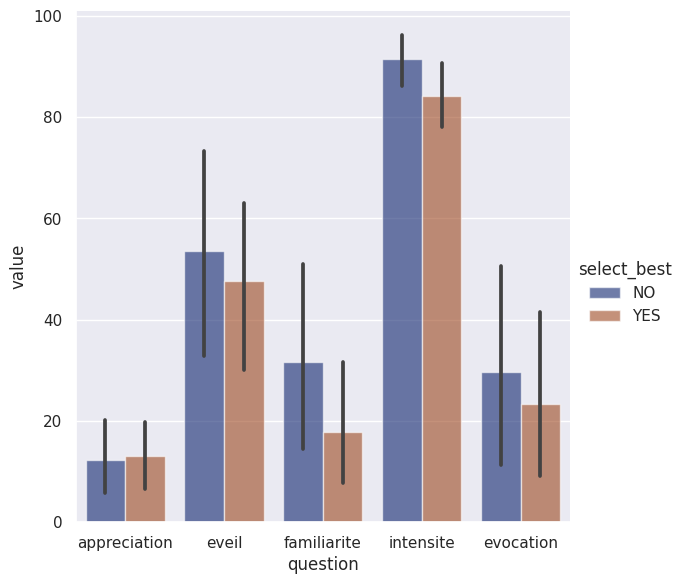

In [ ]:
sns.catplot(data=df_odor_profile_filtered.query("odor == '-'"), kind="bar", x="question", y="value", hue="select_best", palette="dark", alpha=.6, height=6)

/home/jules.granget/myenvs/py39c/lib64/python3.9/site-packages/scipy/stats/_morestats.py:3337: UserWarning: Exact p-value calculation does not work if there are zeros. Switching to normal approximation.
  warnings.warn("Exact p-value calculation does not work if there are "
/crnldata/cmo/multisite/DATA_MANIP/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:382: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predictor).std()[outcome].reset_index()[outcome].rename('sd')], axis = 1).round(2).set_index(predictor)
/crnldata/cmo/multisite/DATA_MANIP/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:382: FutureWarning: The default value of numeric_only in DataFrameGroupBy.std is deprecated. In a future vers

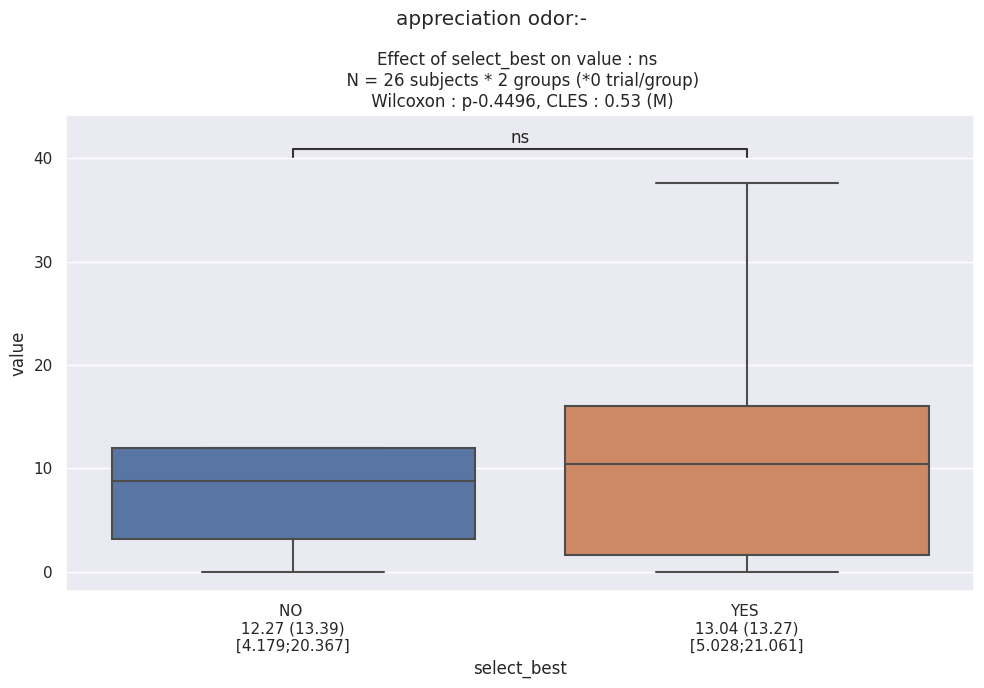

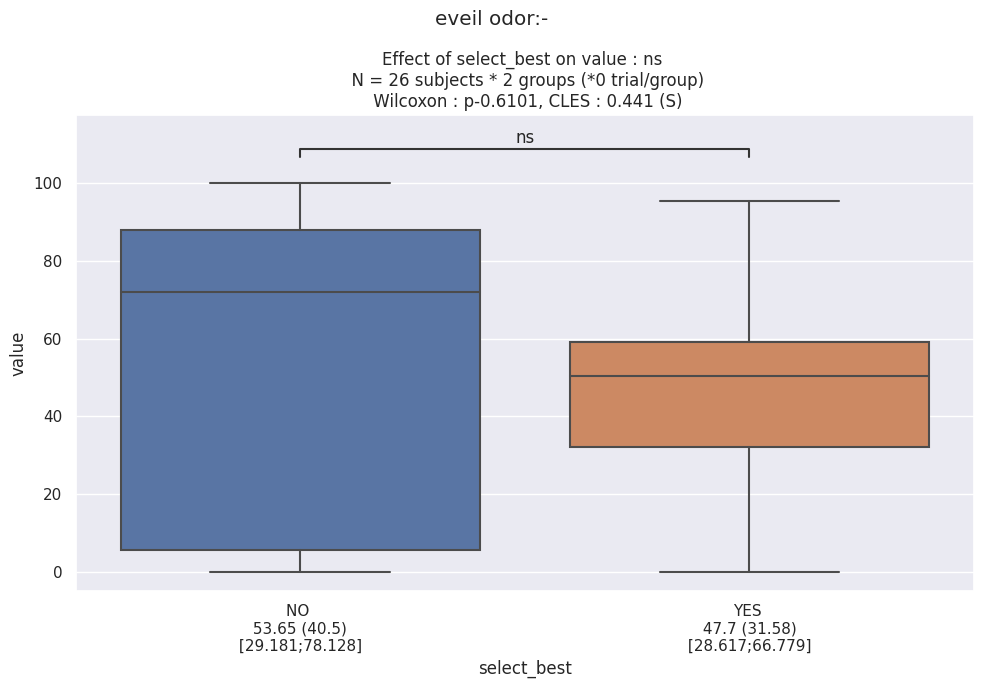

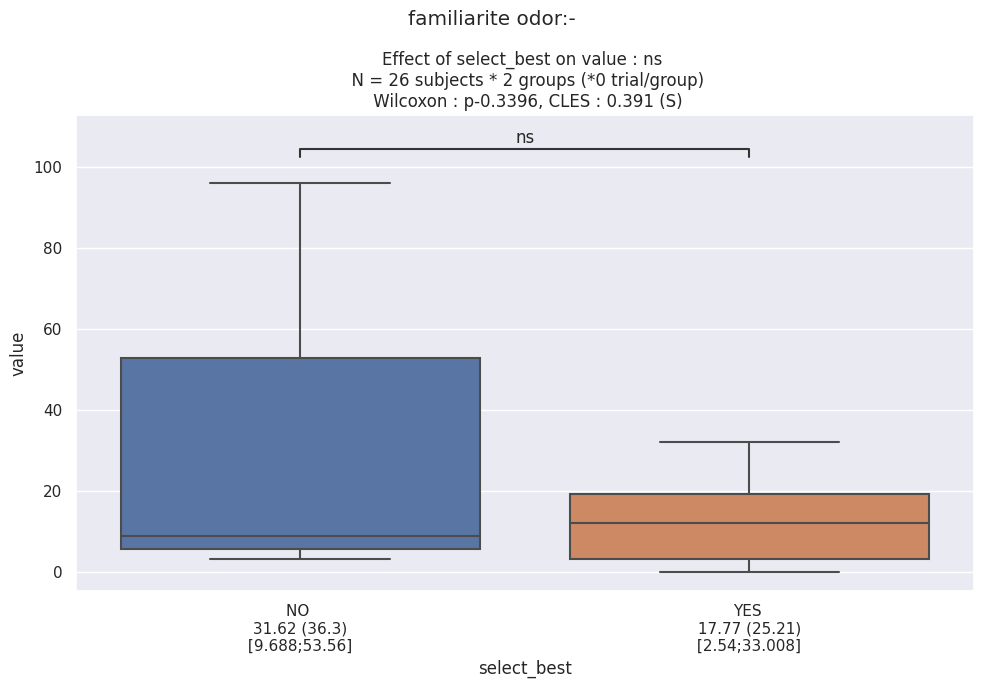

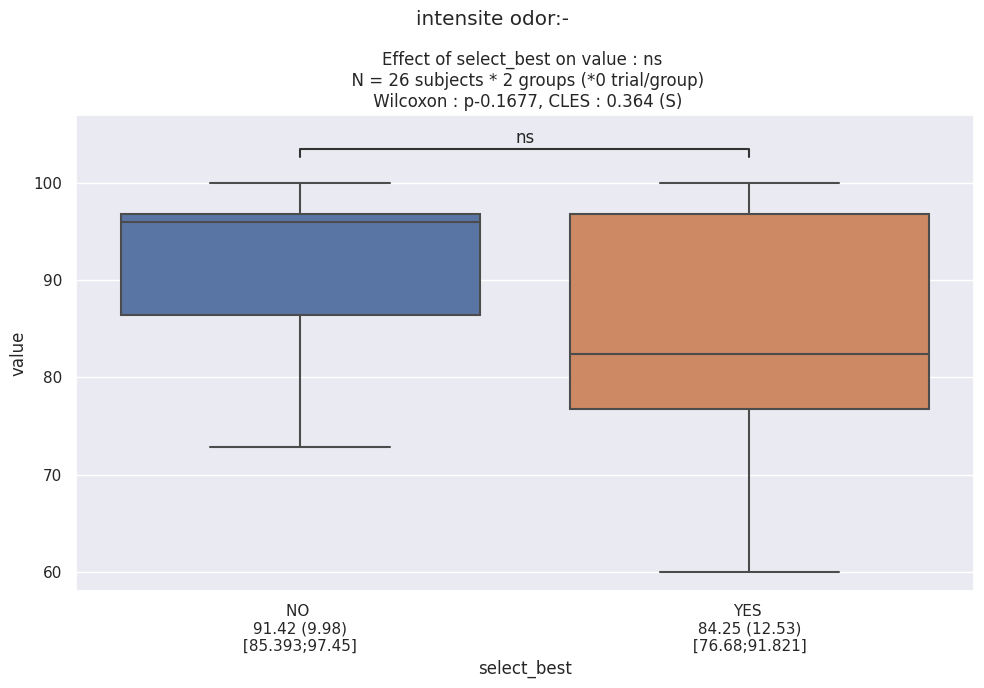

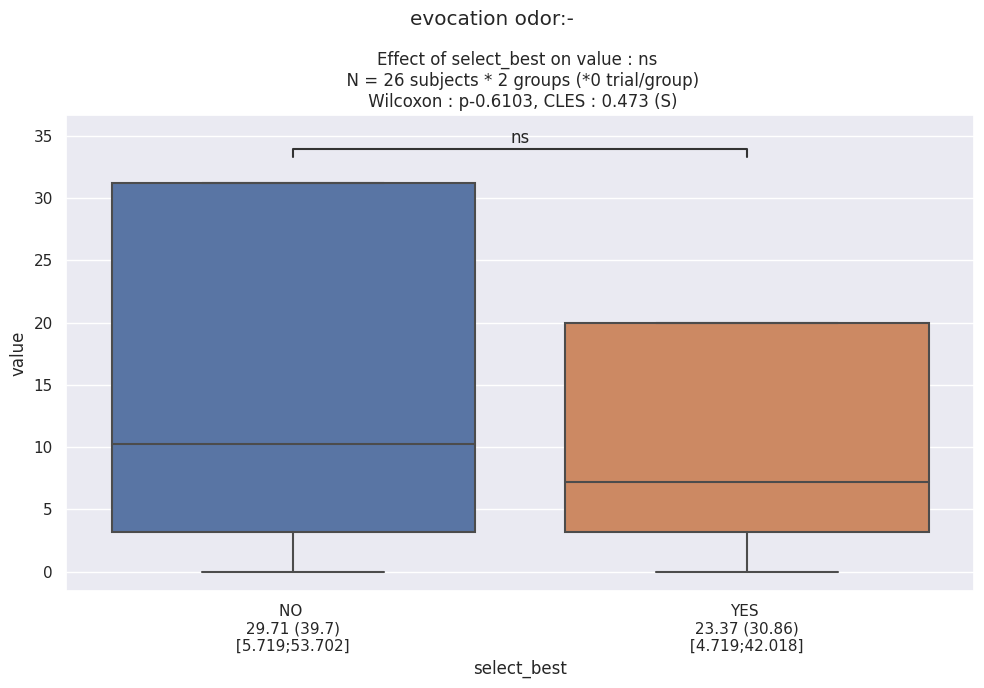

In [ ]:
predictor = 'select_best' 
outcome = 'value'
for question in question_list:
    df_stats = df_odor_profile_filtered.query(f"question == '{question}' and odor == '-'")
    fig, ax = plt.subplots()
    ax = auto_stats(df_stats, predictor, outcome, ax=ax, subject='sujet', design='within', mode='box', transform=False, verbose=True, order=None)
    plt.suptitle(f"{question} odor:-")
    plt.tight_layout()

### odor diff

In [ ]:
df_odor_profile_filtered

,sujet,question,odor,raw_val,scale,value,select_best
30,MJ02,appreciation,11,3.0,12.5,24.0,NO
35,MJ02,appreciation,6,10.0,12.5,80.0,NO
36,MJ02,eveil,6,5.6,12.5,44.8,NO
41,MJ02,eveil,11,11.6,12.5,92.8,NO
44,MJ02,familiarite,11,5.5,12.5,44.0,NO
...,...,...,...,...,...,...,...
976,MA33,familiarite,6,12.5,12.5,100.0,YES
978,MA33,intensite,6,5.4,12.5,43.2,YES
983,MA33,intensite,11,12.5,12.5,100.0,YES
984,MA33,evocation,11,0.0,12.5,0.0,YES


In [ ]:
data = {'sujet' : [], 'question' : [], 'value' : [], 'select_best' : []}

for sujet in sujet_list_balanced:

    for question in question_list:
    
        data['sujet'].append(sujet)
        data['question'].append(question)
        data['value'].append(df_odor_profile_filtered.query(f"odor == '+' and sujet == '{sujet}' and question == '{question}'")['value'].values[0] - df_odor_profile_filtered.query(f"odor == '-' and sujet == '{sujet}' and question == '{question}'")['value'].values[0])
        
        if sujet in sujet_best_sel:

            data['select_best'].append(True)

        else:

            data['select_best'].append(False)

df_diff_question = pd.DataFrame(data)
df_diff_question

,sujet,question,value,select_best
0,GB04,appreciation,64.8,False
1,GB04,eveil,30.4,False
2,GB04,familiarite,28.8,False
3,GB04,intensite,-14.4,False
4,GB04,evocation,31.2,False
...,...,...,...,...
125,MA33,appreciation,100.0,True
126,MA33,eveil,12.0,True
127,MA33,familiarite,100.0,True
128,MA33,intensite,-56.8,True


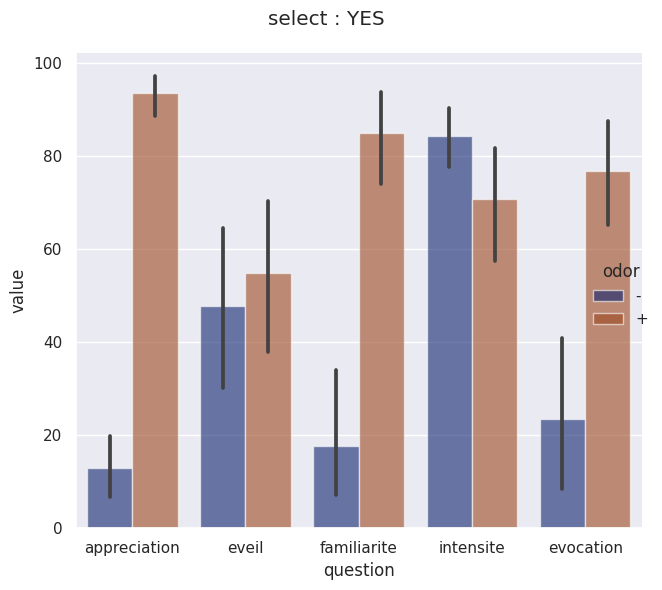

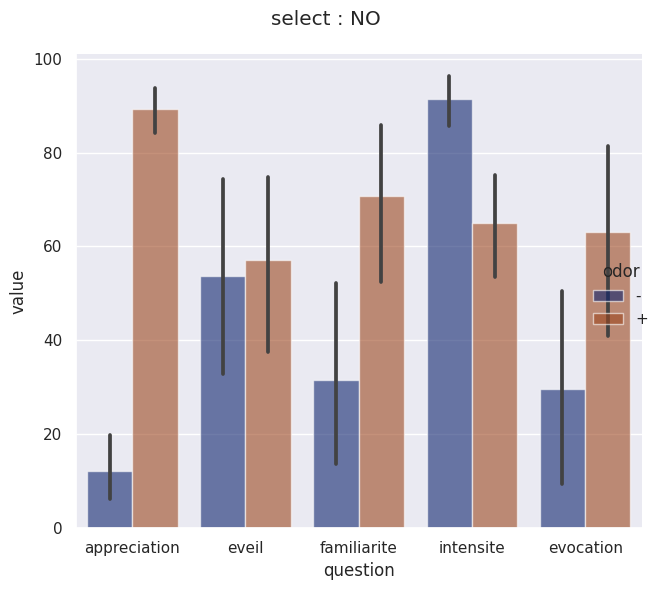

In [ ]:
sns.catplot(data=df_odor_profile_filtered.query("select_best == 'YES'"), kind="bar", x="question", y="value", hue="odor", palette="dark", alpha=.6, height=6)
plt.suptitle('select : YES')
plt.tight_layout()
plt.show()

sns.catplot(data=df_odor_profile_filtered.query("select_best == 'NO'"), kind="bar", x="question", y="value", hue="odor", palette="dark", alpha=.6, height=6)
plt.suptitle('select : NO')
plt.tight_layout()
plt.show()

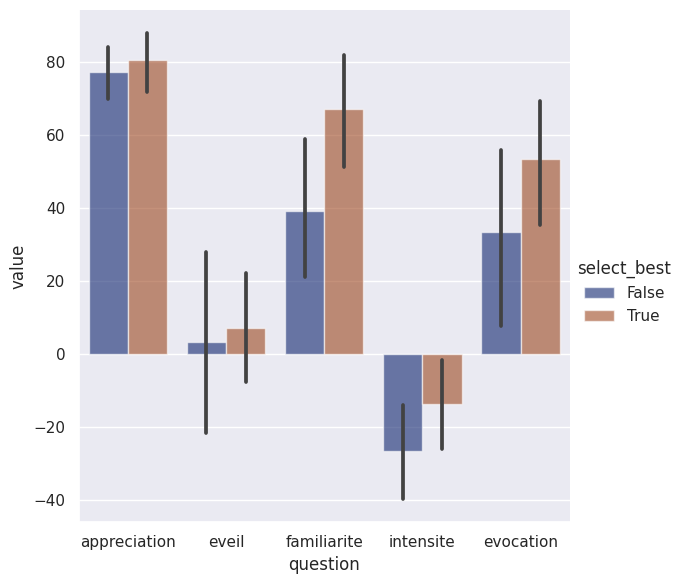

In [ ]:
sns.catplot(data=df_diff_question, kind="bar", x="question", y="value", hue="select_best", palette="dark", alpha=.6, height=6)

/crnldata/cmo/multisite/DATA_MANIP/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:382: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predictor).std()[outcome].reset_index()[outcome].rename('sd')], axis = 1).round(2).set_index(predictor)
/crnldata/cmo/multisite/DATA_MANIP/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:382: FutureWarning: The default value of numeric_only in DataFrameGroupBy.std is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predictor).std()[outcome].reset_index()[outcome].rena

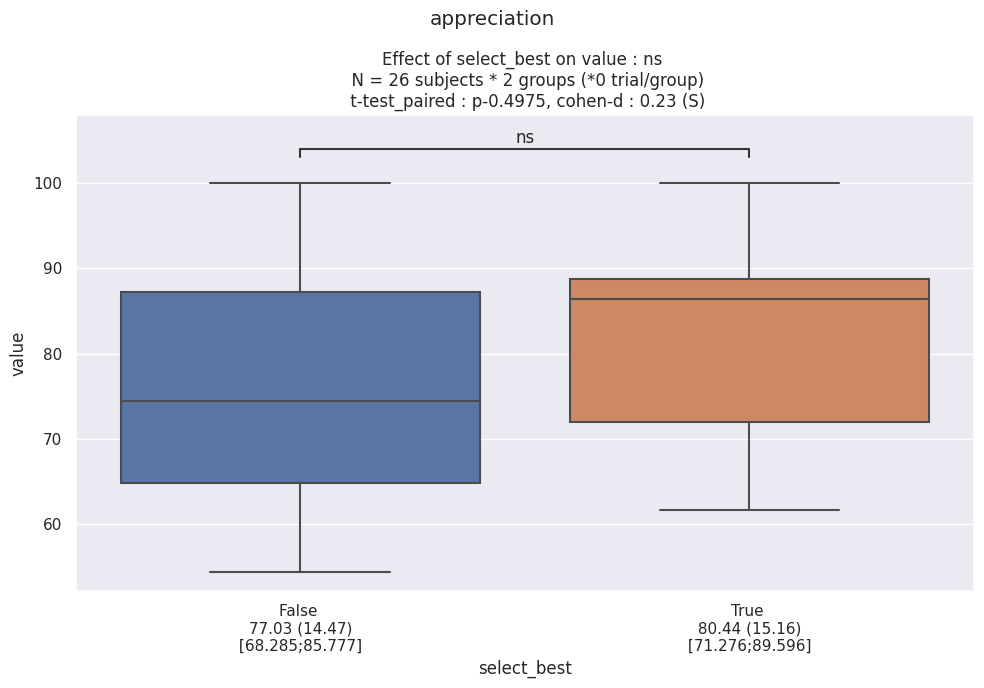

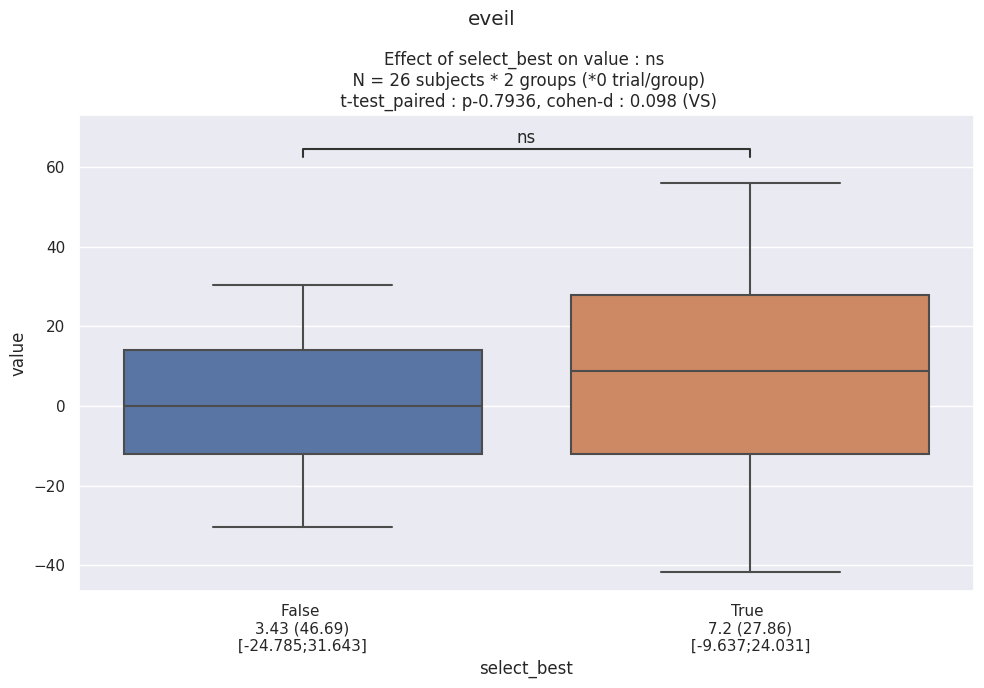

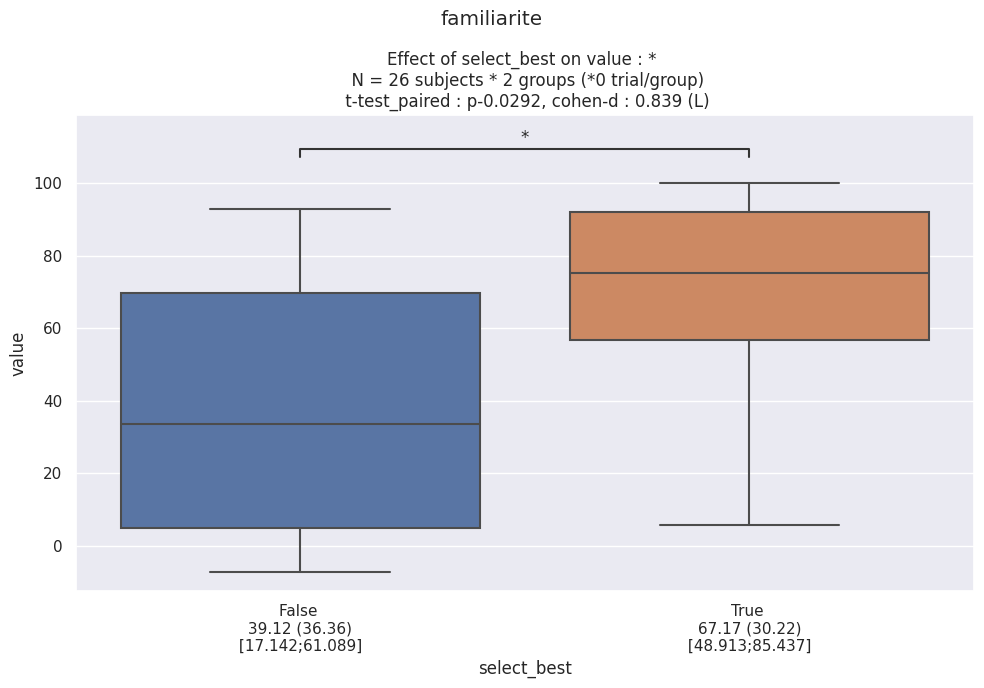

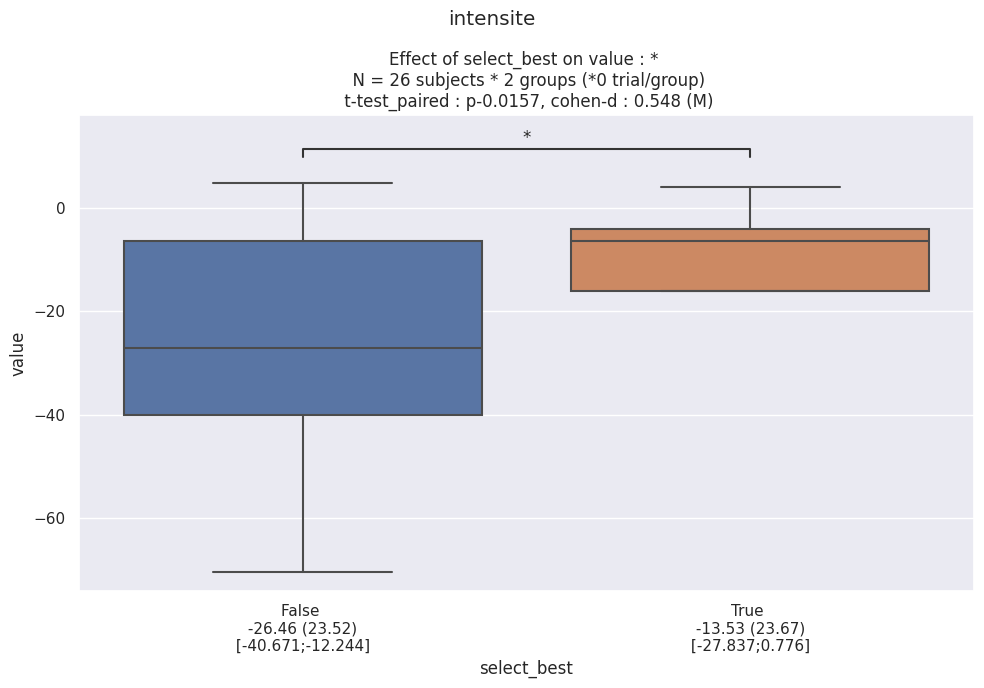

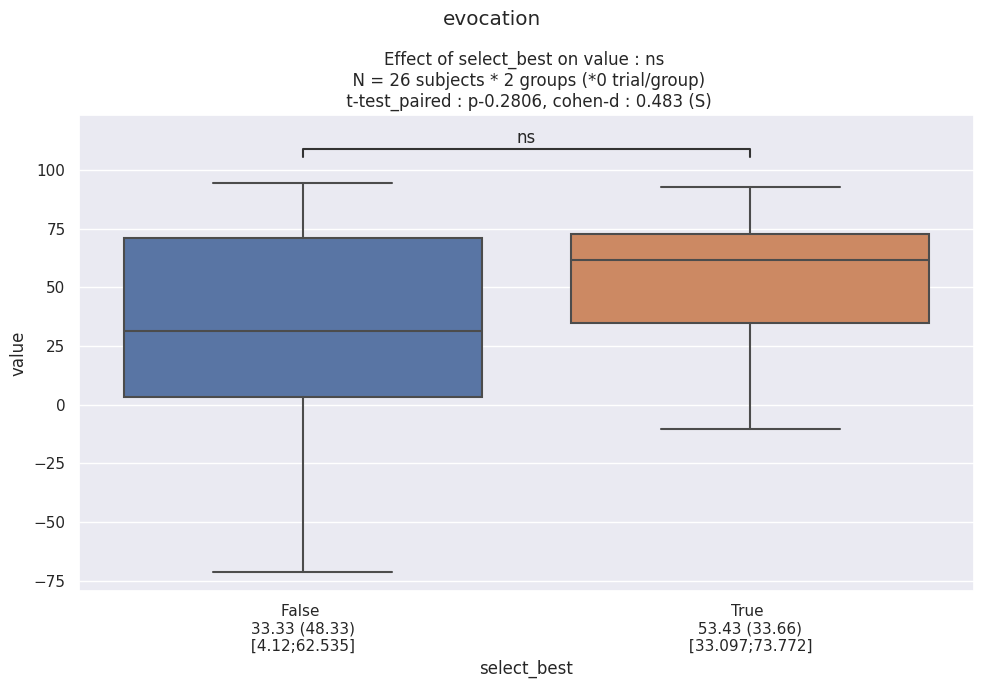

In [ ]:
predictor = 'select_best' 
outcome = 'value'
for question in question_list:
    df_stats = df_diff_question.query(f"question == '{question}'")
    fig, ax = plt.subplots()
    ax = auto_stats(df_stats, predictor, outcome, ax=ax, subject='sujet', design='within', mode='box', transform=False, verbose=True, order=None)
    plt.suptitle(f"{question}")
    plt.tight_layout()

In [ ]:
df_q

,sujet,session,cond,question,raw_val,scale,val,select_best
0,PD01,o,FR_CV_1,1,6.9,15.9,43.396226,YES
1,PD01,o,FR_CV_1,2,9.8,15.9,61.635220,YES
2,PD01,o,FR_CV_1,3,9.3,15.9,58.490566,YES
3,PD01,o,FR_CV_1,4,6.2,15.9,38.993711,YES
4,PD01,o,FR_CV_1,5,7.9,15.9,49.685535,YES
...,...,...,...,...,...,...,...,...
3163,MA33,-,FR_CV_2,4,7.5,15.6,48.076923,YES
3164,MA33,-,FR_CV_2,5,0,15.6,0.000000,YES
3165,MA33,-,FR_CV_2,6,2.7,15.6,17.307692,YES
3166,MA33,-,FR_CV_2,7,7.2,15.6,46.153846,YES


In [ ]:
df_q.query(f"question == 8 and session in ['+', '-']")

sel_vec = []
for row_i in range(df_q.shape[0]):
    if df_q['sujet'][row_i] in sujet_best_sel:
        sel_vec.append('YES')
    else:
        sel_vec.append('NO')

df_q['select_best'] = sel_vec
df_intensity = df_q[['sujet', 'session', 'question', 'cond', 'val', 'select_best']].query(f"question == 8 and sujet in {sujet_list_balanced.tolist()}")
df_intensity

,sujet,session,question,cond,val,select_best
295,GB04,o,8,FR_CV_1,0.636943,NO
303,GB04,o,8,MECA,0.636943,NO
311,GB04,o,8,CO2,0.000000,NO
319,GB04,o,8,FR_CV_2,1.273885,NO
327,GB04,+,8,FR_CV_1,59.119497,NO
...,...,...,...,...,...,...
3135,MA33,+,8,FR_CV_2,0.000000,YES
3143,MA33,-,8,FR_CV_1,60.000000,YES
3151,MA33,-,8,MECA,70.967742,YES
3159,MA33,-,8,CO2,62.820513,YES


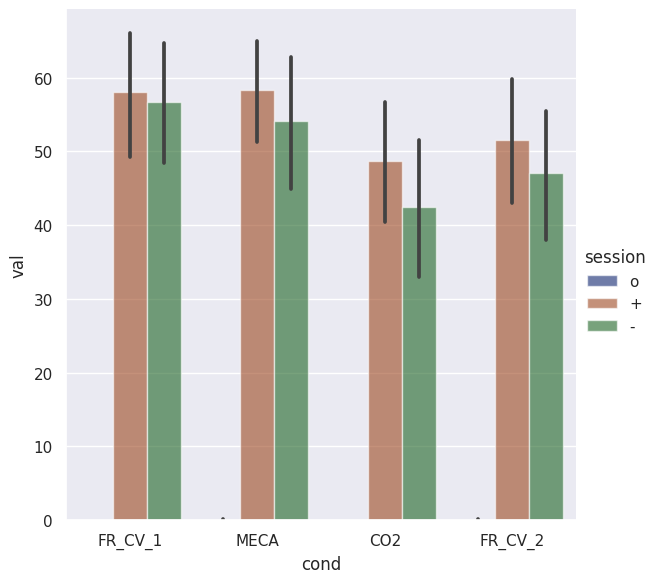

In [ ]:
sns.catplot(data=df_intensity, kind="bar", x="cond", y="val", hue="session", palette="dark", alpha=.6, height=6)

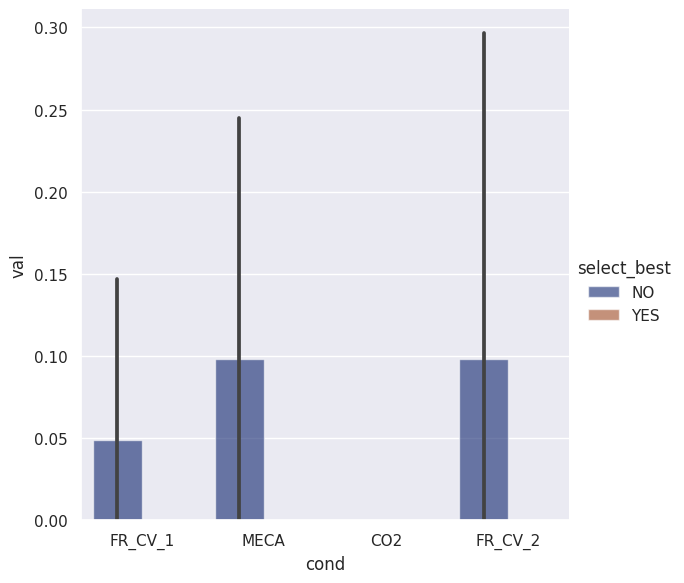

In [ ]:
df_plot = df_intensity.query(f"session == 'o'")
sns.catplot(data=df_plot, kind="bar", x="cond", y="val", hue="select_best", palette="dark", alpha=.6, height=6)

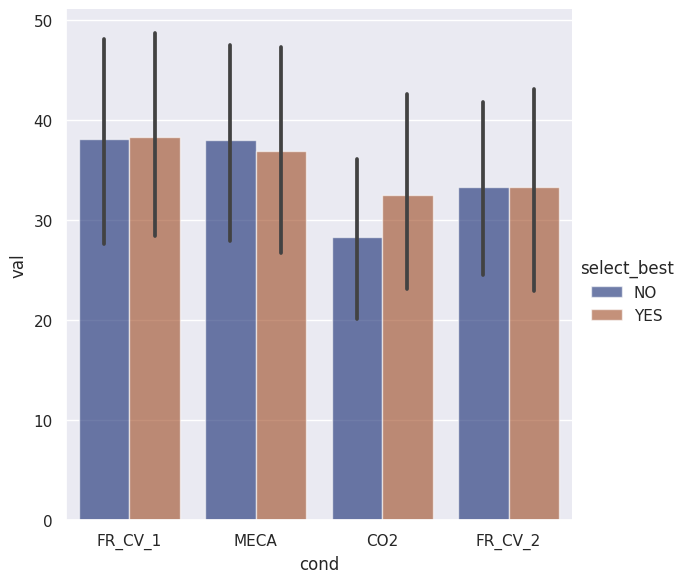

In [ ]:
sns.catplot(data=df_intensity, kind="bar", x="cond", y="val", hue="select_best", palette="dark", alpha=.6, height=6)

/crnldata/cmo/multisite/DATA_MANIP/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:382: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predictor).std()[outcome].reset_index()[outcome].rename('sd')], axis = 1).round(2).set_index(predictor)
/crnldata/cmo/multisite/DATA_MANIP/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:382: FutureWarning: The default value of numeric_only in DataFrameGroupBy.std is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predictor).std()[outcome].reset_index()[outcome].rena

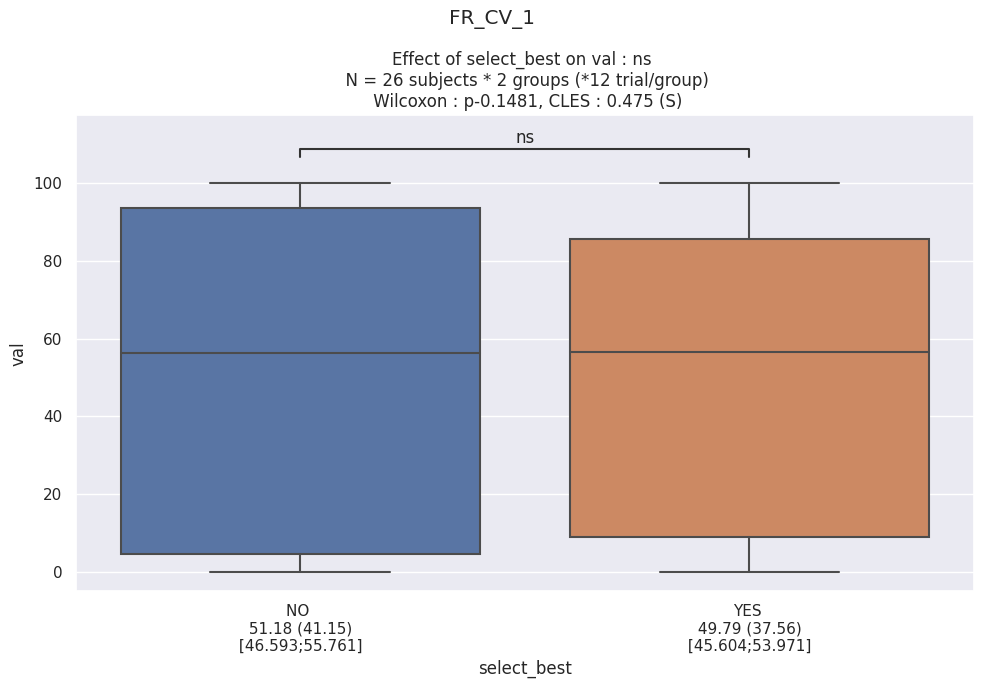

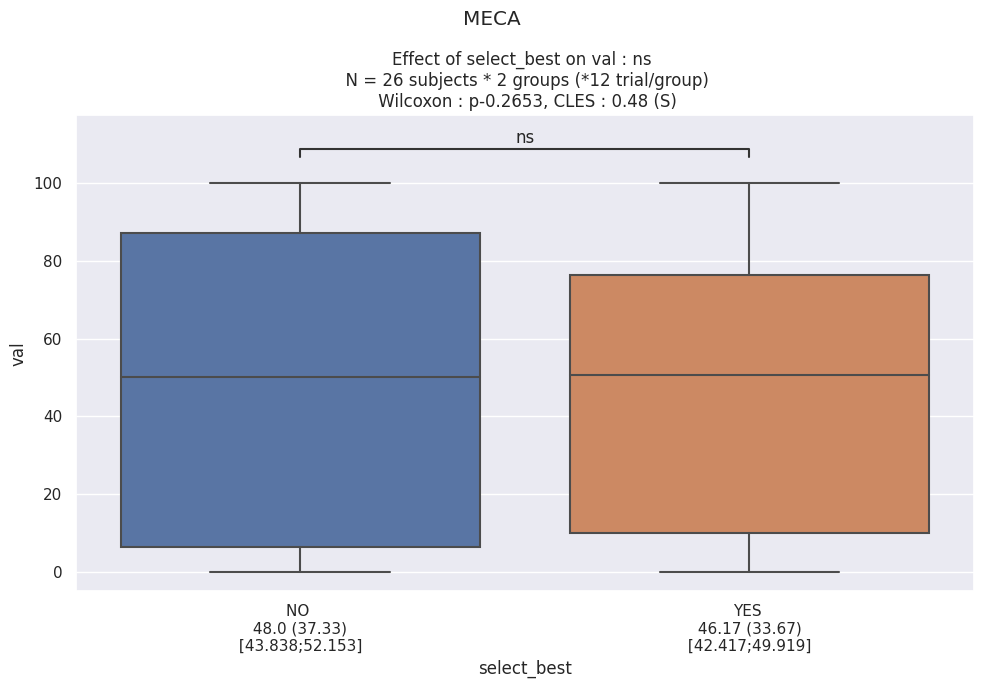

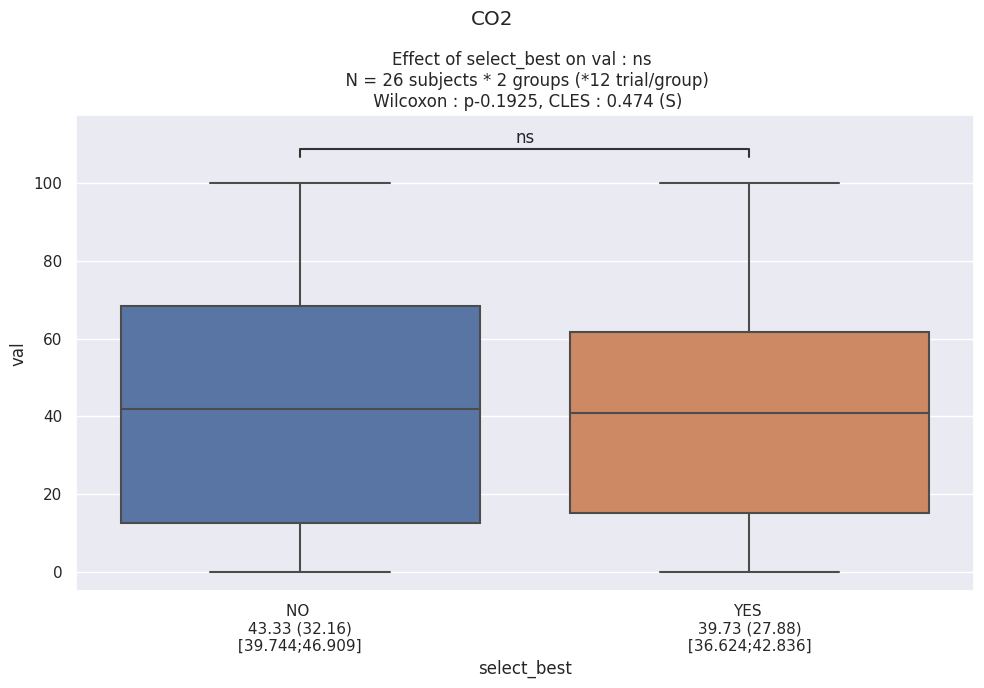

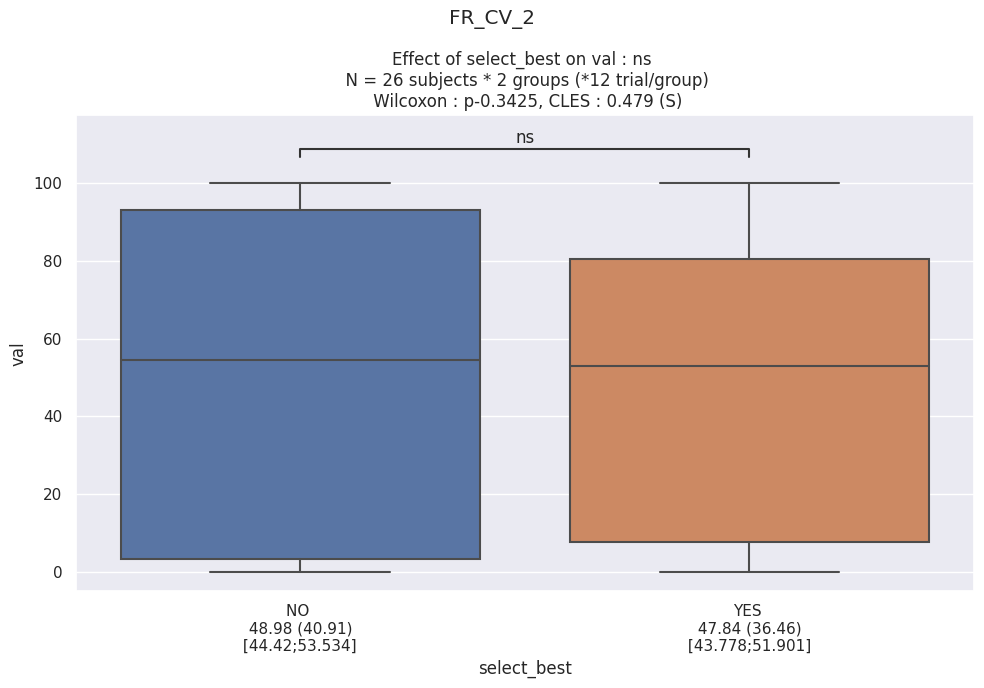

In [ ]:
predictor = 'select_best' 
outcome = 'val'
for cond in conditions:
    df_stats = df_intensity.query(f"cond == '{cond}'")
    fig, ax = plt.subplots()
    ax = auto_stats(df_stats, predictor, outcome, ax=ax, subject='sujet', design='within', mode='box', transform=False, verbose=True, order=None)
    plt.suptitle(f"{cond}")
    plt.tight_layout()

In [ ]:
df_odor_profile_filtered

,sujet,question,odor,raw_val,scale,value,select_best
30,MJ02,appreciation,11,3.0,12.5,24.0,NO
35,MJ02,appreciation,6,10.0,12.5,80.0,NO
36,MJ02,eveil,6,5.6,12.5,44.8,NO
41,MJ02,eveil,11,11.6,12.5,92.8,NO
44,MJ02,familiarite,11,5.5,12.5,44.0,NO
...,...,...,...,...,...,...,...
976,MA33,familiarite,6,12.5,12.5,100.0,YES
978,MA33,intensite,6,5.4,12.5,43.2,YES
983,MA33,intensite,11,12.5,12.5,100.0,YES
984,MA33,evocation,11,0.0,12.5,0.0,YES


In [ ]:
data = {'sujet' : [], 'question' : [], 'value' : [], 'select_best' : []}

for sujet in df_odor_profile_filtered['sujet'].unique():

    for question in df_odor_profile_filtered['question'].unique():

        data['sujet'].append(sujet)
        data['question'].append(question)
        data['value'].append(df_odor_profile_filtered.query(f"sujet == '{sujet}' and question == '{question}' and odor == '+'")['value'].values[0] - df_odor_profile_filtered.query(f"sujet == '{sujet}' and question == '{question}' and odor == '-'")['value'].values[0])
        data['select_best'].append(df_odor_profile_filtered.query(f"sujet == '{sujet}' and question == '{question}' and odor == '+'")['select_best'].values[0])

df_diff_odor_profile = pd.DataFrame(data)
df_diff_odor_profile

,sujet,question,value,select_best
0,GB04,appreciation,64.8,NO
1,GB04,eveil,30.4,NO
2,GB04,familiarite,28.8,NO
3,GB04,intensite,-14.4,NO
4,GB04,evocation,31.2,NO
...,...,...,...,...
125,MA33,appreciation,100.0,YES
126,MA33,eveil,12.0,YES
127,MA33,familiarite,100.0,YES
128,MA33,intensite,-56.8,YES


In [ ]:
df_odor_profile_filtered

,sujet,question,odor,raw_val,scale,value,select_best
90,GB04,appreciation,-,1.5,12.5,12.0,NO
94,GB04,appreciation,+,9.6,12.5,76.8,NO
96,GB04,eveil,-,0.4,12.5,3.2,NO
101,GB04,eveil,+,4.2,12.5,33.6,NO
102,GB04,familiarite,-,0.4,12.5,3.2,NO
...,...,...,...,...,...,...,...
976,MA33,familiarite,+,12.5,12.5,100.0,YES
978,MA33,intensite,+,5.4,12.5,43.2,YES
983,MA33,intensite,-,12.5,12.5,100.0,YES
984,MA33,evocation,-,0.0,12.5,0.0,YES


<AxesSubplot: xlabel='odor', ylabel='value'>

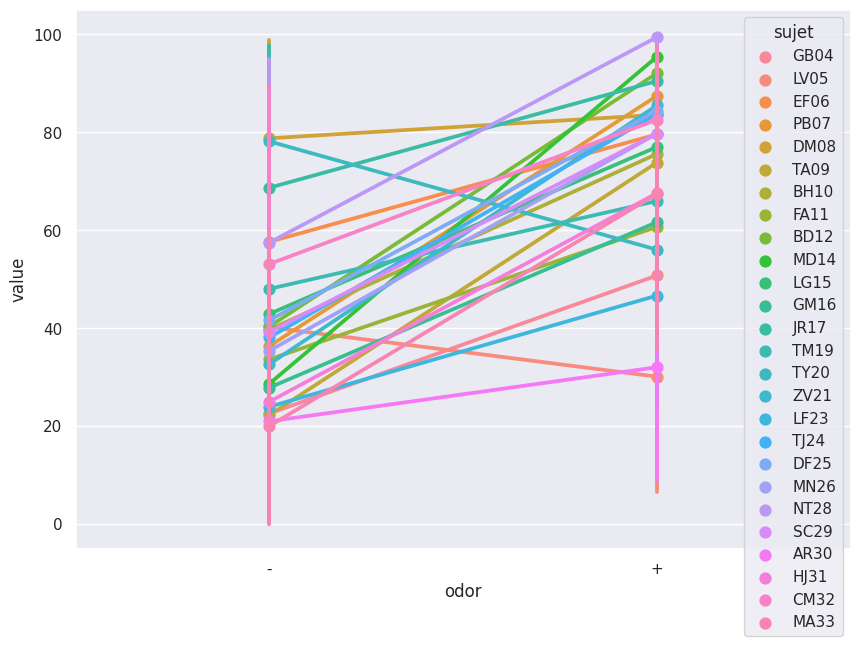

In [ ]:
df_plot = df_odor_profile_filtered.query(f"question == 'familiarite'")
sns.pointplot(data=df_odor_profile_filtered, x="odor", y="value", hue="sujet", order=None)

### PCA

In [ ]:
data = {'sujet' : [], 'odor' : [], 'select' : [], 'appreciation' : [], 'eveil' : [], 'familiarite' : [], 'intensite' : [], 'evocation' : []}

for odor in ['+', '-']:

    for sujet in df_odor_profile_filtered['sujet'].unique():
        
        data['sujet'].append(sujet)

        for question in df_odor_profile['question'].unique():

            data[question].append(df_odor_profile_filtered.query(f"sujet == '{sujet}' and question == '{question}' and odor == '{odor}'")['value'].values[0])

        data['odor'].append(odor)

        if sujet in sujet_best_sel_balanced:
            data['select'].append('select')
        else:
            data['select'].append('non_select')

df_pca = pd.DataFrame(data)
df_pca


,sujet,odor,select,appreciation,eveil,familiarite,intensite,evocation
0,GB04,+,non_select,76.800000,33.600000,32.000000,72.000000,39.200000
1,LV05,+,non_select,99.200000,18.400000,6.400000,25.600000,0.800000
2,EF06,+,non_select,90.400000,72.000000,86.400000,74.400000,74.400000
3,PB07,+,non_select,96.800000,81.600000,98.400000,62.400000,97.600000
4,DM08,+,non_select,84.000000,76.000000,92.800000,71.200000,93.600000
5,TA09,+,select,86.400000,64.000000,87.200000,67.200000,64.000000
6,BH10,+,non_select,74.400000,70.400000,91.200000,61.600000,80.000000
7,FA11,+,select,96.000000,4.800000,88.800000,21.600000,92.000000
8,BD12,+,select,99.200000,99.200000,99.200000,99.200000,63.200000
9,MD14,+,non_select,94.400000,94.400000,96.800000,92.800000,98.400000


In [ ]:


X = df_pca.query(f"odor == '+'")[['appreciation', 'eveil', 'familiarite', 'intensite', 'evocation']].values
X = StandardScaler().fit_transform(X)
pca = PCA(n_components=2).fit_transform(X)
df_pca_fit = pd.DataFrame(data = pca, columns = ['principal component 1', 'principal component 2'])



<Figure size 1000x700 with 0 Axes>

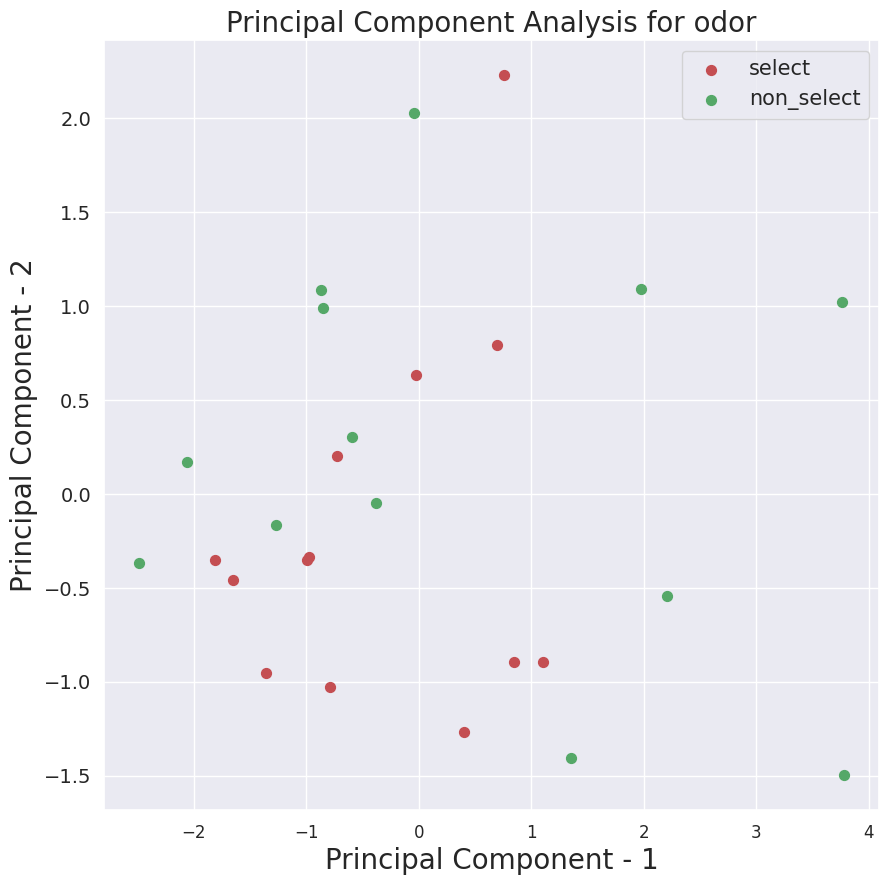

In [ ]:
plt.figure()
plt.figure(figsize=(10,10))
plt.xticks(fontsize=12)
plt.yticks(fontsize=14)
plt.xlabel('Principal Component - 1',fontsize=20)
plt.ylabel('Principal Component - 2',fontsize=20)
plt.title("Principal Component Analysis for odor",fontsize=20)
targets = ['select', 'non_select']
colors = ['r', 'g']
for target, color in zip(targets,colors):
    indicesToKeep = df_pca['select'] == target
    plt.scatter(df_pca_fit.loc[indicesToKeep, 'principal component 1']
               , df_pca_fit.loc[indicesToKeep, 'principal component 2'], c = color, s = 50)

plt.legend(targets,prop={'size': 15})

In [ ]:
df_diff_question

,sujet,question,value,select_best
0,GB04,appreciation,64.8,False
1,GB04,eveil,30.4,False
2,GB04,familiarite,28.8,False
3,GB04,intensite,-14.4,False
4,GB04,evocation,31.2,False
...,...,...,...,...
125,MA33,appreciation,100.0,True
126,MA33,eveil,12.0,True
127,MA33,familiarite,100.0,True
128,MA33,intensite,-56.8,True


In [ ]:
data = {'sujet' : [], 'select' : [], 'appreciation' : [], 'eveil' : [], 'familiarite' : [], 'intensite' : [], 'evocation' : []}

for sujet in df_diff_question['sujet'].unique():
    
    data['sujet'].append(sujet)

    for question in df_odor_profile['question'].unique():

        data[question].append(df_diff_question.query(f"sujet == '{sujet}' and question == '{question}'")['value'].values[0])

    if sujet in sujet_best_sel_balanced:
        data['select'].append('select')
    else:
        data['select'].append('non_select')

df_pca = pd.DataFrame(data)
df_pca

,sujet,select,appreciation,eveil,familiarite,intensite,evocation
0,GB04,non_select,64.800000,30.400000,28.800000,-14.400000,31.200000
1,LV05,non_select,96.000000,-77.600000,3.200000,-70.400000,-1.600000
2,EF06,non_select,54.400000,-11.200000,33.600000,-10.400000,43.200000
3,PB07,non_select,92.000000,9.600000,92.800000,-33.600000,94.400000
4,DM08,non_select,72.800000,-12.000000,-3.200000,-27.200000,-6.400000
5,TA09,select,70.400000,56.000000,75.200000,-4.800000,60.800000
6,BH10,non_select,68.800000,8.800000,69.600000,-34.400000,66.400000
7,FA11,select,86.400000,-30.400000,56.800000,-49.600000,72.000000
8,BD12,select,87.200000,8.800000,84.800000,17.600000,60.000000
9,MD14,non_select,83.200000,74.400000,88.000000,-3.200000,91.200000


In [ ]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

X = df_pca[['appreciation', 'eveil', 'familiarite', 'intensite', 'evocation']].values
X = StandardScaler().fit_transform(X)
pca = PCA(n_components=2).fit_transform(X)
df_pca_fit = pd.DataFrame(data = pca, columns = ['principal component 1', 'principal component 2'])

<Figure size 1000x700 with 0 Axes>

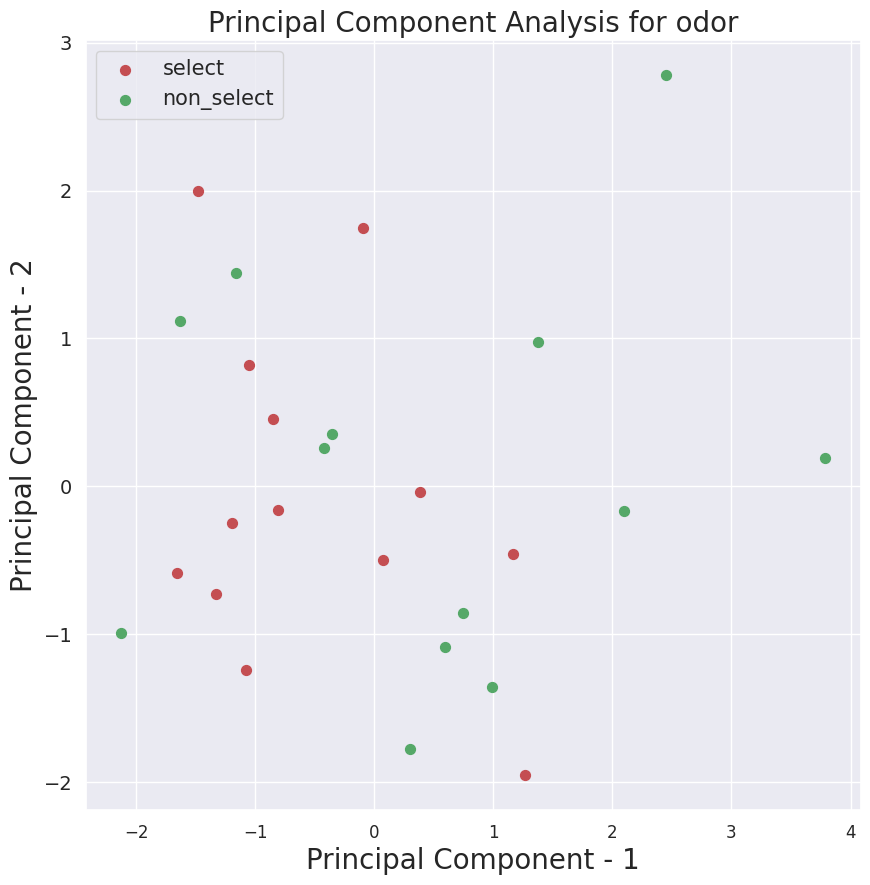

In [ ]:
plt.figure()
plt.figure(figsize=(10,10))
plt.xticks(fontsize=12)
plt.yticks(fontsize=14)
plt.xlabel('Principal Component - 1',fontsize=20)
plt.ylabel('Principal Component - 2',fontsize=20)
plt.title("Principal Component Analysis for odor",fontsize=20)
targets = ['select', 'non_select']
colors = ['r', 'g']
for target, color in zip(targets,colors):
    indicesToKeep = df_pca['select'] == target
    plt.scatter(df_pca_fit.loc[indicesToKeep, 'principal component 1']
               , df_pca_fit.loc[indicesToKeep, 'principal component 2'], c = color, s = 50)

plt.legend(targets,prop={'size': 15})

In [ ]:
data = {'sujet' : [], 'odor' : [], 'cond' : [], 'select' : [], 'RELAX' : [], 'A2' : [], 'STAI' : []}

for sujet in df_diff_question['sujet'].unique():

    for odor in odor_list:

        for cond in ['MECA', 'CO2']:
        
            data['sujet'].append(sujet)
            data['odor'].append(odor)
            data['cond'].append(cond)

            data['RELAX'].append(df_relax.query(f"sujet == '{sujet}' and cond == '{cond}' and session == '{odor}'")['val'].values[0])
            data['A2'].append(df_A2.query(f"sujet == '{sujet}' and cond == '{cond}' and session == '{odor}'")['value'].values[0])
            data['STAI'].append(df_stai.query(f"sujet == '{sujet}' and cond == '{cond}' and session == '{odor}'")['val'].values[0])

            if sujet in sujet_best_sel_balanced:
                data['select'].append('select')
            else:
                data['select'].append('non_select')

df_pca_allpsycho = pd.DataFrame(data)
df_pca_allpsycho

,sujet,odor,cond,select,RELAX,A2,STAI
0,GB04,o,MECA,non_select,94.267516,0.0,7.749469
1,GB04,o,CO2,non_select,94.904459,0.0,4.989384
2,GB04,+,MECA,non_select,98.742138,0.0,2.201258
3,GB04,+,CO2,non_select,97.484277,0.0,2.515723
4,GB04,-,MECA,non_select,89.171975,0.0,3.290870
...,...,...,...,...,...,...,...
151,MA33,o,CO2,select,0.000000,4.2,85.064935
152,MA33,+,MECA,select,89.542484,0.4,19.063181
153,MA33,+,CO2,select,89.032258,1.4,34.623656
154,MA33,-,MECA,select,32.258065,0.2,66.774194


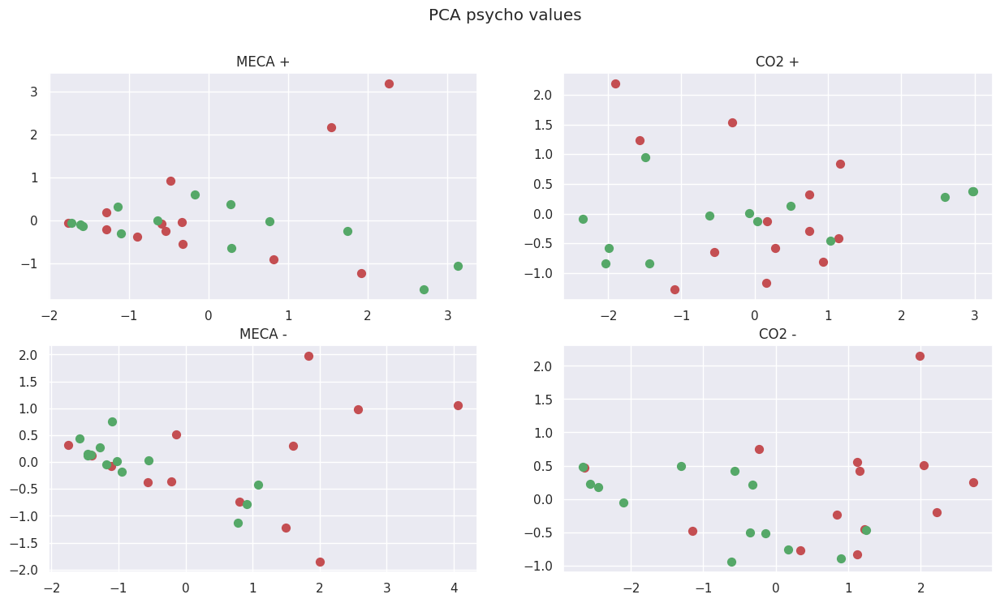

In [ ]:
fig, axs = plt.subplots(ncols=len(['MECA', 'CO2']), nrows=len(['+', '-']))

for cond_i, cond in enumerate(['MECA', 'CO2']):

    for odor_i, odor in enumerate(['+', '-']):

        ax = axs[odor_i, cond_i]

        df_pca = df_pca_allpsycho.query(f"cond == '{cond}' and odor == '{odor}'")
        X = df_pca[['RELAX', 'A2', 'STAI']].values
        X = StandardScaler().fit_transform(X)
        pca = PCA(n_components=2).fit_transform(X)
        df_pca_fit = pd.DataFrame(data = pca, columns = ['principal component 1', 'principal component 2'])

        ax.set_title(f"{cond} {odor}")
        targets = ['select', 'non_select']
        colors = ['r', 'g']
        for target, color in zip(targets,colors):
            indicesToKeep = df_pca['select'] == target
            ax.scatter(df_pca_fit.loc[indicesToKeep.values, 'principal component 1']
                    , df_pca_fit.loc[indicesToKeep.values, 'principal component 2'], c = color, s = 50)

plt.suptitle('PCA psycho values')
fig.set_figheight(8)
fig.set_figwidth(15)

# odor analysis

In [37]:
df_odor_choice

,sujet,session,odor,raw_val,scale,value
0,PD01,odor_+,6,10.1,12.7,79.527559
1,PD01,odor_-,11,4.2,12.7,33.070866
2,MJ02,odor_+,6,8.7,12.7,68.503937
3,MJ02,odor_-,11,3.5,12.7,27.559055
4,VN03,odor_+,13,7.5,12.7,59.055118
...,...,...,...,...,...,...
61,HJ31,odor_-,11,1.6,12.7,12.598425
62,CM32,odor_+,9,9.6,12.6,76.190476
63,CM32,odor_-,11,5.4,12.6,42.857143
64,MA33,odor_+,6,10.5,12.6,83.333333


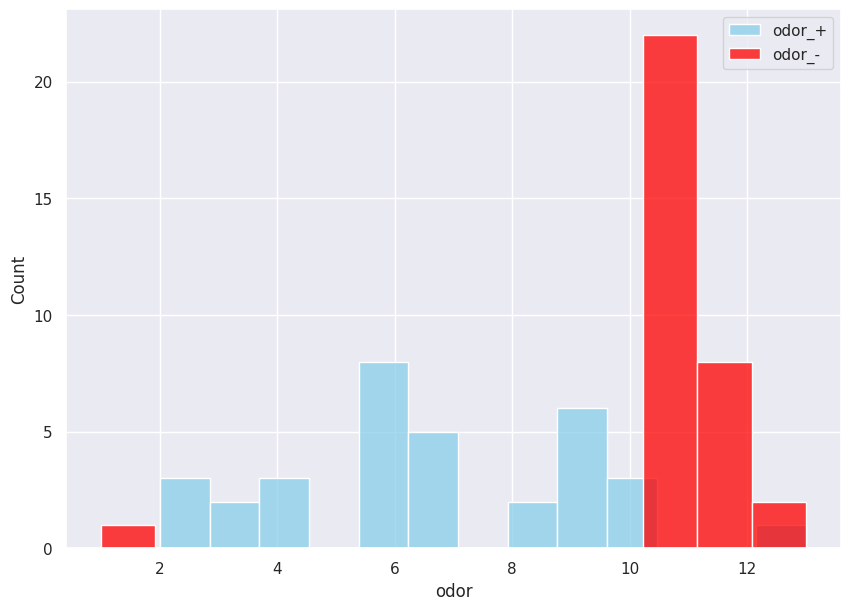

In [ ]:
df_plot = df_odor_choice[(df_odor_choice['session'] == 'odor_+').values]
sns.histplot(data=df_plot, x="odor", label='odor_+', color="skyblue", bins=13)
df_plot = df_odor_choice[(df_odor_choice['session'] == 'odor_-').values]
sns.histplot(data=df_plot, x="odor", label='odor_-', color="red", bins=13)

plt.legend()

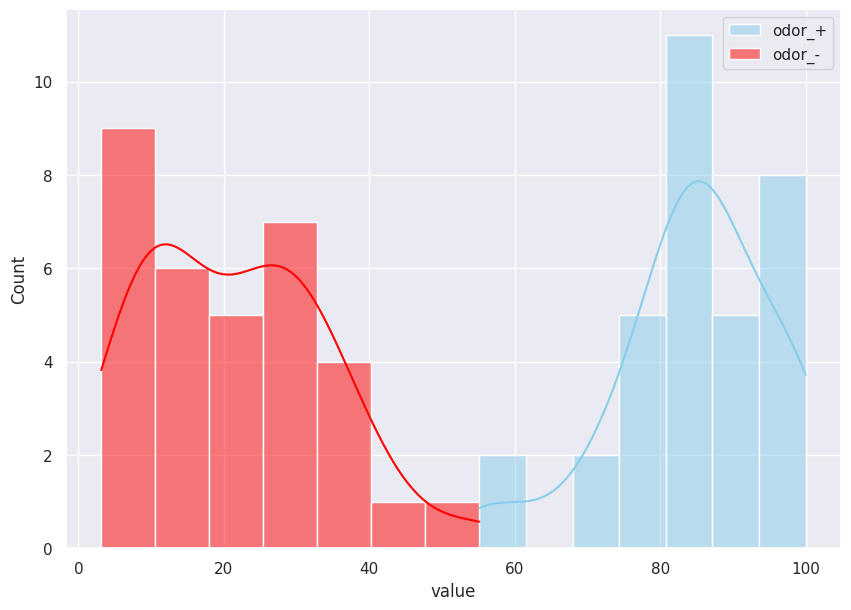

In [ ]:
df_plot = df_odor_choice[(df_odor_choice['session'] == 'odor_+').values]
sns.histplot(data=df_plot, x="value", label='odor_+', color="skyblue", kde=True)
df_plot = df_odor_choice[(df_odor_choice['session'] == 'odor_-').values]
sns.histplot(data=df_plot, x="value", label='odor_-', color="red", kde=True)

plt.legend()


In [ ]:
df_odor_choice

,sujet,session,odor,raw_val,scale,value
0,PD01,odor_+,6,10.1,12.7,79.527559
1,PD01,odor_-,11,4.2,12.7,33.070866
2,MJ02,odor_+,6,8.7,12.7,68.503937
3,MJ02,odor_-,11,3.5,12.7,27.559055
4,VN03,odor_+,13,7.5,12.7,59.055118
...,...,...,...,...,...,...
61,HJ31,odor_-,11,1.6,12.7,12.598425
62,CM32,odor_+,9,9.6,12.6,76.190476
63,CM32,odor_-,11,5.4,12.6,42.857143
64,MA33,odor_+,6,10.5,12.6,83.333333


In [ ]:
val = np.zeros((df_odor_choice['sujet'].unique().shape[0], 2), dtype='object')
i = 0
for sujet_i, sujet in enumerate(df_odor_choice['sujet'].unique()):
    df_i = df_odor_choice.query(f"sujet == '{sujet}'")
    diff_i = df_i[df_i['session'] == 'odor_+']['value'].values[0] - df_i[df_i['session'] == 'odor_-']['value'].values[0]
    val[i, :] = np.array([sujet, diff_i])
    i += 1

In [ ]:
df_diff = pd.DataFrame(val, columns=['sujet', 'value'])
df_diff['value'] = df_diff['value'].astype(np.float64) 
df_diff

,sujet,value
0,PD01,46.456693
1,MJ02,40.944882
2,VN03,27.559055
3,GB04,78.740157
4,LV05,33.858268
5,EF06,62.204724
6,PB07,80.314961
7,DM08,78.571429
8,TA09,75.396825
9,BH10,41.269841


<AxesSubplot: xlabel='value', ylabel='Count'>

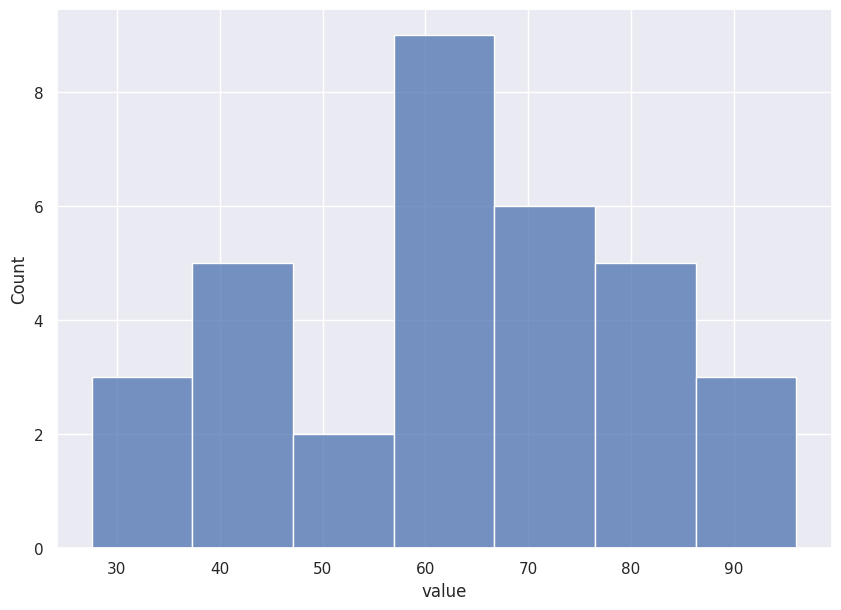

In [ ]:
sns.histplot(data=df_diff, x="value")

In [ ]:
sujet_sel_diff = df_diff.query("value >= 60")['sujet'].values
sujet_sel_diff

array(['GB04', 'EF06', 'PB07', 'DM08', 'TA09', 'FA11', 'BD12', 'FP13',
       'MD14', 'LG15', 'GM16', 'JR17', 'SE18', 'TY20', 'ZV21', 'TJ24',
       'MN26', 'NT28', 'SC29', 'HJ31', 'MA33'], dtype=object)

In [ ]:
df_odor_profile

,sujet,question,odor,raw_val,scale,value,select_best
30,MJ02,appreciation,11,3.0,12.5,24.0,NO
31,MJ02,appreciation,4,5.0,12.5,40.0,NO
32,MJ02,appreciation,13,5.4,12.5,43.2,NO
33,MJ02,appreciation,12,5.7,12.5,45.6,NO
34,MJ02,appreciation,7,8.9,12.5,71.2,NO
...,...,...,...,...,...,...,...
985,MA33,evocation,13,0.0,12.5,0.0,YES
986,MA33,evocation,6,10.2,12.5,81.6,YES
987,MA33,evocation,12,11.3,12.5,90.4,YES
988,MA33,evocation,7,12.5,12.5,100.0,YES


In [ ]:
for sujet_i, sujet in enumerate(df_odor_profile['sujet'].unique()):
    odor_p = df_odor_choice.query(f"sujet == '{sujet}' & session == 'odor_+'")['odor'].values[0]
    odor_n = df_odor_choice.query(f"sujet == '{sujet}' & session == 'odor_-'")['odor'].values[0]
    odor_sel = [odor_p, odor_n]
    if sujet_i == 0:
        df_odor_profile_filtered = df_odor_profile.query(f"sujet == '{sujet}' & odor in {odor_sel}")
        df_odor_profile_filtered_p = df_odor_profile.query(f"sujet == '{sujet}' & odor == {odor_p}")
    else:
        df_i = df_odor_profile.query(f"sujet == '{sujet}' & odor in {odor_sel}")    
        df_i_p = df_odor_profile.query(f"sujet == '{sujet}' & odor == {odor_p}")    
        df_odor_profile_filtered = pd.concat([df_odor_profile_filtered, df_i], axis=0)
        df_odor_profile_filtered_p = pd.concat([df_odor_profile_filtered_p, df_i_p], axis=0)
df_odor_profile_filtered

,sujet,question,odor,raw_val,scale,value,select_best
30,MJ02,appreciation,11,3.0,12.5,24.0,NO
35,MJ02,appreciation,6,10.0,12.5,80.0,NO
36,MJ02,eveil,6,5.6,12.5,44.8,NO
41,MJ02,eveil,11,11.6,12.5,92.8,NO
44,MJ02,familiarite,11,5.5,12.5,44.0,NO
...,...,...,...,...,...,...,...
976,MA33,familiarite,6,12.5,12.5,100.0,YES
978,MA33,intensite,6,5.4,12.5,43.2,YES
983,MA33,intensite,11,12.5,12.5,100.0,YES
984,MA33,evocation,11,0.0,12.5,0.0,YES


(0.0, 100.0)

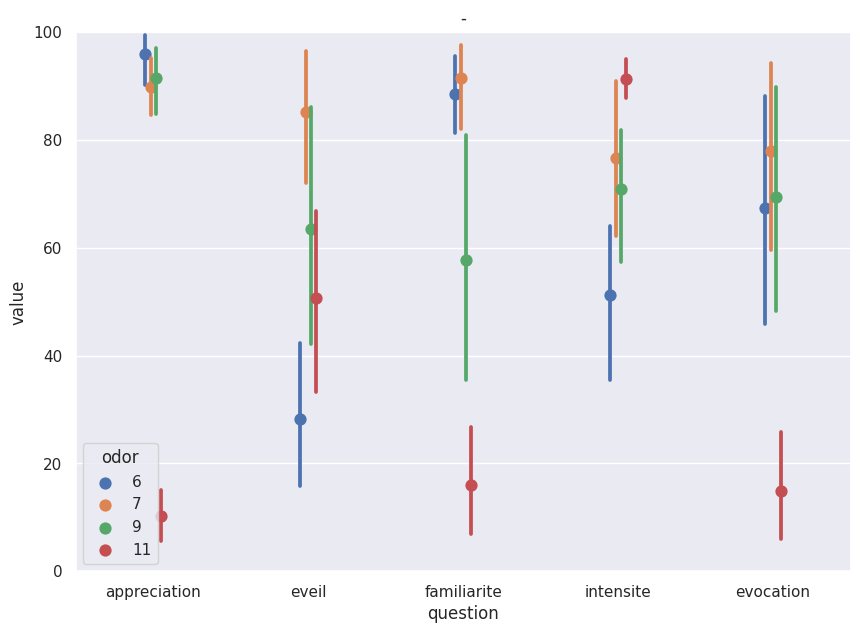

In [ ]:
odor_sel = [6, 7, 9, 11]
df_plot = df_odor_profile_filtered.query(f"odor in {odor_sel}")
sns.pointplot(data=df_plot, x="question", y="value", hue="odor", errorbar='sd', linestyles='none', dodge=True).set(title=odor)
sns.set(rc={'figure.figsize':(10,7)})
plt.ylim(0, 100)

In [ ]:
df_odor_profile_filtered_p

,sujet,question,odor,raw_val,scale,value,select_best
35,MJ02,appreciation,6,10.0,12.5,80.0,NO
36,MJ02,eveil,6,5.6,12.5,44.8,NO
46,MJ02,familiarite,6,10.5,12.5,84.0,NO
48,MJ02,intensite,6,3.5,12.5,28.0,NO
57,MJ02,evocation,6,4.9,12.5,39.2,NO
...,...,...,...,...,...,...,...
965,MA33,appreciation,6,12.5,12.5,100.0,YES
967,MA33,eveil,6,1.5,12.5,12.0,YES
976,MA33,familiarite,6,12.5,12.5,100.0,YES
978,MA33,intensite,6,5.4,12.5,43.2,YES


<AxesSubplot: xlabel='value', ylabel='Count'>

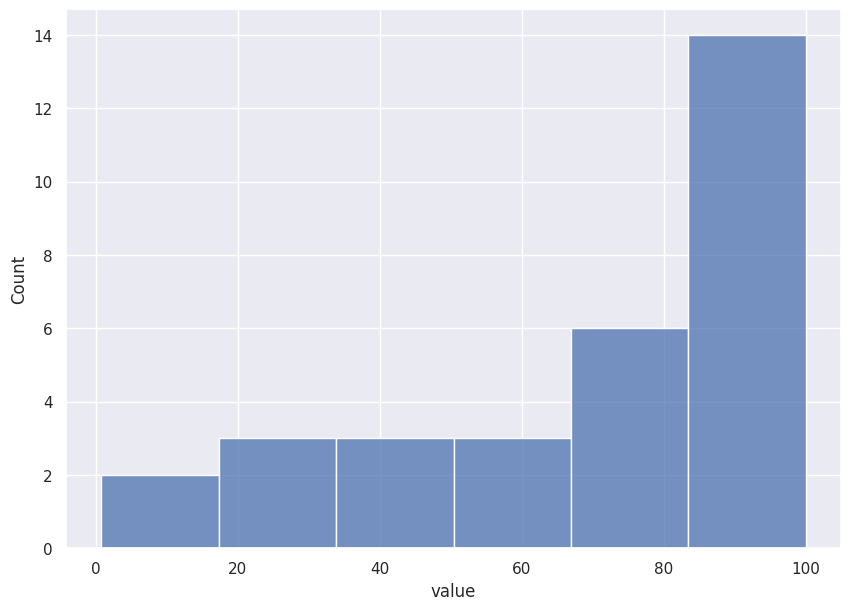

In [ ]:
df_plot = df_odor_profile_filtered_p.query(f"question == 'evocation'")
sns.histplot(data=df_plot, x="value")

In [ ]:
sujet_sel_evoc = df_odor_profile_filtered_p.query(f"question == 'evocation' & value >= 60")['sujet'].unique()

# mdp analysis

## experimental discomfort

In [129]:
df_CO2

,sujet,odor,PetCO2,VAS_A,VAS_S,A1
0,01PD,o,49.315507,7.241427,7.188733,9
1,03VN,o,54.132044,7.243436,6.856938,7
2,04GB,o,57.311075,4.651608,4.440282,5
3,05LV,o,68.663220,6.411272,6.203500,8
4,06EF,o,47.157457,6.038375,4.894141,7
...,...,...,...,...,...,...
79,29SC,-,59.775720,6.322902,6.956098,9
80,30AR,-,59.686274,7.858206,7.906425,9
81,31HJ,-,43.976907,6.370555,6.291526,8
82,32CM,-,61.331429,5.377888,6.603407,8


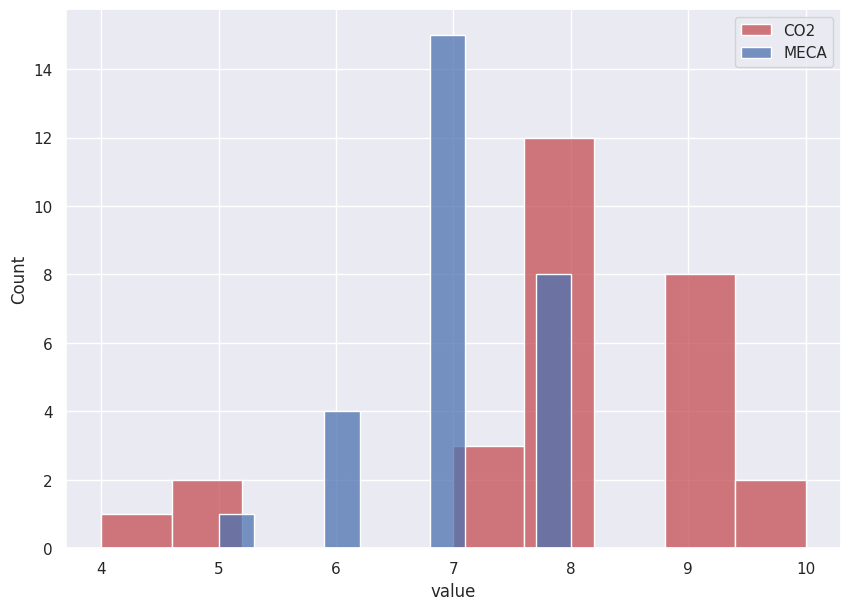

In [87]:
df_plot = df_mdp.query(f"question == 'A1' and session == 'o' and cond == 'CO2'")
sns.histplot(data=df_plot, x='value', label='CO2', color='r', bins=10)

df_plot = df_mdp.query(f"question == 'A1' and session == 'o' and cond == 'MECA'")
sns.histplot(data=df_plot, x='value', label='MECA', color='b', bins=10)

plt.legend()

<AxesSubplot: xlabel='cond', ylabel='value'>

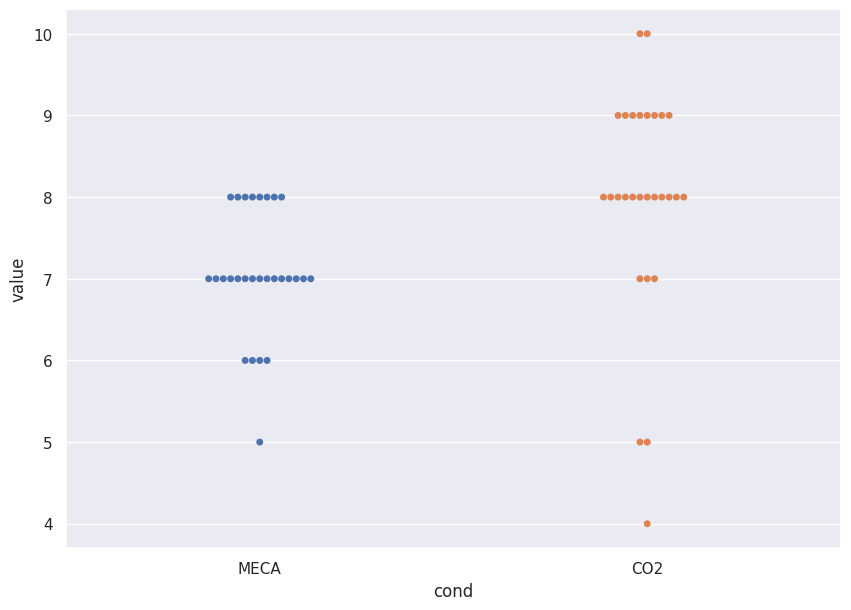

In [89]:
df_plot = df_mdp.query(f"question == 'A1' and session == 'o'")
sns.swarmplot(data=df_plot, x='cond', y='value')

In [91]:
df_CO2

,sujet,odor,PetCO2,VAS_A,VAS_S,A1
0,01PD,o,49.315507,7.241427,7.188733,9
1,03VN,o,54.132044,7.243436,6.856938,7
2,04GB,o,57.311075,4.651608,4.440282,5
3,05LV,o,68.663220,6.411272,6.203500,8
4,06EF,o,47.157457,6.038375,4.894141,7
...,...,...,...,...,...,...
79,29SC,-,59.775720,6.322902,6.956098,9
80,30AR,-,59.686274,7.858206,7.906425,9
81,31HJ,-,43.976907,6.370555,6.291526,8
82,32CM,-,61.331429,5.377888,6.603407,8


<AxesSubplot: xlabel='PetCO2', ylabel='Count'>

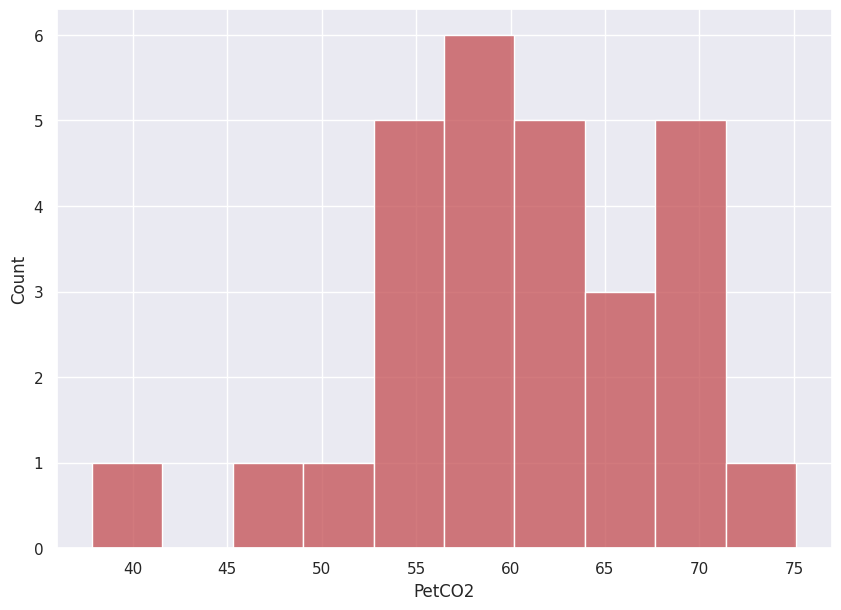

In [94]:
df_plot = df_CO2.query(f"odor == 'o'")
sns.histplot(data=df_plot, x='PetCO2', label='CO2', color='r', bins=10)

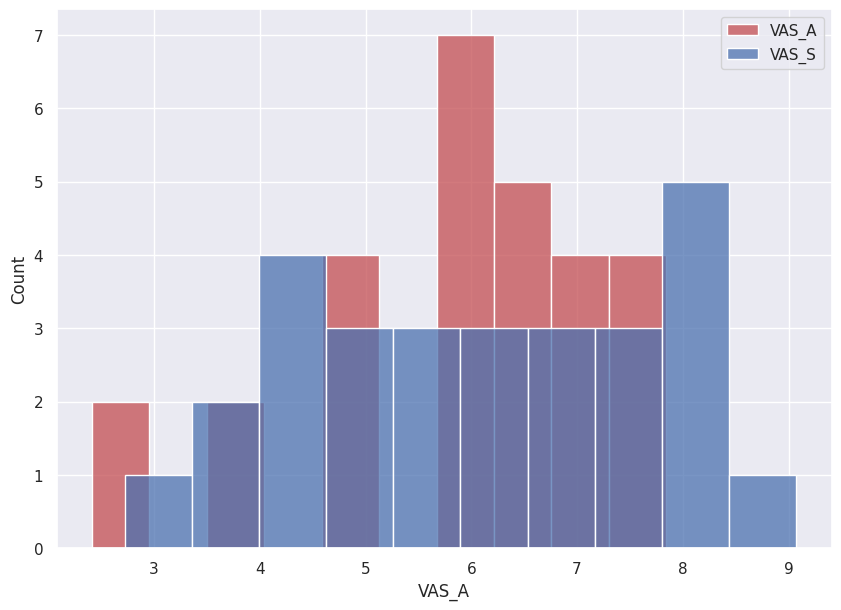

In [95]:
df_plot = df_CO2.query(f"odor == 'o'")
sns.histplot(data=df_plot, x='VAS_A', label='VAS_A', color='r', bins=10)
sns.histplot(data=df_plot, x='VAS_S', label='VAS_S', color='b', bins=10)
plt.legend()

In [96]:
df_CO2.query(f"odor == 'o'").sort_values(by=['VAS_A'])

,sujet,odor,PetCO2,VAS_A,VAS_S,A1
20,25DF,o,69.482135,2.411100,2.722538,4
11,14MD,o,65.298323,2.719711,4.138997,8
18,23LF,o,70.145070,3.789622,4.786719,8
6,08DM,o,75.125578,3.819823,3.789791,7
16,20TY,o,67.856116,4.623040,8.092091,8
2,04GB,o,57.311075,4.651608,4.440282,5
17,21ZV,o,61.550712,4.657067,6.370881,8
9,11FA,o,55.457999,4.751648,5.753333,8
7,09TA,o,58.082566,5.803949,5.581536,9
15,19TM,o,62.891516,5.862157,8.091534,9


In [ ]:
df_CO2

,sujet,odor,PetCO2,VAS_A,VAS_S
0,01PD,o,49.315507,7.241427,7.188733
1,02MJ,o,66.424689,5.770071,6.431547
2,03VN,o,54.132044,7.243436,6.856938
3,04GB,o,57.311075,4.651608,4.440282
4,05LV,o,68.663220,6.411272,6.203500
...,...,...,...,...,...
94,29SC,-,59.775720,6.322902,6.956098
95,30AR,-,59.686274,7.858206,7.906425
96,31HJ,-,43.976907,6.370555,6.291526
97,32CM,-,61.331429,5.377888,6.603407


In [ ]:
dict = {'sujet' : [], 'odor' : [], 'metric' : [], 'val' : []}

for sujet in df_CO2['sujet']:

    for odor in odor_list:

        for metric_i in ['PetCO2', 'VAS_A', 'VAS_S']:

            val = df_CO2.query(f"sujet == '{sujet}' and odor == '{odor}'")[metric_i].values[0]

            if metric_i == 'PetCO2':

                val = (val - df_CO2.query(f"odor == '{odor}'")['PetCO2'].min()) * 10 / (df_CO2.query(f"odor == '{odor}'")['PetCO2'].max() - df_CO2.query(f"odor == '{odor}'")['PetCO2'].min())

            dict['sujet'].append(sujet)
            dict['odor'].append(odor)
            dict['metric'].append(metric_i)
            dict['val'].append(val)

df_CO2_tidy = pd.DataFrame(dict)
df_CO2_tidy

,sujet,odor,metric,val
0,01PD,o,PetCO2,3.079725
1,01PD,o,VAS_A,7.241427
2,01PD,o,VAS_S,7.188733
3,01PD,+,PetCO2,1.960538
4,01PD,+,VAS_A,5.125228
...,...,...,...,...
886,33MA,+,VAS_A,5.009362
887,33MA,+,VAS_S,3.502957
888,33MA,-,PetCO2,5.182716
889,33MA,-,VAS_A,5.009362


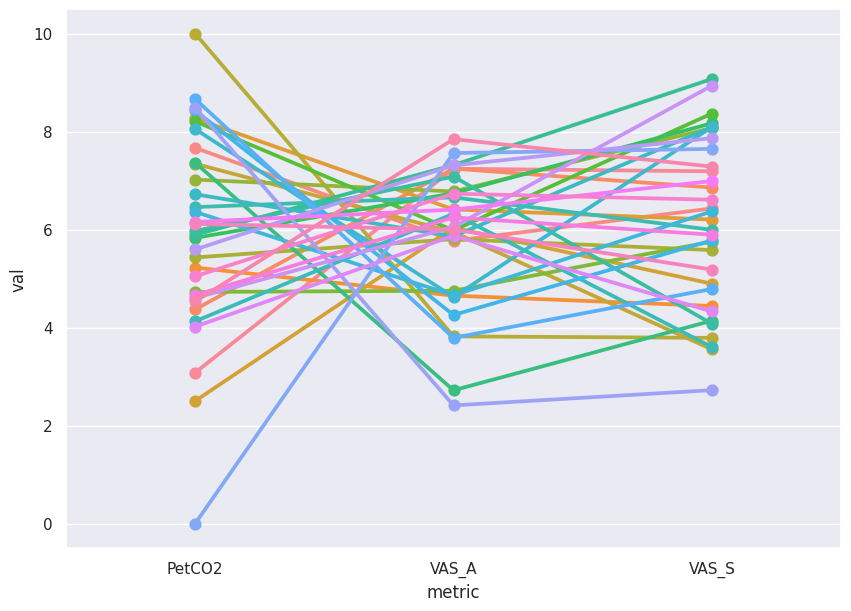

In [ ]:
fig, ax = plt.subplots()
df_plot = df_CO2_tidy.query(f"odor == 'o'")
sns.pointplot(data=df_plot, x="metric", y="val", hue="sujet", ax=ax)
plt.legend([],[], frameon=False)
sns.set(rc={'figure.figsize':(10,7)})

In [ ]:
df_CO2

,sujet,odor,PetCO2,VAS_A,VAS_S
0,01PD,o,49.315507,7.241427,7.188733
1,02MJ,o,66.424689,5.770071,6.431547
2,03VN,o,54.132044,7.243436,6.856938
3,04GB,o,57.311075,4.651608,4.440282
4,05LV,o,68.663220,6.411272,6.203500
...,...,...,...,...,...
94,29SC,-,59.775720,6.322902,6.956098
95,30AR,-,59.686274,7.858206,7.906425
96,31HJ,-,43.976907,6.370555,6.291526
97,32CM,-,61.331429,5.377888,6.603407


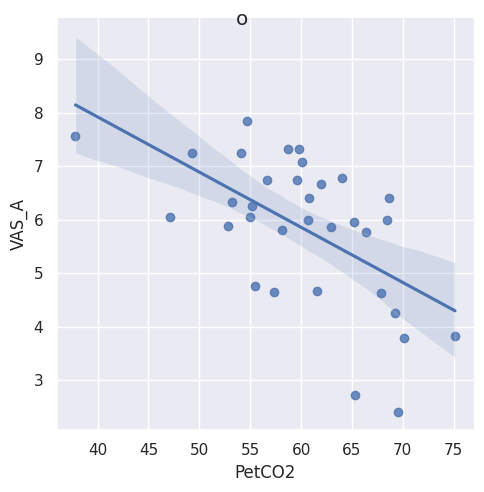

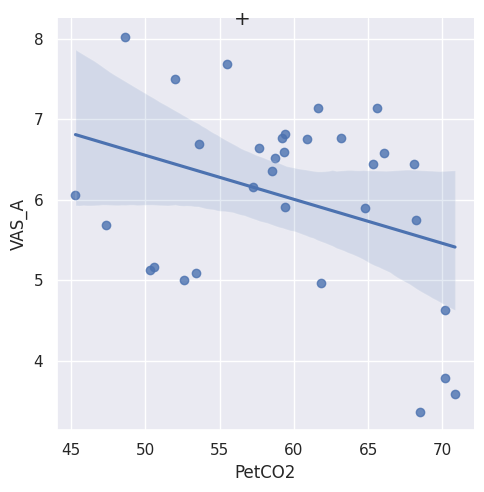

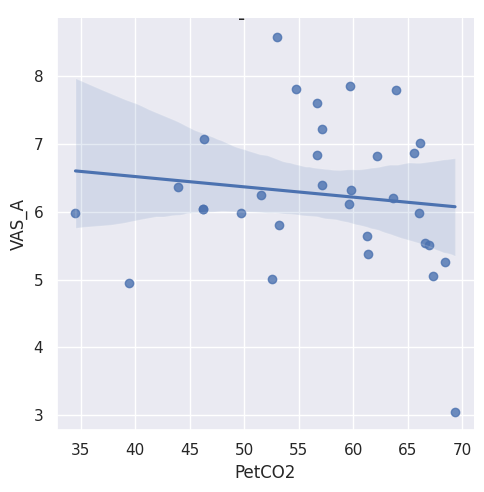

In [ ]:
for odor in odor_list:
    df_plot = df_CO2.query(f"odor == '{odor}'")
    sns.lmplot(data=df_plot, x="PetCO2", y="VAS_A")
    plt.suptitle(odor)


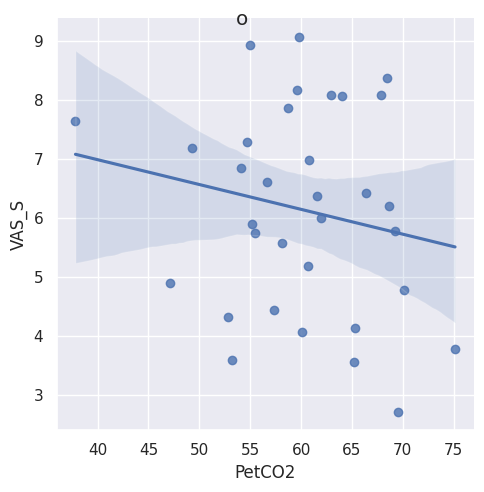

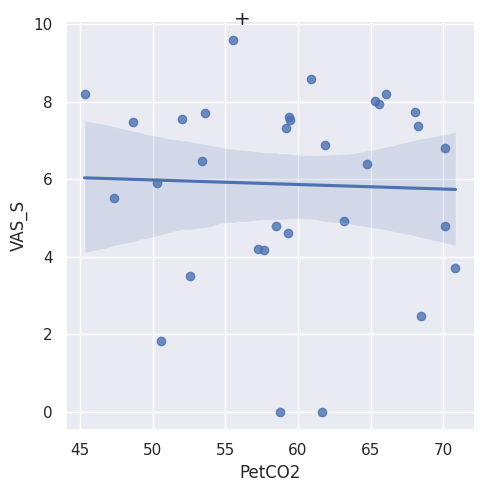

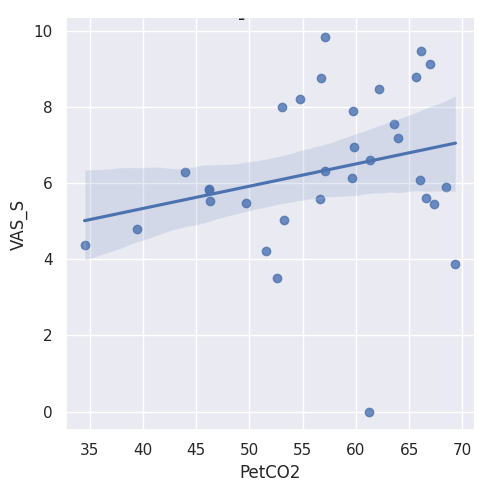

In [ ]:
for odor in odor_list:
    df_plot = df_CO2.query(f"odor == '{odor}'")
    sns.lmplot(data=df_plot, x="PetCO2", y="VAS_S")
    slope, intercept, r_value, p_value, std_err = scipy.stats.linregress(df_plot.reshape(-1), Y.reshape(-1))
    plt.suptitle(odor)


/crnldata/cmo/multisite/DATA_MANIP/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:382: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predictor).std()[outcome].reset_index()[outcome].rename('sd')], axis = 1).round(2).set_index(predictor)
/crnldata/cmo/multisite/DATA_MANIP/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:382: FutureWarning: The default value of numeric_only in DataFrameGroupBy.std is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predictor).std()[outcome].reset_index()[outcome].rena

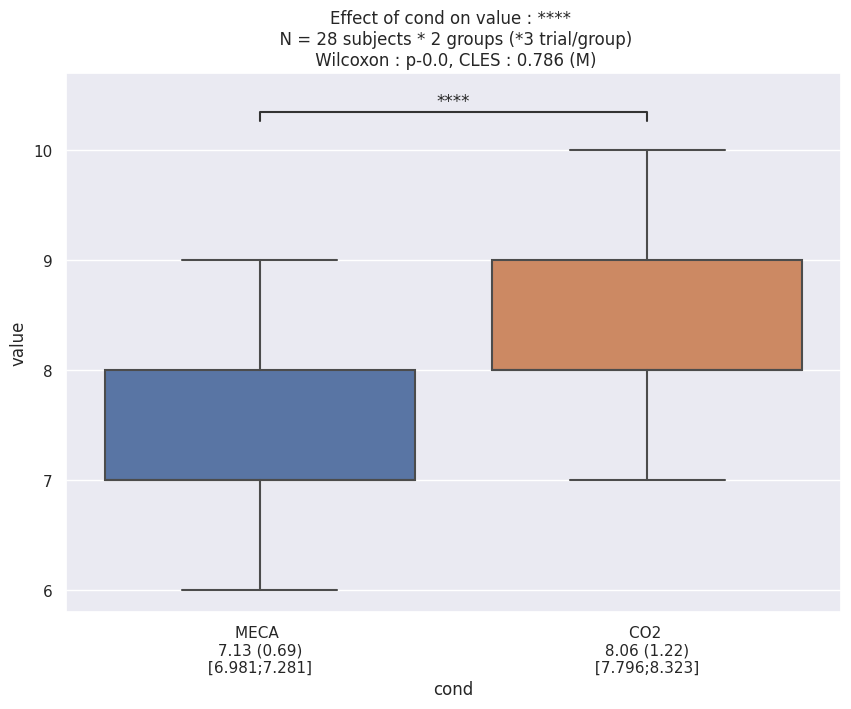

In [ ]:
predictor = 'cond' 
outcome = 'value'
df_stats = df_mdp.query(f"question == 'A1'")
fig, ax = plt.subplots()
ax = auto_stats(df_stats, predictor, outcome, ax=ax, subject='sujet', design='within', mode='box', transform=False, verbose=True, order=None)

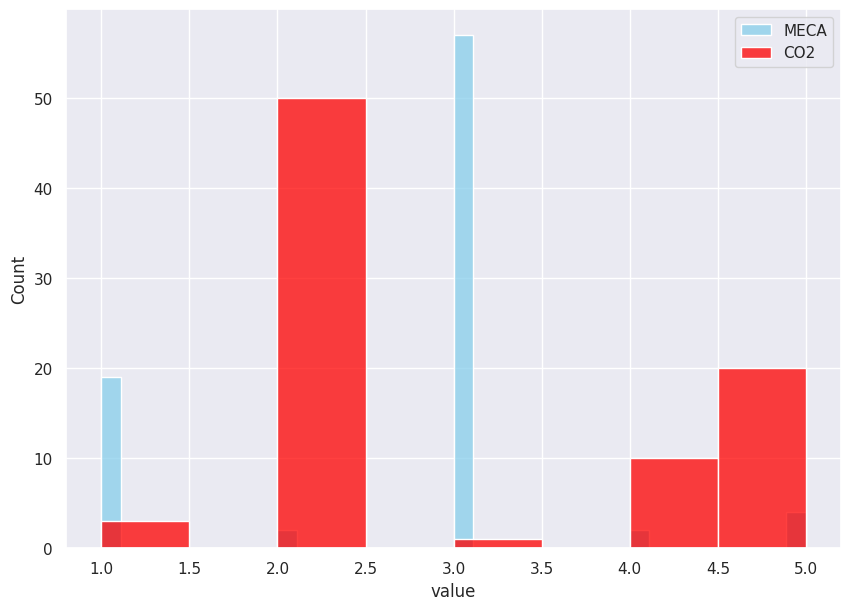

In [ ]:
df_plot = df_mdp[(df_mdp['cond'] == 'MECA').values & (df_mdp['question'] == 'QS_P').values]
sns.histplot(data=df_plot, x="value", label='MECA', color="skyblue")
df_plot = df_mdp[(df_mdp['cond'] == 'CO2').values & (df_mdp['question'] == 'QS_P').values]
sns.histplot(data=df_plot, x="value", label='CO2', color="red")

plt.legend()


## ODOR

In [142]:
data = {'sujet' : [], 'odor' : [], 'PetCO2' : [], 'VAS_A' : [], 'VAS_S' : [], 'A1' : [], 'A2' : [], 'RELAX' : [], 'STAI' : []}

for sujet in sujet_list_erp_rev:

    for odor in ['+', '-']:

        sujet_rev = f"{sujet[2:]}{sujet[:2]}"

        _PetCO2 = df_CO2.query(f"sujet == '{sujet_rev}' and odor == '{odor}'")['PetCO2'].values[0] - df_CO2.query(f"sujet == '{sujet_rev}' and odor == 'o'")['PetCO2'].values[0]
        _VAS_A = df_CO2.query(f"sujet == '{sujet_rev}' and odor == '{odor}'")['VAS_A'].values[0] - df_CO2.query(f"sujet == '{sujet_rev}' and odor == 'o'")['VAS_A'].values[0]
        _VAS_S = df_CO2.query(f"sujet == '{sujet_rev}' and odor == '{odor}'")['VAS_S'].values[0] - df_CO2.query(f"sujet == '{sujet_rev}' and odor == 'o'")['VAS_S'].values[0]
        _A1 = df_CO2.query(f"sujet == '{sujet_rev}' and odor == '{odor}'")['A1'].values[0] - df_CO2.query(f"sujet == '{sujet_rev}' and odor == 'o'")['A1'].values[0]
        _A2 = df_A2.query(f"sujet == '{sujet}' and cond == '{cond}' and session == '{odor}'")['value'].values[0] - df_A2.query(f"sujet == '{sujet}' and cond == '{cond}' and session == 'o'")['value'].values[0]
        _RELAX = df_relax.query(f"sujet == '{sujet}' and cond == '{cond}' and session == '{odor}'")['val'].values[0] - df_relax.query(f"sujet == '{sujet}' and cond == '{cond}' and session == 'o'")['val'].values[0]
        _STAI = df_stai.query(f"sujet == '{sujet}' and cond == '{cond}' and session == '{odor}'")['val'].values[0] - df_stai.query(f"sujet == '{sujet}' and cond == '{cond}' and session == 'o'")['val'].values[0]

        data['sujet'].append(sujet)
        data['odor'].append(odor)
        data['PetCO2'].append(_PetCO2)
        data['VAS_A'].append(_VAS_A)
        data['VAS_S'].append(_VAS_S)
        data['A1'].append(_A1)
        data['A2'].append(_A2)
        data['RELAX'].append(_RELAX)
        data['STAI'].append(_STAI)

df_diff_CO2 = pd.DataFrame(data)
df_diff_CO2


,sujet,odor,PetCO2,VAS_A,VAS_S,A1,A2,RELAX,STAI
0,PD01,+,0.987604,-2.116199,-1.297730,0,-0.4,-0.468694,0.981453
1,PD01,-,5.400334,0.571792,1.026753,0,-0.6,5.900733,-2.415575
2,VN03,+,10.651226,-1.342273,-0.469034,2,-0.4,-14.012739,22.929936
3,VN03,-,-7.796824,-0.163153,-1.329320,0,0.4,3.821656,35.244161
4,GB04,+,-6.741957,0.514080,-2.623967,0,0.0,2.579818,-2.473661
5,GB04,-,-22.779302,1.326296,-0.066844,3,0.0,-8.280255,-1.061571
6,LV05,+,1.476495,-1.776842,0.587348,0,0.0,0.016125,2.000188
7,LV05,-,-2.657535,-0.432742,-0.111536,0,0.0,-21.502862,14.025505
8,EF06,+,6.463516,0.651694,2.817552,1,0.6,-10.126582,18.354430
9,EF06,-,6.074200,-0.230291,0.138622,1,-0.6,6.329114,4.008439


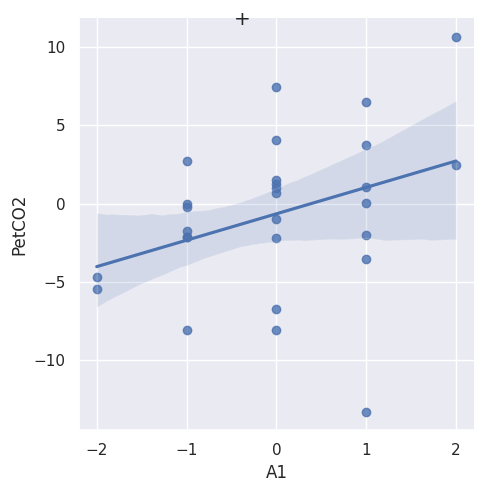

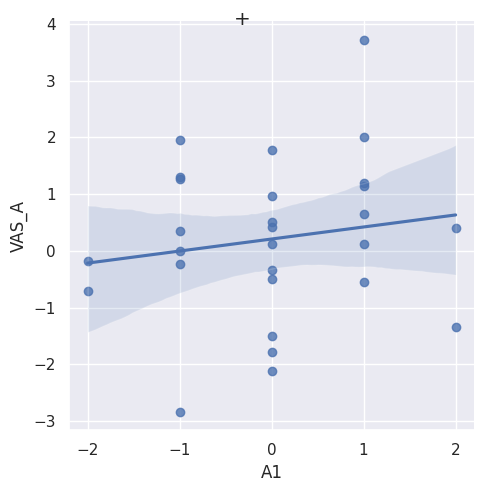

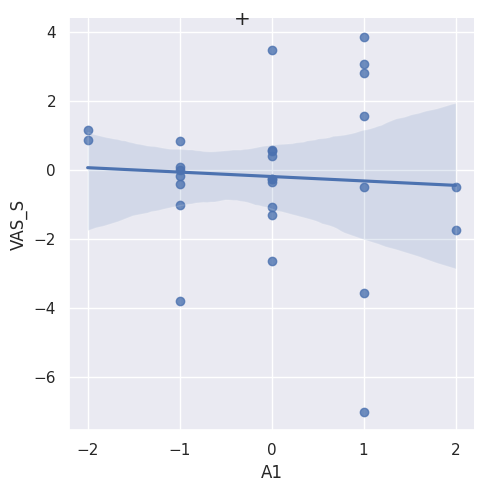

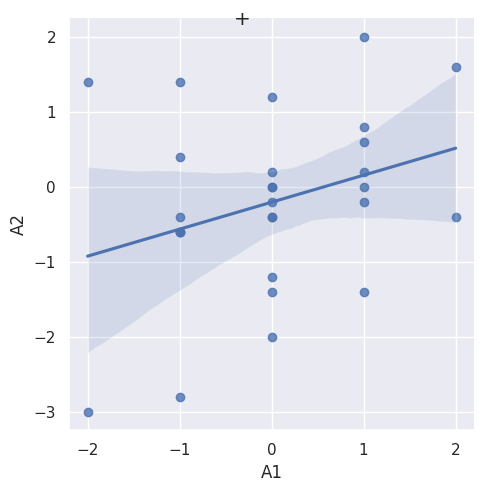

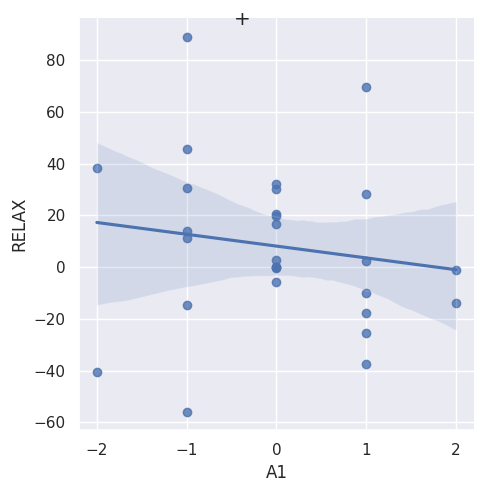

...

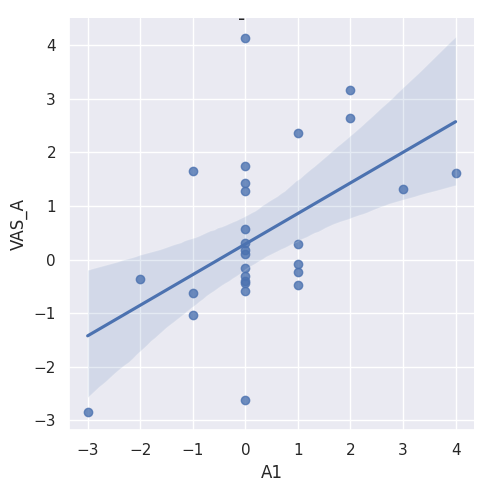

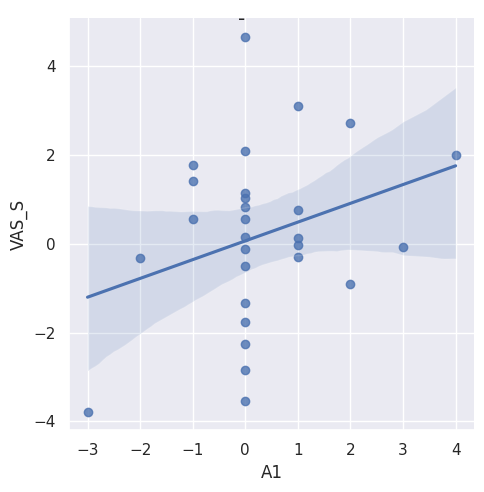

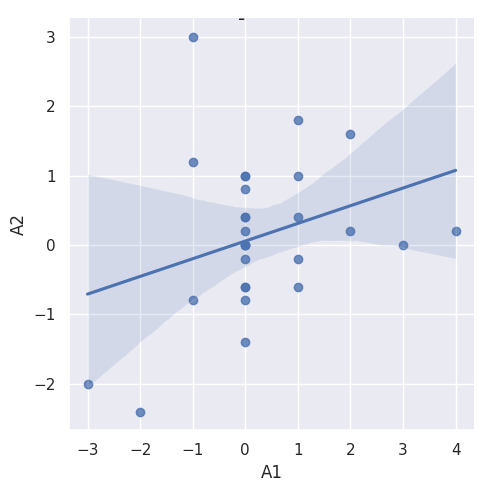

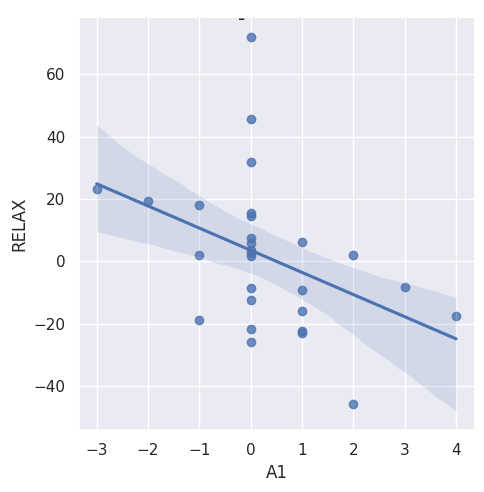

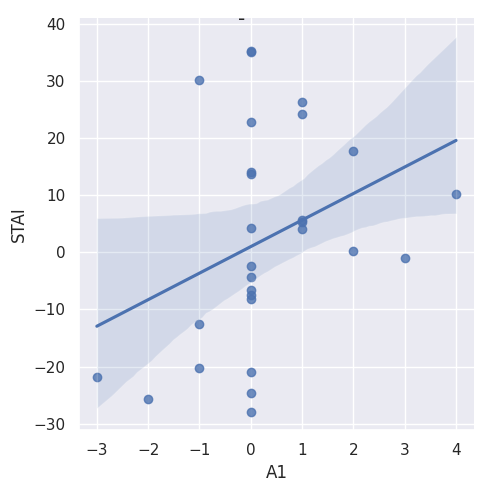

In [145]:
for odor in ['+', '-']:
    for metric in ['PetCO2', 'VAS_A', 'VAS_S', 'A2', 'RELAX', 'STAI']:
        df_plot = df_diff_CO2.query(f"odor == '{odor}'")
        sns.lmplot(data=df_plot, x="A1", y=metric)
        plt.suptitle(odor)

In [155]:
df_diff_CO2.query("odor == '-'").sort_values(by='A1')

,sujet,odor,PetCO2,VAS_A,VAS_S,A1,A2,RELAX,STAI
55,MA33,-,-2.159641,-2.835284,-3.781536,-3,-2.0,23.076923,-21.817072
51,HJ31,-,-12.674257,-0.361220,-0.317507,-2,-2.4,19.230769,-25.747863
53,CM32,-,0.694079,-0.621929,1.420566,-1,3.0,-18.589744,30.235043
19,FA11,-,1.677171,1.649087,0.567115,-1,-0.8,2.172861,-12.519149
27,GM16,-,-13.866407,-1.036064,1.773131,-1,1.2,17.989548,-20.337933
11,PB07,-,-3.989302,-0.304911,-3.555465,0,-0.2,14.649682,-8.174098
3,VN03,-,-7.796824,-0.163153,-1.329320,0,0.4,3.821656,35.244161
45,NT28,-,-3.112392,0.107871,1.146990,0,1.0,-25.641026,4.273504
43,MN26,-,-5.659183,1.277053,0.143017,0,1.0,15.384615,-24.679487
39,TJ24,-,1.601735,-2.619088,-2.836249,0,-1.4,2.564103,-4.273504


In [149]:
df_mdp.query("question == 'A1'")

data = {'sujet' : [], 'session' : [], 'cond' : [], 'value' : [], 'select_best' : []}

for sujet in sujet_list_erp_rev:

    for cond in ['MECA', 'CO2']:

        for odor in ['+', '-']:

            _diff = df_mdp.query(f"question == 'A1' and sujet == '{sujet}' and cond == '{cond}' and session == '{odor}'")['value'].values[0] - df_mdp.query(f"question == 'A1' and sujet == '{sujet}' and cond == '{cond}' and session == 'o'")['value'].values[0]

            data['sujet'].append(sujet)
            data['session'].append(odor)
            data['cond'].append(cond)
            data['value'].append(_diff)

            if sujet in sujet_best_list_erp:
                data['select_best'].append('YES')
            else:
                data['select_best'].append('NO')

df_A1_diff = pd.DataFrame(data)
df_A1_diff


,sujet,session,cond,value,select_best
0,PD01,+,MECA,0,YES
1,PD01,-,MECA,0,YES
2,PD01,+,CO2,0,YES
3,PD01,-,CO2,0,YES
4,VN03,+,MECA,0,YES
...,...,...,...,...,...
107,CM32,-,CO2,-1,YES
108,MA33,+,MECA,0,YES
109,MA33,-,MECA,0,YES
110,MA33,+,CO2,-1,YES


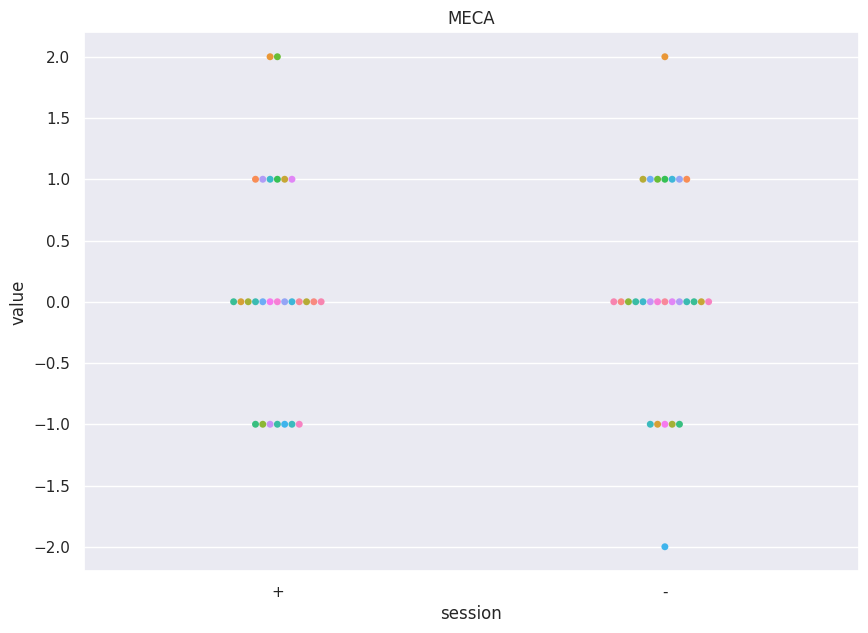

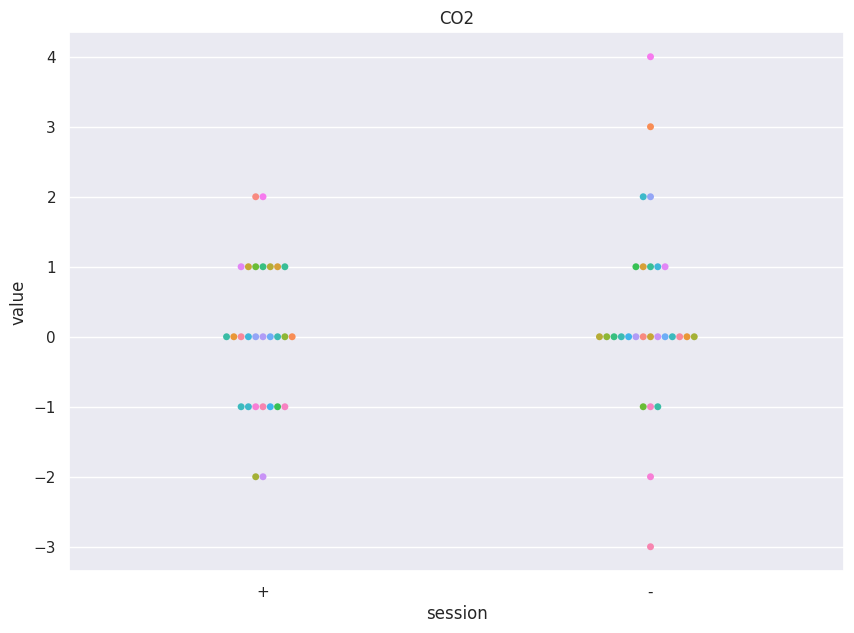

In [151]:
for cond in ['MECA', 'CO2']:
    df_plot = df_A1_diff.query(f"cond == '{cond}'")
    sns.swarmplot(data=df_plot, x="session", y="value", hue="sujet")
    plt.legend([],[], frameon=False)
    plt.title(cond)
    plt.show()

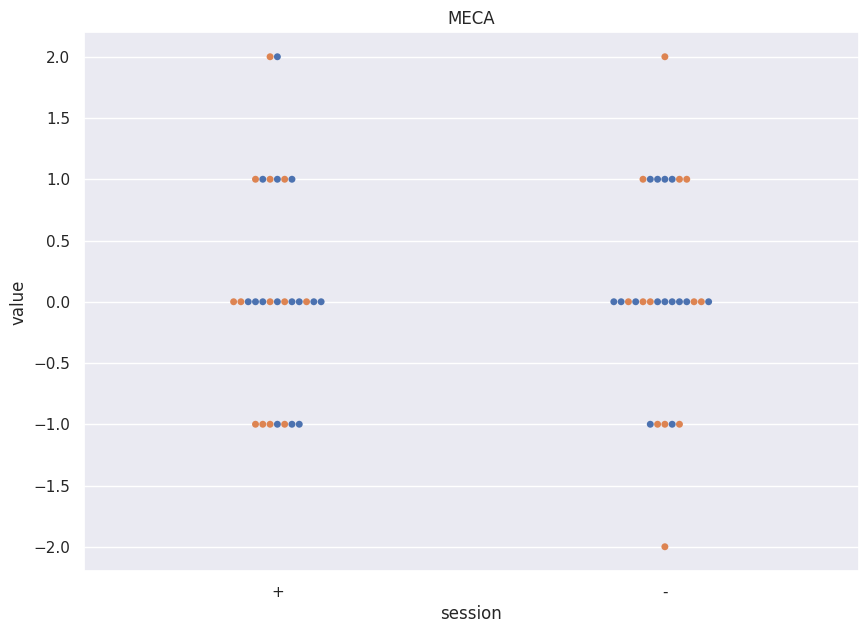

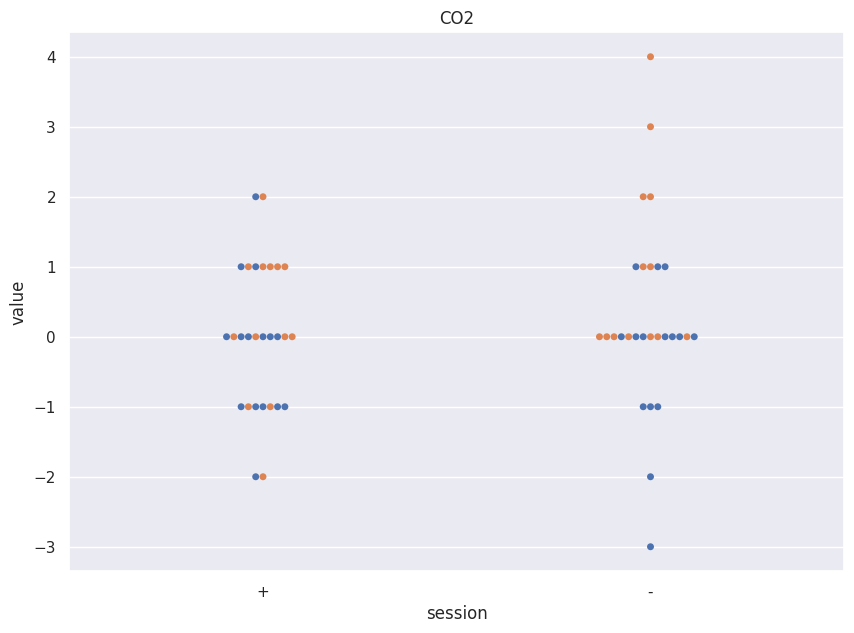

In [150]:
for cond in ['MECA', 'CO2']:
    df_plot = df_A1_diff.query(f"cond == '{cond}'")
    sns.swarmplot(data=df_plot, x="session", y="value", hue="select_best")
    plt.legend([],[], frameon=False)
    plt.title(cond)
    plt.show()

(0.0, 10.0)

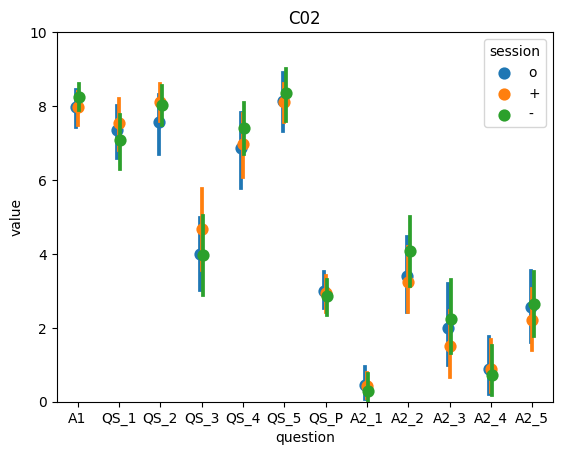

In [38]:
df_plot = df_mdp[df_mdp['cond'] == 'CO2']
sns.pointplot(data=df_plot, x="question", y="value", hue="session", errorbar='sd', linestyles='none', dodge=True).set(title='C02')
sns.set(rc={'figure.figsize':(10,7)})
plt.ylim(0, 10)

(0.0, 10.0)

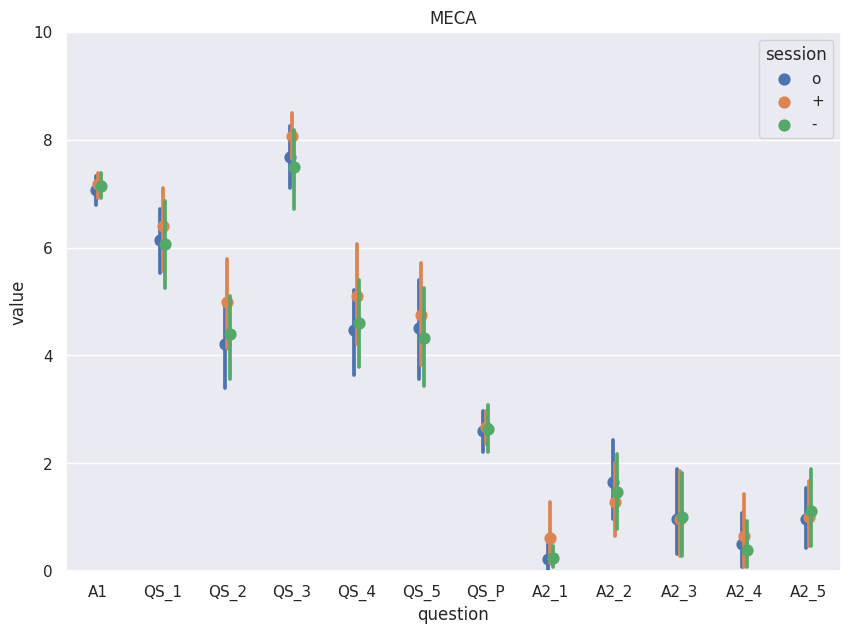

In [ ]:
df_plot = df_mdp[df_mdp['cond'] == 'MECA']
sns.pointplot(data=df_plot, x="question", y="value", hue="session", errorbar='sd', linestyles='none', dodge=True).set(title='MECA')
sns.set(rc={'figure.figsize':(10,7)})
plt.ylim(0, 10)

In [39]:
val = np.zeros((df_mdp['sujet'].unique().shape[0]*df_mdp['session'].unique().shape[0]*df_mdp['cond'].unique().shape[0], 4), dtype='object')
i = 0
for sujet_i, sujet in enumerate(df_mdp['sujet'].unique()):
    for session_i, session in enumerate(df_mdp['session'].unique()):
        for cond_i, cond in enumerate(df_mdp['cond'].unique()):
            df_i = df_mdp.query(f"sujet == '{sujet}' & session == '{session}' & cond == '{cond}'")
            val_A2 = df_i[df_i['question'].isin(['A2_1', 'A2_2', 'A2_3', 'A2_4', 'A2_5'])]['value'].sum()
            val[i, :] = np.array([sujet, session, cond, val_A2])
            i += 1

In [40]:
df_A2 = pd.DataFrame(val, columns=['sujet', 'session', 'cond', 'value'])
df_A2['value'] = df_A2['value'].astype(np.float64) 
df_A2

,sujet,session,cond,value
0,PD01,o,MECA,26.0
1,PD01,o,CO2,34.0
2,PD01,+,MECA,40.0
3,PD01,+,CO2,32.0
4,PD01,-,MECA,27.0
...,...,...,...,...
163,MA33,o,CO2,21.0
164,MA33,+,MECA,2.0
165,MA33,+,CO2,7.0
166,MA33,-,MECA,1.0


(0.0, 50.0)

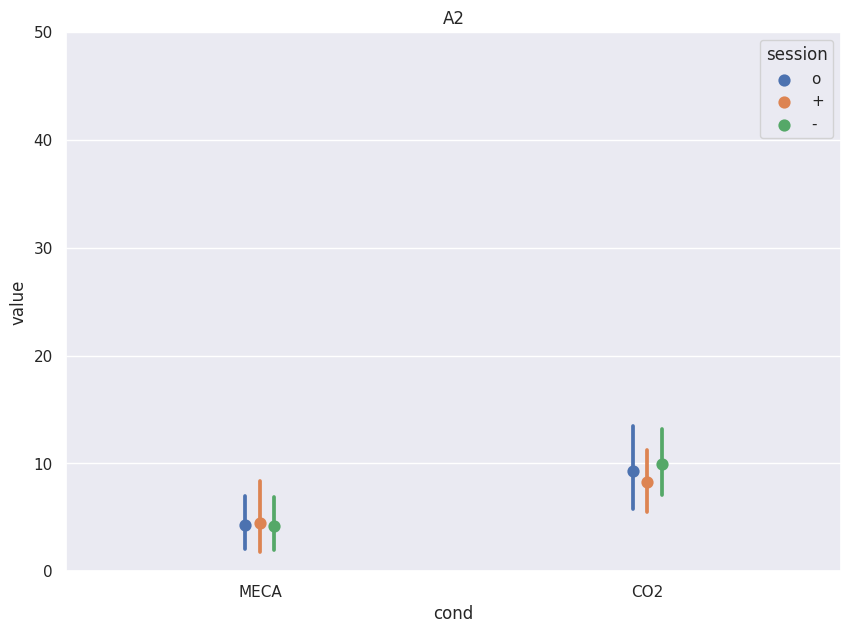

In [ ]:
df_plot = df_A2[df_A2['cond'] == 'CO2']
sns.pointplot(data=df_A2, x="cond", y="value", hue="session", errorbar='sd', linestyles='none', dodge=True).set(title='A2')
sns.set(rc={'figure.figsize':(10,7)})
plt.ylim(0, 50)

In [ ]:
df_A2

,sujet,session,cond,value
0,PD01,o,MECA,26.0
1,PD01,o,CO2,34.0
2,PD01,+,MECA,40.0
3,PD01,+,CO2,32.0
4,PD01,-,MECA,27.0
...,...,...,...,...
163,MA33,o,CO2,21.0
164,MA33,+,MECA,2.0
165,MA33,+,CO2,7.0
166,MA33,-,MECA,1.0


/crnldata/cmo/multisite/DATA_MANIP/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:382: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predictor).std()[outcome].reset_index()[outcome].rename('sd')], axis = 1).round(2).set_index(predictor)
/crnldata/cmo/multisite/DATA_MANIP/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:382: FutureWarning: The default value of numeric_only in DataFrameGroupBy.std is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predictor).std()[outcome].reset_index()[outcome].rena

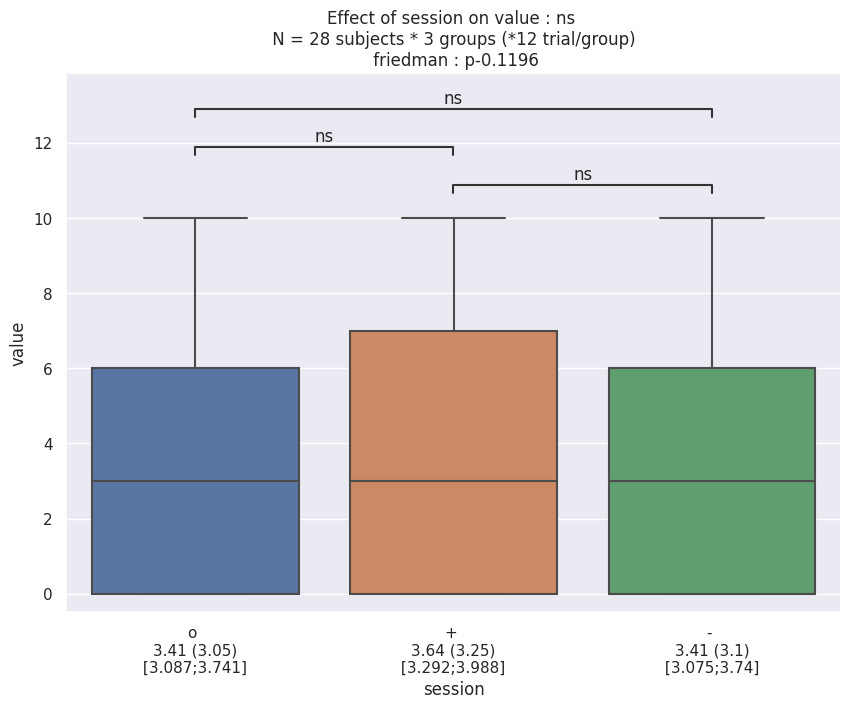

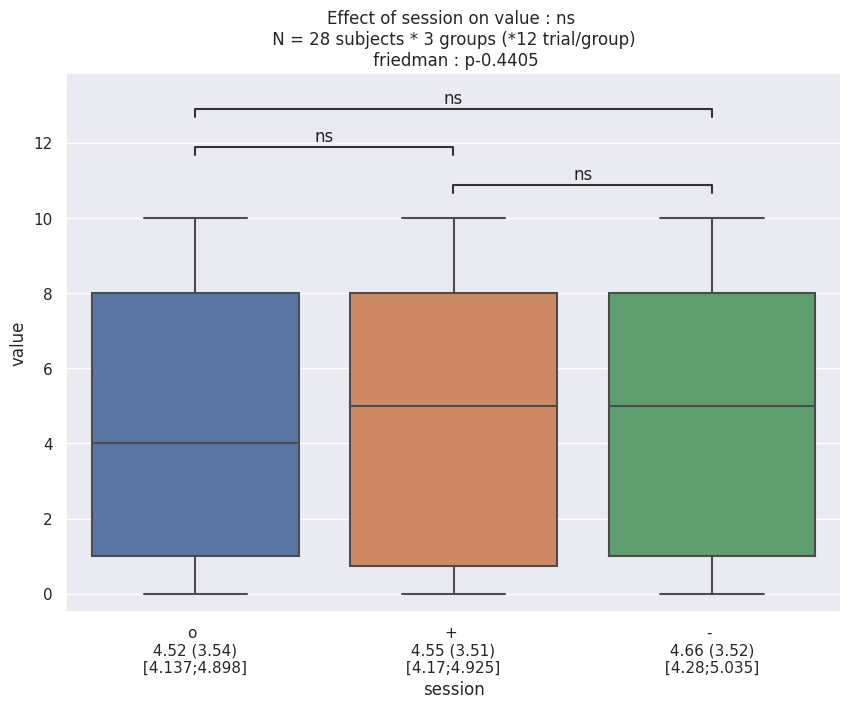

In [41]:
predictor = 'session' 
outcome = 'value'
for cond in ['MECA', 'CO2']:
    df_stats = df_mdp.query(f"cond == '{cond}'")
    fig, ax = plt.subplots()
    ax = auto_stats(df_stats, predictor, outcome, ax=ax, subject='sujet', design='within', mode='box', transform=False, verbose=True, order=None)

# Questionnaire Analysis

In [ ]:
df_q

,sujet,session,cond,question,raw_val,scale,val,select_best
0,PD01,o,FR_CV_1,1,6.9,15.9,43.396226,YES
1,PD01,o,FR_CV_1,2,9.8,15.9,61.635220,YES
2,PD01,o,FR_CV_1,3,9.3,15.9,58.490566,YES
3,PD01,o,FR_CV_1,4,6.2,15.9,38.993711,YES
4,PD01,o,FR_CV_1,5,7.9,15.9,49.685535,YES
...,...,...,...,...,...,...,...,...
3163,MA33,-,FR_CV_2,4,7.5,15.6,48.076923,YES
3164,MA33,-,FR_CV_2,5,0,15.6,0.000000,YES
3165,MA33,-,FR_CV_2,6,2.7,15.6,17.307692,YES
3166,MA33,-,FR_CV_2,7,7.2,15.6,46.153846,YES


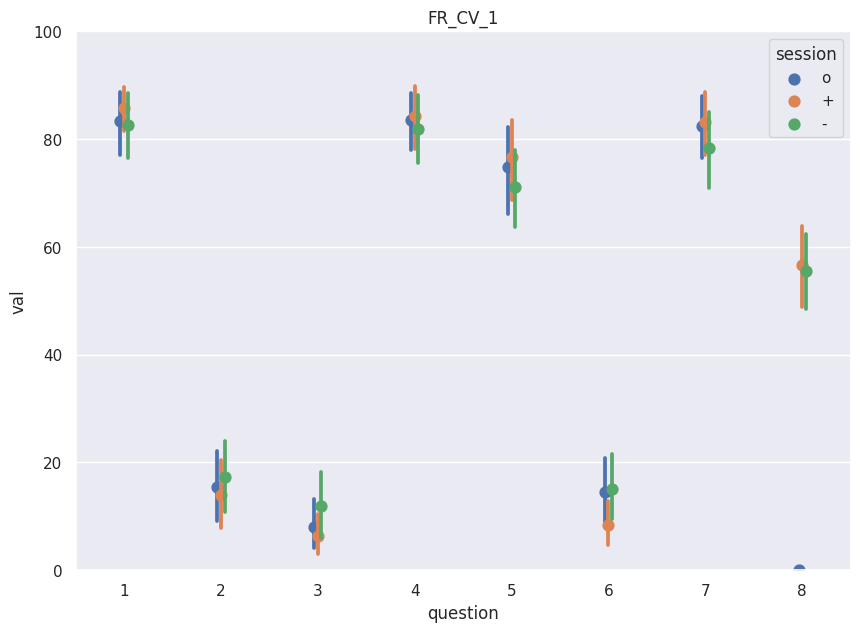

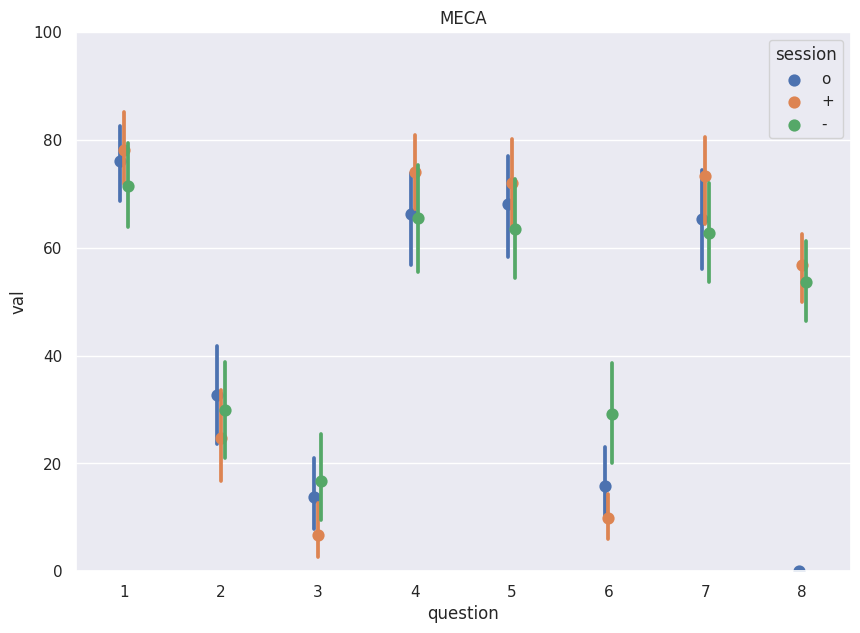

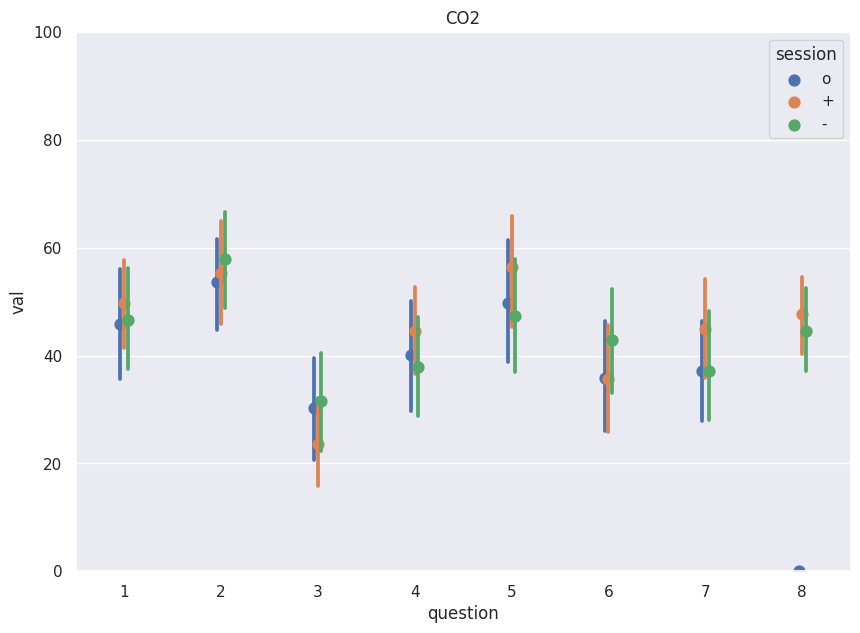

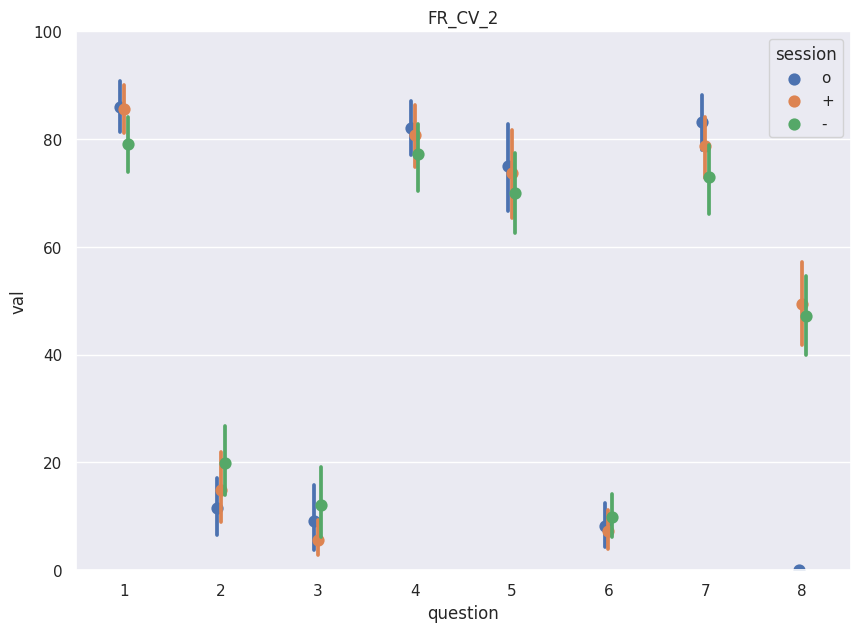

In [ ]:
for cond in conditions:
    df_plot = df_q[df_q['cond'] == cond]
    sns.pointplot(data=df_plot, x="question", y="val", hue="session", errorbar='sd', linestyles='none', dodge=True).set(title=cond)
    sns.set(rc={'figure.figsize':(10,7)})
    plt.ylim(0, 100)
    plt.show()

In [ ]:
df_q

,sujet,session,cond,question,raw_val,scale,val,select_best
0,PD01,o,FR_CV_1,1,6.9,15.9,43.396226,YES
1,PD01,o,FR_CV_1,2,9.8,15.9,61.635220,YES
2,PD01,o,FR_CV_1,3,9.3,15.9,58.490566,YES
3,PD01,o,FR_CV_1,4,6.2,15.9,38.993711,YES
4,PD01,o,FR_CV_1,5,7.9,15.9,49.685535,YES
...,...,...,...,...,...,...,...,...
3163,MA33,-,FR_CV_2,4,7.5,15.6,48.076923,YES
3164,MA33,-,FR_CV_2,5,0,15.6,0.000000,YES
3165,MA33,-,FR_CV_2,6,2.7,15.6,17.307692,YES
3166,MA33,-,FR_CV_2,7,7.2,15.6,46.153846,YES


## COND

/crnldata/cmo/multisite/DATA_MANIP/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:382: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predictor).std()[outcome].reset_index()[outcome].rename('sd')], axis = 1).round(2).set_index(predictor)
/crnldata/cmo/multisite/DATA_MANIP/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:382: FutureWarning: The default value of numeric_only in DataFrameGroupBy.std is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predictor).std()[outcome].reset_index()[outcome].rena

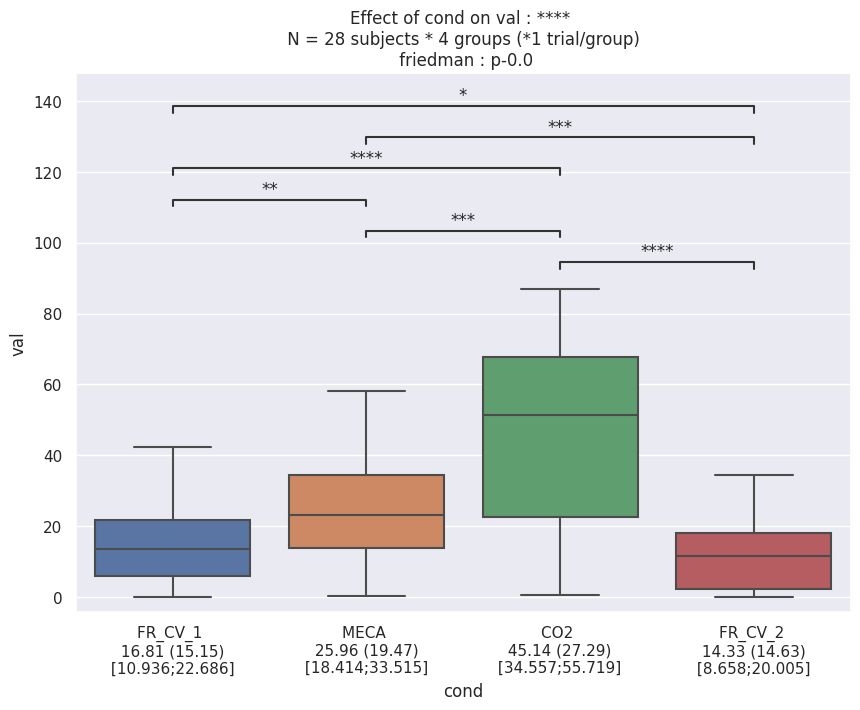

In [67]:
predictor = 'cond' 
outcome = 'val'
df_stats = df_stai.query(f"session == 'o'")
fig, ax = plt.subplots()
ax = auto_stats(df_stats, predictor, outcome, ax=ax, subject='sujet', design='within', mode='box', transform=False, verbose=True, order=None)

/crnldata/cmo/multisite/DATA_MANIP/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:382: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predictor).std()[outcome].reset_index()[outcome].rename('sd')], axis = 1).round(2).set_index(predictor)
/crnldata/cmo/multisite/DATA_MANIP/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:382: FutureWarning: The default value of numeric_only in DataFrameGroupBy.std is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predictor).std()[outcome].reset_index()[outcome].rena

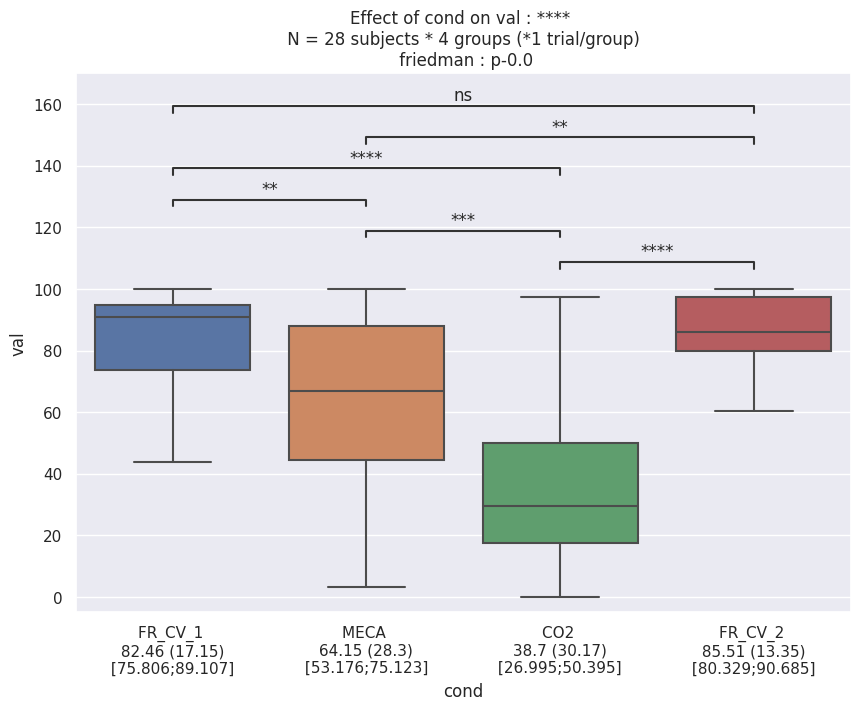

In [ ]:
predictor = 'cond' 
outcome = 'val'
df_stats = df_relax.query(f"session == 'o'")
fig, ax = plt.subplots()
ax = auto_stats(df_stats, predictor, outcome, ax=ax, subject='sujet', design='within', mode='box', transform=False, verbose=True, order=None)

## ODOR

In [53]:
sel_vec = []
for row_i in range(df_q.shape[0]):
    if df_q['sujet'][row_i] in sujet_best_list:
        sel_vec.append('YES')
    else:
        sel_vec.append('NO')

df_q['select_best'] = sel_vec
df_intensity = df_q.query(f"question == 8 and session in ['+', '-']")
df_intensity = df_intensity[['sujet', 'session', 'cond', 'val', 'select_best']].query(f"sujet in {sujet_list_balanced_rev.tolist()}")
df_intensity

,sujet,session,cond,val,select_best
39,PD01,+,FR_CV_1,61.783439,YES
47,PD01,+,MECA,68.152866,YES
55,PD01,+,CO2,53.503185,YES
63,PD01,+,FR_CV_2,66.242038,YES
71,PD01,-,FR_CV_1,75.159236,YES
...,...,...,...,...,...
3135,MA33,+,FR_CV_2,0.000000,YES
3143,MA33,-,FR_CV_1,60.000000,YES
3151,MA33,-,MECA,70.967742,YES
3159,MA33,-,CO2,62.820513,YES


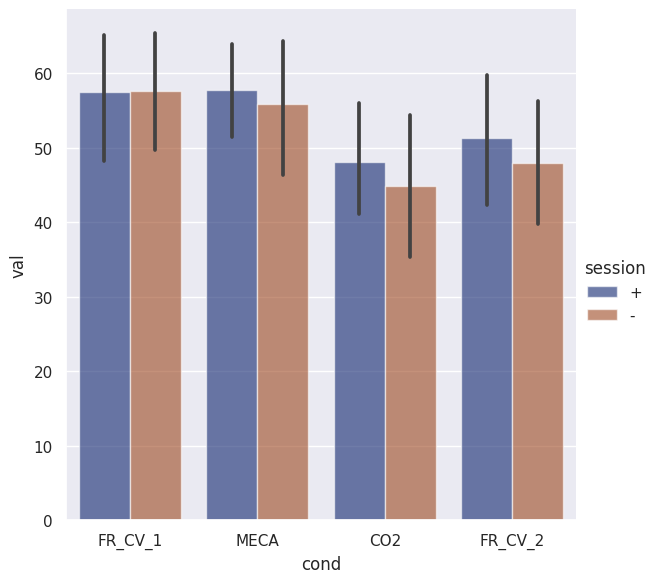

In [54]:
sns.catplot(data=df_intensity, kind="bar", x="cond", y="val", hue="session", palette="dark", alpha=.6, height=6)

/crnldata/cmo/multisite/DATA_MANIP/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:382: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predictor).std()[outcome].reset_index()[outcome].rename('sd')], axis = 1).round(2).set_index(predictor)
/crnldata/cmo/multisite/DATA_MANIP/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:382: FutureWarning: The default value of numeric_only in DataFrameGroupBy.std is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predictor).std()[outcome].reset_index()[outcome].rena

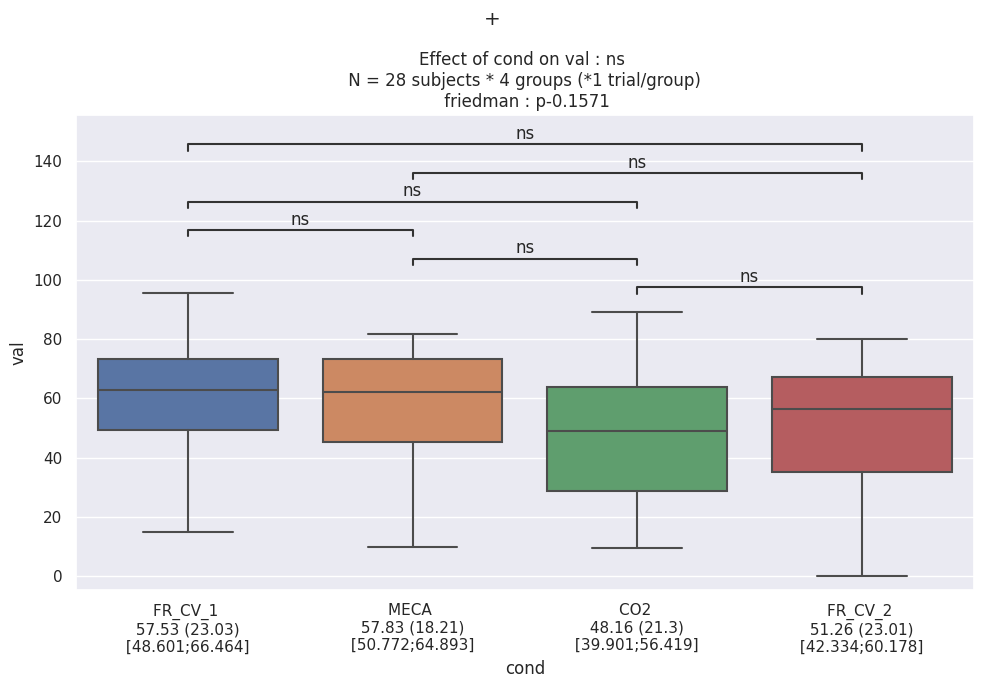

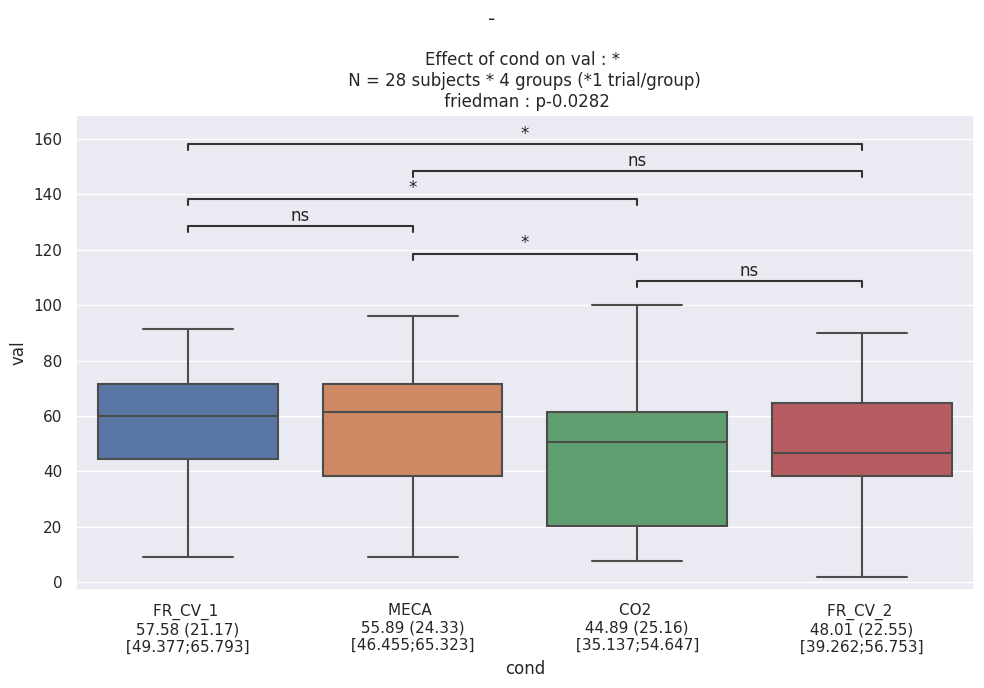

In [68]:
predictor = 'cond' 
outcome = 'val'
for odor in ['+', '-']:
    df_stats = df_intensity.query(f"session == '{odor}'")
    fig, ax = plt.subplots()
    ax = auto_stats(df_stats, predictor, outcome, ax=ax, subject='sujet', design='within', mode='box', transform=False, verbose=True, order=None)
    plt.suptitle(odor)
    plt.tight_layout()

(0.0, 100.0)

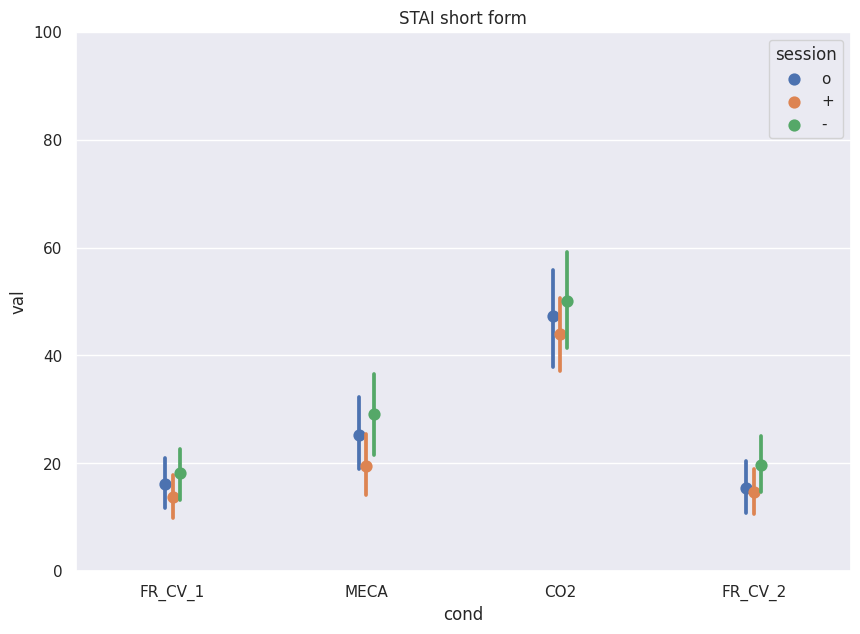

In [ ]:
sns.pointplot(data=df_stai, x="cond", y="val", hue="session", errorbar='sd', linestyles='none', dodge=True).set(title='STAI short form')
sns.set(rc={'figure.figsize':(10,7)})
plt.ylim(0, 100)

In [ ]:
df_stai

,sujet,session,cond,val
0,PD01,o,FR_CV_1,55.765199
1,PD01,o,MECA,69.287212
2,PD01,o,CO2,77.044025
3,PD01,o,FR_CV_2,45.702306
4,PD01,+,FR_CV_1,44.055202
...,...,...,...,...
391,MA33,+,FR_CV_2,17.634409
392,MA33,-,FR_CV_1,8.279570
393,MA33,-,MECA,66.774194
394,MA33,-,CO2,63.247863


/crnldata/cmo/multisite/DATA_MANIP/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:382: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predictor).std()[outcome].reset_index()[outcome].rename('sd')], axis = 1).round(2).set_index(predictor)
/crnldata/cmo/multisite/DATA_MANIP/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:382: FutureWarning: The default value of numeric_only in DataFrameGroupBy.std is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predictor).std()[outcome].reset_index()[outcome].rena

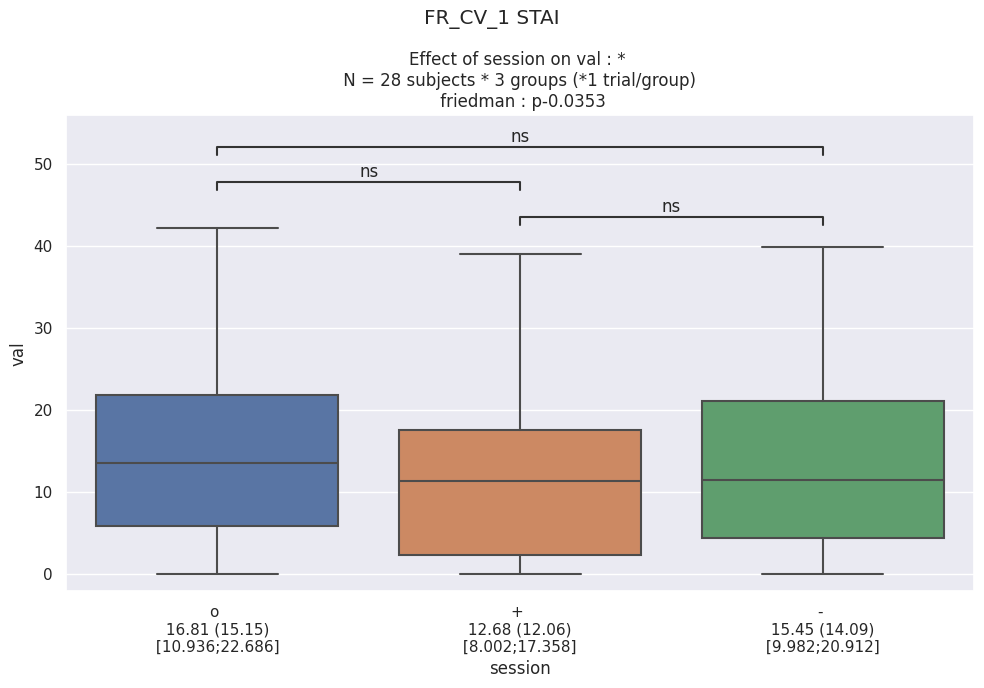

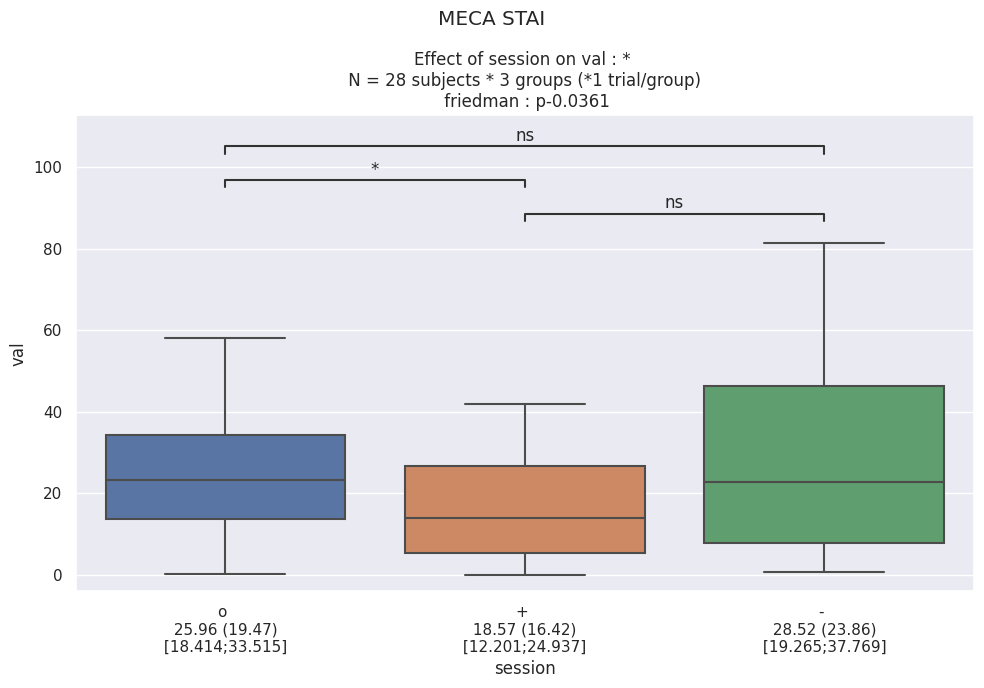

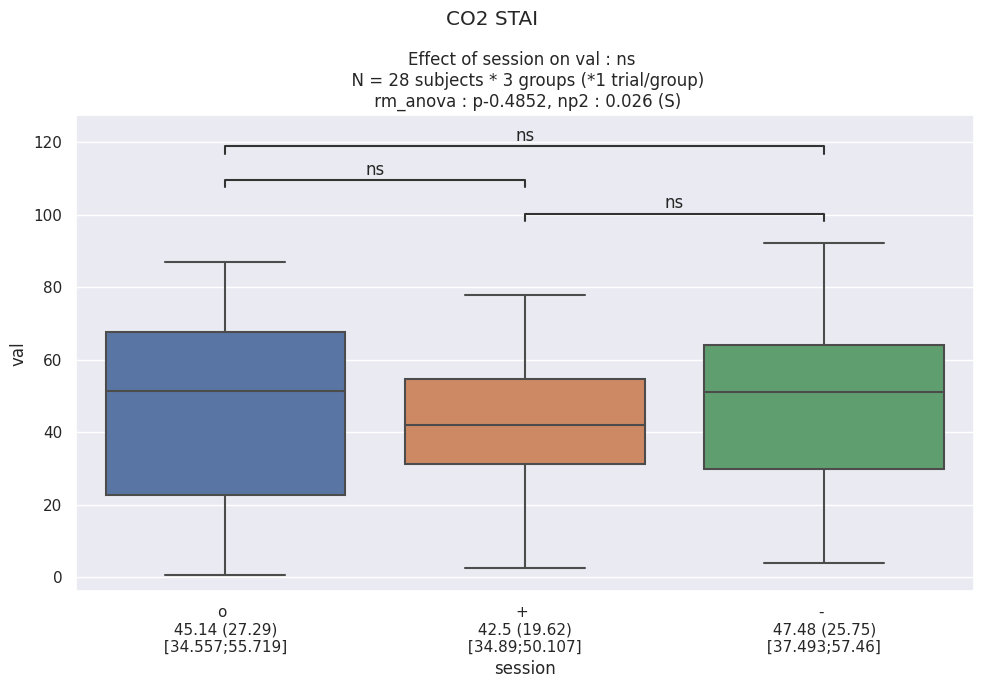

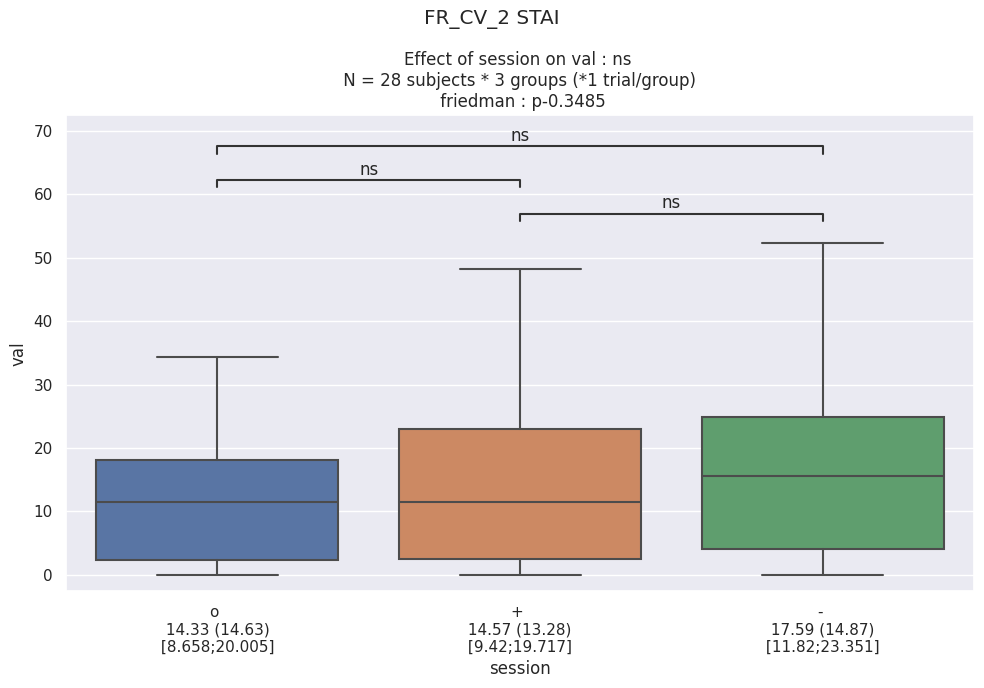

In [70]:
predictor = 'session' 
outcome = 'val'
for cond in conditions:
    df_stats = df_stai.query(f"cond == '{cond}'")
    fig, ax = plt.subplots()
    ax = auto_stats(df_stats, predictor, outcome, ax=ax, subject='sujet', design='within', mode='box', transform=False, verbose=True, order=None)
    
    plt.suptitle(f"{cond} STAI")
    plt.tight_layout()

(0.0, 100.0)

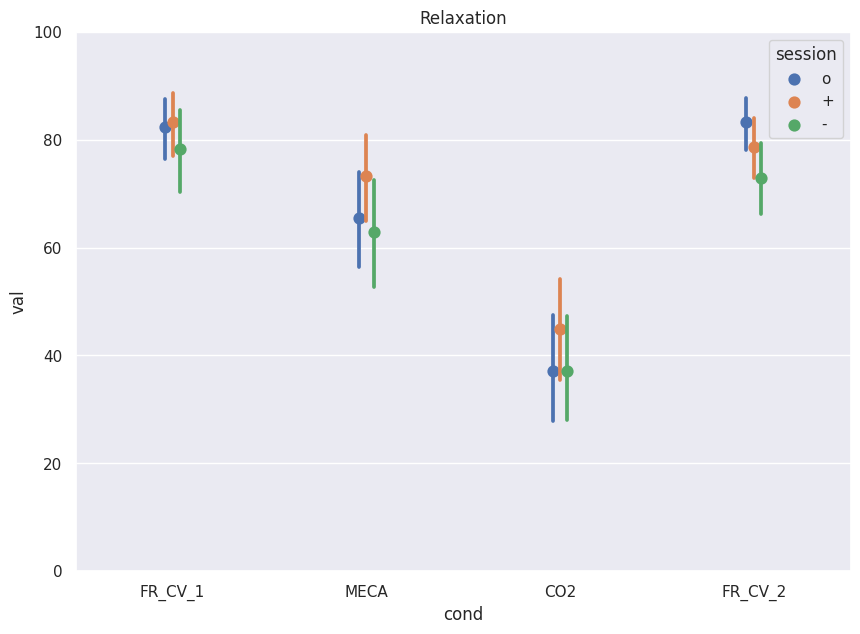

In [ ]:
df_plot = df_q.query("question == 7")
sns.pointplot(data=df_plot, x="cond", y="val", hue="session", errorbar='sd', linestyles='none', dodge=True).set(title='Relaxation')
sns.set(rc={'figure.figsize':(10,7)})
plt.ylim(0, 100)

In [73]:
df_relax

,sujet,session,cond,val
6,PD01,o,FR_CV_1,45.283019
14,PD01,o,MECA,16.981132
22,PD01,o,CO2,13.207547
30,PD01,o,FR_CV_2,60.377358
38,PD01,+,FR_CV_1,53.503185
...,...,...,...,...
3134,MA33,+,FR_CV_2,90.322581
3142,MA33,-,FR_CV_1,100.000000
3150,MA33,-,MECA,32.258065
3158,MA33,-,CO2,23.076923


/crnldata/cmo/multisite/DATA_MANIP/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:382: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predictor).std()[outcome].reset_index()[outcome].rename('sd')], axis = 1).round(2).set_index(predictor)
/crnldata/cmo/multisite/DATA_MANIP/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:382: FutureWarning: The default value of numeric_only in DataFrameGroupBy.std is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predictor).std()[outcome].reset_index()[outcome].rena

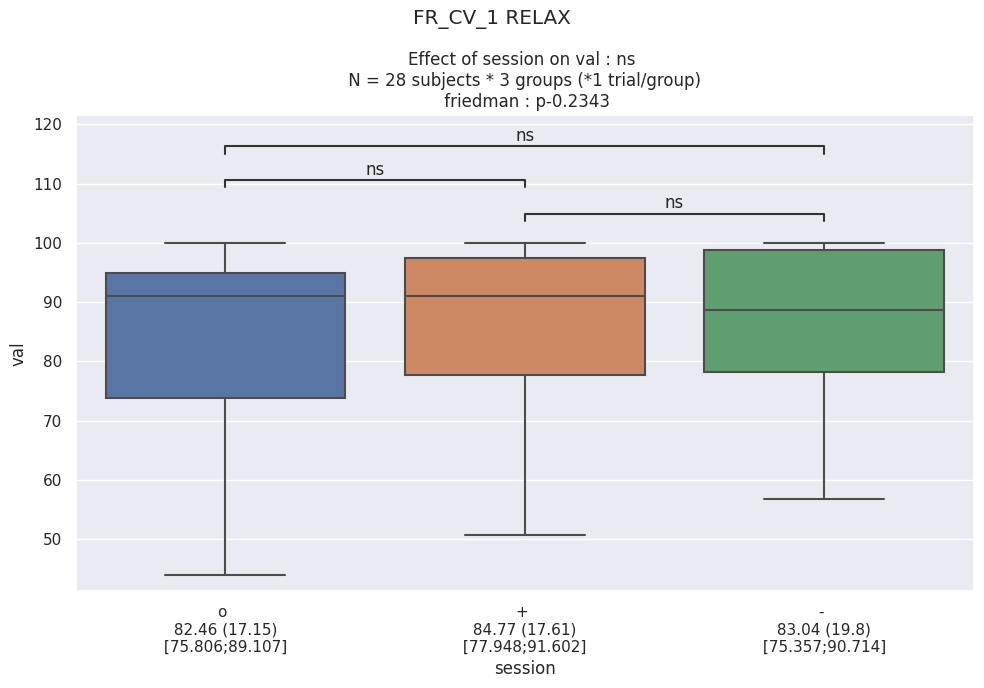

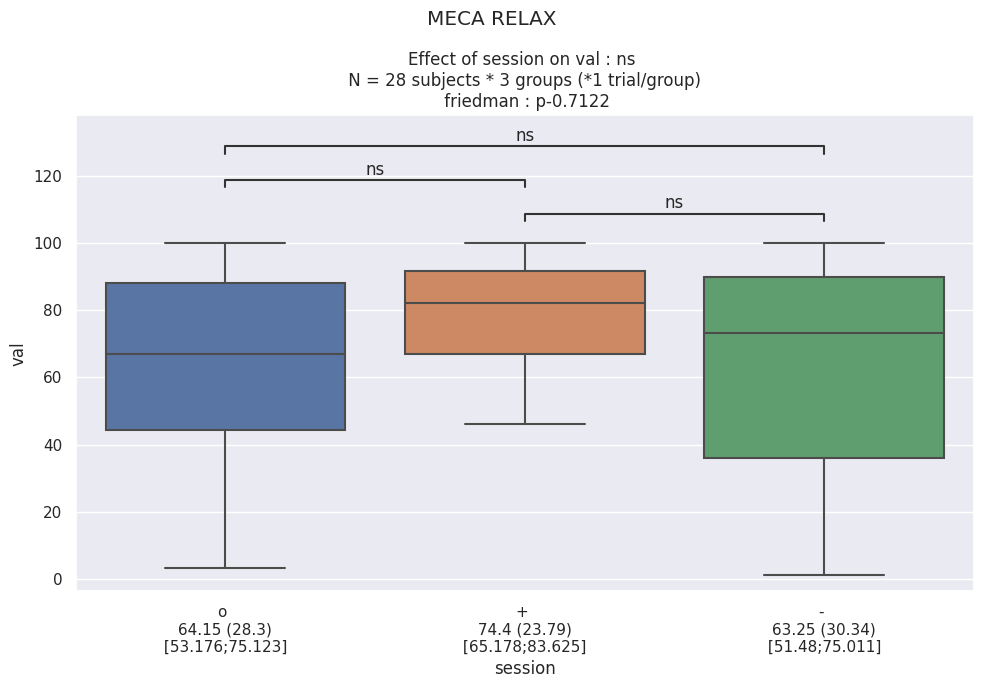

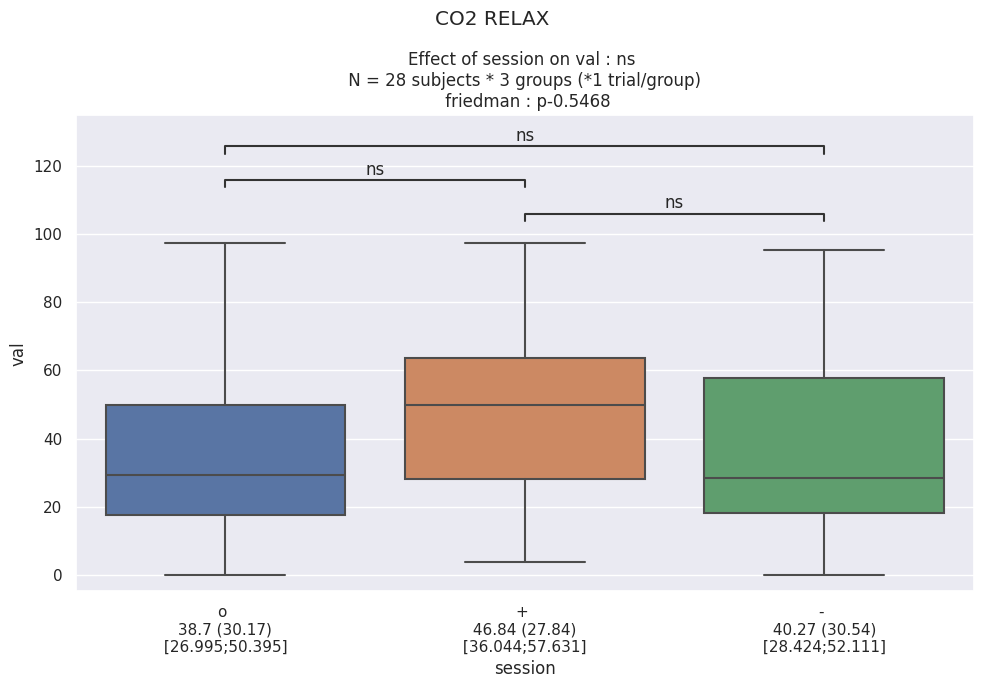

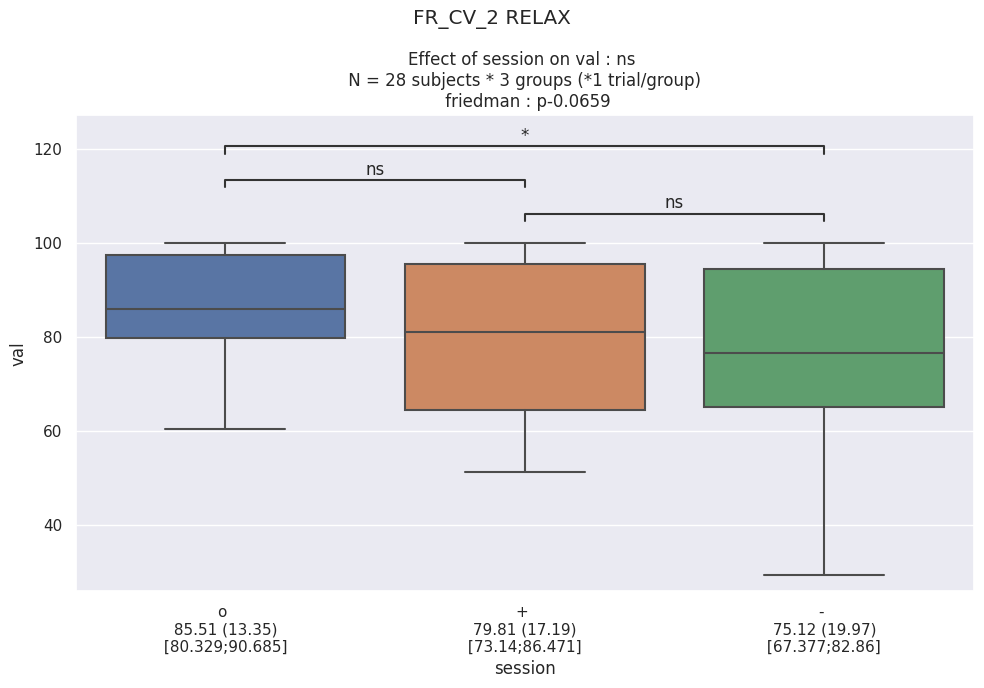

In [74]:
predictor = 'session' 
outcome = 'val'
for cond in conditions:
    df_stats = df_relax.query(f"cond == '{cond}'")
    fig, ax = plt.subplots()
    ax = auto_stats(df_stats, predictor, outcome, ax=ax, subject='sujet', design='within', mode='box', transform=False, verbose=True, order=None)

    plt.suptitle(f"{cond} RELAX")
    plt.tight_layout()

# MAIA Analysis

In [ ]:
df_MAIA

,sujet,aspect,value,rep
0,01PD,Noticing,3.250000,+
1,01PD,Not_Distracting,2.666667,+
2,01PD,Not_Worrying,1.666667,+
3,01PD,Attention_Regulation,2.857143,+
4,01PD,Emotional_Awareness,4.000000,+
...,...,...,...,...
227,33MA,Attention_Regulation,3.714286,+
228,33MA,Emotional_Awareness,3.000000,+
229,33MA,Self_Regulation,3.500000,+
230,33MA,Body_Listening,4.000000,+


In [ ]:
df_MAIA_balanced = df_MAIA.query(f"sujet in {[f'{sujet[2:]}{sujet[:2]}' for sujet in sujet_list_balanced]}")


(array([0, 1, 2, 3, 4, 5, 6, 7]),
 [Text(0, 0, 'Noticing'),
  Text(1, 0, 'Not_Distracting'),
  Text(2, 0, 'Not_Worrying'),
  Text(3, 0, 'Attention_Regulation'),
  Text(4, 0, 'Emotional_Awareness'),
  Text(5, 0, 'Self_Regulation'),
  Text(6, 0, 'Body_Listening'),
  Text(7, 0, 'Trusting')])

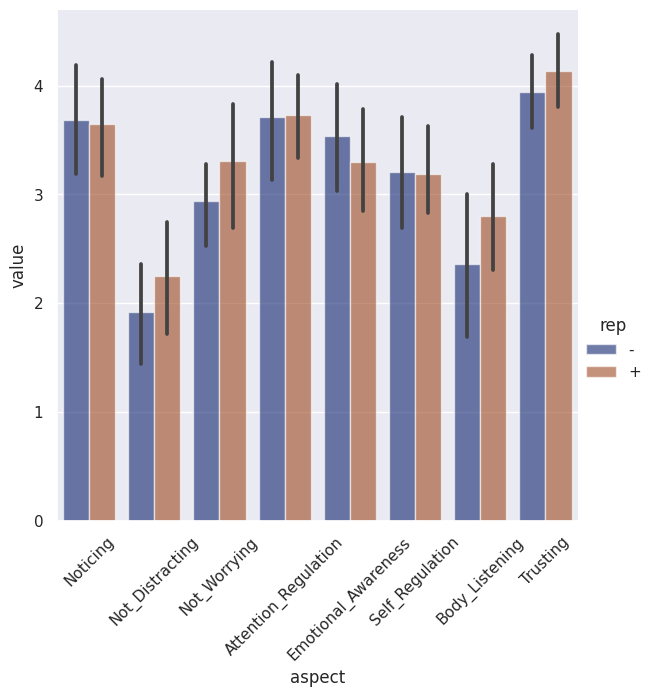

In [ ]:
sns.catplot(data=df_MAIA_balanced, kind="bar", x="aspect", y="value", hue="rep", palette="dark", alpha=.6, height=6)
plt.xticks(rotation=45)

In [ ]:
df_MAIA_balanced

,sujet,aspect,value,rep
16,04GB,Noticing,3.750000,-
17,04GB,Not_Distracting,1.666667,-
18,04GB,Not_Worrying,3.000000,-
19,04GB,Attention_Regulation,3.857143,-
20,04GB,Emotional_Awareness,4.000000,-
...,...,...,...,...
227,33MA,Attention_Regulation,3.714286,+
228,33MA,Emotional_Awareness,3.000000,+
229,33MA,Self_Regulation,3.500000,+
230,33MA,Body_Listening,4.000000,+


/crnldata/cmo/multisite/DATA_MANIP/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:382: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predictor).std()[outcome].reset_index()[outcome].rename('sd')], axis = 1).round(2).set_index(predictor)
/crnldata/cmo/multisite/DATA_MANIP/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:382: FutureWarning: The default value of numeric_only in DataFrameGroupBy.std is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predictor).std()[outcome].reset_index()[outcome].rena

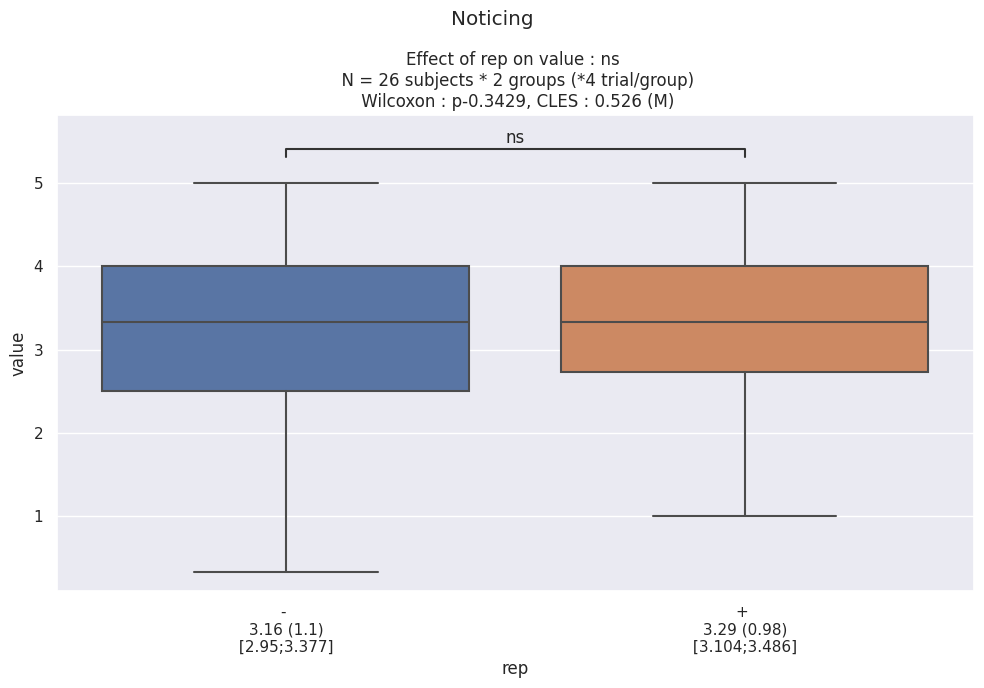

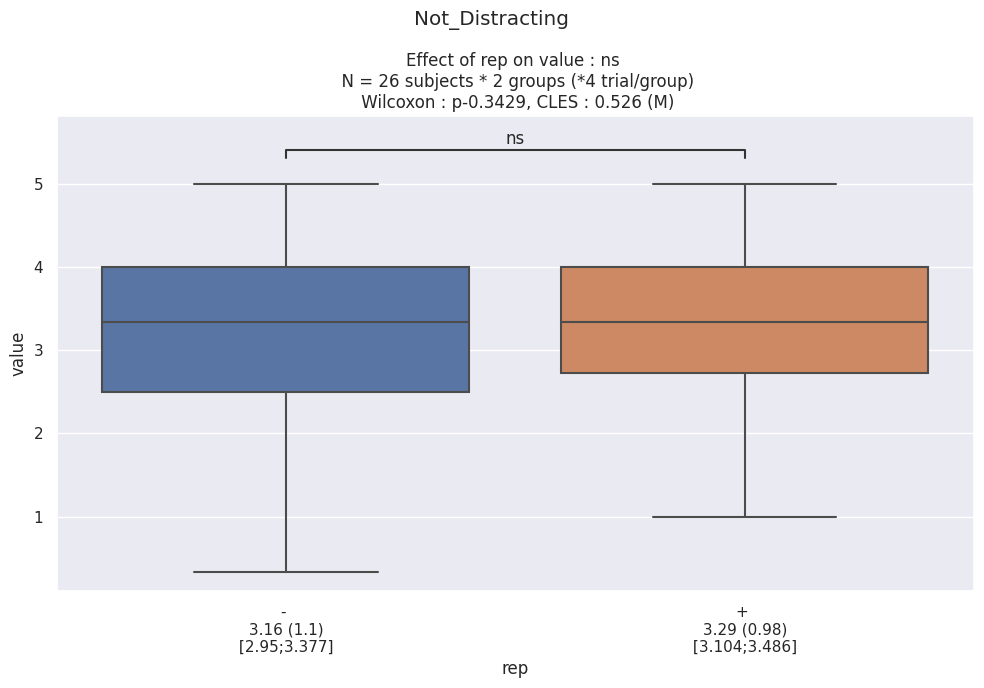

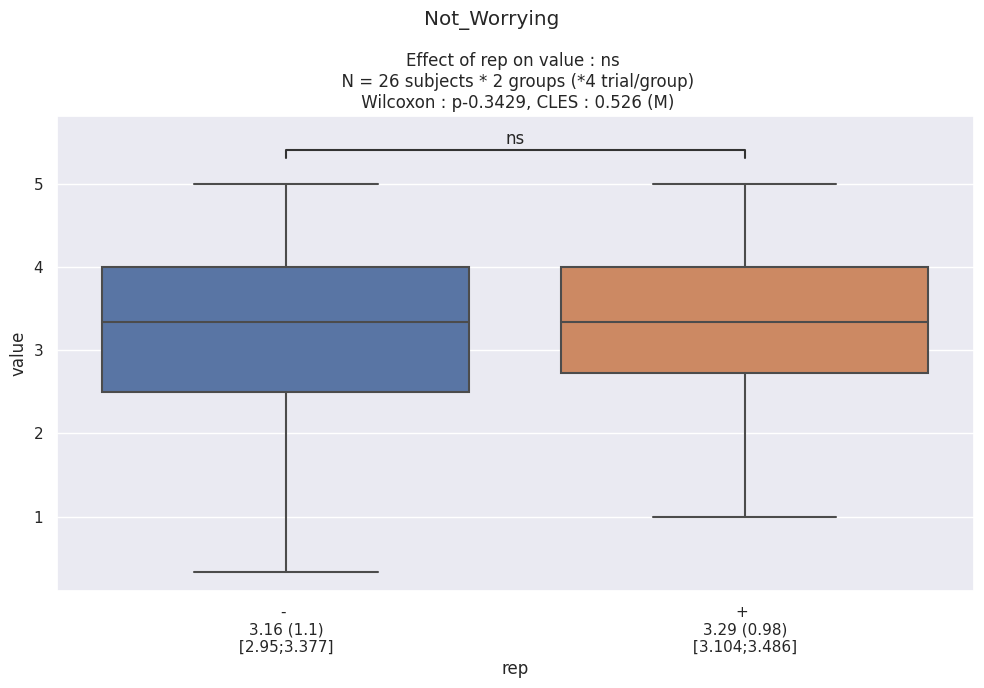

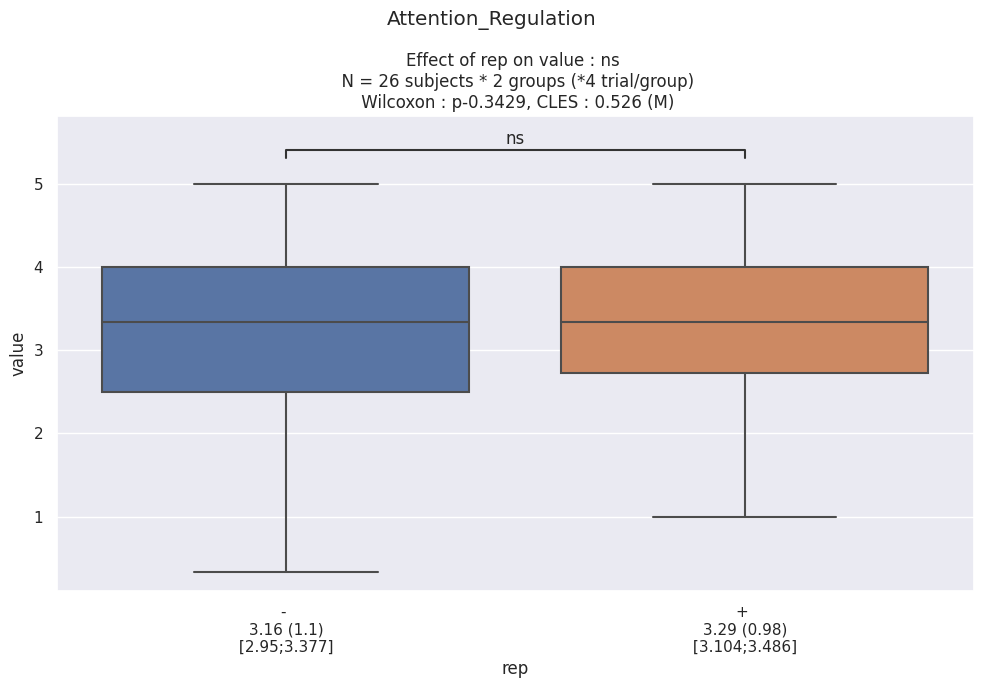

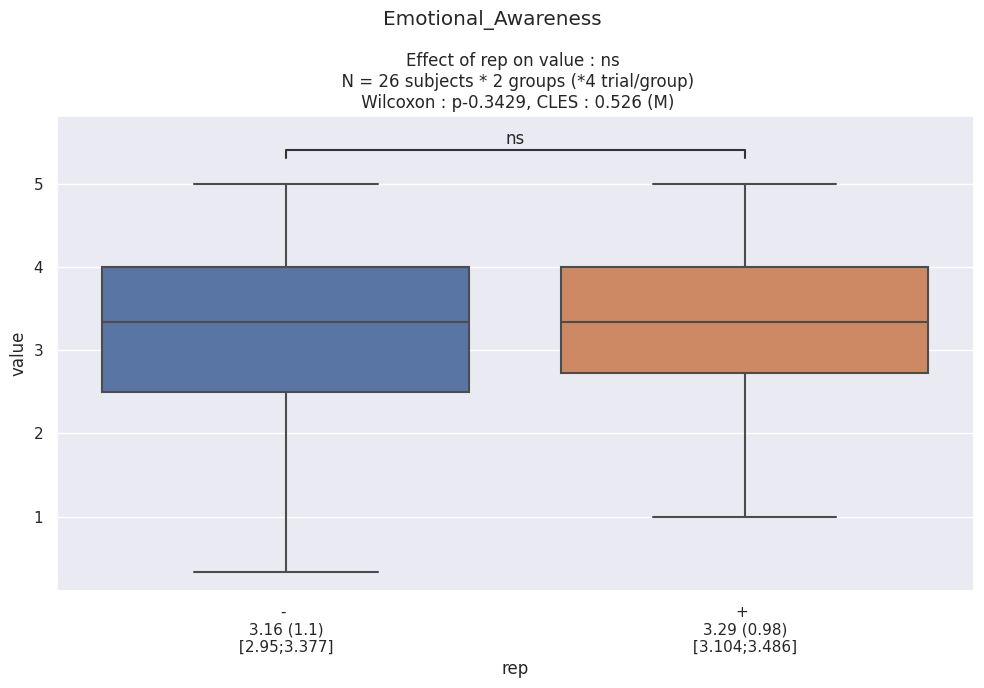

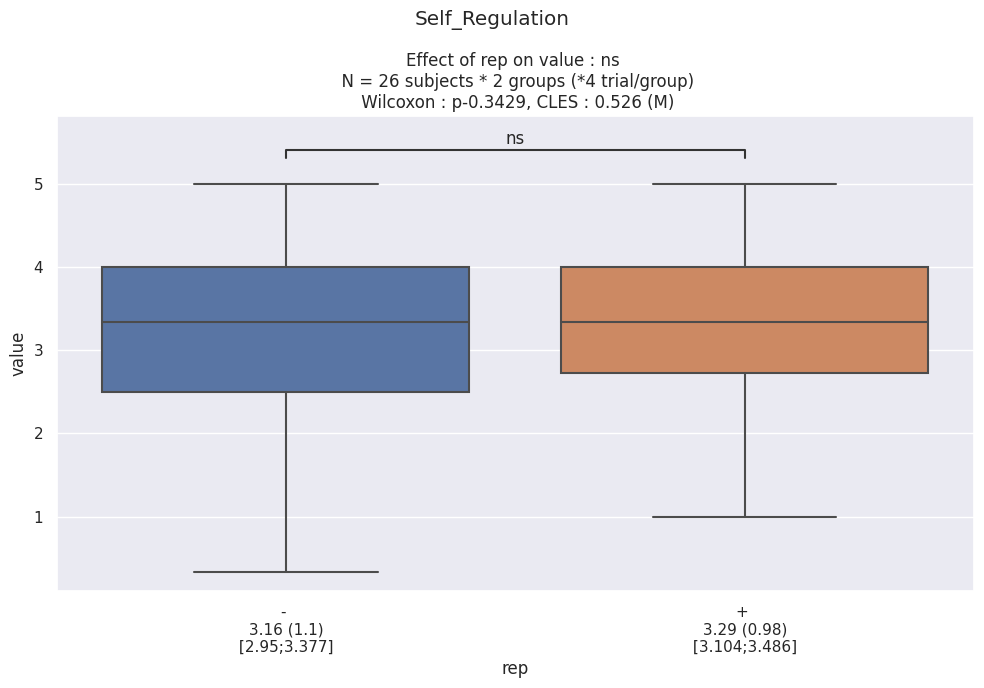

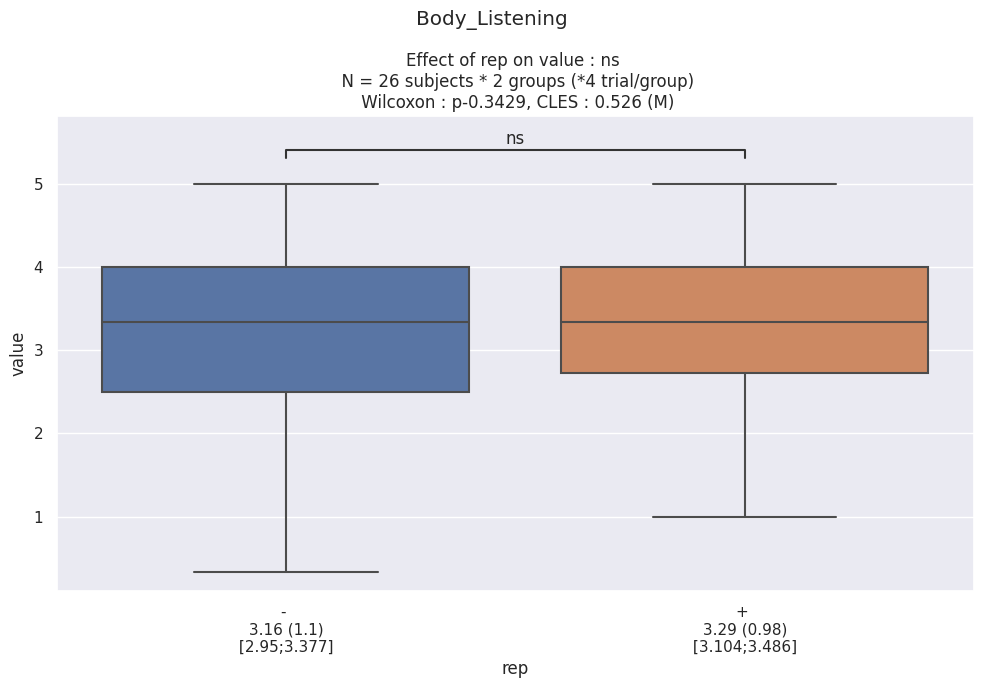

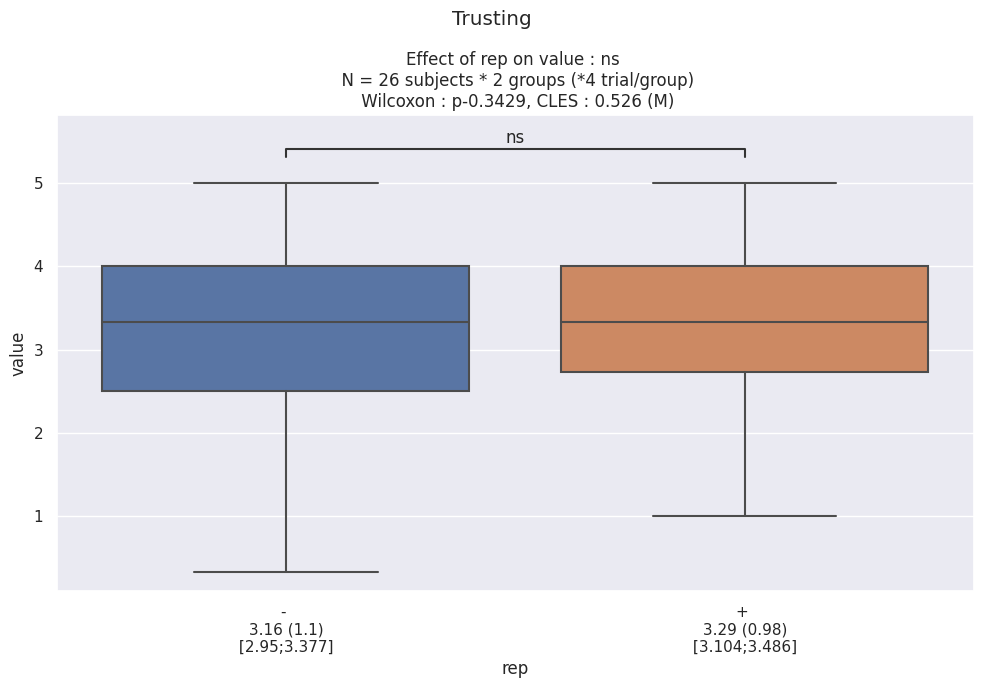

In [ ]:
predictor = 'rep' 
outcome = 'value'
for aspect in df_MAIA_balanced['aspect'].unique():
    df_stats = df_MAIA_balanced
    fig, ax = plt.subplots()
    ax = auto_stats(df_stats, predictor, outcome, ax=ax, subject='sujet', design='within', mode='box', transform=False, verbose=True, order=None)
    plt.suptitle(aspect)
    plt.tight_layout()

# Filter with intensity

<AxesSubplot: xlabel='val', ylabel='Count'>

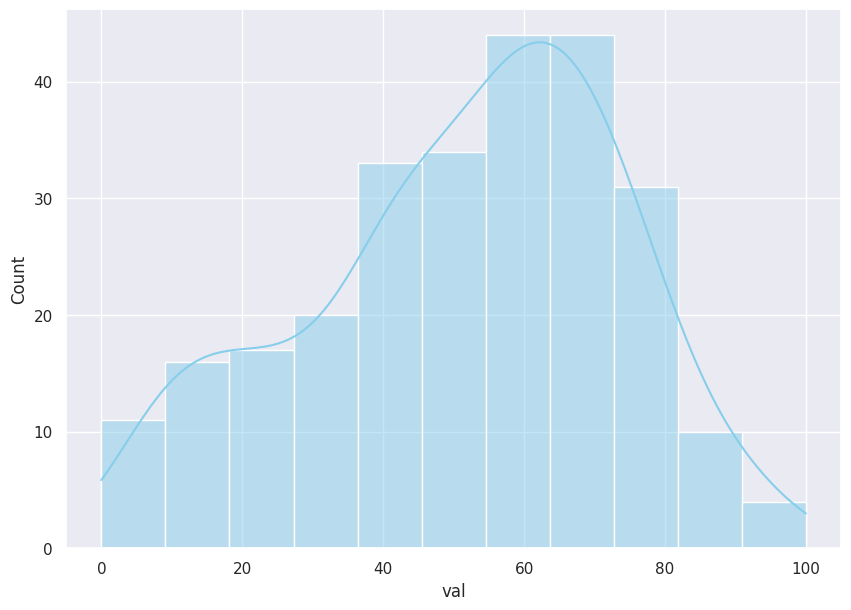

In [ ]:
df_plot = df_q.query("question == 8 & session in ['+', '-']")
sns.histplot(data=df_plot, x="val", label='MECA', color="skyblue", kde=True)

In [ ]:
seuil_odor_p = 30
seuil_odor_n = 50

sujet_p = []
for sujet in df_q['sujet'].unique():
    if (df_q.query(f"sujet == '{sujet}' & question == 8 & session in ['+', '-'] & cond in ['MECA', 'CO2']")['val'].values >= seuil_odor_p).all():
        sujet_p.append(sujet)

sujet_p = np.array(sujet_p)
print(sujet_p)

sujet_n = []
for sujet in df_q['sujet'].unique():
    if (df_q.query(f"sujet == '{sujet}' & question == 8 & session in ['+', '-'] & cond in ['MECA', 'CO2']")['val'].values < seuil_odor_n).all():
        sujet_n.append(sujet)

sujet_n = np.array(sujet_n)
print(sujet_n)

 

['PD01' 'GB04' 'TA09' 'BH10' 'MD14' 'LG15' 'GM16' 'TM19' 'DI22' 'TJ24'
 'DF25' 'MN26' 'BD27' 'NT28' 'AR30' 'MA33']
['MJ02' 'LV05' 'FA11' 'ZV21' 'LF23']


## MDP

(0.0, 10.0)

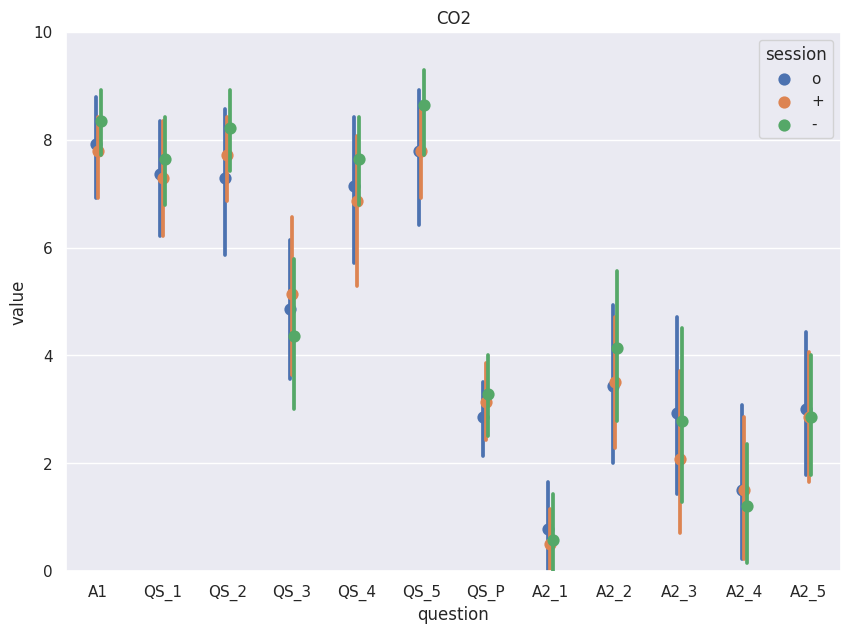

In [ ]:
df_plot = df_mdp.query(f"sujet in {sujet_p.tolist()} & cond == 'CO2'")
sns.pointplot(data=df_plot, x="question", y="value", hue="session", errorbar='sd', linestyles='none', dodge=True).set(title='CO2')
sns.set(rc={'figure.figsize':(10,7)})
plt.ylim(0, 10)

(0.0, 10.0)

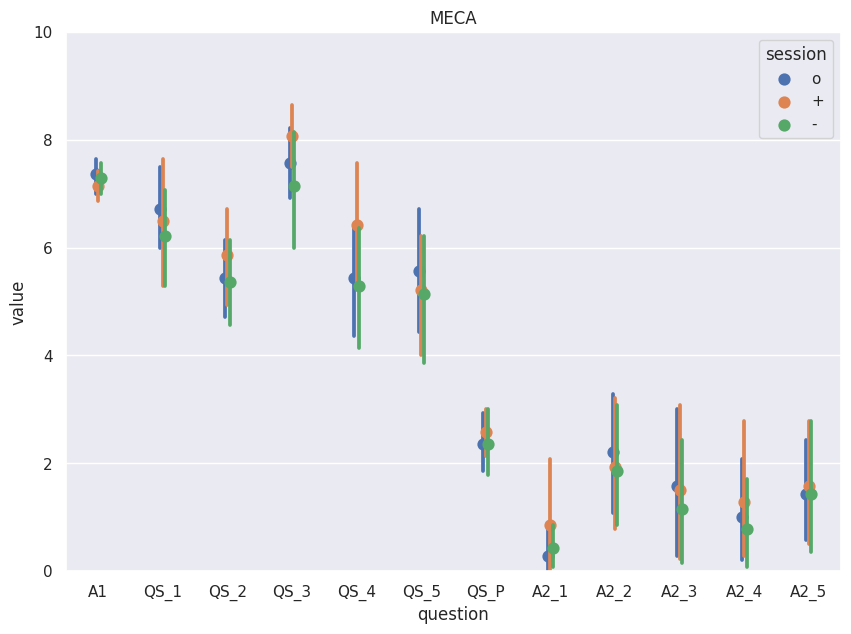

In [ ]:
df_plot = df_mdp.query(f"sujet in {sujet_p.tolist()} & cond == 'MECA'")
sns.pointplot(data=df_plot, x="question", y="value", hue="session", errorbar='sd', linestyles='none', dodge=True).set(title='MECA')
sns.set(rc={'figure.figsize':(10,7)})
plt.ylim(0, 10)

## Questionnaire

(0.0, 100.0)

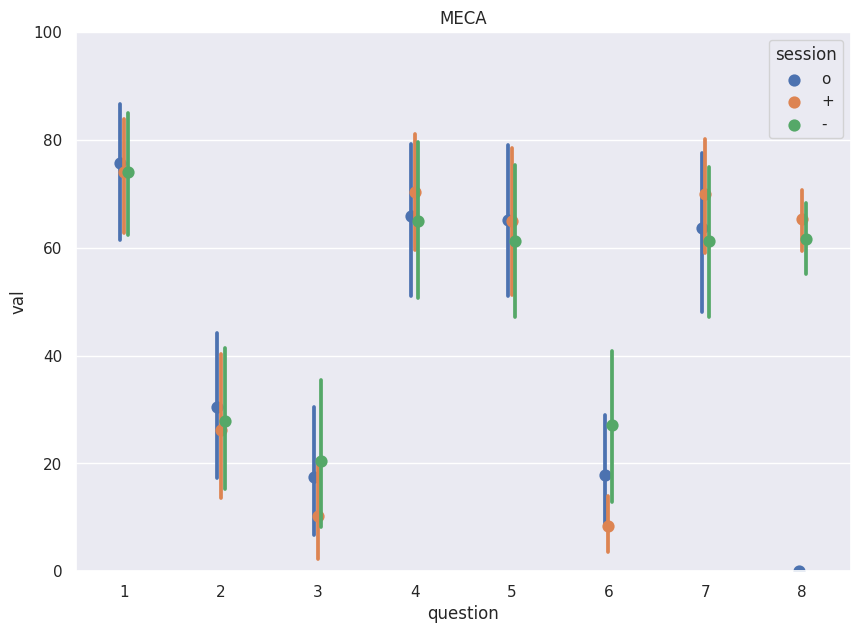

In [ ]:
df_plot = df_q.query(f"sujet in {sujet_p.tolist()} & cond == 'MECA'")
sns.pointplot(data=df_plot, x="question", y="val", hue="session", errorbar='sd', linestyles='none', dodge=True).set(title='MECA')
sns.set(rc={'figure.figsize':(10,7)})
plt.ylim(0, 100)

(0.0, 100.0)

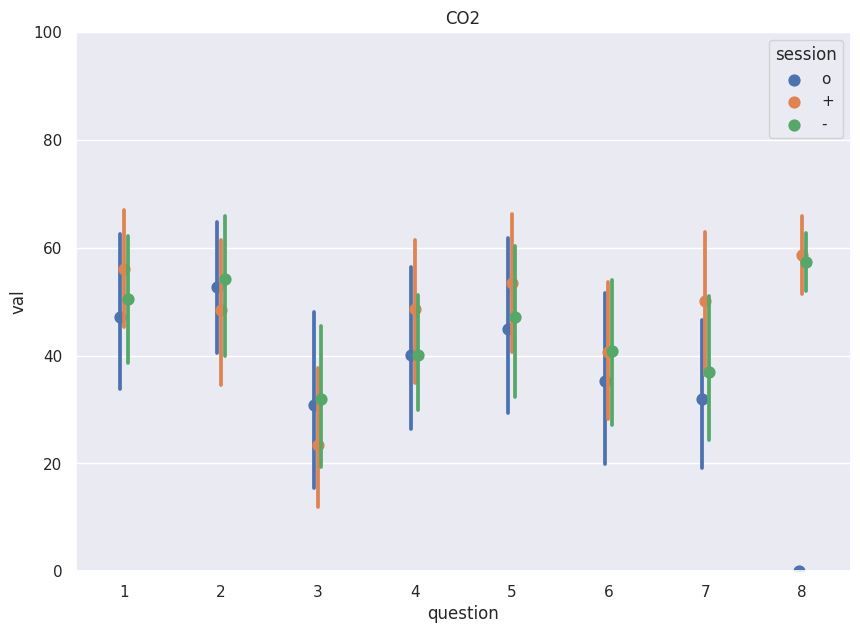

In [ ]:
df_plot = df_q.query(f"sujet in {sujet_p.tolist()} & cond == 'CO2'")
sns.pointplot(data=df_plot, x="question", y="val", hue="session", errorbar='sd', linestyles='none', dodge=True).set(title='CO2')
sns.set(rc={'figure.figsize':(10,7)})
plt.ylim(0, 100)

(0.0, 100.0)

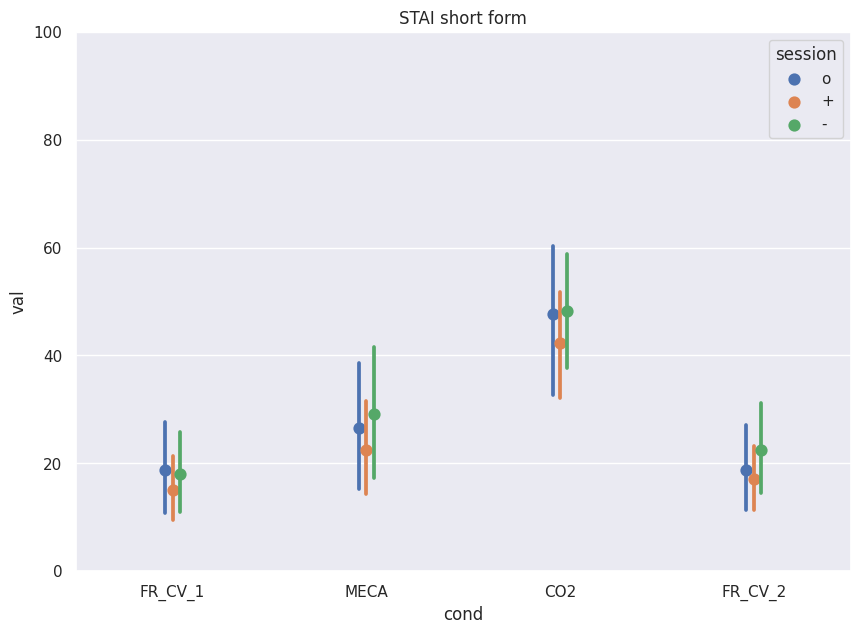

In [ ]:
df_plot = df_stai.query(f"sujet in {sujet_p.tolist()}")
sns.pointplot(data=df_plot, x="cond", y="val", hue="session", errorbar='sd', linestyles='none', dodge=True).set(title='STAI short form')
sns.set(rc={'figure.figsize':(10,7)})
plt.ylim(0, 100)

(0.0, 100.0)

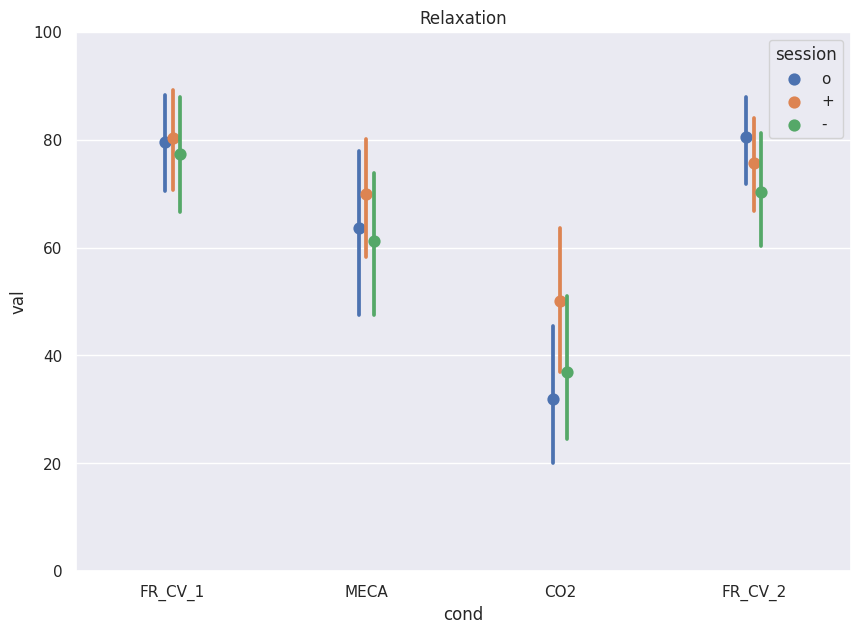

In [ ]:
df_plot = df_q.query(f"sujet in {sujet_p.tolist()} & question == 7")
sns.pointplot(data=df_plot, x="cond", y="val", hue="session", errorbar='sd', linestyles='none', dodge=True).set(title='Relaxation')
sns.set(rc={'figure.figsize':(10,7)})
plt.ylim(0, 100)

(0.0, 100.0)

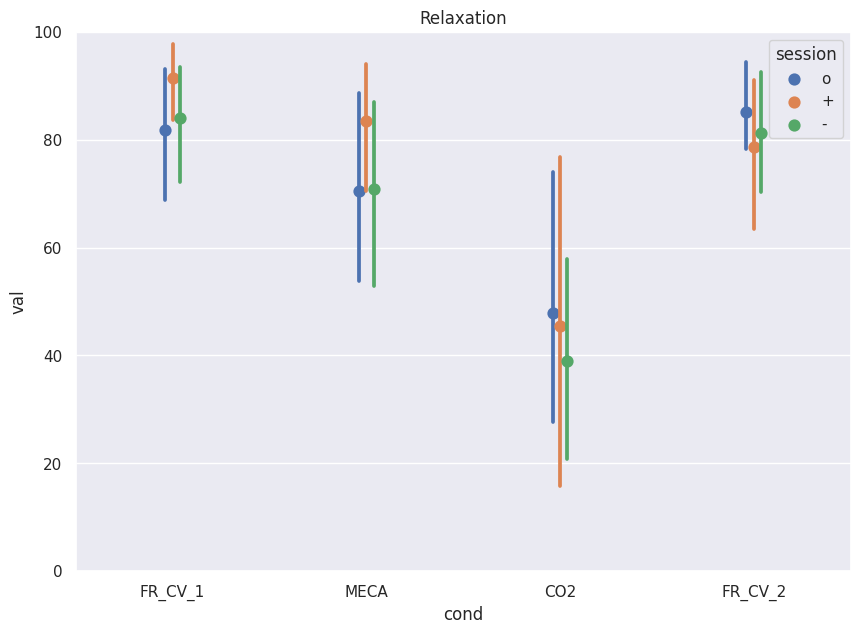

In [ ]:
df_plot = df_q.query(f"sujet in {sujet_n.tolist()} & question == 7")
sns.pointplot(data=df_plot, x="cond", y="val", hue="session", errorbar='sd', linestyles='none', dodge=True).set(title='Relaxation')
sns.set(rc={'figure.figsize':(10,7)})
plt.ylim(0, 100)

## MDP

In [ ]:
df_plot = df_mdp.query(f"sujet in {sujet_sel_best.tolist()} & cond == 'CO2'")
sns.pointplot(data=df_plot, x="question", y="value", hue="session", errorbar='sd', linestyles='none', dodge=True).set(title='CO2')
sns.set(rc={'figure.figsize':(10,7)})
plt.ylim(0, 10)

NameError: name 'sujet_sel_best' is not defined

(0.0, 10.0)

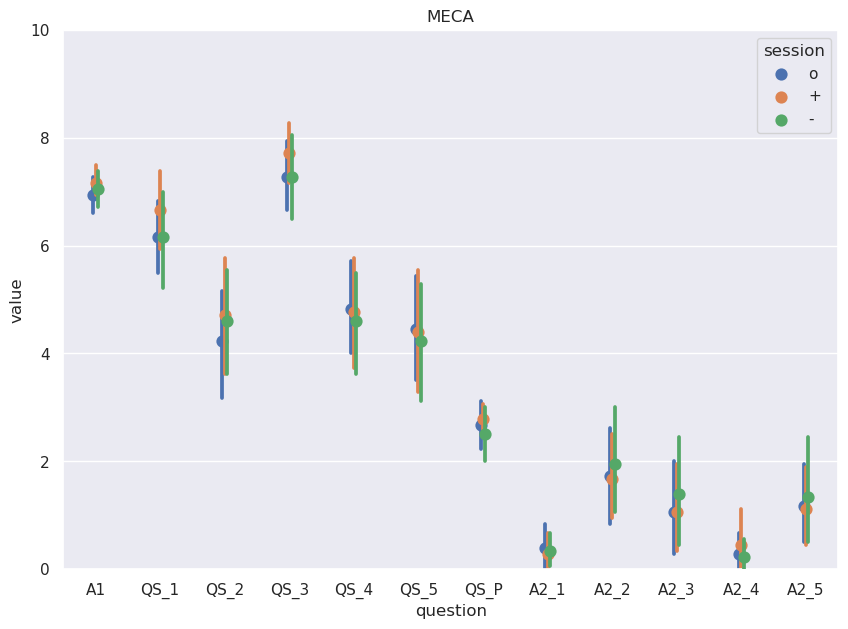

In [ ]:
df_plot = df_mdp.query(f"sujet in {sujet_sel_best.tolist()} & cond == 'MECA'")
sns.pointplot(data=df_plot, x="question", y="value", hue="session", errorbar='sd', linestyles='none', dodge=True).set(title='MECA')
sns.set(rc={'figure.figsize':(10,7)})
plt.ylim(0, 10)

## Questionnaire

(0.0, 100.0)

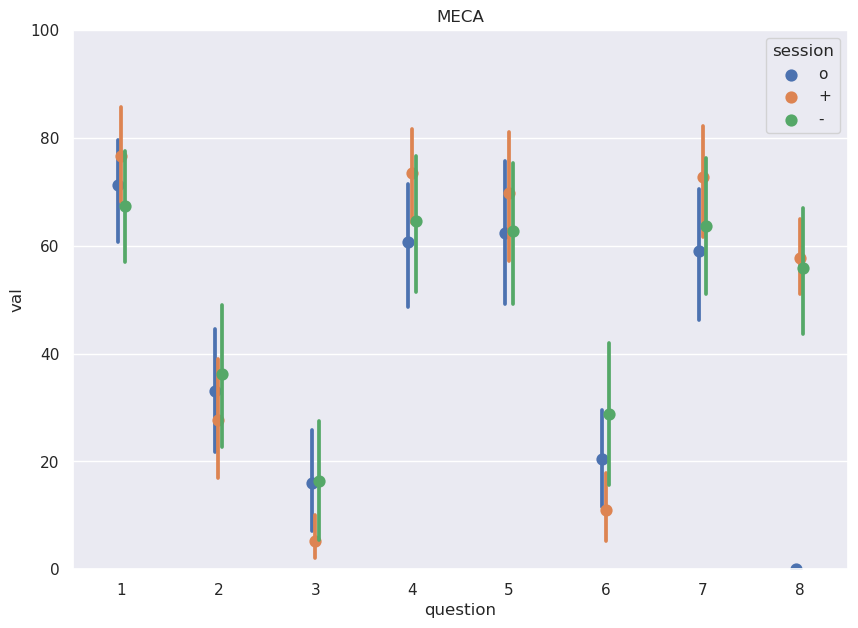

In [ ]:
df_plot = df_q.query(f"sujet in {sujet_sel_best.tolist()} & cond == 'MECA'")
sns.pointplot(data=df_plot, x="question", y="val", hue="session", errorbar='sd', linestyles='none', dodge=True).set(title='MECA')
sns.set(rc={'figure.figsize':(10,7)})
plt.ylim(0, 100)

(0.0, 100.0)

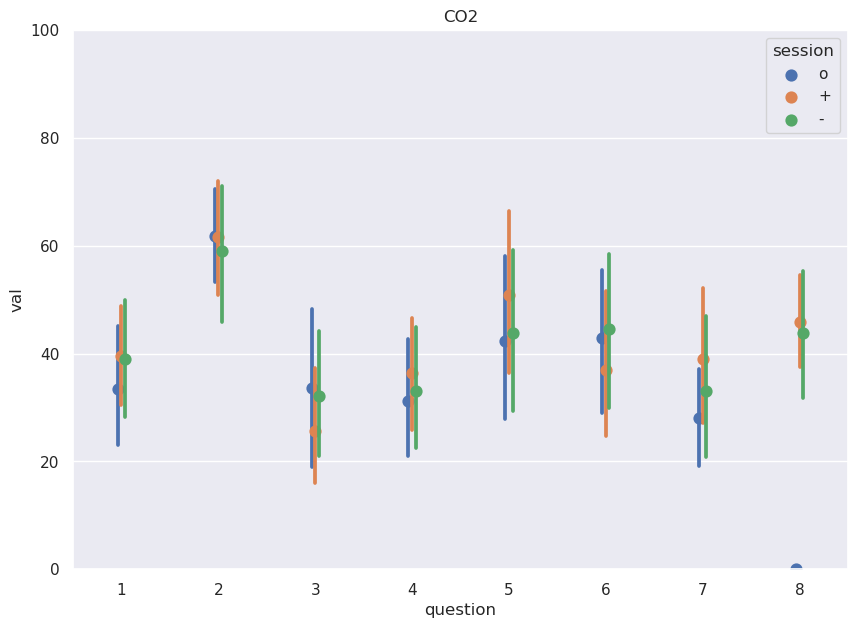

In [ ]:
df_plot = df_q.query(f"sujet in {sujet_sel_best.tolist()} & cond == 'CO2'")
sns.pointplot(data=df_plot, x="question", y="val", hue="session", errorbar='sd', linestyles='none', dodge=True).set(title='CO2')
sns.set(rc={'figure.figsize':(10,7)})
plt.ylim(0, 100)

(0.0, 100.0)

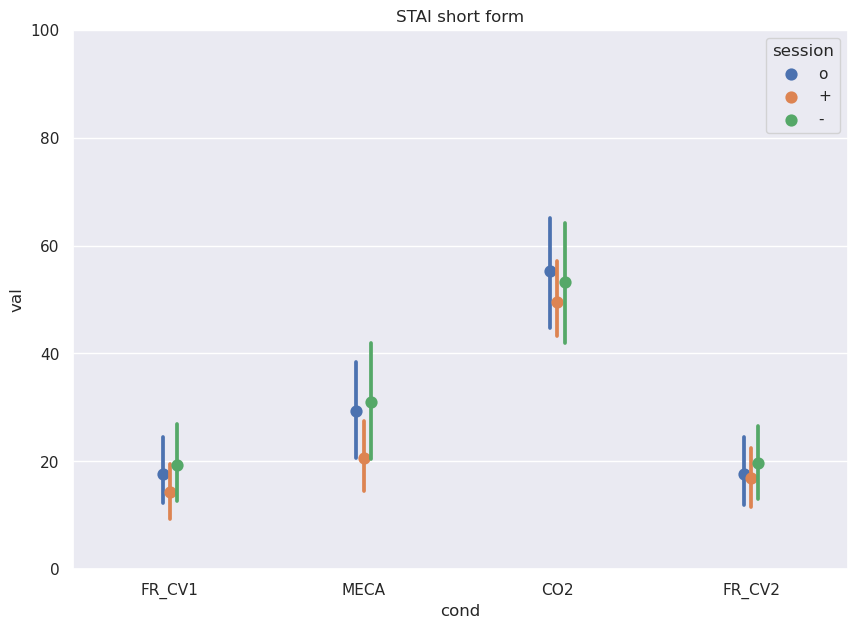

In [ ]:
df_plot = df_stai.query(f"sujet in {sujet_sel_best.tolist()}")
sns.pointplot(data=df_plot, x="cond", y="val", hue="session", errorbar='sd', linestyles='none', dodge=True).set(title='STAI short form')
sns.set(rc={'figure.figsize':(10,7)})
plt.ylim(0, 100)

(0.0, 100.0)

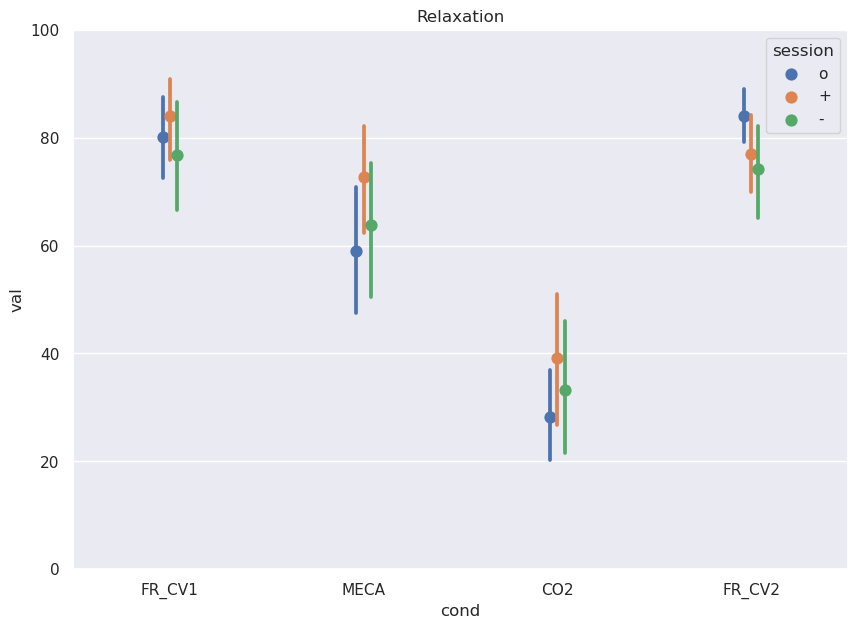

In [ ]:
df_plot = df_q.query(f"sujet in {sujet_sel_best.tolist()} & question == 7")
sns.pointplot(data=df_plot, x="cond", y="val", hue="session", errorbar='sd', linestyles='none', dodge=True).set(title='Relaxation')
sns.set(rc={'figure.figsize':(10,7)})
plt.ylim(0, 100)

(0.0, 100.0)

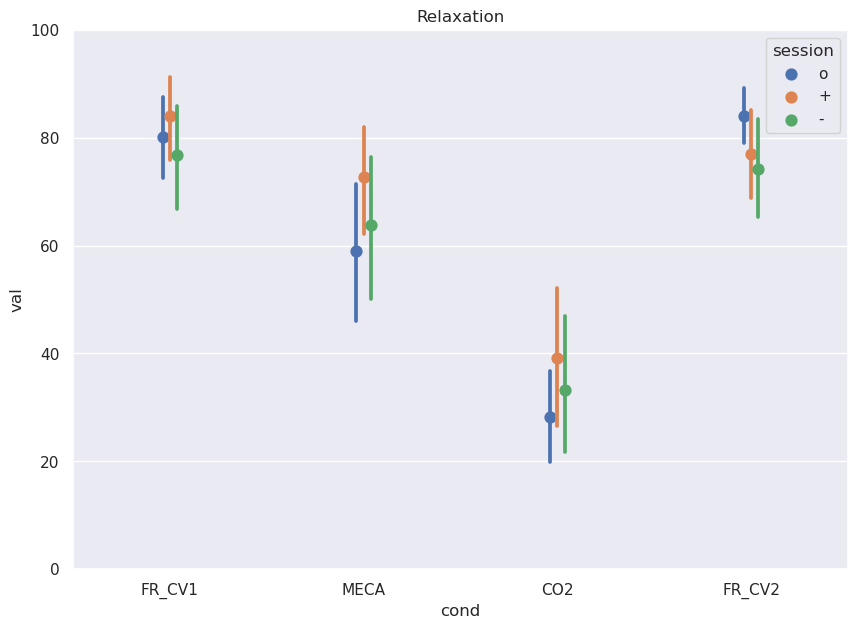

In [ ]:
df_plot = df_q.query(f"sujet in {sujet_sel_best.tolist()} & question == 7")
sns.pointplot(data=df_plot, x="cond", y="val", hue="session", errorbar='sd', linestyles='none', dodge=True).set(title='Relaxation')
sns.set(rc={'figure.figsize':(10,7)})
plt.ylim(0, 100)

# Correlation

## MAIA

In [ ]:
dict_regression_MAIA = {'sujet' : [], 'diff' : [], 'aspect' : [], 'value' : [], 'rep' : []}

for sujet in sujet_list_erp:

    sujet_rev = f"{sujet[2:]}{sujet[:2]}"

    for aspect in MAIA_aspects_list:
        
        dict_regression_MAIA['sujet'].append(sujet)
        _diff = (df_A2.query(f"cond == 'CO2' and session == 'o' and sujet == '{sujet_rev}'")['value'].values - df_A2.query(f"cond == 'CO2' and session == '+' and sujet == '{sujet_rev}'")['value'].values)[0]
        dict_regression_MAIA['diff'].append(_diff)
        dict_regression_MAIA['aspect'].append(aspect)
        dict_regression_MAIA['value'].append(df_MAIA.query(f"aspect == '{aspect}' and sujet == '{sujet}'")['value'].values[0])
        
        if sujet_rev in sujet_best_list:
            dict_regression_MAIA['rep'].append('+')
        else:
            dict_regression_MAIA['rep'].append('-')
            
df_reg_MAIA = pd.DataFrame(dict_regression_MAIA)
df_reg_MAIA

,sujet,diff,aspect,value,rep
0,01PD,0.4,Noticing,3.250000,+
1,01PD,0.4,Not_Distracting,2.666667,+
2,01PD,0.4,Not_Worrying,1.666667,+
3,01PD,0.4,Attention_Regulation,2.857143,+
4,01PD,0.4,Emotional_Awareness,4.000000,+
...,...,...,...,...,...
219,33MA,2.8,Attention_Regulation,3.714286,+
220,33MA,2.8,Emotional_Awareness,3.000000,+
221,33MA,2.8,Self_Regulation,3.500000,+
222,33MA,2.8,Body_Listening,4.000000,+


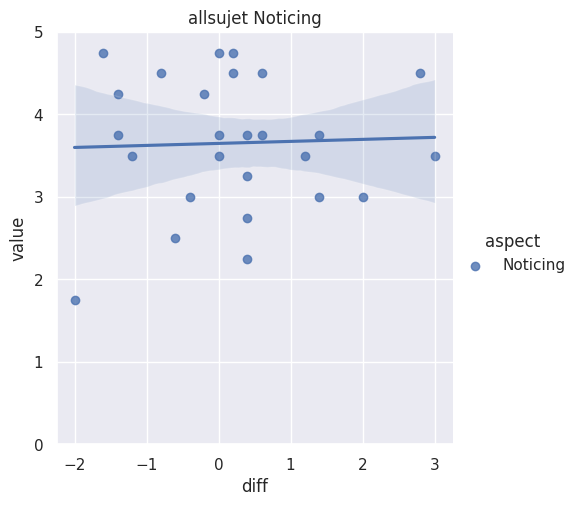

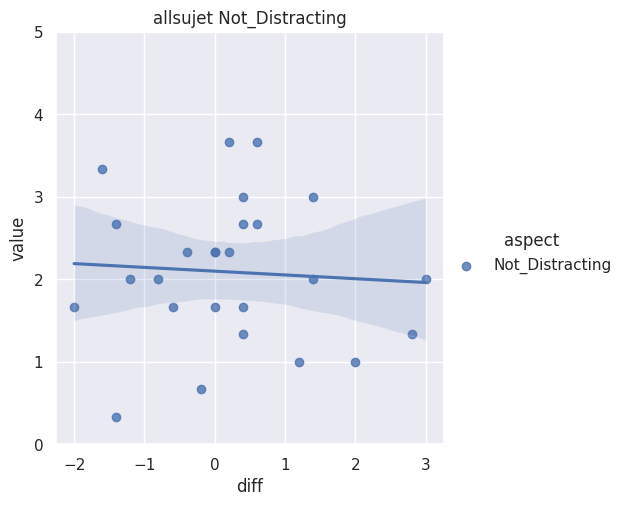

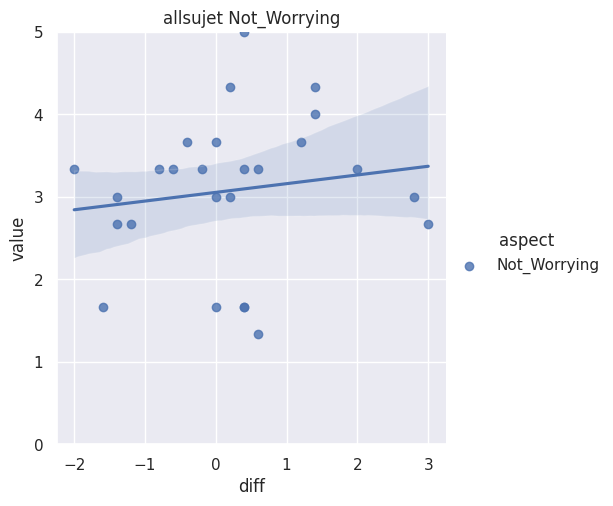

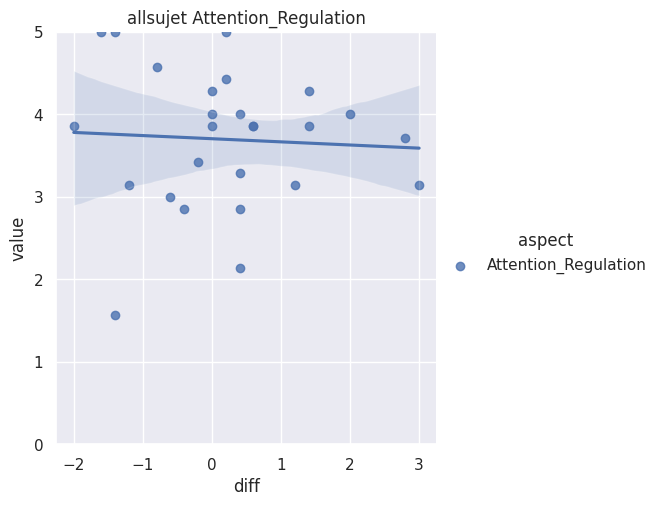

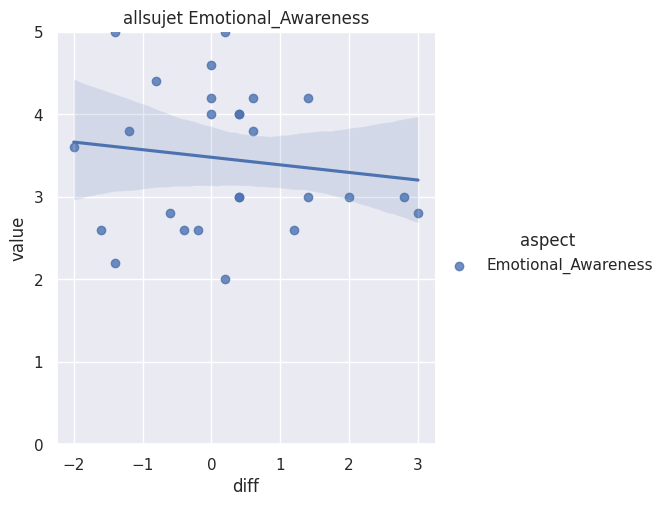

...

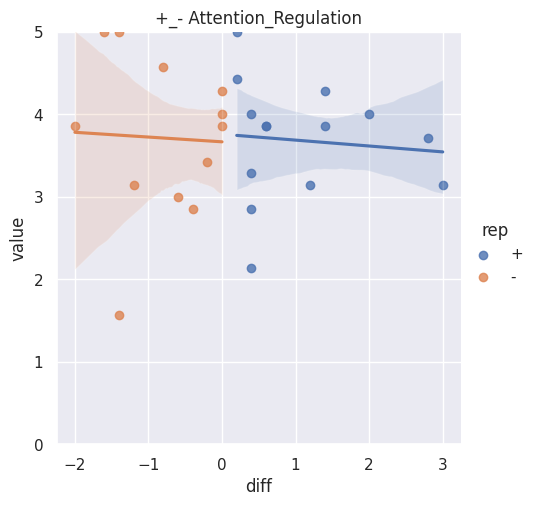

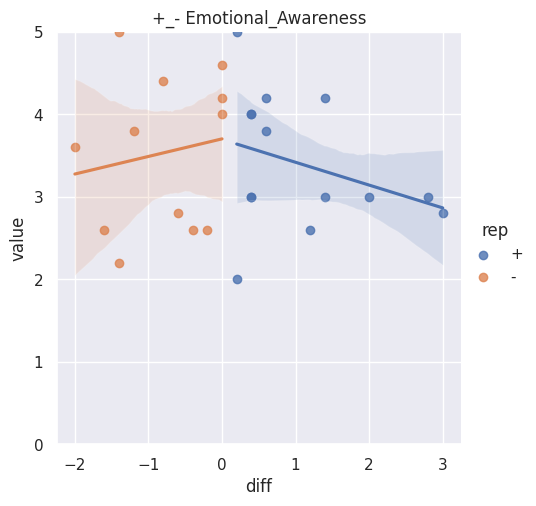

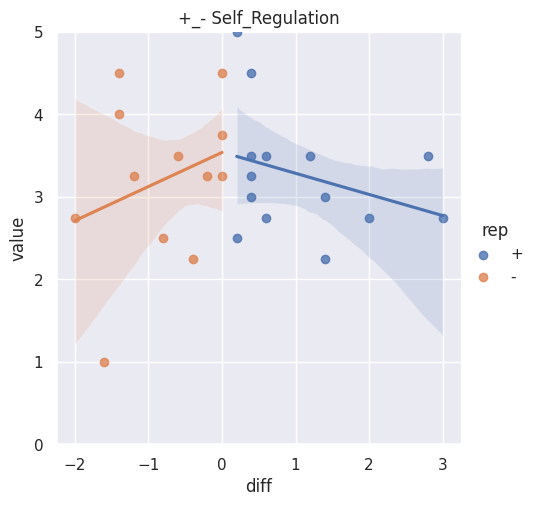

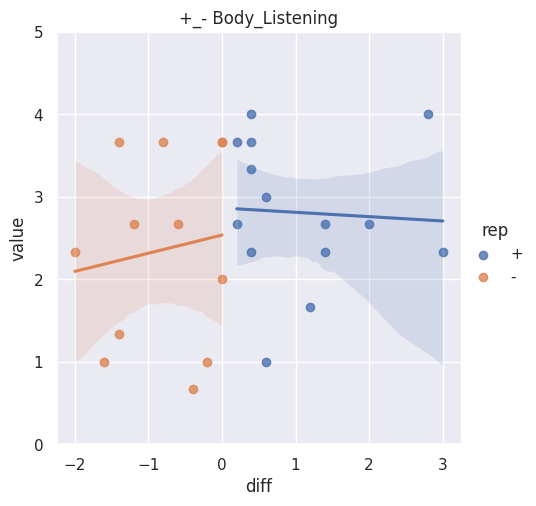

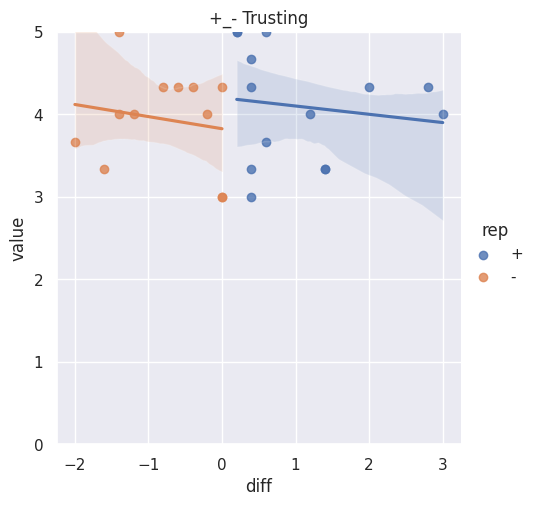

In [ ]:
for group_sel in ['allsujet', '+_-']:
    for aspect in MAIA_aspects_list:
        df_plot = df_reg_MAIA.query(f"aspect == '{aspect}'")
        if group_sel == 'allsujet':
            sns.lmplot(data=df_plot, x="diff", y="value", hue='aspect') 
        if group_sel == '+_-':
            sns.lmplot(data=df_plot, x="diff", y="value", hue='rep') 
        plt.title(f"{group_sel} {aspect}")
        plt.ylim(0,5)

## RELAX

In [ ]:
df_ri = df_q.query("question == 7 & cond in ['MECA', 'CO2'] & session in ['+', '-']")
df_ri['intensity'] = df_q.query("question == 8 & cond in ['MECA', 'CO2'] & session in ['+', '-']")['val'].values
df_ri

<ipython-input-5-5bf1a66d68de>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_ri['intensity'] = df_q.query("question == 8 & cond in ['MECA', 'CO2'] & session in ['+', '-']")['val'].values


,sujet,session,cond,question,raw_val,scale,val,intensity
46,PD01,+,MECA,7,4.7,15.7,29.936306,68.152866
54,PD01,+,CO2,7,2,15.7,12.738854,53.503185
78,PD01,-,MECA,7,5.5,15.7,35.031847,82.165605
86,PD01,-,CO2,7,3,15.7,19.108280,72.611465
142,MJ02,+,MECA,7,14,15.7,89.171975,9.554140
...,...,...,...,...,...,...,...,...
3062,CM32,-,CO2,7,0.1,15.6,0.641026,20.512821
3118,MA33,+,MECA,7,13.7,15.3,89.542484,81.699346
3126,MA33,+,CO2,7,13.8,15.5,89.032258,38.064516
3150,MA33,-,MECA,7,5,15.5,32.258065,70.967742


[Text(0.5, 1.0, 'MECA relaxation')]

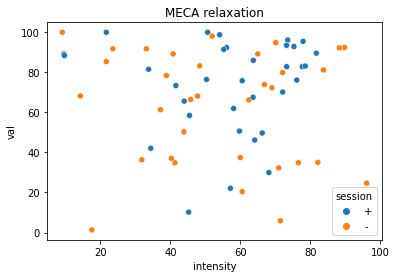

In [ ]:
df_plot = df_ri.query("cond == 'MECA'")
sns.scatterplot(data=df_plot, x='intensity', y='val', hue='session').set(title='MECA relaxation')


[Text(0.5, 1.0, 'CO2 relaxation')]

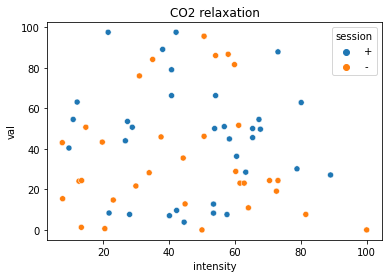

In [ ]:
df_plot = df_ri.query("cond == 'CO2'")
sns.scatterplot(data=df_plot, x='intensity', y='val', hue='session').set(title='CO2 relaxation')

In [ ]:
df_stats = df_ri.query("cond == 'CO2'")
Y = df_stats['val'].values.reshape(-1,1)
X = df_stats['intensity'].values.reshape(-1,1)

slope, intercept, r_value, p_value, std_err = scipy.stats.linregress(X.reshape(-1), Y.reshape(-1))
slope, intercept, r_value, p_value, std_err

(-0.03783857177046906,
 42.81262916502453,
 -0.029230121587910097,
 0.8157775634047246,
 0.16174412568068897)

In [ ]:
df_stats = df_ri.query("cond == 'MECA'")
Y = df_stats['val'].values.reshape(-1,1)
X = df_stats['intensity'].values.reshape(-1,1)

slope, intercept, r_value, p_value, std_err = scipy.stats.linregress(X.reshape(-1), Y.reshape(-1))
slope, intercept, r_value, p_value, std_err

(-0.04300311425825228,
 70.46147336549664,
 -0.03435159138953374,
 0.7842211893425386,
 0.1563891675336002)

In [ ]:
df_stai_ri = df_stai.query("cond in ['MECA', 'CO2'] & session in ['+', '-']")

In [ ]:
df_stai_ri['intensity'] = df_q.query("question == 8 & cond in ['MECA', 'CO2'] & session in ['+', '-']")['val'].values
df_stai_ri

/tmp/ipykernel_1121102/2127589661.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_stai_ri['intensity'] = df_q.query("question == 8 & cond in ['MECA', 'CO2'] & session in ['+', '-']")['val'].values


,sujet,session,cond,val,intensity
5,PD01,+,MECA,71.337580,68.152866
6,PD01,+,CO2,78.025478,53.503185
9,PD01,-,MECA,67.834395,82.165605
10,PD01,-,CO2,74.628450,72.611465
17,MJ02,+,MECA,12.101911,9.554140
...,...,...,...,...,...
382,CM32,-,CO2,85.897436,20.512821
389,MA33,+,MECA,19.063181,81.699346
390,MA33,+,CO2,34.623656,38.064516
393,MA33,-,MECA,66.774194,70.967742


[Text(0.5, 1.0, 'MECA STAI')]

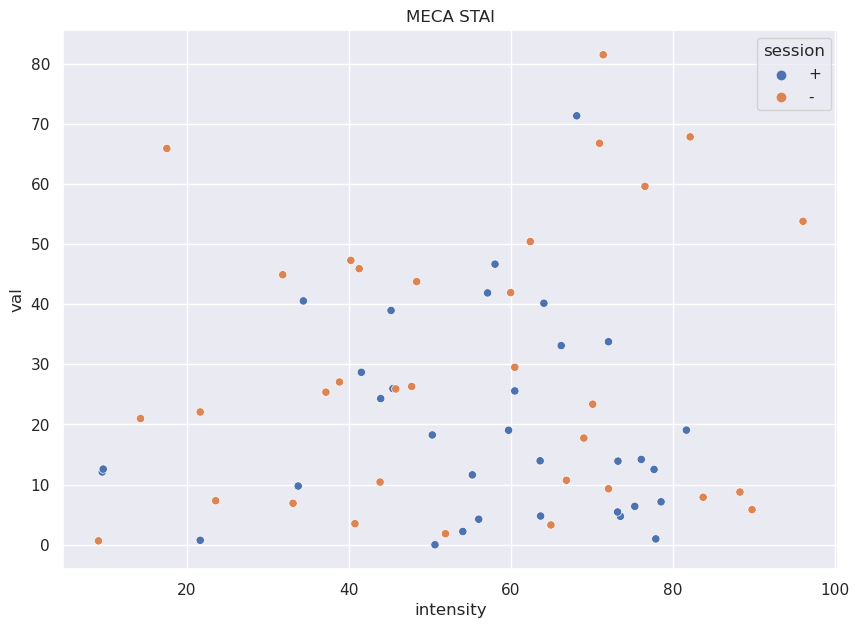

In [ ]:
df_plot = df_stai_ri.query("cond == 'MECA'")
sns.scatterplot(data=df_plot, x='intensity', y='val', hue='session').set(title='MECA STAI')


[Text(0.5, 1.0, 'CO2 STAI')]

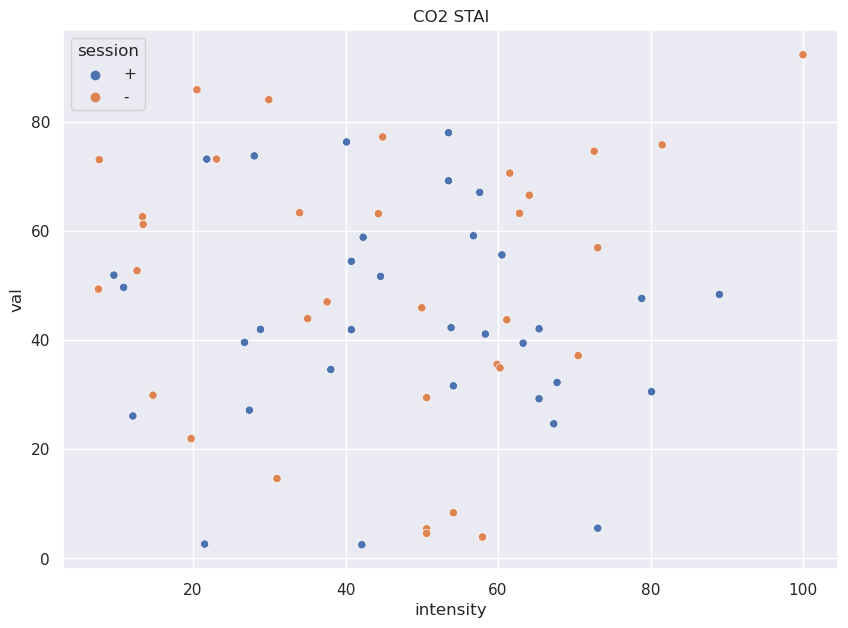

In [ ]:
df_plot = df_stai_ri.query("cond == 'CO2'")
sns.scatterplot(data=df_plot, x='intensity', y='val', hue='session').set(title='CO2 STAI')

# Compute diff

In [ ]:
val = np.zeros((df_mdp['sujet'].unique().shape[0]*df_mdp['session'].unique().shape[0]*df_mdp['cond'].unique().shape[0], 4), dtype='object')
i = 0
for sujet_i, sujet in enumerate(df_mdp['sujet'].unique()):
    for session_i, session in enumerate(df_mdp['session'].unique()):
        for cond_i, cond in enumerate(df_mdp['cond'].unique()):
            df_i = df_mdp.query(f"sujet == '{sujet}' & session == '{session}' & cond == '{cond}'")
            val_A2 = df_i[df_i['question'].isin(['A2_1', 'A2_2', 'A2_3', 'A2_4', 'A2_5'])]['value'].sum()
            val[i, :] = np.array([sujet, session, cond, val_A2])
            i += 1

df_A2 = pd.DataFrame(val, columns=['sujet', 'session', 'cond', 'value'])
df_A2['value'] = df_A2['value'].astype(np.float64) 
df_A2

,sujet,session,cond,value
0,PD01,o,MECA,26.0
1,PD01,o,CO2,34.0
2,PD01,+,MECA,40.0
3,PD01,+,CO2,32.0
4,PD01,-,MECA,27.0
...,...,...,...,...
193,MA33,o,CO2,21.0
194,MA33,+,MECA,2.0
195,MA33,+,CO2,7.0
196,MA33,-,MECA,1.0


In [ ]:
val = np.zeros((df_q['sujet'].unique().shape[0]*df_q['session'].unique().shape[0]*df_q['cond'].unique().shape[0], 4), dtype='object')
i = 0
for sujet_i, sujet in enumerate(df_q['sujet'].unique()):
    for session_i, session in enumerate(df_q['session'].unique()):
        for cond_i, cond in enumerate(df_q['cond'].unique()):
            df_i = df_q.query(f"sujet == '{sujet}' & session == '{session}' & cond == '{cond}'")
            val_p = 300 - df_i[df_i['question'].isin([1, 4, 5])]['val'].sum()
            val_n = df_i[df_i['question'].isin([2, 3, 6])]['val'].sum()
            val_stai = ((val_n + val_p)/600)*100
            val[i, :] = np.array([sujet, session, cond, val_stai])
            i += 1
df_stai = pd.DataFrame(val, columns=['sujet', 'session', 'cond', 'val'])
df_stai['val'] = df_stai['val'].astype(np.float64) 
df_stai

,sujet,session,cond,val
0,PD01,o,FR_CV1,55.765199
1,PD01,o,MECA,69.287212
2,PD01,o,CO2,77.044025
3,PD01,o,FR_CV2,45.702306
4,PD01,+,FR_CV1,44.055202
...,...,...,...,...
391,MA33,+,FR_CV2,17.634409
392,MA33,-,FR_CV1,8.279570
393,MA33,-,MECA,66.774194
394,MA33,-,CO2,63.247863


In [ ]:
df_rela = df_q.query(f"question == 7").drop(['question', 'raw_val', 'scale'], axis=1)
df_rela

,sujet,session,cond,val
6,PD01,o,FR_CV1,45.283019
14,PD01,o,MECA,16.981132
22,PD01,o,CO2,13.207547
30,PD01,o,FR_CV2,60.377358
38,PD01,+,FR_CV1,53.503185
...,...,...,...,...
3134,MA33,+,FR_CV2,90.322581
3142,MA33,-,FR_CV1,100.000000
3150,MA33,-,MECA,32.258065
3158,MA33,-,CO2,23.076923


In [ ]:
diff_i = df_A2.query(f"sujet == '{sujet}' & cond == 'MECA' & session == '+'")['value'].values[0] / df_A2.query(f"sujet == '{sujet}' & cond == 'MECA' & session == '-'")['value'].values[0]
diff_i

2.0

In [ ]:
df_diff = {'sujet' : [], 'diff' : [], 'cond' : [], 'question' : [], 'val' : []}
for sujet in sujet_list:
    for diff_cond in ['+/o', '-/o', '+/-']:
        for cond in ['FR_CV1', 'MECA', 'CO2', 'FR_CV2']:
            for question in ['A2', 'STAI', 'RELAX']:

                diff_cond_a, diff_cond_b = diff_cond.split('/')[0], diff_cond.split('/')[-1]
            
                if question == 'A2' and cond.find('FR_CV') == -1:
                    diff_i = df_A2.query(f"sujet == '{sujet}' & cond == '{cond}' & session == '{diff_cond_a}'")['value'].values[0] - df_A2.query(f"sujet == '{sujet}' & cond == '{cond}' & session == '{diff_cond_b}'")['value'].values[0]
                if question == 'STAI':
                    diff_i = df_stai.query(f"sujet == '{sujet}' & cond == '{cond}' & session == '{diff_cond_a}'")['val'].values[0] - df_stai.query(f"sujet == '{sujet}' & cond == '{cond}' & session == '{diff_cond_b}'")['val'].values[0]
                if question == 'RELAX':
                    diff_i = df_rela.query(f"sujet == '{sujet}' & cond == '{cond}' & session == '{diff_cond_a}'")['val'].values[0] - df_rela.query(f"sujet == '{sujet}' & cond == '{cond}' & session == '{diff_cond_b}'")['val'].values[0]

                df_diff['sujet'].append(sujet)
                df_diff['diff'].append(diff_cond)
                df_diff['cond'].append(cond)
                df_diff['question'].append(question)
                df_diff['val'].append(diff_i)

df_diff = pd.DataFrame(df_diff)
df_diff

,sujet,diff,cond,question,val
0,PD01,+/o,FR_CV1,A2,1.978656
1,PD01,+/o,FR_CV1,STAI,-11.709997
2,PD01,+/o,FR_CV1,RELAX,8.220166
3,PD01,+/o,MECA,A2,14.000000
4,PD01,+/o,MECA,STAI,2.050368
...,...,...,...,...,...
1183,MA33,+/-,CO2,STAI,-28.624207
1184,MA33,+/-,CO2,RELAX,65.955335
1185,MA33,+/-,FR_CV2,A2,65.955335
1186,MA33,+/-,FR_CV2,STAI,-24.459608


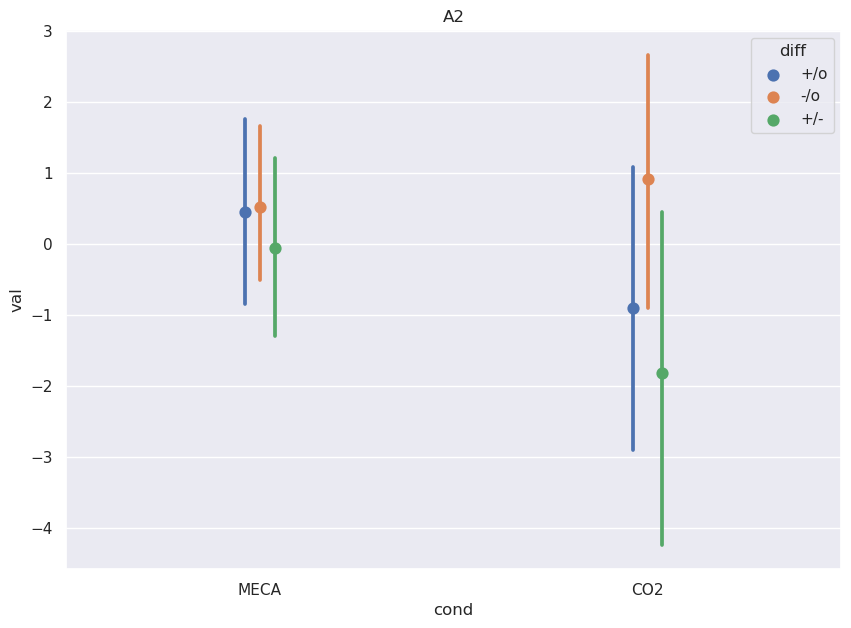

In [ ]:
df_plot = df_diff.query(f"question == 'A2' & cond in ['MECA', 'CO2']")
sns.pointplot(data=df_plot, x="cond", y="val", hue="diff", errorbar='sd', linestyles='none', dodge=True).set(title='A2')
sns.set(rc={'figure.figsize':(10,7)})


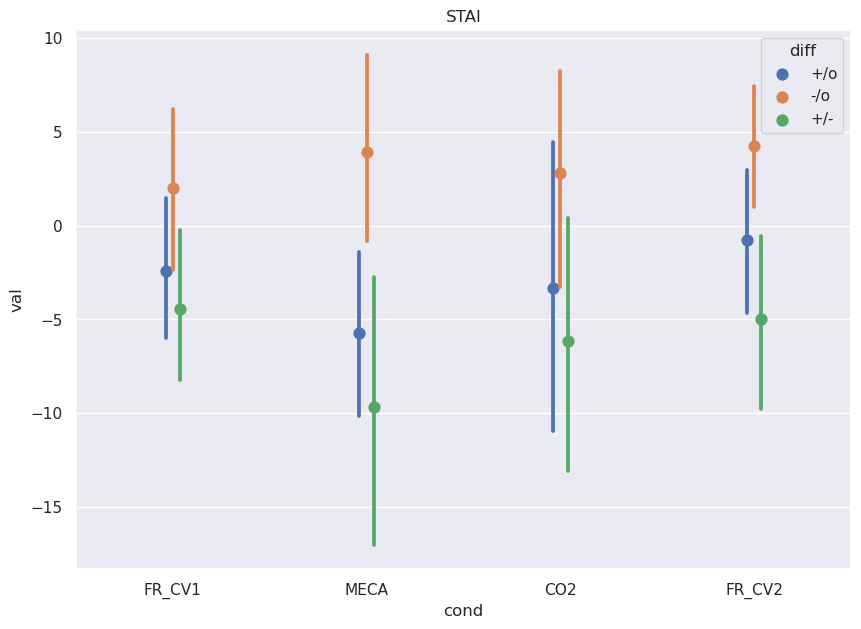

In [ ]:
df_plot = df_diff.query(f"question == 'STAI'")
sns.pointplot(data=df_plot, x="cond", y="val", hue="diff", errorbar='sd', linestyles='none', dodge=True).set(title='STAI')
sns.set(rc={'figure.figsize':(10,7)})

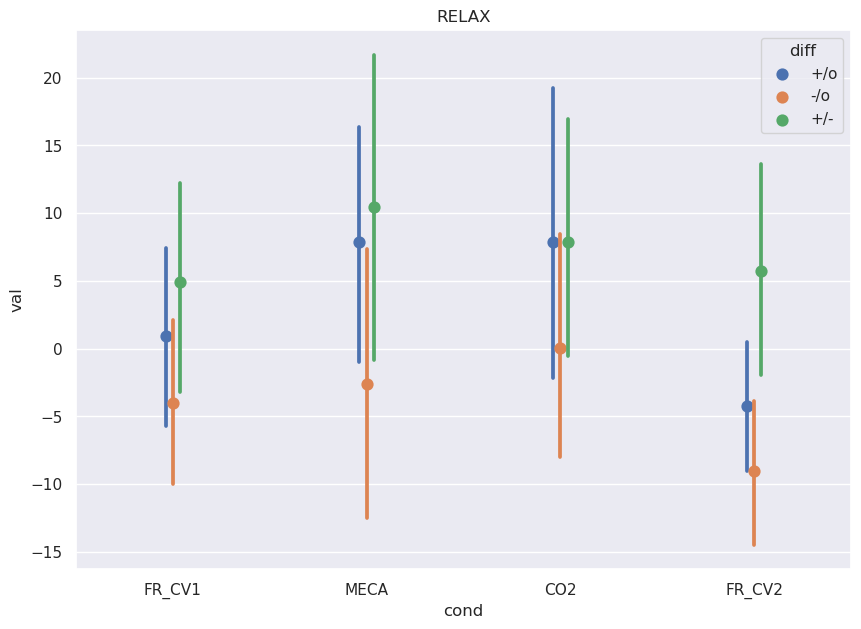

In [ ]:
df_plot = df_diff.query(f"question == 'RELAX'")
sns.pointplot(data=df_plot, x="cond", y="val", hue="diff", errorbar='sd', linestyles='none', dodge=True).set(title='RELAX')
sns.set(rc={'figure.figsize':(10,7)})

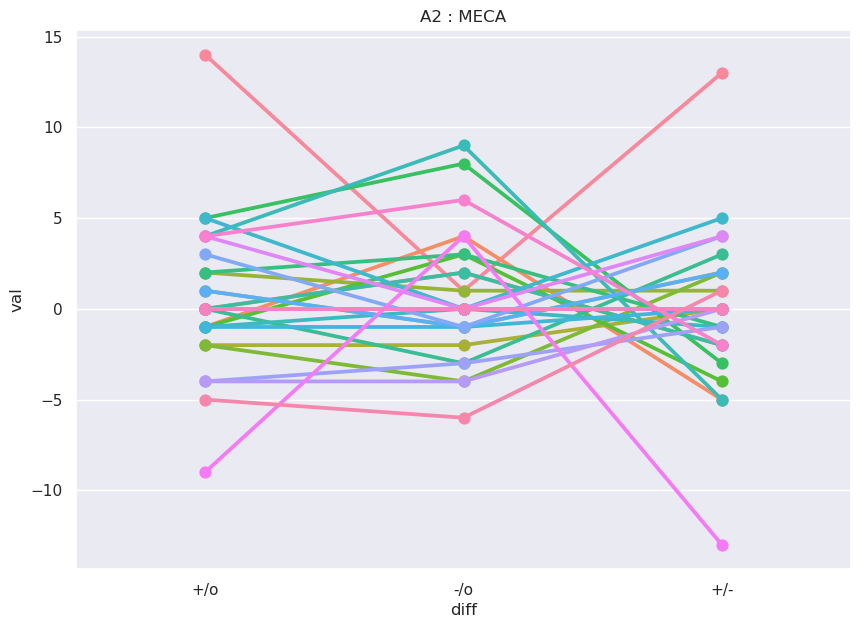

In [ ]:
cond = 'MECA'
df_plot = df_diff.query(f"question == 'A2' & cond == '{cond}'")
sns.pointplot(data=df_plot, x="diff", y="val", hue="sujet")
plt.legend([],[], frameon=False)
plt.title(f'A2 : {cond}')
sns.set(rc={'figure.figsize':(10,7)})

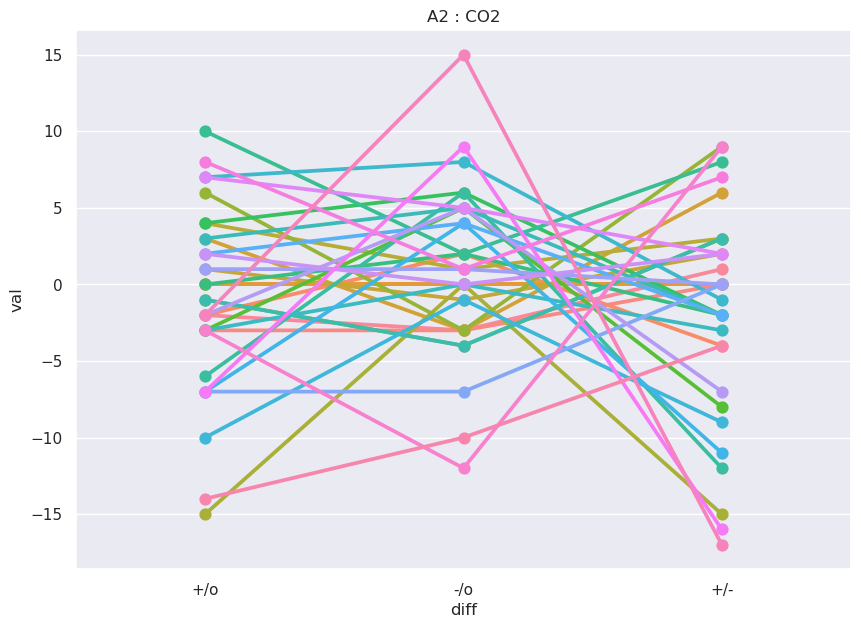

In [ ]:
cond = 'CO2'
df_plot = df_diff.query(f"question == 'A2' & cond == '{cond}'")
sns.pointplot(data=df_plot, x="diff", y="val", hue="sujet")
plt.legend([],[], frameon=False)
plt.title(f'A2 : {cond}')
sns.set(rc={'figure.figsize':(10,7)})

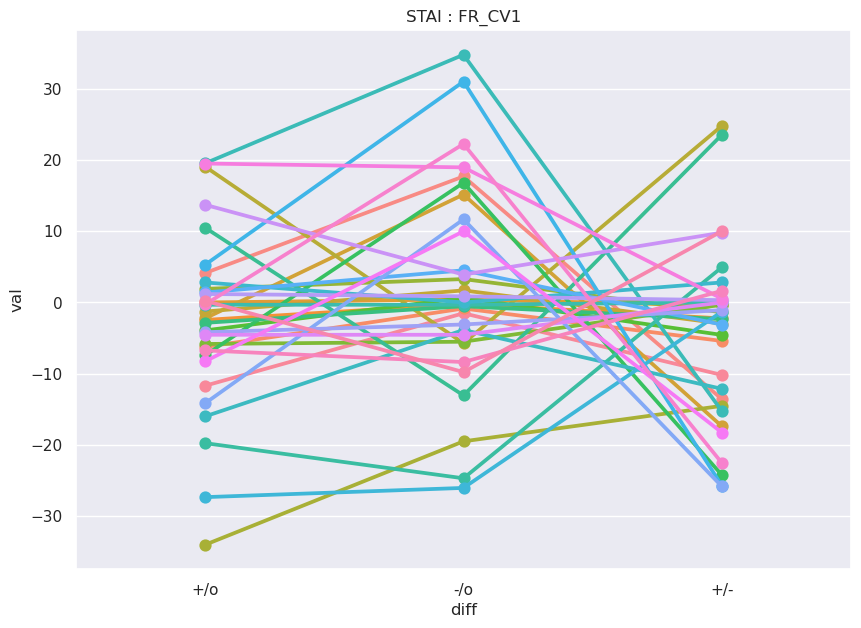

In [ ]:
cond = 'FR_CV1'
df_plot = df_diff.query(f"question == 'STAI' & cond == '{cond}'")
sns.pointplot(data=df_plot, x="diff", y="val", hue="sujet")
plt.legend([],[], frameon=False)
plt.title(f'STAI : {cond}')
sns.set(rc={'figure.figsize':(10,7)})

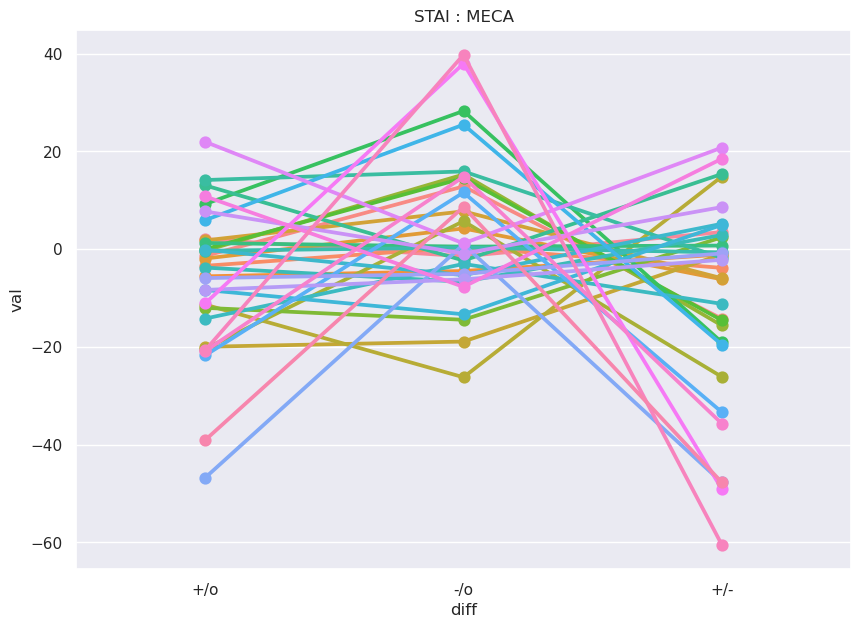

In [ ]:
cond = 'MECA'
df_plot = df_diff.query(f"question == 'STAI' & cond == '{cond}'")
sns.pointplot(data=df_plot, x="diff", y="val", hue="sujet")
plt.legend([],[], frameon=False)
plt.title(f'STAI : {cond}')
sns.set(rc={'figure.figsize':(10,7)})

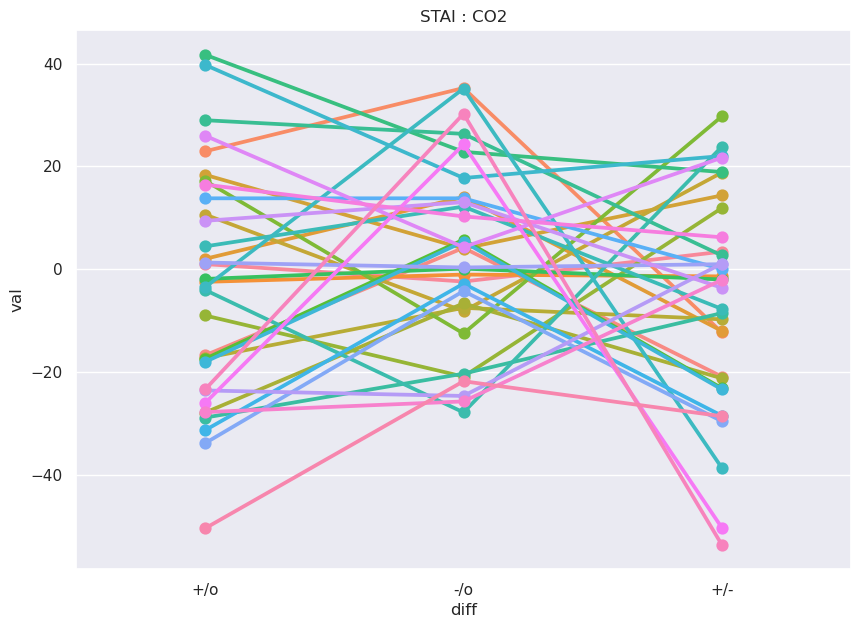

In [ ]:
cond = 'CO2'
df_plot = df_diff.query(f"question == 'STAI' & cond == '{cond}'")
sns.pointplot(data=df_plot, x="diff", y="val", hue="sujet")
plt.legend([],[], frameon=False)
plt.title(f'STAI : {cond}')
sns.set(rc={'figure.figsize':(10,7)})

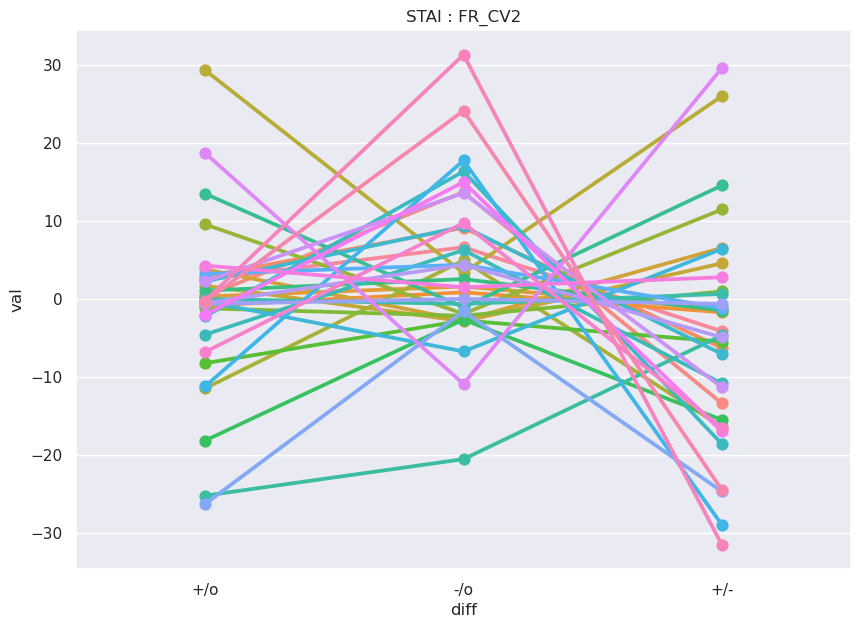

In [ ]:
cond = 'FR_CV2'
df_plot = df_diff.query(f"question == 'STAI' & cond == '{cond}'")
sns.pointplot(data=df_plot, x="diff", y="val", hue="sujet")
plt.legend([],[], frameon=False)
plt.title(f'STAI : {cond}')
sns.set(rc={'figure.figsize':(10,7)})

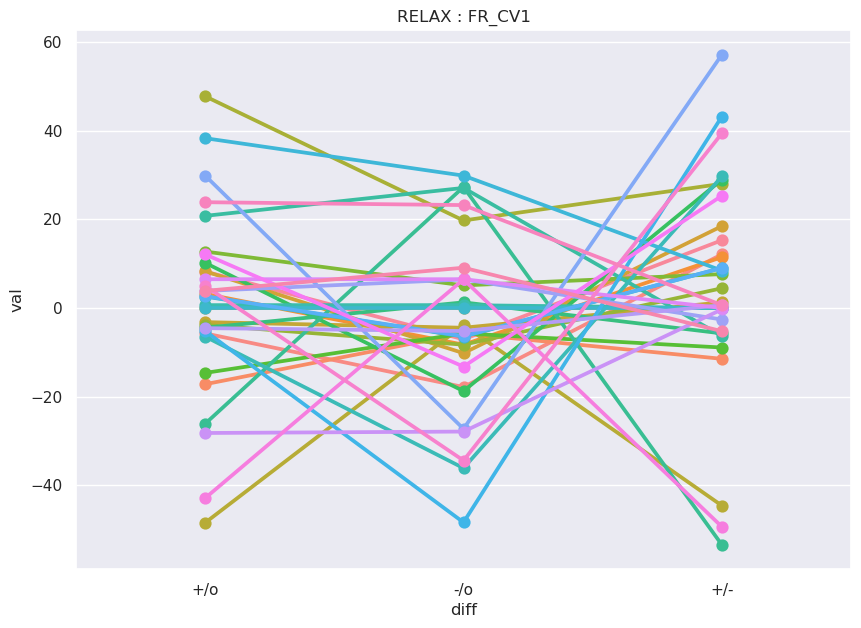

In [ ]:
cond = 'FR_CV1'
df_plot = df_diff.query(f"question == 'RELAX' & cond == '{cond}'")
sns.pointplot(data=df_plot, x="diff", y="val", hue="sujet")
plt.legend([],[], frameon=False)
plt.title(f'RELAX : {cond}')
sns.set(rc={'figure.figsize':(10,7)})

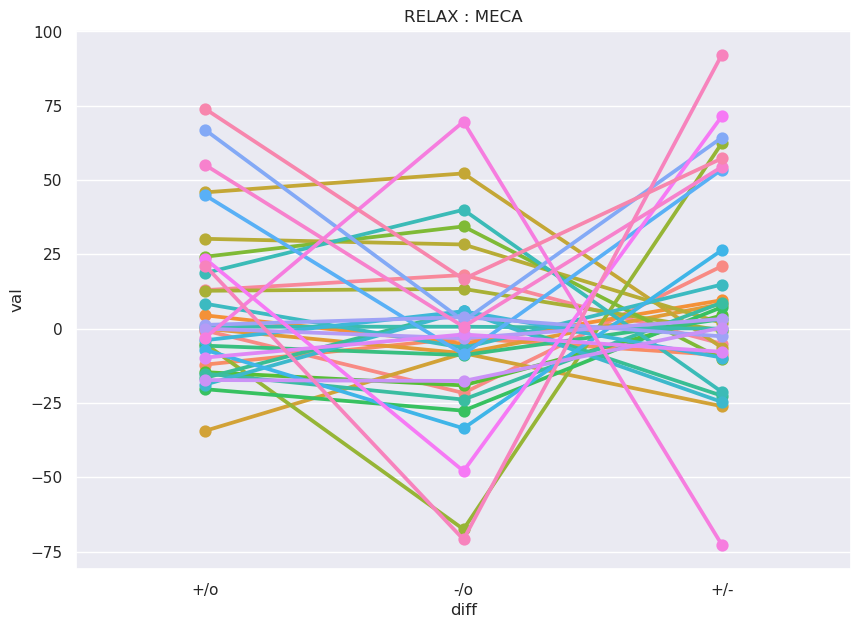

In [ ]:
cond = 'MECA'
df_plot = df_diff.query(f"question == 'RELAX' & cond == '{cond}'")
sns.pointplot(data=df_plot, x="diff", y="val", hue="sujet")
plt.legend([],[], frameon=False)
plt.title(f'RELAX : {cond}')
sns.set(rc={'figure.figsize':(10,7)})

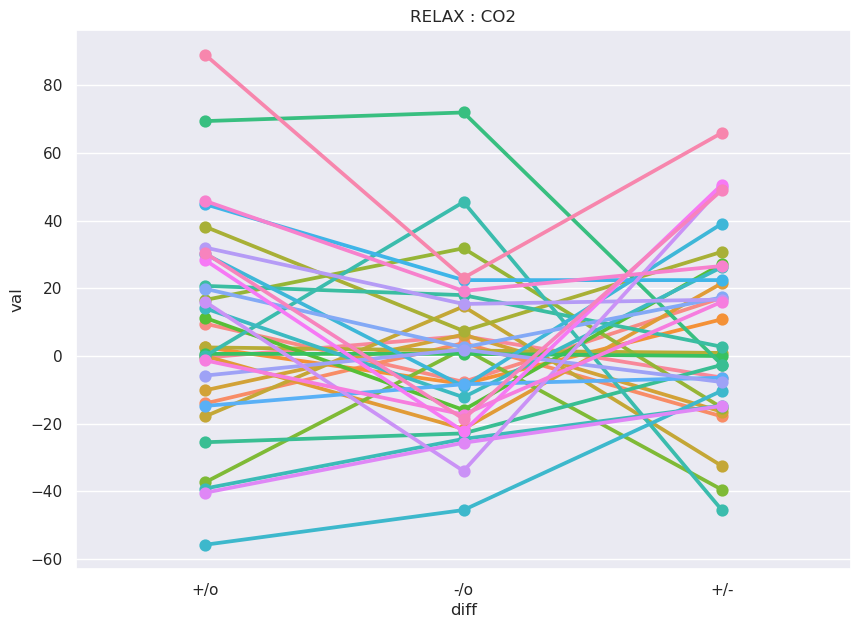

In [ ]:
cond = 'CO2'
df_plot = df_diff.query(f"question == 'RELAX' & cond == '{cond}'")
sns.pointplot(data=df_plot, x="diff", y="val", hue="sujet")
plt.legend([],[], frameon=False)
plt.title(f'RELAX : {cond}')
sns.set(rc={'figure.figsize':(10,7)})

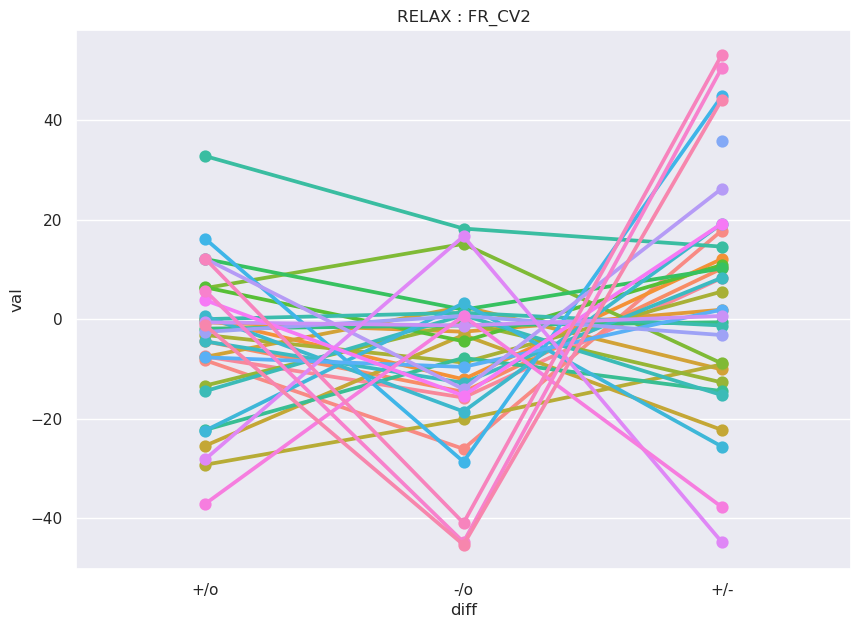

In [ ]:
cond = 'FR_CV2'
df_plot = df_diff.query(f"question == 'RELAX' & cond == '{cond}'")
sns.pointplot(data=df_plot, x="diff", y="val", hue="sujet")
plt.legend([],[], frameon=False)
plt.title(f'RELAX : {cond}')
sns.set(rc={'figure.figsize':(10,7)})

# CO2 RESISTANCE

In [ ]:
os.chdir(os.path.join(path_data, 'respi_detection'))

In [122]:
# CO2_data = {}

# for sujet in sujet_list:

#     if sujet in ['PB07']:
#         continue

#     CO2_data[sujet] = {}

#     for odor in odor_list_load:

#         CO2_data[sujet][odor_code[odor]] = {}

#         sujet_rev = f"{sujet[2:]}{sujet[:2]}"

#         file_load = f'ANA_{sujet[2:]}_{sujet}_{odor}.xlsx'
#         df_raw = pd.read_excel(file_load, sheet_name='Variables cycle T2')
        
#         time_vec = np.array([i for i in df_raw['Temps de début de cycle'].dropna().values[1:] if (type(i) == float) and (i > 0)]).astype(float)
        
#         mask = []
#         for val in df_raw['Temps de début de cycle'].values:
#             if val in time_vec:
#                 mask.append(True)
#             else:
#                 mask.append(False)
#         mask = np.array(mask)

#         CO2_vec = df_raw['PetCO2'][mask]
#         VAS_A = df_raw['VAS A'][mask]
#         VAS_S = df_raw['VAS S'][mask]

#         CO2_vec_sel = []
#         for val in CO2_vec:
#             if type(val) == float:
#                 CO2_vec_sel.append(True)
#             else:
#                 CO2_vec_sel.append(False)
#         CO2_vec_sel = np.array(CO2_vec_sel)

#         VAS_A_sel = []
#         for val in VAS_A:
#             if type(val) == float:
#                 VAS_A_sel.append(True)
#             else:
#                 VAS_A_sel.append(False)
#         VAS_A_sel = np.array(VAS_A_sel)

#         VAS_S_sel = []
#         for val in VAS_S:
#             if type(val) == float:
#                 VAS_S_sel.append(True)
#             else:
#                 VAS_S_sel.append(False)
#         VAS_S_sel = np.array(VAS_S_sel)

#         mask_global = np.logical_and(CO2_vec_sel, VAS_A_sel, VAS_S_sel)

#         CO2_vec = CO2_vec[mask_global].values.astype(float)
#         time_vec = time_vec[mask_global].astype(float)
#         VAS_A = VAS_A[mask_global].values.astype(float)
#         VAS_S = VAS_S[mask_global].values.astype(float)
        
#         CO2_data[sujet][odor_code[odor]]['time'] = time_vec
#         CO2_data[sujet][odor_code[odor]]['CO2'] = CO2_vec
#         CO2_data[sujet][odor_code[odor]]['VAS_A'] = VAS_A
#         CO2_data[sujet][odor_code[odor]]['VAS_S'] = VAS_S

In [ ]:
os.chdir(os.path.join(path_data, 'respi_detection'))
df_CO2 = pd.read_excel('OLFADYS_alldata_mean.xlsx')[['sujet', 'cond', 'odor', 'PetCO2', 'VAS_A', 'VAS_S']]

select_best = []
for row_i in range(df_CO2.shape[0]):
    if df_CO2['odor'][row_i] == 'p':
        df_CO2['odor'][row_i] = '+'
    if df_CO2['odor'][row_i] == 'n':
        df_CO2['odor'][row_i] = '-'
    if df_CO2['sujet'][row_i] in sujet_best_list_rev:
        select_best.append('YES')
    else:
        select_best.append('NO')
    
df_CO2['select_best'] = select_best
df_CO2 = df_CO2.query(f"sujet in {sujet_list.tolist()}").reset_index(drop=True)

/tmp/ipykernel_2688436/850317318.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_CO2['odor'][row_i] = '+'
/tmp/ipykernel_2688436/850317318.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_CO2['odor'][row_i] = '-'


In [ ]:
for nan_i in np.where(df_CO2['PetCO2'].isnull().values)[0]:
    cond, odor = df_CO2['cond'][nan_i], df_CO2['odor'][nan_i]
    nan_replace = df_CO2.query(f"cond == '{cond}' and odor == '{odor}'")['PetCO2'].median()
    df_CO2['PetCO2'][nan_i] = nan_replace 

/tmp/ipykernel_2688436/2055424267.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_CO2['PetCO2'][nan_i] = nan_replace
/tmp/ipykernel_2688436/2055424267.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_CO2['PetCO2'][nan_i] = nan_replace
/tmp/ipykernel_2688436/2055424267.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_CO2['PetCO2'][nan_i] = nan_replace
/tmp/ipykernel_2688436/2055424267.py:4: SettingWithCopyWarning: 
A 

## ALLSUJET

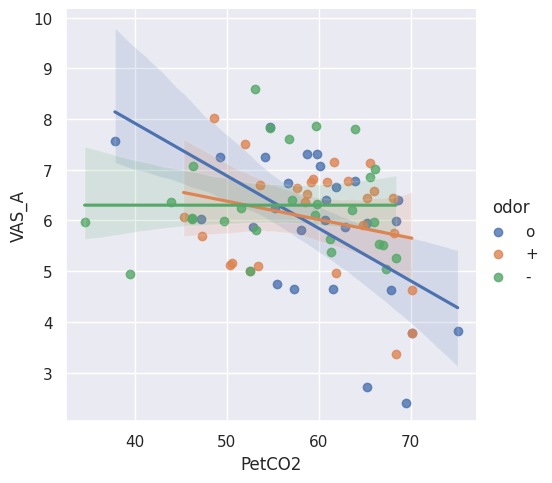

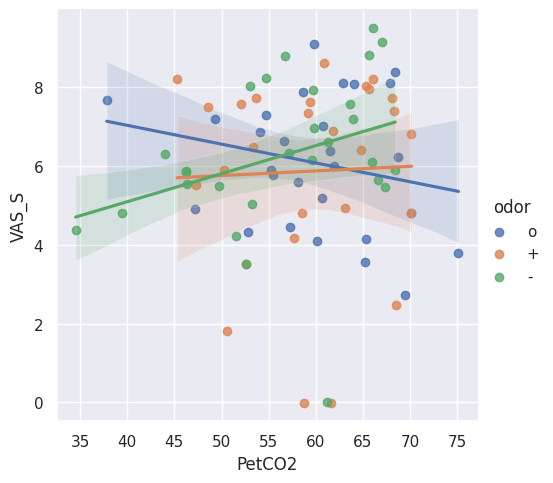

In [132]:
df_plot = df_CO2
sns.lmplot(data=df_plot, x="PetCO2", y="VAS_A", hue="odor", height=5)
plt.show()
sns.lmplot(data=df_plot, x="PetCO2", y="VAS_S", hue="odor", height=5)
plt.show()

In [ ]:
xr_data = np.zeros((len(sujet_list), len(odor_list), 3))

for sujet_i, sujet in enumerate(sujet_list):

    for odor_i, odor in enumerate(odor_list):

        xr_data[sujet_i, odor_i, 0] = df_CO2.query(f"cond == 'CO2' and sujet == '{sujet}' and odor == '{odor}'")['PetCO2'].median()
        xr_data[sujet_i, odor_i, 1] = df_CO2.query(f"cond == 'CO2' and sujet == '{sujet}' and odor == '{odor}'")['VAS_A'].median()
        xr_data[sujet_i, odor_i, 2] = df_CO2.query(f"cond == 'CO2' and sujet == '{sujet}' and odor == '{odor}'")['VAS_S'].median()

xr_dict = {'sujet' : sujet_list, 'odor' : odor_list, 'metric' : ['CO2', 'VAS_A', 'VAS_S']}

xr_CO2 = xr.DataArray(xr_data, dims=xr_dict.keys(), coords=xr_dict.values())
df_CO2_allsujet = xr_CO2.to_dataframe('value').reset_index(drop=False)


/home/jules.granget/myenvs/py39c/lib64/python3.9/site-packages/numpy/lib/nanfunctions.py:1215: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/home/jules.granget/myenvs/py39c/lib64/python3.9/site-packages/numpy/lib/nanfunctions.py:1215: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)


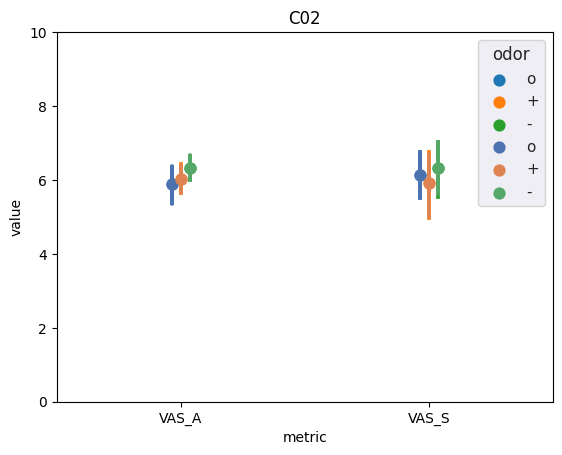

In [ ]:
df_plot = df_CO2_allsujet.query(f"metric in {['VAS_A', 'VAS_S']}")
sns.pointplot(data=df_plot, x="metric", y="value", hue="odor", errorbar='sd', linestyles='none', dodge=True).set(title='C02')
sns.set(rc={'figure.figsize':(10,7)})
plt.ylim(0,10)
plt.show()

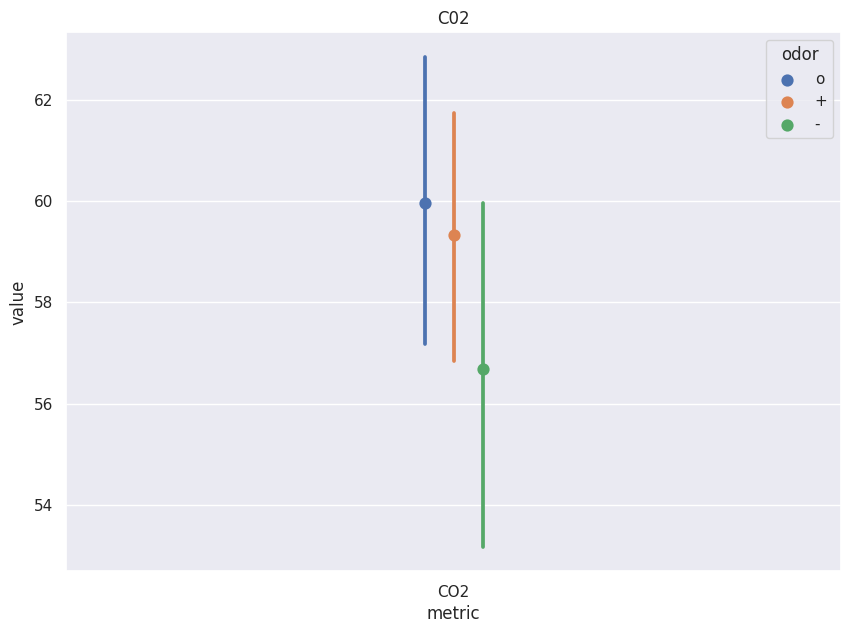

In [ ]:
df_plot = df_CO2_allsujet.query(f"metric in {['CO2']}")
sns.pointplot(data=df_plot, x="metric", y="value", hue="odor", errorbar='sd', linestyles='none', dodge=True).set(title='C02')
sns.set(rc={'figure.figsize':(10,7)})
plt.show()

## INTERSESSION

In [ ]:
sujet_list

array(['01PD', '03VN', '04GB', '05LV', '06EF', '07PB', '08DM', '09TA',
       '10BH', '11FA', '12BD', '13FP', '14MD', '15LG', '16GM', '17JR',
       '19TM', '20TY', '21ZV', '23LF', '24TJ', '25DF', '26MN', '28NT',
       '29SC', '30AR', '31HJ', '32CM', '33MA'], dtype='<U4')

In [ ]:
sujet_rev

'FP13'

In [ ]:
df_A2['sujet'].unique()

array(['AR30', 'BD12', 'BH10', 'CM32', 'DF25', 'DM08', 'EF06', 'FA11',
       'GB04', 'GM16', 'HJ31', 'JR17', 'LF23', 'LG15', 'LV05', 'MA33',
       'MD14', 'MN26', 'NT28', 'PB07', 'PD01', 'SC29', 'TA09', 'TJ24',
       'TM19', 'TY20', 'VN03', 'ZV21'], dtype=object)

In [ ]:
data = {'sujet' : [], 'odor' : [], 'PetCO2' : [], 'VAS_A' : [], 'VAS_S' : [], 'A2' : [], 'STAI' : [], 'RELAX' : [], 'select_best' : []}

df_only_CO2 = df_CO2.query(f"cond == 'CO2'").reset_index(drop=True)
for nan_i in np.where(df_only_CO2['VAS_A'].isnull().values)[0]:
    cond, odor = df_only_CO2['cond'][nan_i], df_only_CO2['odor'][nan_i]
    nan_replace = df_only_CO2.query(f"cond == '{cond}' and odor == '{odor}'")['VAS_A'].median()
    df_only_CO2['VAS_A'][nan_i] = nan_replace

for nan_i in np.where(df_only_CO2['VAS_S'].isnull().values)[0]:
    cond, odor = df_only_CO2['cond'][nan_i], df_only_CO2['odor'][nan_i]
    nan_replace = df_only_CO2.query(f"cond == '{cond}' and odor == '{odor}'")['VAS_S'].median()
    df_only_CO2['VAS_S'][nan_i] = nan_replace

for sujet in sujet_list_erp:
    
    for odor in ['+', '-']:

        sujet_rev = f"{sujet[2:]}{sujet[:2]}"

        data['sujet'].append(sujet)
        data['odor'].append(odor)
        data['select_best'].append(df_only_CO2.query(f"sujet == '{sujet}' and odor == 'o'")['select_best'].values[0])

        diff_petco2 = df_only_CO2.query(f"sujet == '{sujet}' and odor == '{odor}'")['PetCO2'].values[0] - df_only_CO2.query(f"sujet == '{sujet}' and odor == 'o'")['PetCO2'].values[0]
        diff_VAS_A = df_only_CO2.query(f"sujet == '{sujet}' and odor == '{odor}'")['VAS_A'].values[0] - df_only_CO2.query(f"sujet == '{sujet}' and odor == 'o'")['VAS_A'].values[0]
        diff_VAS_S = df_only_CO2.query(f"sujet == '{sujet}' and odor == '{odor}'")['VAS_S'].values[0] - df_only_CO2.query(f"sujet == '{sujet}' and odor == 'o'")['VAS_S'].values[0]

        diff_A2 = df_A2.query(f"sujet == '{sujet_rev}' and session == '{odor}' and cond == 'CO2'")['value'].values[0] - df_A2.query(f"sujet == '{sujet_rev}' and session == 'o' and cond == 'CO2'")['value'].values[0]
        diff_stai = df_stai.query(f"sujet == '{sujet_rev}' and session == '{odor}' and cond == 'CO2'")['val'].values[0] - df_stai.query(f"sujet == '{sujet_rev}' and session == 'o' and cond == 'CO2'")['val'].values[0]
        diff_relax = df_relax.query(f"sujet == '{sujet_rev}' and session == '{odor}' and cond == 'CO2'")['val'].values[0] - df_relax.query(f"sujet == '{sujet_rev}' and session == 'o' and cond == 'CO2'")['val'].values[0]
        
        data['PetCO2'].append(diff_petco2)
        data['VAS_A'].append(diff_VAS_A)
        data['VAS_S'].append(diff_VAS_S)
        data['A2'].append(diff_A2)
        data['STAI'].append(diff_stai)
        data['RELAX'].append(diff_relax)

df_CO2_diff = pd.DataFrame(data)
df_CO2_diff   


/tmp/ipykernel_2688436/2214034752.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_only_CO2['VAS_A'][nan_i] = nan_replace
/tmp/ipykernel_2688436/2214034752.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_only_CO2['VAS_S'][nan_i] = nan_replace


,sujet,odor,PetCO2,VAS_A,VAS_S,A2,STAI,RELAX,select_best
0,04GB,+,-6.741957,0.514080,-2.623967,0.0,-2.473661,2.579818,NO
1,04GB,-,-22.779302,1.326296,-0.066844,0.0,-1.061571,-8.280255,NO
2,05LV,+,1.476495,-1.776842,0.587348,0.0,2.000188,0.016125,NO
3,05LV,-,-2.657535,-0.432742,-0.111536,0.0,14.025505,-21.502862,NO
4,06EF,+,6.463516,0.651694,2.817552,0.6,18.354430,-10.126582,NO
5,06EF,-,6.074200,-0.230291,0.138622,-0.6,4.008439,6.329114,NO
6,07PB,+,-3.563011,1.199112,-3.555789,0.2,10.615711,-17.834395,NO
7,07PB,-,-3.989302,-0.304911,-3.555465,-0.2,-8.174098,14.649682,NO
8,08DM,+,-13.282189,1.148421,3.088244,0.8,-17.303609,2.547771,NO
9,08DM,-,-6.707150,1.435969,2.102841,0.2,-7.533124,1.636701,NO


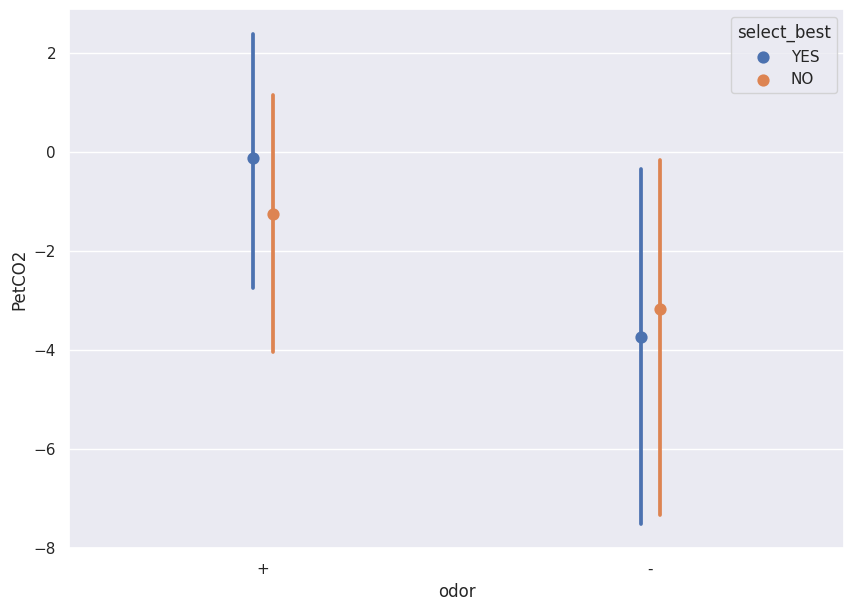

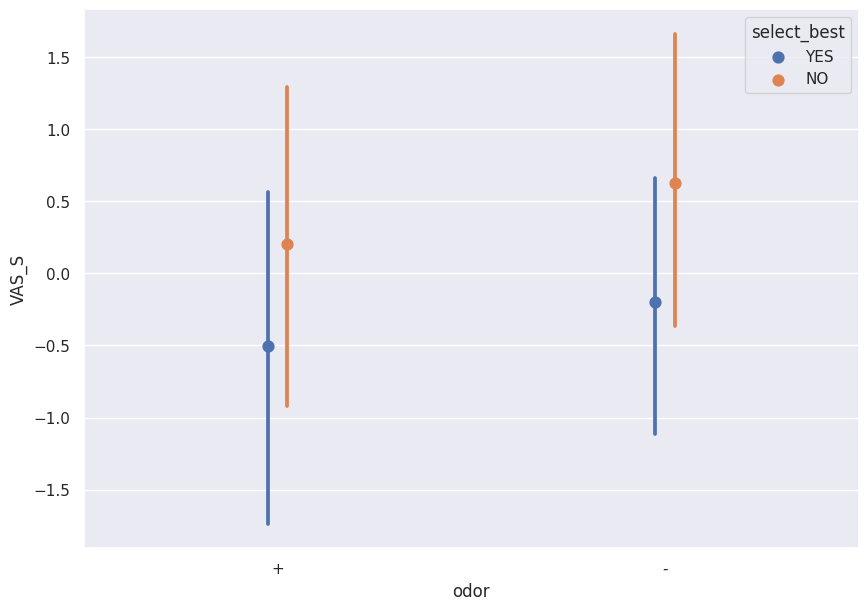

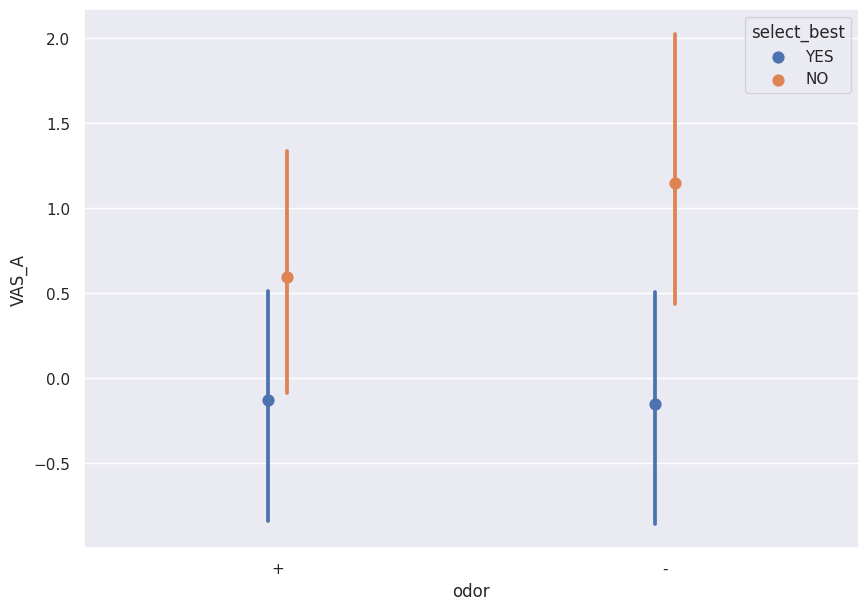

In [ ]:
df_plot = df_CO2_diff
sns.pointplot(data=df_plot, x="odor", y="PetCO2", hue="select_best", errorbar='sd', linestyles='none', dodge=True)
plt.show()
sns.pointplot(data=df_plot, x="odor", y="VAS_S", hue="select_best", errorbar='sd', linestyles='none', dodge=True)
plt.show()
sns.pointplot(data=df_plot, x="odor", y="VAS_A", hue="select_best", errorbar='sd', linestyles='none', dodge=True)
plt.show()

/home/jules.granget/myenvs/py39c/lib64/python3.9/site-packages/scipy/stats/_morestats.py:3337: UserWarning: Exact p-value calculation does not work if there are zeros. Switching to normal approximation.
  warnings.warn("Exact p-value calculation does not work if there are "
/crnldata/cmo/multisite/DATA_MANIP/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:382: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predictor).std()[outcome].reset_index()[outcome].rename('sd')], axis = 1).round(2).set_index(predictor)
/crnldata/cmo/multisite/DATA_MANIP/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:382: FutureWarning: The default value of numeric_only in DataFrameGroupBy.std is deprecated. In a future vers

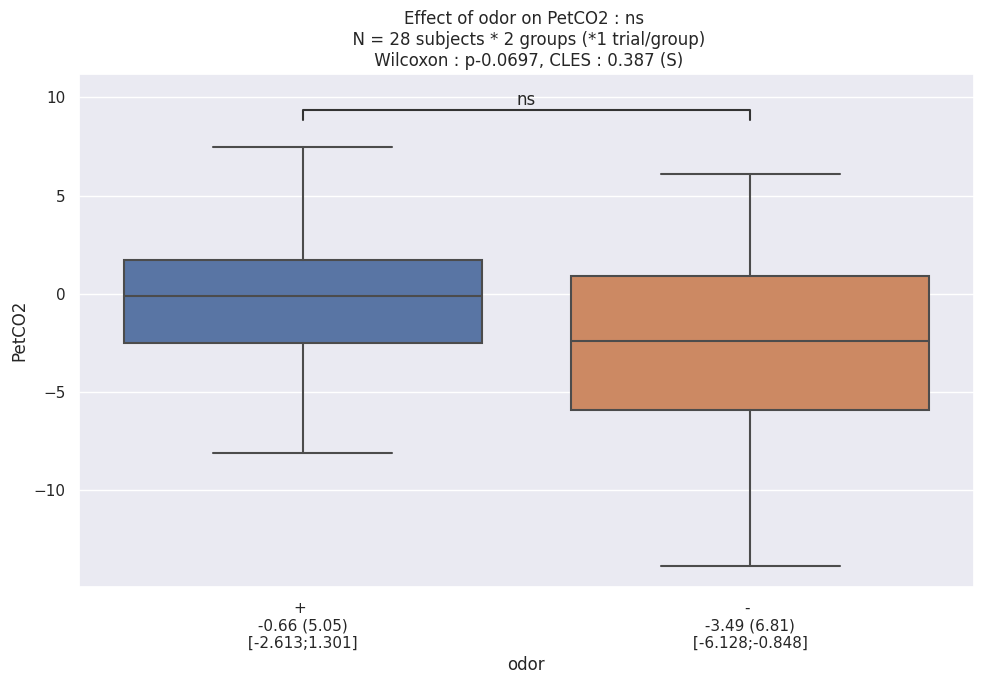

/crnldata/cmo/multisite/DATA_MANIP/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:382: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predictor).std()[outcome].reset_index()[outcome].rename('sd')], axis = 1).round(2).set_index(predictor)
/crnldata/cmo/multisite/DATA_MANIP/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:382: FutureWarning: The default value of numeric_only in DataFrameGroupBy.std is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predictor).std()[outcome].reset_index()[outcome].rena

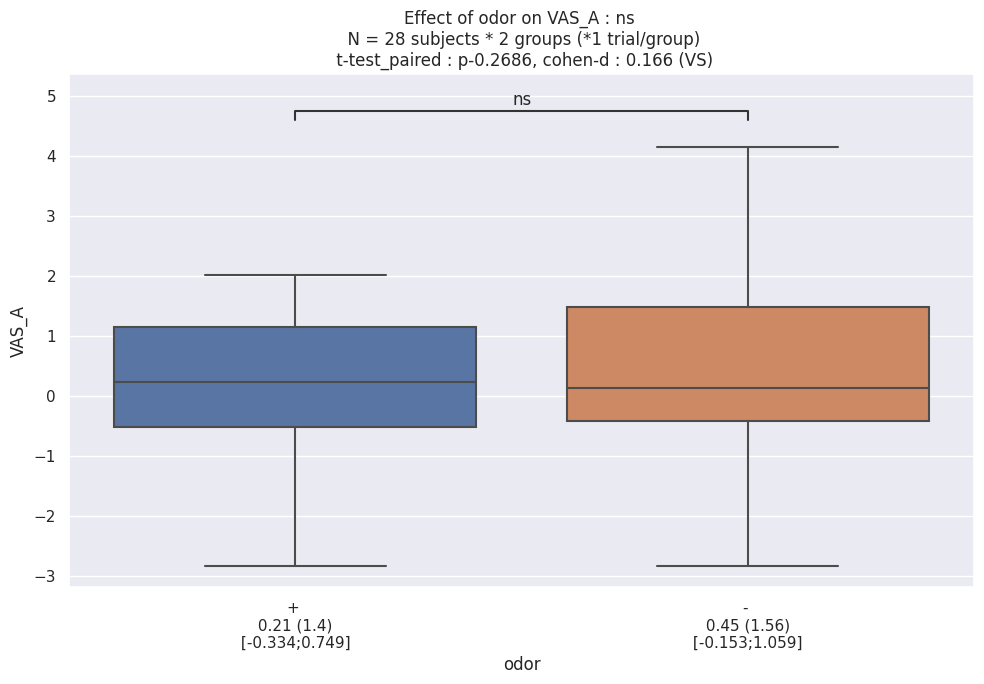

/crnldata/cmo/multisite/DATA_MANIP/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:382: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predictor).std()[outcome].reset_index()[outcome].rename('sd')], axis = 1).round(2).set_index(predictor)
/crnldata/cmo/multisite/DATA_MANIP/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:382: FutureWarning: The default value of numeric_only in DataFrameGroupBy.std is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predictor).std()[outcome].reset_index()[outcome].rena

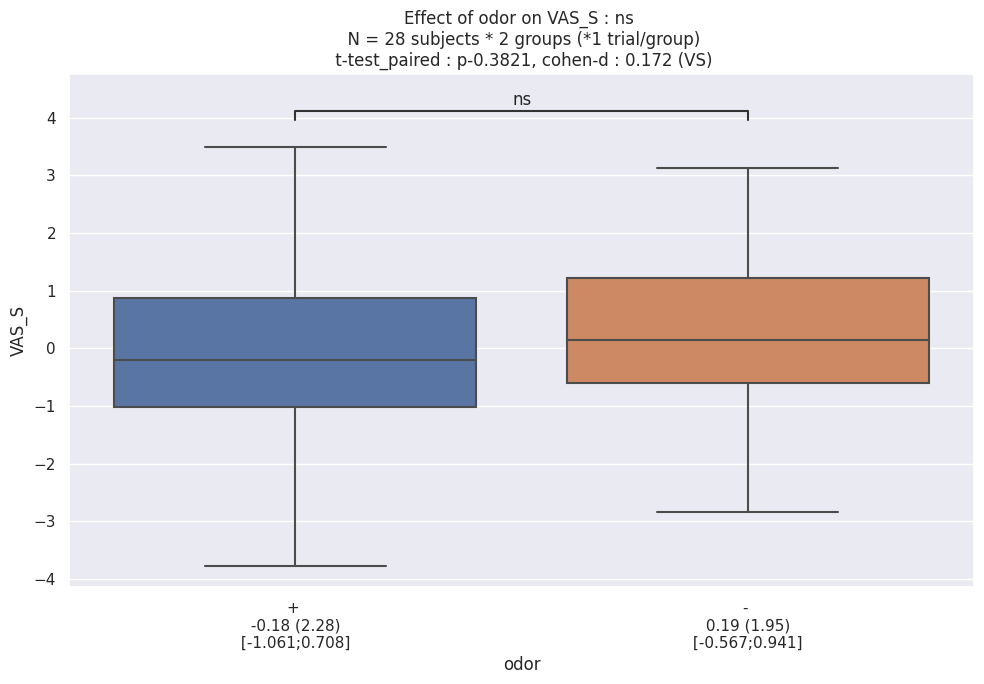

/crnldata/cmo/multisite/DATA_MANIP/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:382: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predictor).std()[outcome].reset_index()[outcome].rename('sd')], axis = 1).round(2).set_index(predictor)
/crnldata/cmo/multisite/DATA_MANIP/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:382: FutureWarning: The default value of numeric_only in DataFrameGroupBy.std is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predictor).std()[outcome].reset_index()[outcome].rena

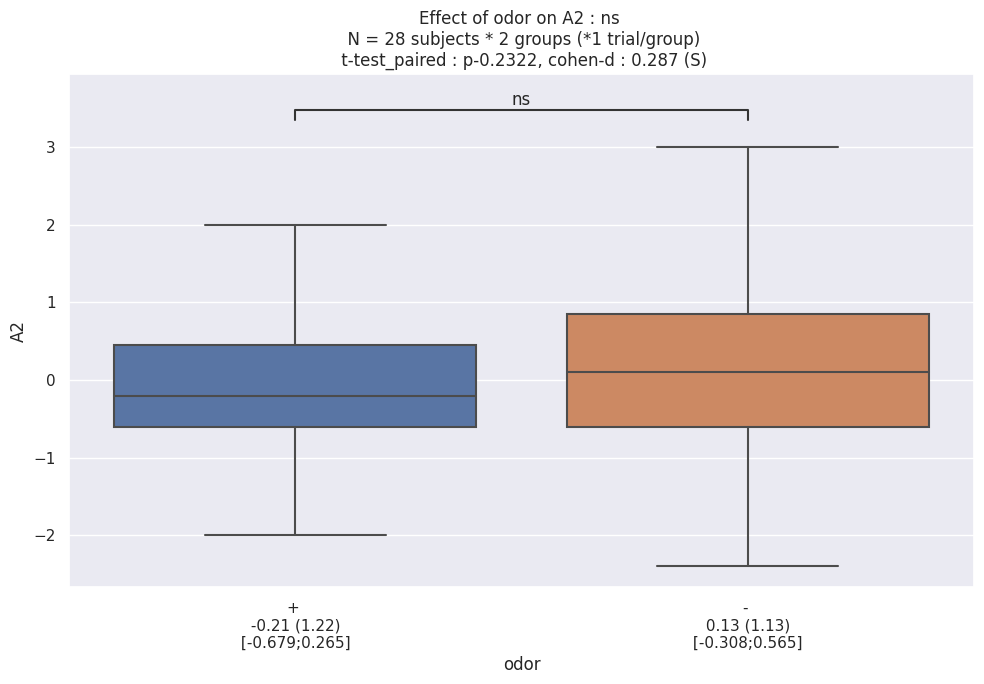

/crnldata/cmo/multisite/DATA_MANIP/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:382: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predictor).std()[outcome].reset_index()[outcome].rename('sd')], axis = 1).round(2).set_index(predictor)
/crnldata/cmo/multisite/DATA_MANIP/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:382: FutureWarning: The default value of numeric_only in DataFrameGroupBy.std is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predictor).std()[outcome].reset_index()[outcome].rena

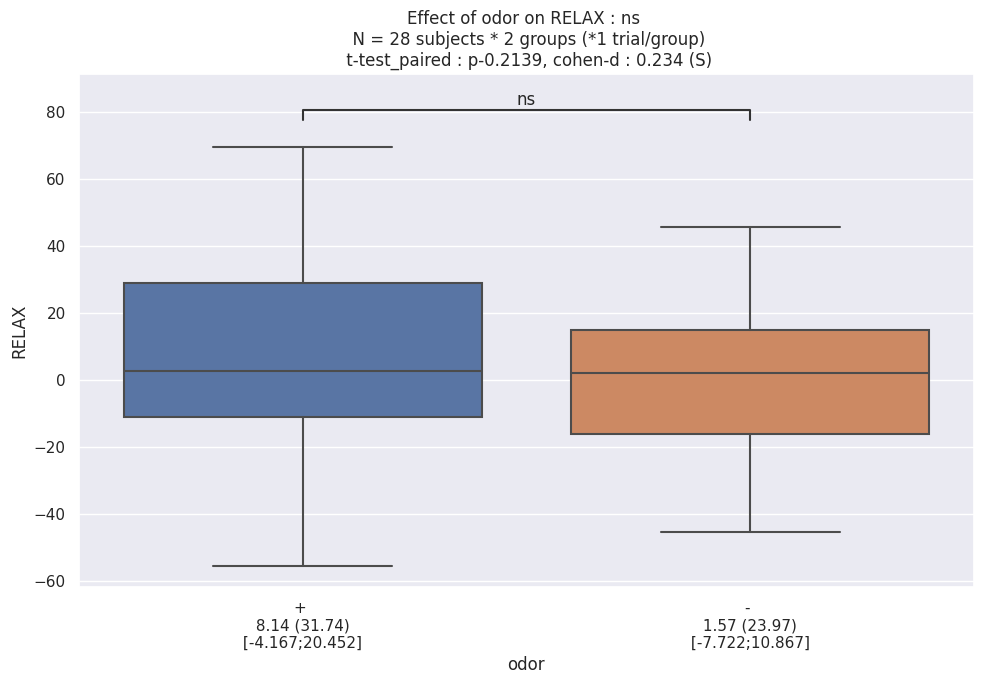

/crnldata/cmo/multisite/DATA_MANIP/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:382: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predictor).std()[outcome].reset_index()[outcome].rename('sd')], axis = 1).round(2).set_index(predictor)
/crnldata/cmo/multisite/DATA_MANIP/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:382: FutureWarning: The default value of numeric_only in DataFrameGroupBy.std is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predictor).std()[outcome].reset_index()[outcome].rena

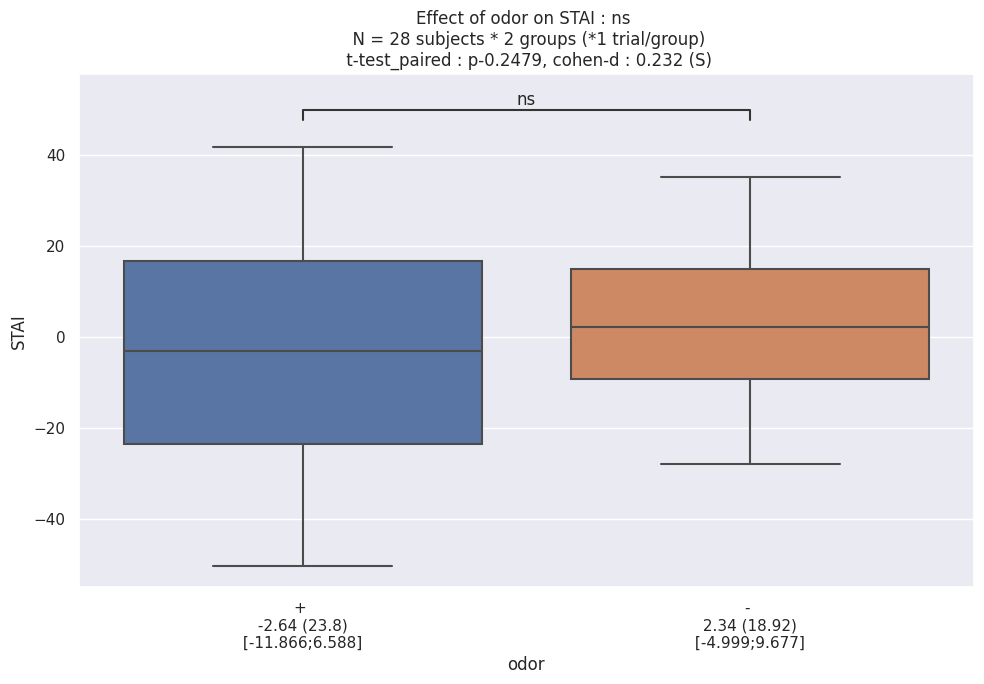

In [ ]:
df_stats = df_CO2_diff
predictor = 'odor'
for metric in ['PetCO2', 'VAS_A', 'VAS_S',  'A2', 'RELAX', 'STAI']:
    outcome = metric
    fig, ax = plt.subplots()
    ax = auto_stats(df_stats, predictor, outcome, ax=ax, subject='sujet', design='within', mode='box', transform=False, verbose=False)
    plt.tight_layout()
    plt.show()

/crnldata/cmo/multisite/DATA_MANIP/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:382: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predictor).std()[outcome].reset_index()[outcome].rename('sd')], axis = 1).round(2).set_index(predictor)
/crnldata/cmo/multisite/DATA_MANIP/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:382: FutureWarning: The default value of numeric_only in DataFrameGroupBy.std is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predictor).std()[outcome].reset_index()[outcome].rena

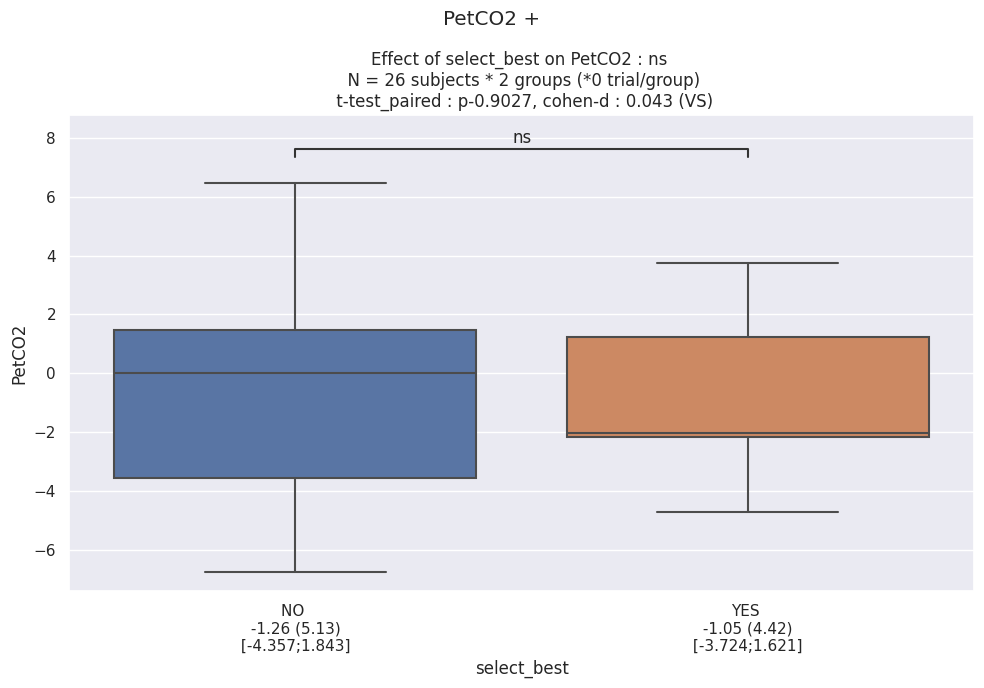

/crnldata/cmo/multisite/DATA_MANIP/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:382: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predictor).std()[outcome].reset_index()[outcome].rename('sd')], axis = 1).round(2).set_index(predictor)
/crnldata/cmo/multisite/DATA_MANIP/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:382: FutureWarning: The default value of numeric_only in DataFrameGroupBy.std is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predictor).std()[outcome].reset_index()[outcome].rena

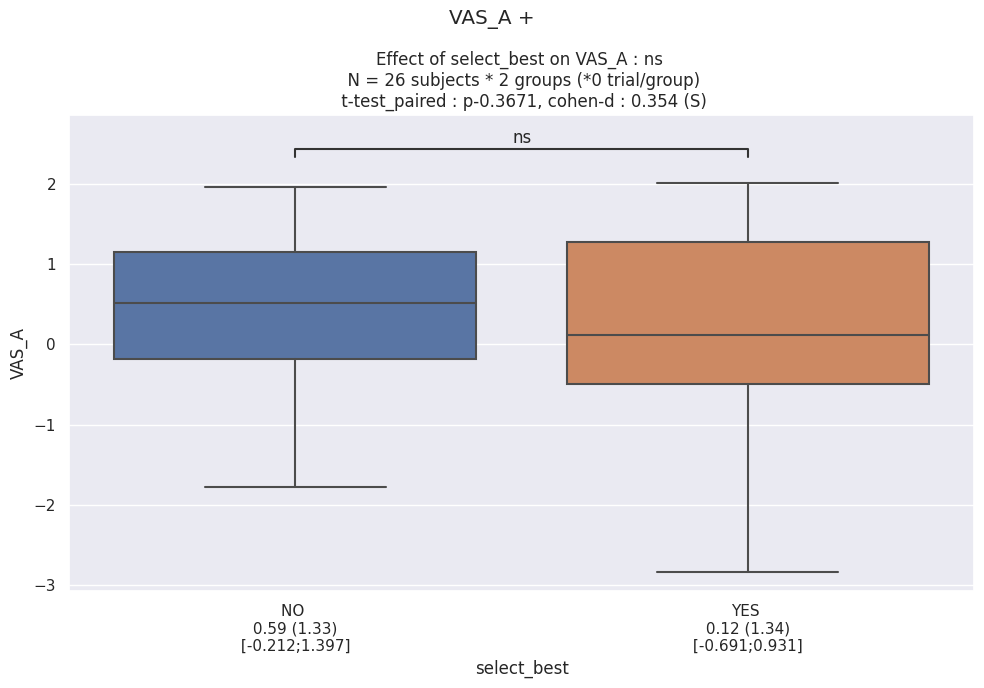

/crnldata/cmo/multisite/DATA_MANIP/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:382: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predictor).std()[outcome].reset_index()[outcome].rename('sd')], axis = 1).round(2).set_index(predictor)
/crnldata/cmo/multisite/DATA_MANIP/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:382: FutureWarning: The default value of numeric_only in DataFrameGroupBy.std is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predictor).std()[outcome].reset_index()[outcome].rena

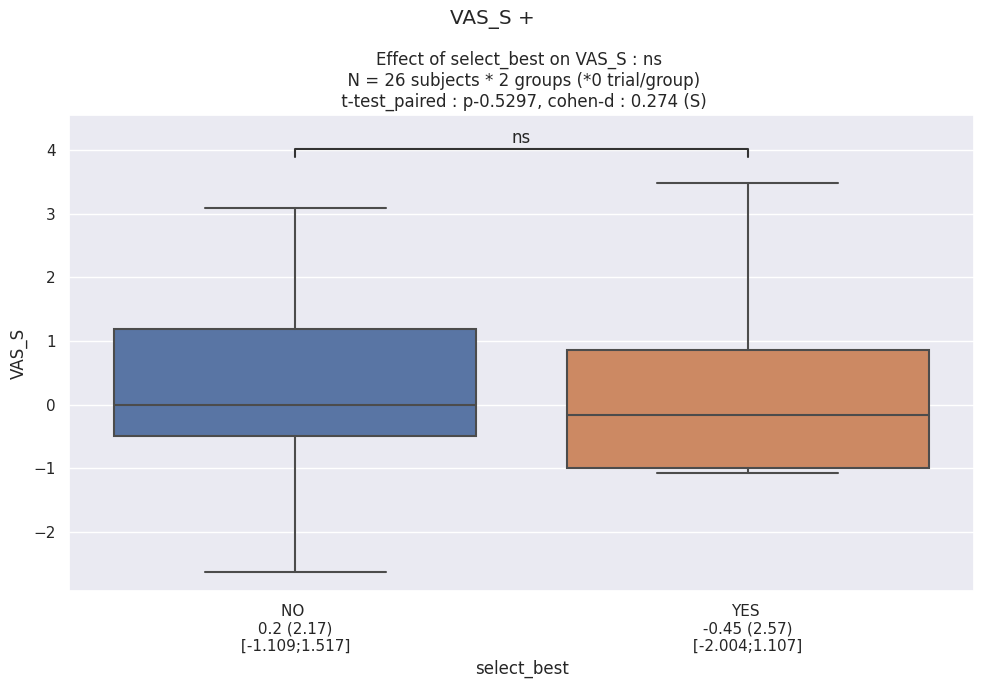

/crnldata/cmo/multisite/DATA_MANIP/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:382: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predictor).std()[outcome].reset_index()[outcome].rename('sd')], axis = 1).round(2).set_index(predictor)
/crnldata/cmo/multisite/DATA_MANIP/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:382: FutureWarning: The default value of numeric_only in DataFrameGroupBy.std is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predictor).std()[outcome].reset_index()[outcome].rena

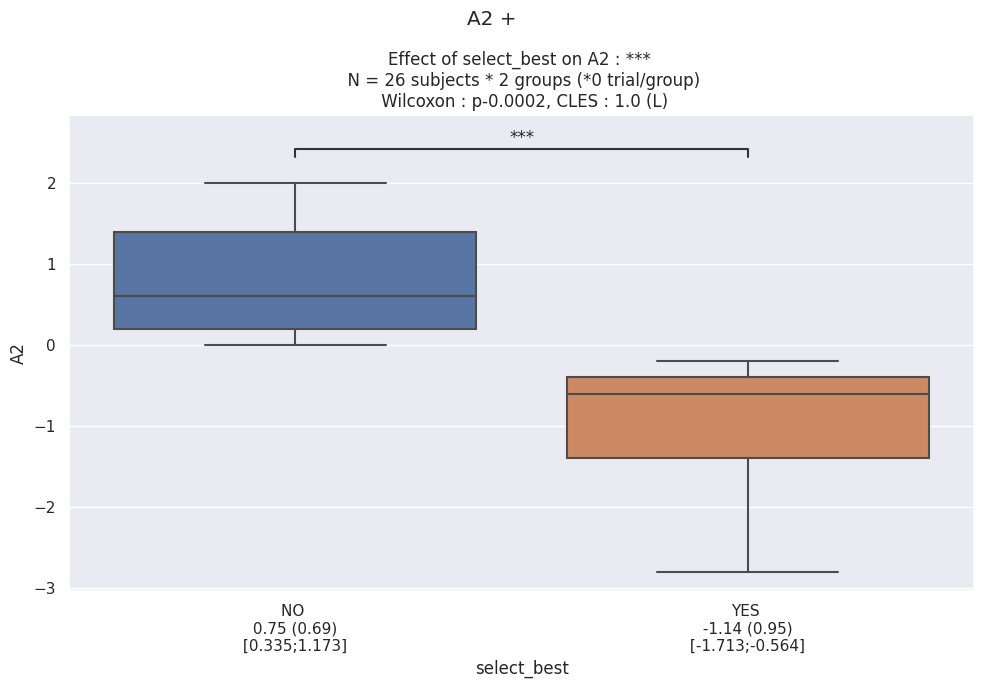

/crnldata/cmo/multisite/DATA_MANIP/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:382: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predictor).std()[outcome].reset_index()[outcome].rename('sd')], axis = 1).round(2).set_index(predictor)
/crnldata/cmo/multisite/DATA_MANIP/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:382: FutureWarning: The default value of numeric_only in DataFrameGroupBy.std is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predictor).std()[outcome].reset_index()[outcome].rena

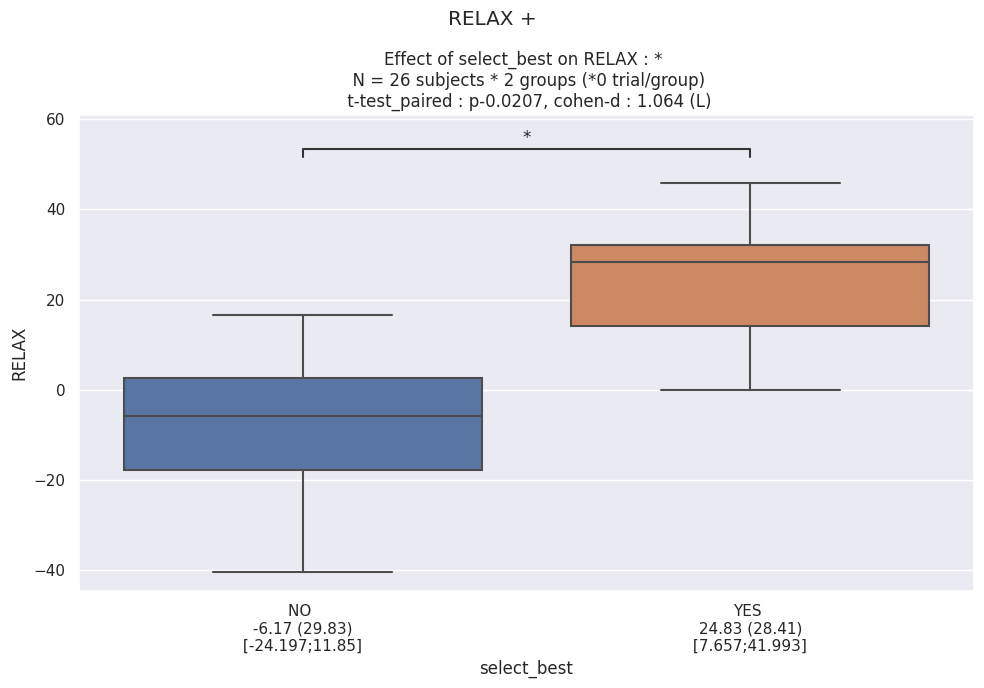

/crnldata/cmo/multisite/DATA_MANIP/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:382: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predictor).std()[outcome].reset_index()[outcome].rename('sd')], axis = 1).round(2).set_index(predictor)
/crnldata/cmo/multisite/DATA_MANIP/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:382: FutureWarning: The default value of numeric_only in DataFrameGroupBy.std is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predictor).std()[outcome].reset_index()[outcome].rena

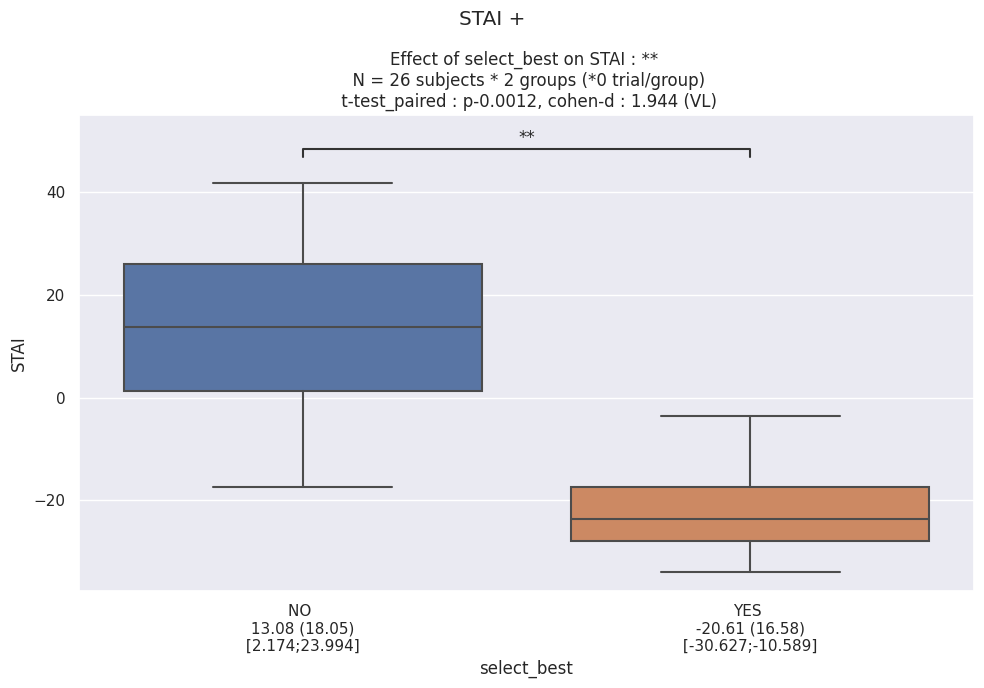

/crnldata/cmo/multisite/DATA_MANIP/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:382: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predictor).std()[outcome].reset_index()[outcome].rename('sd')], axis = 1).round(2).set_index(predictor)
/crnldata/cmo/multisite/DATA_MANIP/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:382: FutureWarning: The default value of numeric_only in DataFrameGroupBy.std is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predictor).std()[outcome].reset_index()[outcome].rena

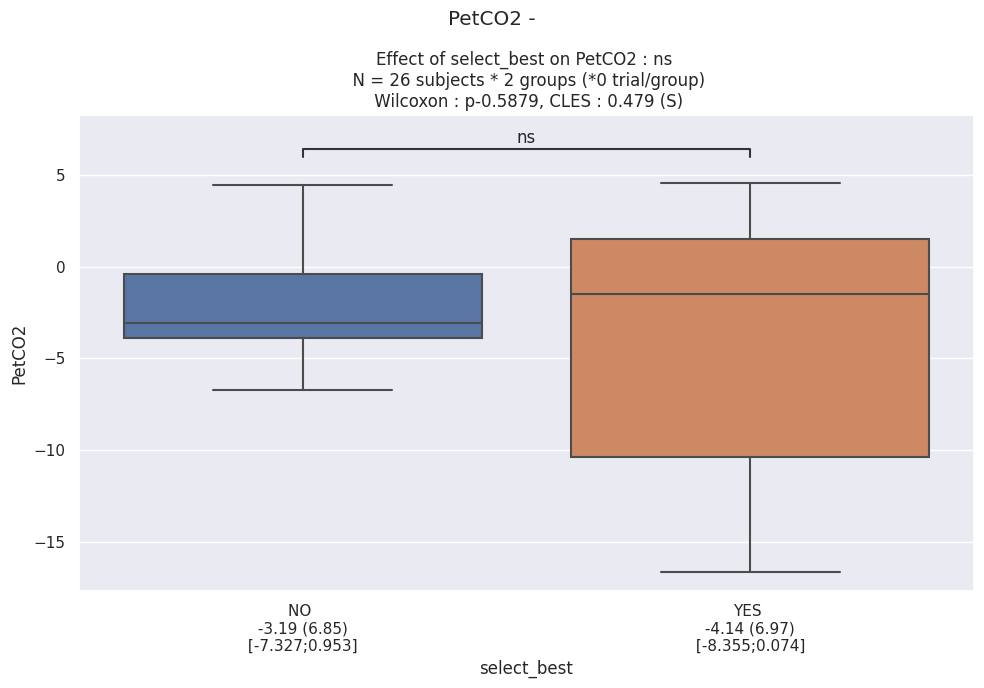

/crnldata/cmo/multisite/DATA_MANIP/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:382: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predictor).std()[outcome].reset_index()[outcome].rename('sd')], axis = 1).round(2).set_index(predictor)
/crnldata/cmo/multisite/DATA_MANIP/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:382: FutureWarning: The default value of numeric_only in DataFrameGroupBy.std is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predictor).std()[outcome].reset_index()[outcome].rena

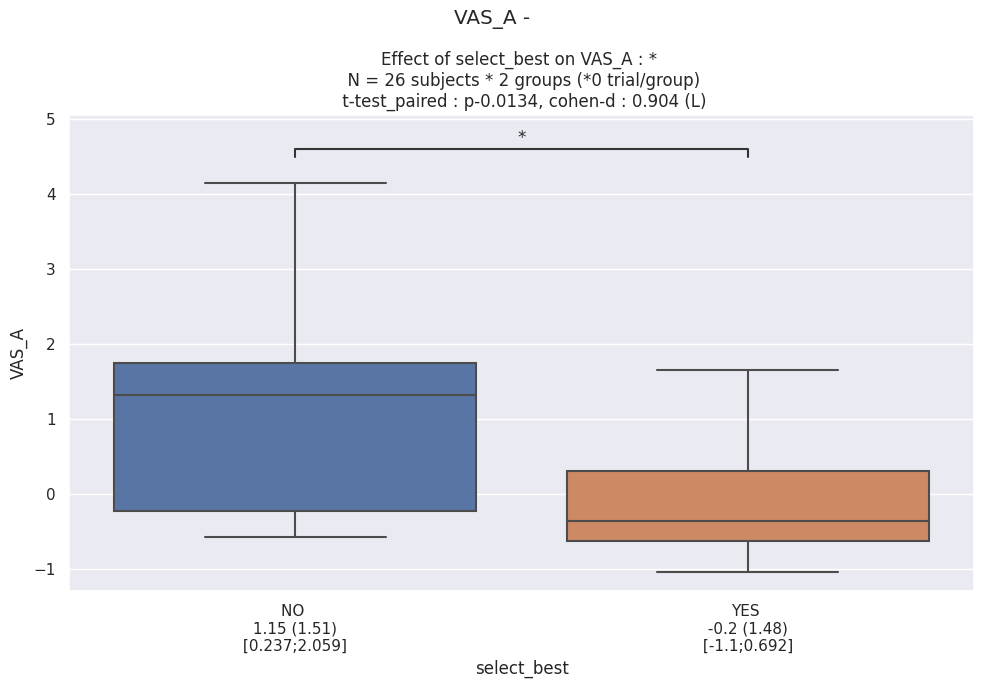

/crnldata/cmo/multisite/DATA_MANIP/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:382: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predictor).std()[outcome].reset_index()[outcome].rename('sd')], axis = 1).round(2).set_index(predictor)
/crnldata/cmo/multisite/DATA_MANIP/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:382: FutureWarning: The default value of numeric_only in DataFrameGroupBy.std is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predictor).std()[outcome].reset_index()[outcome].rena

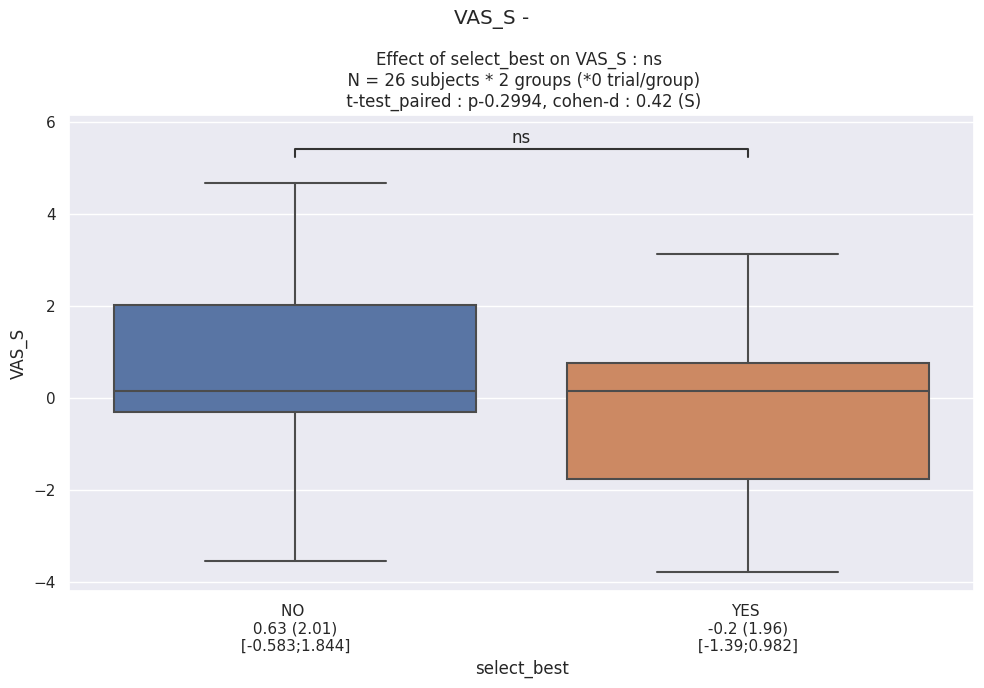

/crnldata/cmo/multisite/DATA_MANIP/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:382: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predictor).std()[outcome].reset_index()[outcome].rename('sd')], axis = 1).round(2).set_index(predictor)
/crnldata/cmo/multisite/DATA_MANIP/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:382: FutureWarning: The default value of numeric_only in DataFrameGroupBy.std is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predictor).std()[outcome].reset_index()[outcome].rena

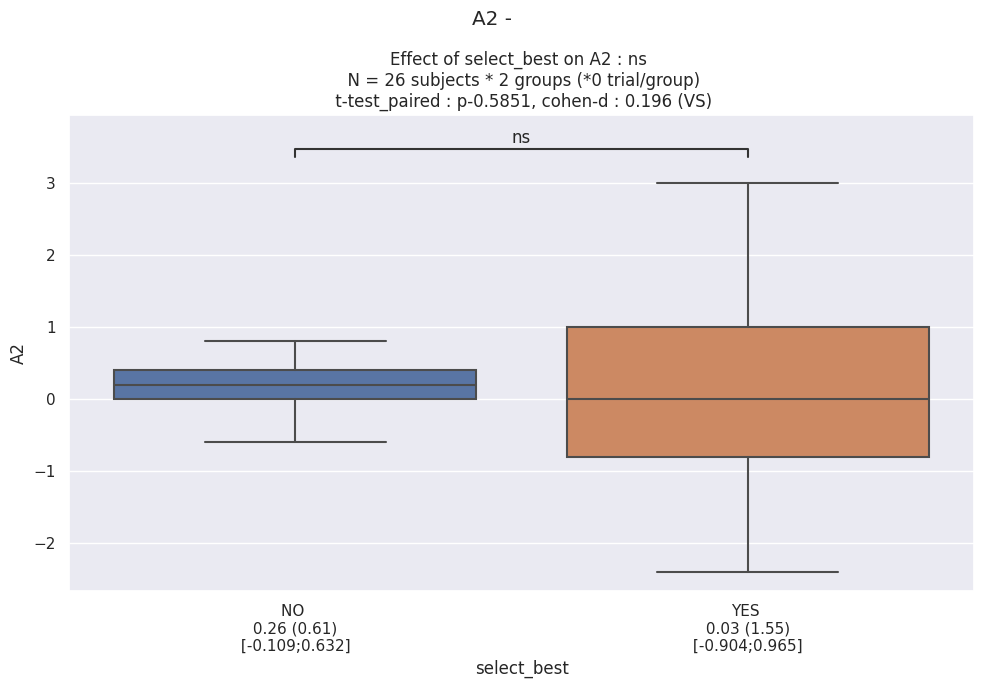

/crnldata/cmo/multisite/DATA_MANIP/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:382: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predictor).std()[outcome].reset_index()[outcome].rename('sd')], axis = 1).round(2).set_index(predictor)
/crnldata/cmo/multisite/DATA_MANIP/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:382: FutureWarning: The default value of numeric_only in DataFrameGroupBy.std is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predictor).std()[outcome].reset_index()[outcome].rena

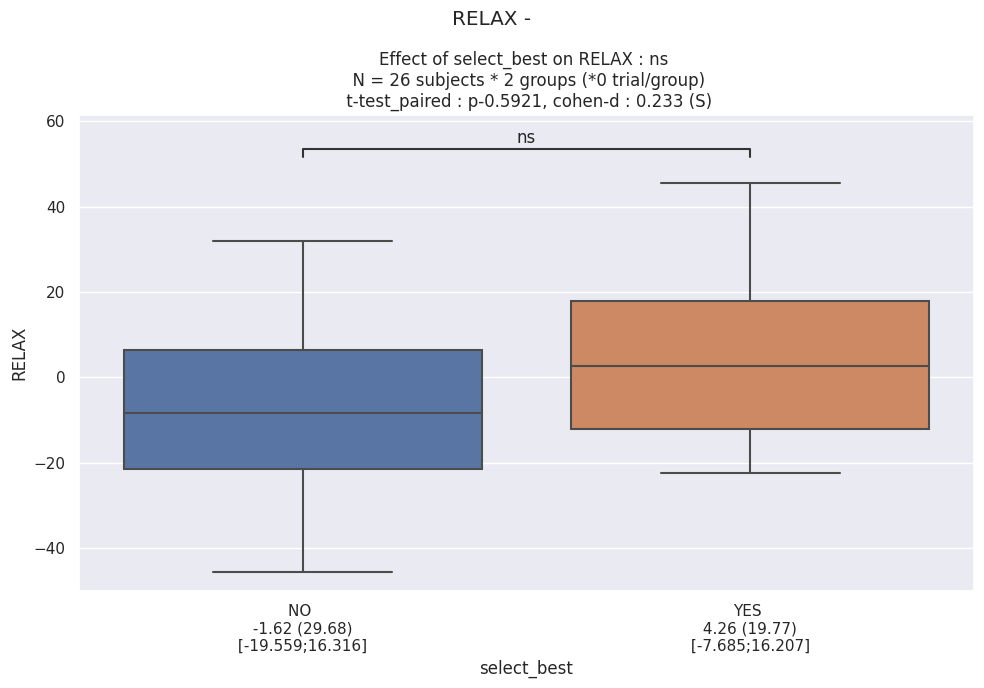

/crnldata/cmo/multisite/DATA_MANIP/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:382: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predictor).std()[outcome].reset_index()[outcome].rename('sd')], axis = 1).round(2).set_index(predictor)
/crnldata/cmo/multisite/DATA_MANIP/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:382: FutureWarning: The default value of numeric_only in DataFrameGroupBy.std is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predictor).std()[outcome].reset_index()[outcome].rena

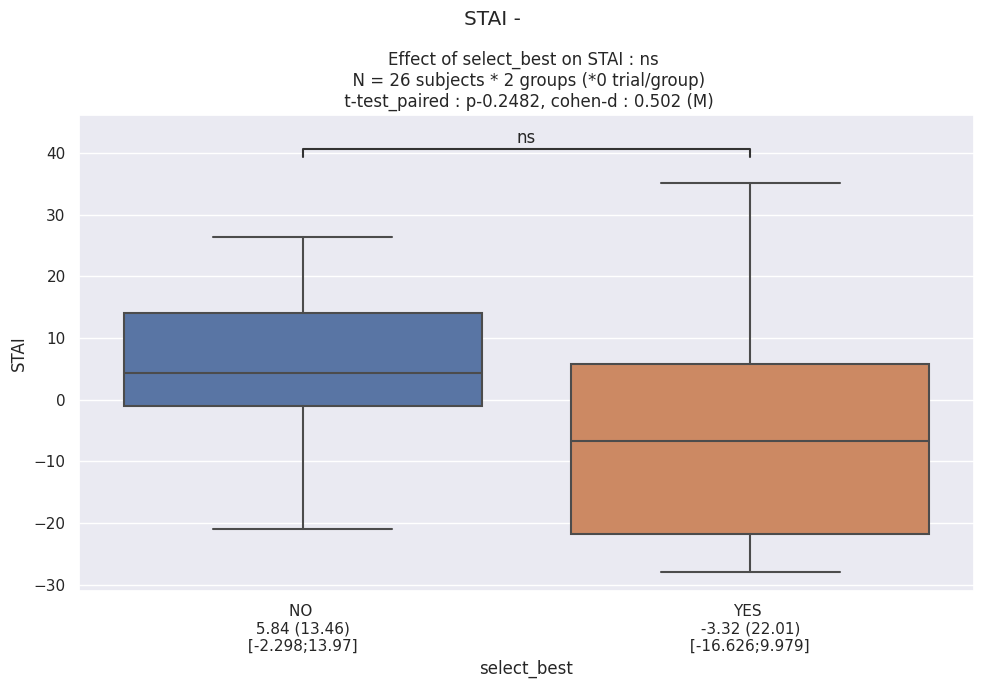

In [ ]:
predictor = 'odor'
for odor in ['+', '-']:
    for metric in ['PetCO2', 'VAS_A', 'VAS_S', 'A2', 'RELAX', 'STAI']:
        outcome = metric
        predictor = 'select_best'
        df_stats = df_CO2_diff.query(f"odor == '{odor}' and sujet in {sujet_list_balanced.tolist()}")
        fig, ax = plt.subplots()
        ax = auto_stats(df_stats, predictor, outcome, ax=ax, subject='sujet', design='within', mode='box', transform=False, verbose=False)
        plt.suptitle(f"{metric} {odor}")
        plt.tight_layout()
        plt.show()

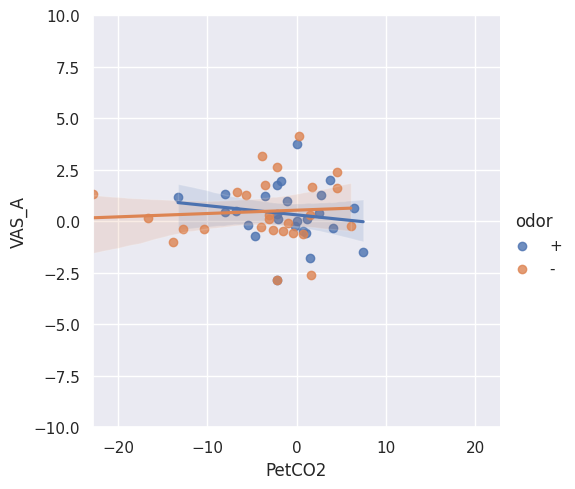

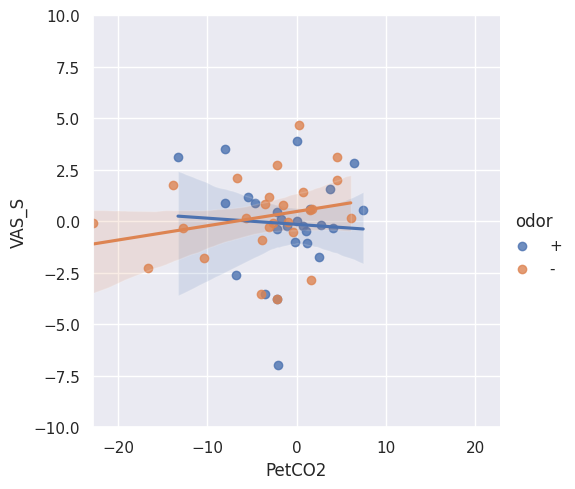

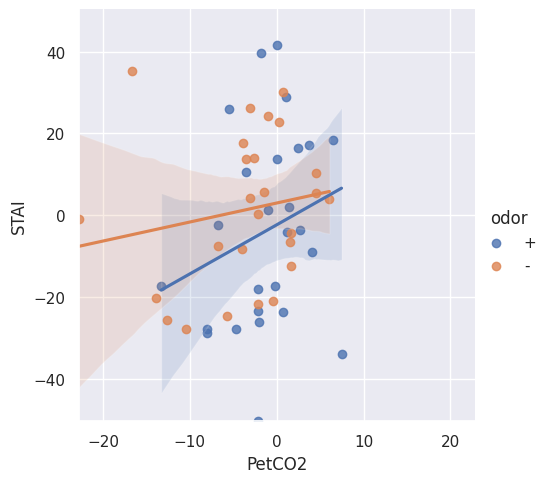

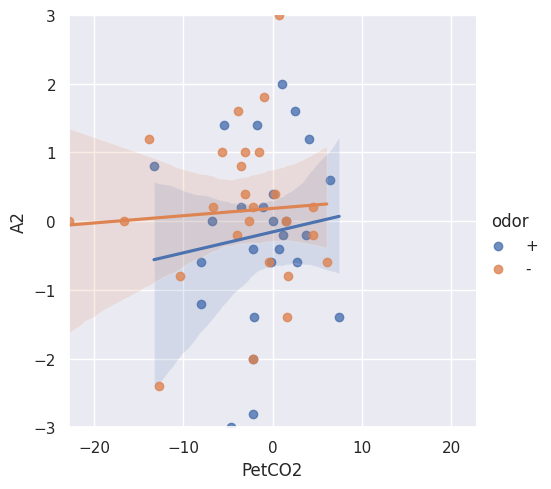

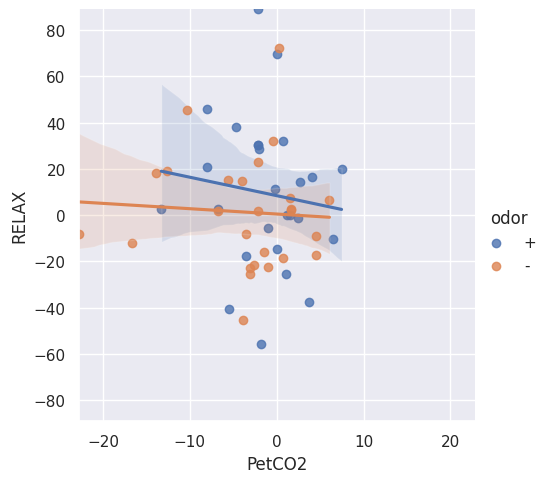

In [ ]:
scale = np.array([np.abs(df_CO2_diff['PetCO2'].values.min()), np.abs(df_CO2_diff['PetCO2'].values.max())]).max()

df_plot = df_CO2_diff
sns.lmplot(data=df_plot, x="PetCO2", y="VAS_A", hue="odor", height=5)
plt.xlim(-scale,scale)
plt.ylim(-10,10)
plt.show()

sns.lmplot(data=df_plot, x="PetCO2", y="VAS_S", hue="odor", height=5)
plt.xlim(-scale,scale)
plt.ylim(-10,10)
plt.show()

scale_y = np.array([np.abs(df_CO2_diff['STAI'].values.min()), np.abs(df_CO2_diff['STAI'].values.max())]).max()
sns.lmplot(data=df_plot, x="PetCO2", y="STAI", hue="odor", height=5)
plt.xlim(-scale,scale)
plt.ylim(-scale_y,scale_y)
plt.show()

scale_y = np.array([np.abs(df_CO2_diff['A2'].values.min()), np.abs(df_CO2_diff['A2'].values.max())]).max()
sns.lmplot(data=df_plot, x="PetCO2", y="A2", hue="odor", height=5)
plt.xlim(-scale,scale)
plt.ylim(-scale_y,scale_y)
plt.show()

scale_y = np.array([np.abs(df_CO2_diff['RELAX'].values.min()), np.abs(df_CO2_diff['RELAX'].values.max())]).max()
sns.lmplot(data=df_plot, x="PetCO2", y="RELAX", hue="odor", height=5)
plt.xlim(-scale,scale)
plt.ylim(-scale_y,scale_y)
plt.show()

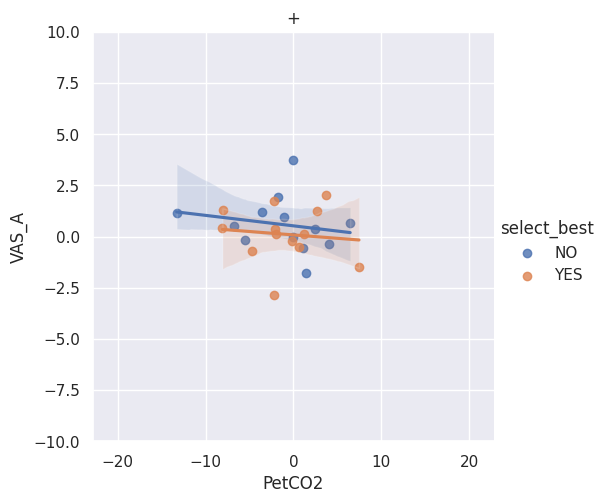

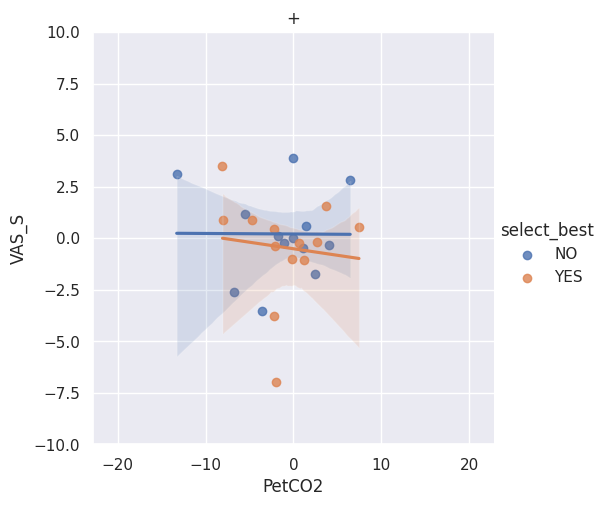

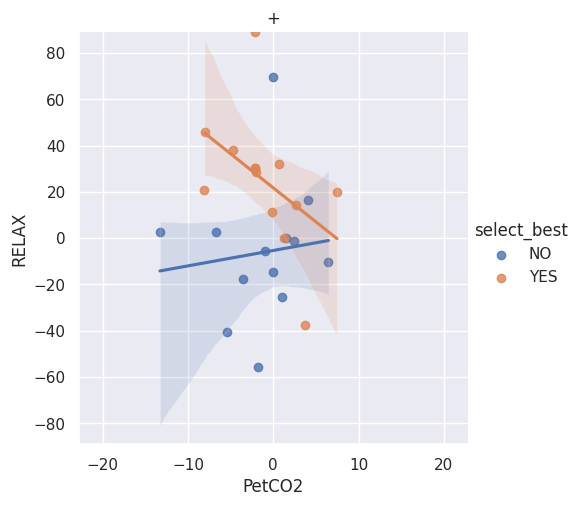

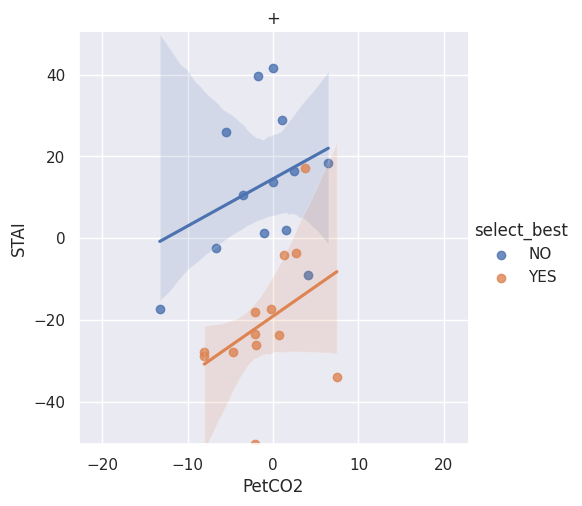

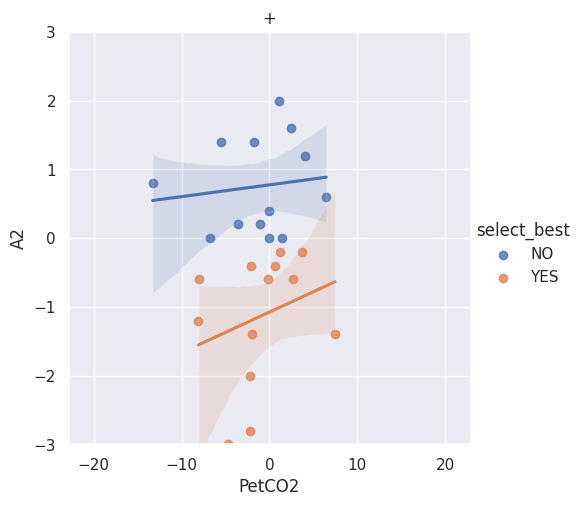

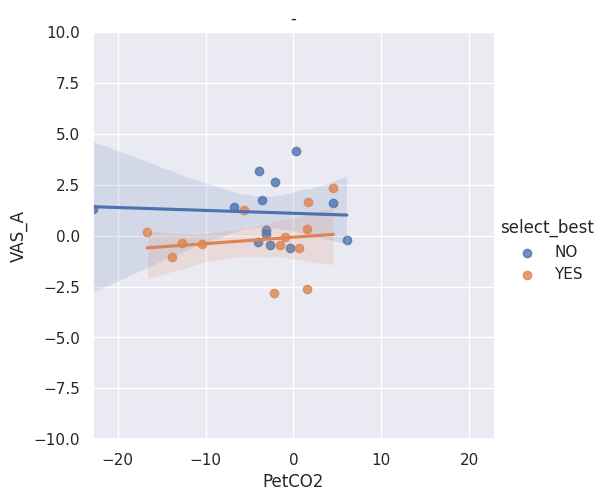

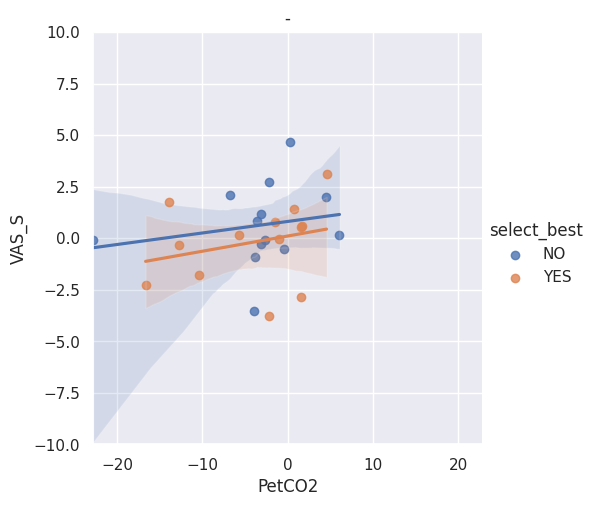

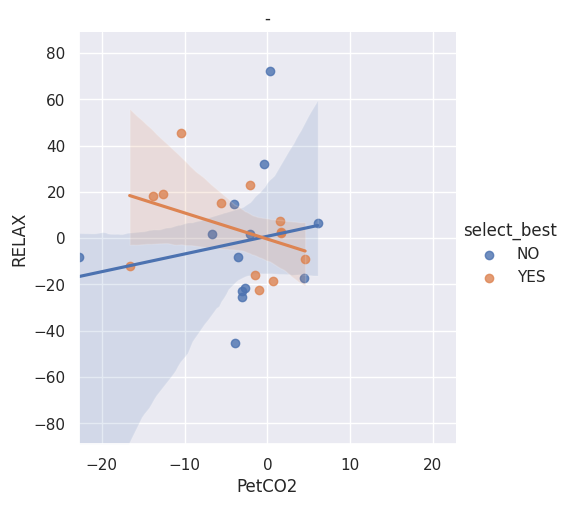

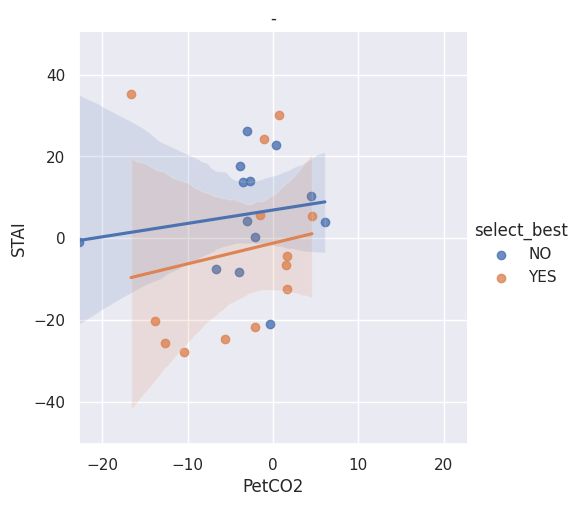

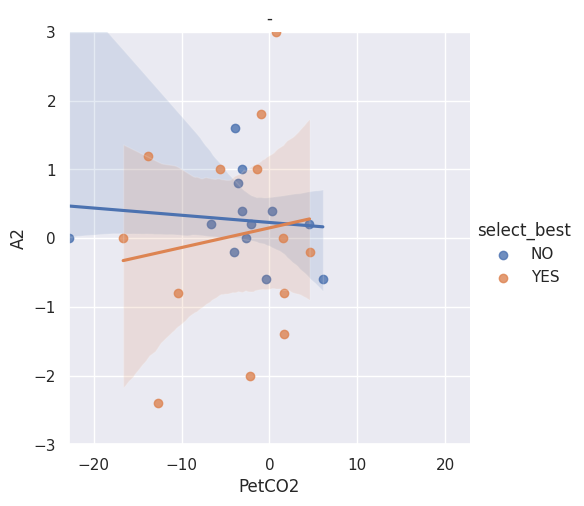

In [ ]:
scale = np.array([np.abs(df_CO2_diff['PetCO2'].values.min()), np.abs(df_CO2_diff['PetCO2'].values.max())]).max()

for odor in ['+', '-']:
    df_plot = df_CO2_diff.query(f"odor == '{odor}'")
    sns.lmplot(data=df_plot, x="PetCO2", y="VAS_A", hue="select_best", height=5)
    plt.title(odor)
    plt.xlim(-scale,scale)
    plt.ylim(-10,10)
    plt.show()

    sns.lmplot(data=df_plot, x="PetCO2", y="VAS_S", hue="select_best", height=5)
    plt.title(odor)
    plt.xlim(-scale,scale)
    plt.ylim(-10,10)
    plt.show()

    scale_y = np.array([np.abs(df_CO2_diff['RELAX'].values.min()), np.abs(df_CO2_diff['RELAX'].values.max())]).max()
    sns.lmplot(data=df_plot, x="PetCO2", y="RELAX", hue="select_best", height=5)
    plt.title(odor)
    plt.xlim(-scale,scale)
    plt.ylim(-scale_y,scale_y)
    plt.show()

    scale_y = np.array([np.abs(df_CO2_diff['STAI'].values.min()), np.abs(df_CO2_diff['STAI'].values.max())]).max()
    sns.lmplot(data=df_plot, x="PetCO2", y="STAI", hue="select_best", height=5)
    plt.title(odor)
    plt.xlim(-scale,scale)
    plt.ylim(-scale_y,scale_y)
    plt.show()

    scale_y = np.array([np.abs(df_CO2_diff['A2'].values.min()), np.abs(df_CO2_diff['A2'].values.max())]).max()
    sns.lmplot(data=df_plot, x="PetCO2", y="A2", hue="select_best", height=5)
    plt.title(odor)
    plt.xlim(-scale,scale)
    plt.ylim(-scale_y,scale_y)
    plt.show()

## INTRASESSION

In [ ]:
df_A2.query(f"sujet == '{sujet_rev}' and session == '{odor}' and cond == 'CO2'")['value'].values[0]

0.0

In [ ]:
data = {'sujet' : [], 'odor' : [], 'PetCO2' : [], 'STAI' : [], 'RELAX' : [], 'select_best' : []}

for sujet in sujet_list_erp:
    
    for odor in odor_list:

        sujet_rev = f"{sujet[2:]}{sujet[:2]}"

        data['sujet'].append(sujet)
        data['odor'].append(odor)
        data['select_best'].append(df_CO2.query(f"sujet == '{sujet}' and odor == 'o' and cond == 'CO2'")['select_best'].values[0])

        diff_petco2 = df_CO2.query(f"sujet == '{sujet}' and odor == '{odor}' and cond == 'CO2'")['PetCO2'].values[0] - df_CO2.query(f"sujet == '{sujet}' and odor == 'o' and cond == 'FR_CV_1'")['PetCO2'].values[0]

        diff_stai = df_stai.query(f"sujet == '{sujet_rev}' and session == '{odor}' and cond == 'CO2'")['val'].values[0] - df_stai.query(f"sujet == '{sujet_rev}' and session == 'o' and cond == 'FR_CV_1'")['val'].values[0]
        diff_relax = df_relax.query(f"sujet == '{sujet_rev}' and session == '{odor}' and cond == 'CO2'")['val'].values[0] - df_relax.query(f"sujet == '{sujet_rev}' and session == 'o' and cond == 'FR_CV_1'")['val'].values[0]
        
        data['PetCO2'].append(diff_petco2)
        data['STAI'].append(diff_stai)
        data['RELAX'].append(diff_relax)

df_CO2_diff_intra = pd.DataFrame(data)
df_CO2_diff_intra   


,sujet,odor,PetCO2,STAI,RELAX,select_best
0,04GB,o,19.066789,1.273885,-1.273885,NO
1,04GB,+,12.324832,-1.199776,1.305933,NO
2,04GB,-,-3.712514,0.212314,-9.554140,NO
3,05LV,o,30.153892,0.636943,-2.547771,NO
4,05LV,+,31.630387,2.637131,-2.531646,NO
...,...,...,...,...,...,...
73,32CM,+,25.198347,23.118280,-26.451613,YES
74,32CM,-,28.029314,76.757651,-75.488007,YES
75,33MA,o,23.115365,66.991342,-90.909091,YES
76,33MA,+,20.955724,16.550063,-1.876833,YES


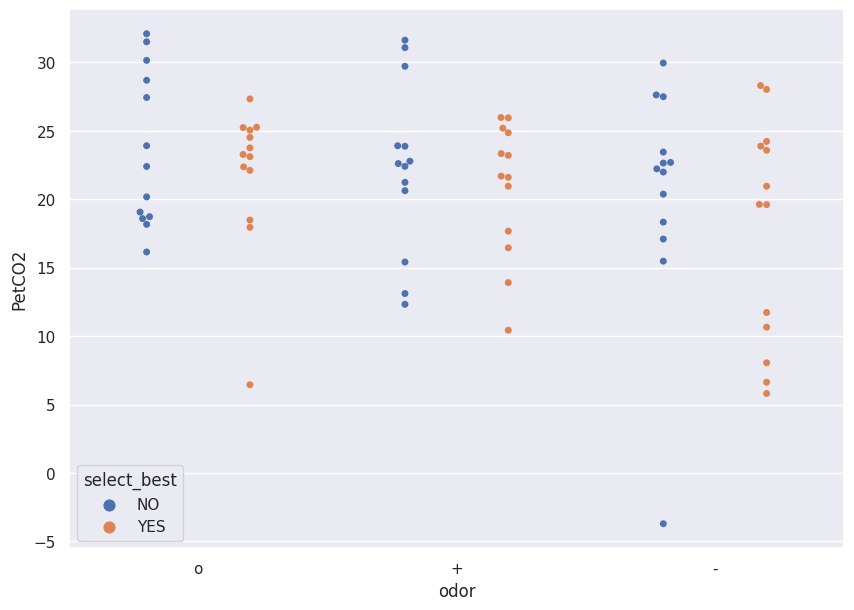

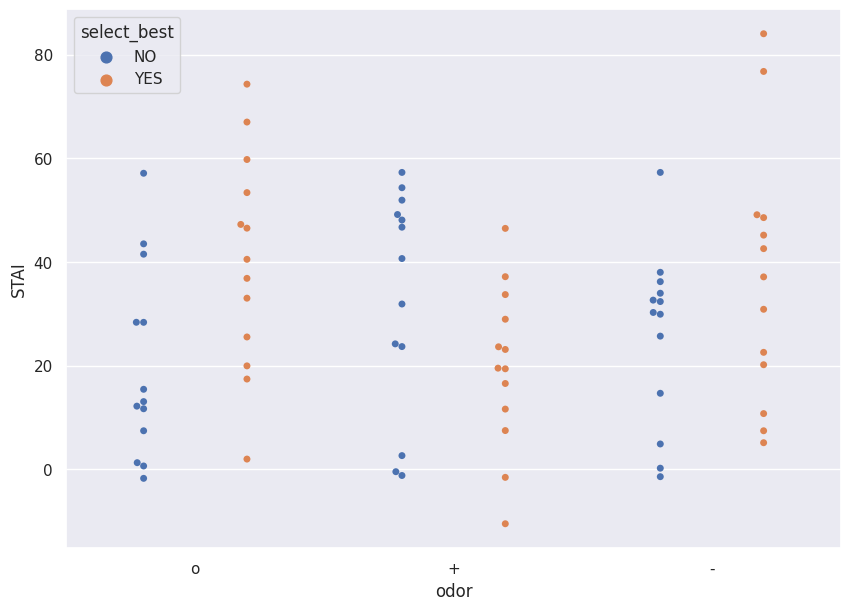

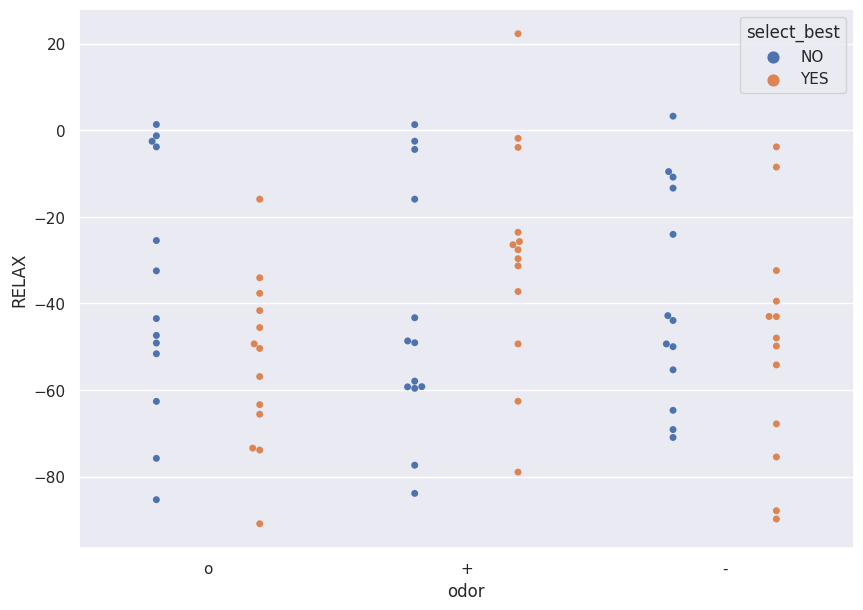

In [ ]:
df_plot = df_CO2_diff_intra
sns.swarmplot(data=df_plot, x="odor", y="PetCO2", hue="select_best", dodge=True)
plt.show()
sns.swarmplot(data=df_plot, x="odor", y="STAI", hue="select_best", dodge=True)
plt.show()
sns.swarmplot(data=df_plot, x="odor", y="RELAX", hue="select_best", dodge=True)
plt.show()

/crnldata/cmo/multisite/DATA_MANIP/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:382: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predictor).std()[outcome].reset_index()[outcome].rename('sd')], axis = 1).round(2).set_index(predictor)
/crnldata/cmo/multisite/DATA_MANIP/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:382: FutureWarning: The default value of numeric_only in DataFrameGroupBy.std is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predictor).std()[outcome].reset_index()[outcome].rena

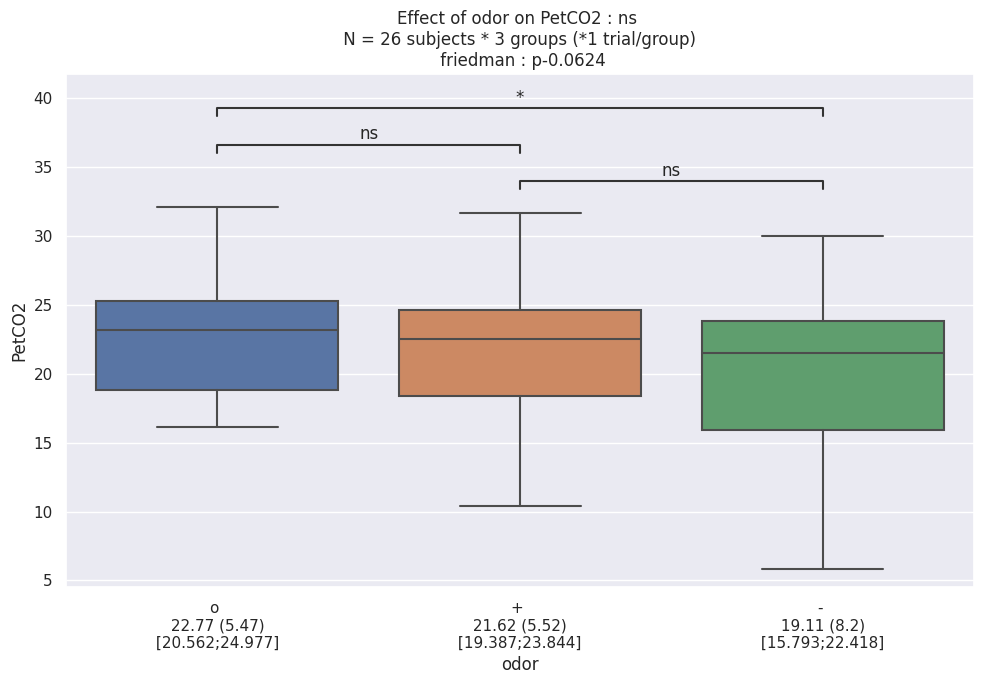

/home/jules.granget/myenvs/py39c/lib64/python3.9/site-packages/pingouin/parametric.py:551: FutureWarning: Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)
  ss_resall = grp_with.apply(lambda x: (x - x.mean()) ** 2).sum()
/crnldata/cmo/multisite/DATA_MANIP/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:382: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predictor).std()[outcome]

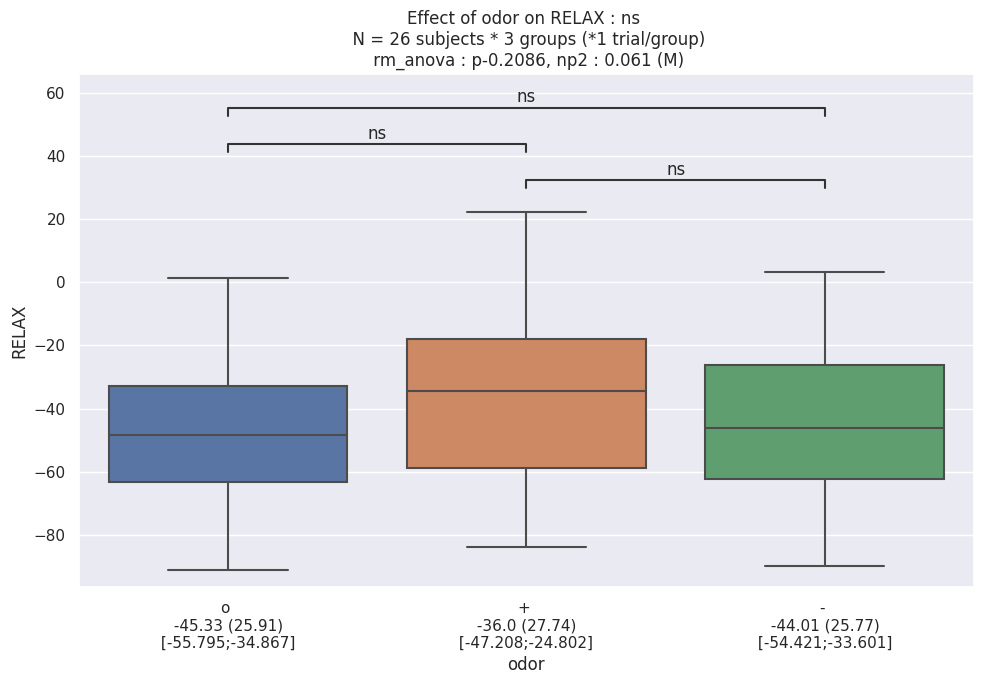

/home/jules.granget/myenvs/py39c/lib64/python3.9/site-packages/pingouin/parametric.py:551: FutureWarning: Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)
  ss_resall = grp_with.apply(lambda x: (x - x.mean()) ** 2).sum()
/crnldata/cmo/multisite/DATA_MANIP/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:382: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predictor).std()[outcome]

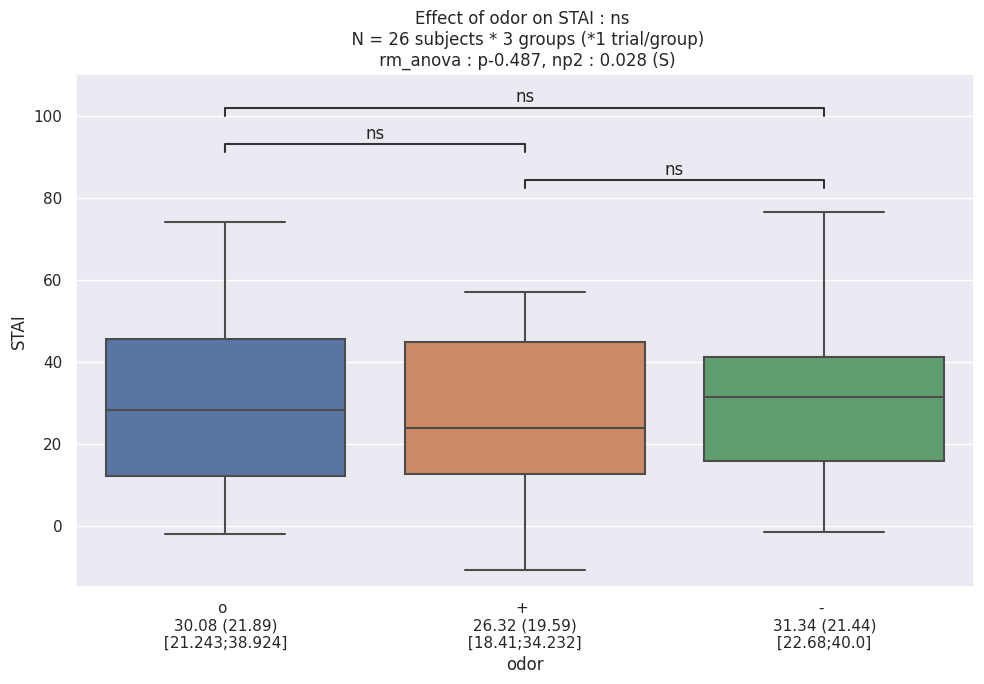

In [ ]:
df_stats = df_CO2_diff_intra
predictor = 'odor'
for metric in ['PetCO2', 'RELAX', 'STAI']:
    outcome = metric
    fig, ax = plt.subplots()
    ax = auto_stats(df_stats, predictor, outcome, ax=ax, subject='sujet', design='within', mode='box', transform=False, verbose=False)
    plt.tight_layout()
    plt.show()

/crnldata/cmo/multisite/DATA_MANIP/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:382: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predictor).std()[outcome].reset_index()[outcome].rename('sd')], axis = 1).round(2).set_index(predictor)
/crnldata/cmo/multisite/DATA_MANIP/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:382: FutureWarning: The default value of numeric_only in DataFrameGroupBy.std is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predictor).std()[outcome].reset_index()[outcome].rena

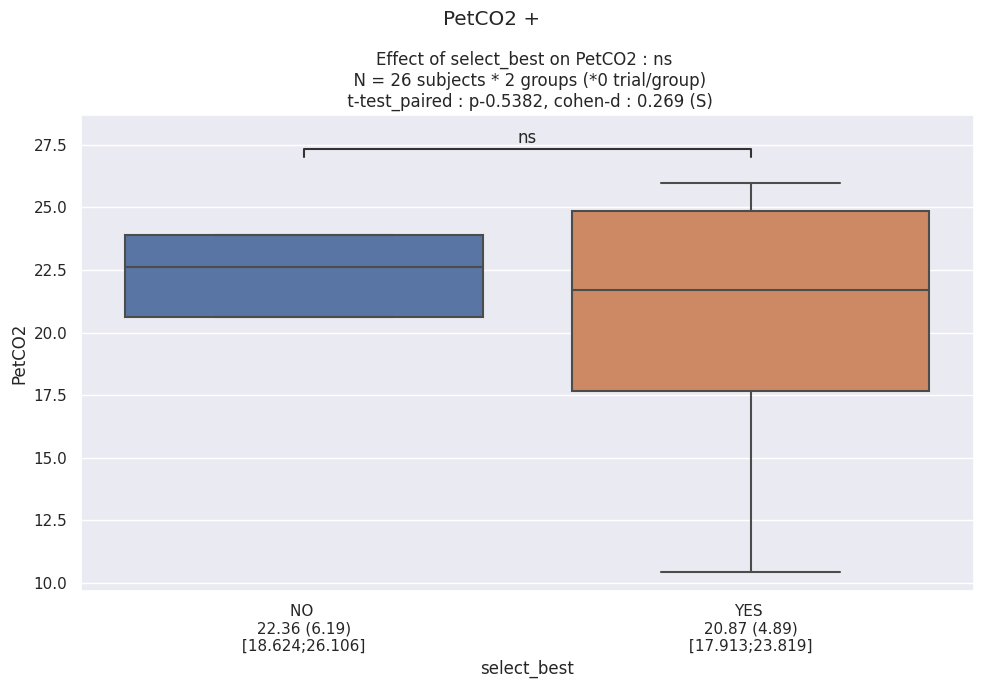

/crnldata/cmo/multisite/DATA_MANIP/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:382: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predictor).std()[outcome].reset_index()[outcome].rename('sd')], axis = 1).round(2).set_index(predictor)
/crnldata/cmo/multisite/DATA_MANIP/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:382: FutureWarning: The default value of numeric_only in DataFrameGroupBy.std is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predictor).std()[outcome].reset_index()[outcome].rena

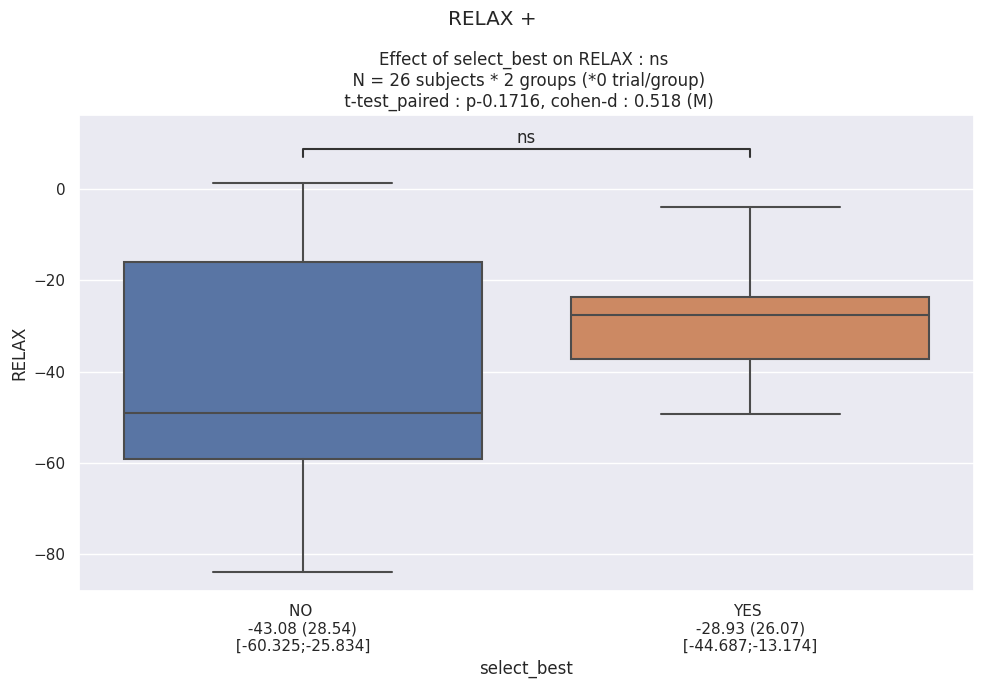

/crnldata/cmo/multisite/DATA_MANIP/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:382: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predictor).std()[outcome].reset_index()[outcome].rename('sd')], axis = 1).round(2).set_index(predictor)
/crnldata/cmo/multisite/DATA_MANIP/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:382: FutureWarning: The default value of numeric_only in DataFrameGroupBy.std is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predictor).std()[outcome].reset_index()[outcome].rena

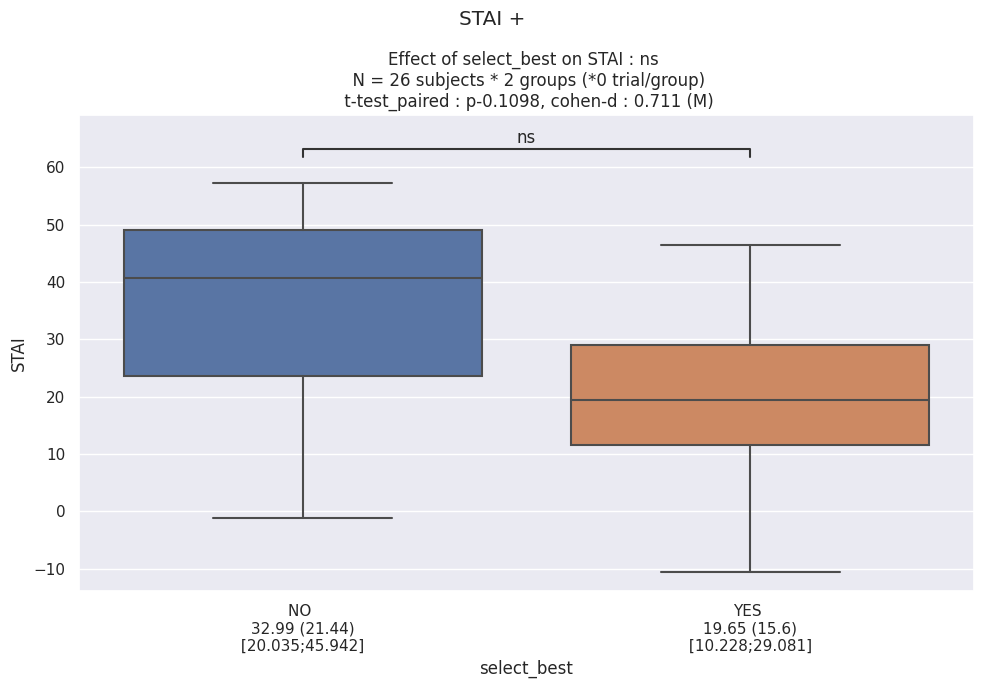

/crnldata/cmo/multisite/DATA_MANIP/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:382: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predictor).std()[outcome].reset_index()[outcome].rename('sd')], axis = 1).round(2).set_index(predictor)
/crnldata/cmo/multisite/DATA_MANIP/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:382: FutureWarning: The default value of numeric_only in DataFrameGroupBy.std is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predictor).std()[outcome].reset_index()[outcome].rena

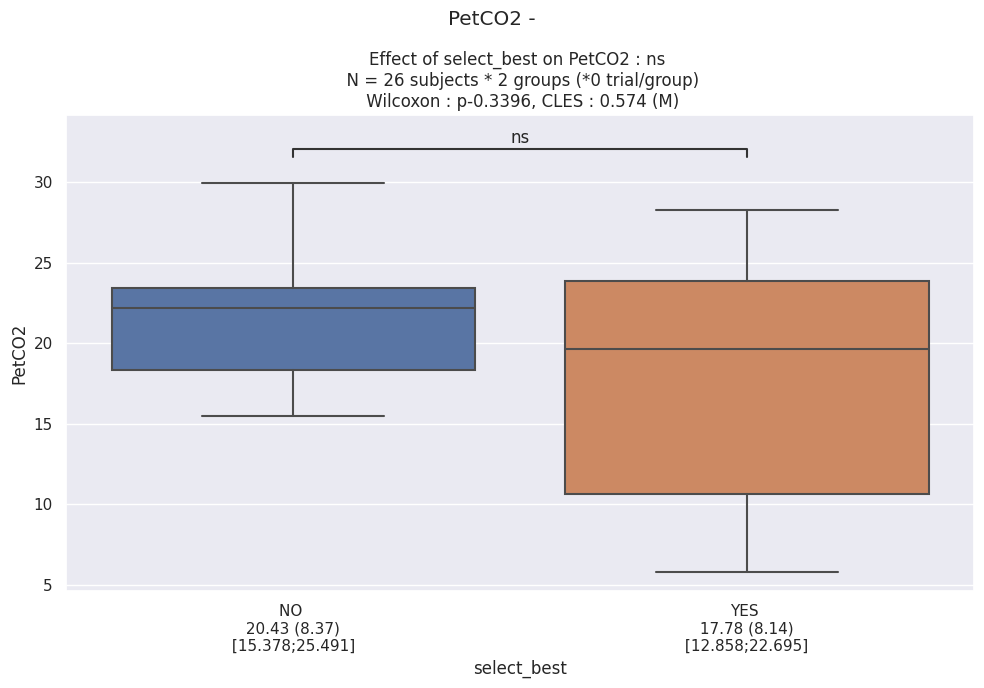

/crnldata/cmo/multisite/DATA_MANIP/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:382: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predictor).std()[outcome].reset_index()[outcome].rename('sd')], axis = 1).round(2).set_index(predictor)
/crnldata/cmo/multisite/DATA_MANIP/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:382: FutureWarning: The default value of numeric_only in DataFrameGroupBy.std is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predictor).std()[outcome].reset_index()[outcome].rena

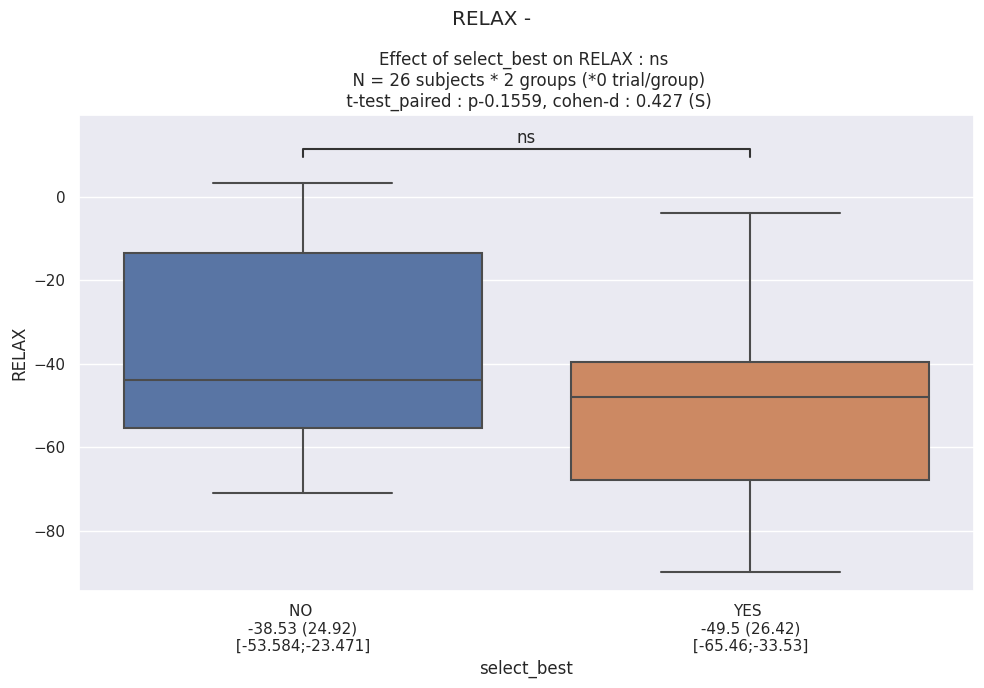

/crnldata/cmo/multisite/DATA_MANIP/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:382: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predictor).std()[outcome].reset_index()[outcome].rename('sd')], axis = 1).round(2).set_index(predictor)
/crnldata/cmo/multisite/DATA_MANIP/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:382: FutureWarning: The default value of numeric_only in DataFrameGroupBy.std is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predictor).std()[outcome].reset_index()[outcome].rena

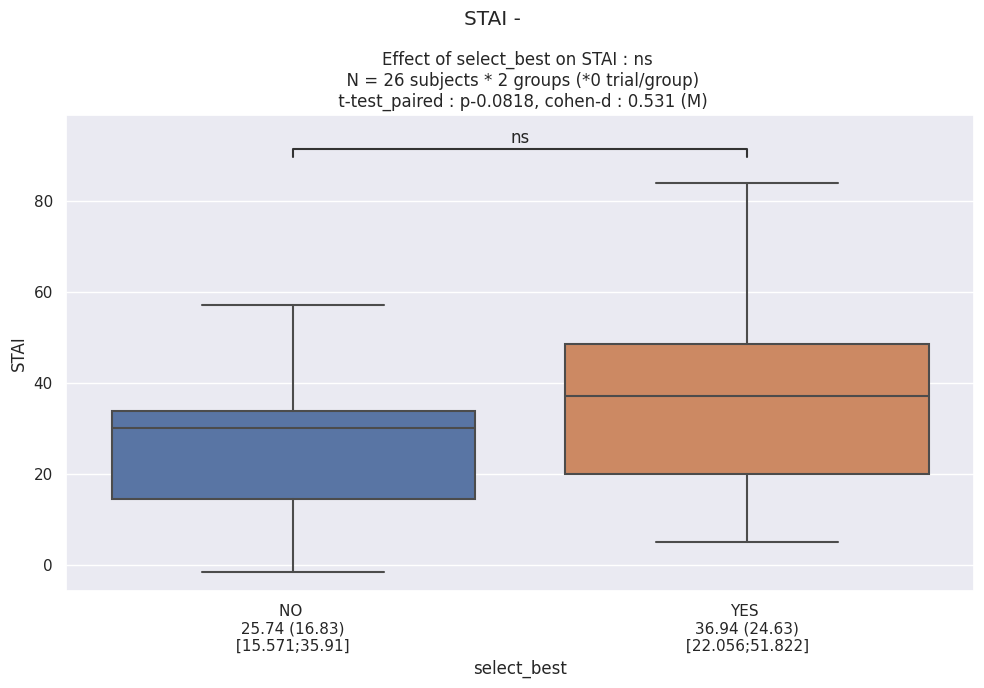

In [ ]:
predictor = 'odor'
for odor in ['+', '-']:
    for metric in ['PetCO2', 'RELAX', 'STAI']:
        outcome = metric
        predictor = 'select_best'
        df_stats = df_CO2_diff_intra.query(f"odor == '{odor}' and sujet in {sujet_list_balanced.tolist()}")
        fig, ax = plt.subplots()
        ax = auto_stats(df_stats, predictor, outcome, ax=ax, subject='sujet', design='within', mode='box', transform=False, verbose=False)
        plt.suptitle(f"{metric} {odor}")
        plt.tight_layout()
        plt.show()

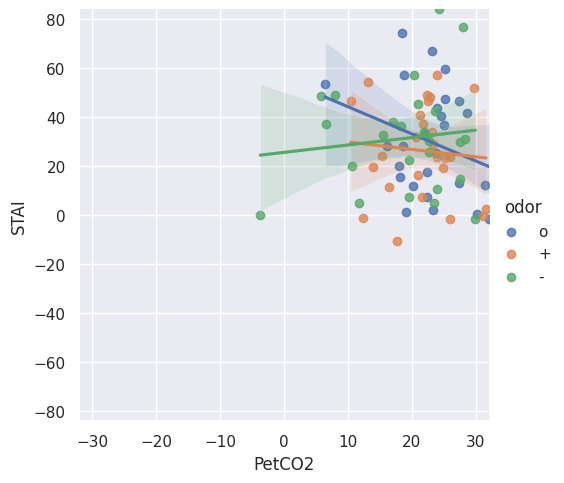

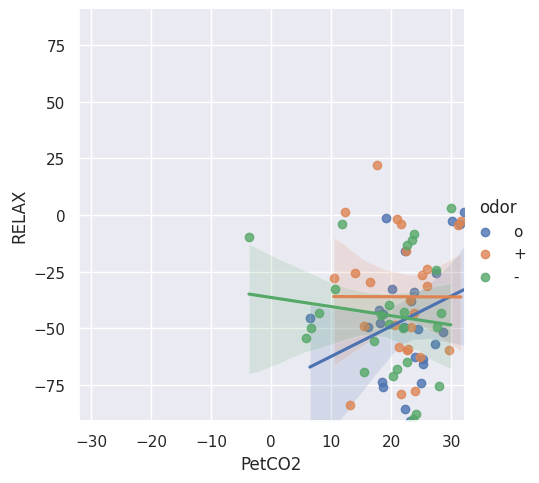

In [ ]:
scale = np.array([np.abs(df_CO2_diff_intra['PetCO2'].values.min()), np.abs(df_CO2_diff_intra['PetCO2'].values.max())]).max()

df_plot = df_CO2_diff_intra
scale_y = np.array([np.abs(df_CO2_diff_intra['STAI'].values.min()), np.abs(df_CO2_diff_intra['STAI'].values.max())]).max()
sns.lmplot(data=df_plot, x="PetCO2", y="STAI", hue="odor", height=5)
plt.xlim(-scale,scale)
plt.ylim(-scale_y,scale_y)
plt.show()

scale_y = np.array([np.abs(df_CO2_diff_intra['RELAX'].values.min()), np.abs(df_CO2_diff_intra['RELAX'].values.max())]).max()
sns.lmplot(data=df_plot, x="PetCO2", y="RELAX", hue="odor", height=5)
plt.xlim(-scale,scale)
plt.ylim(-scale_y,scale_y)
plt.show()

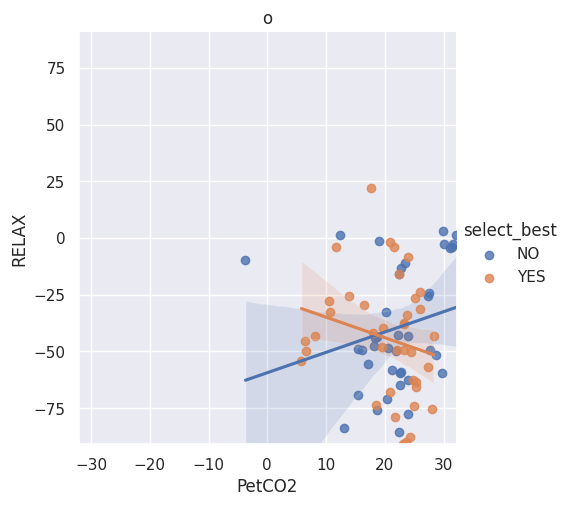

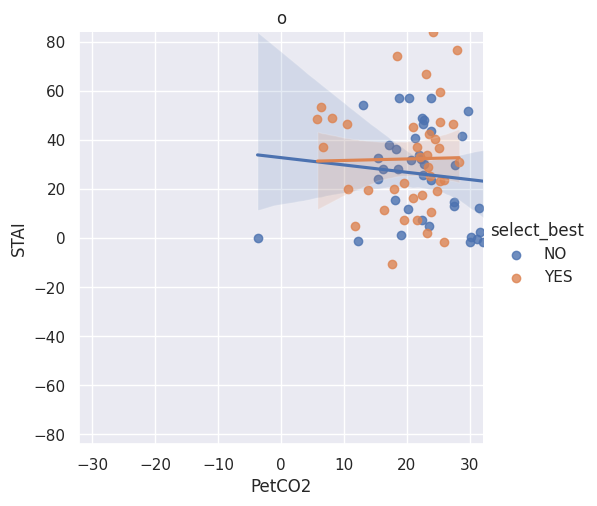

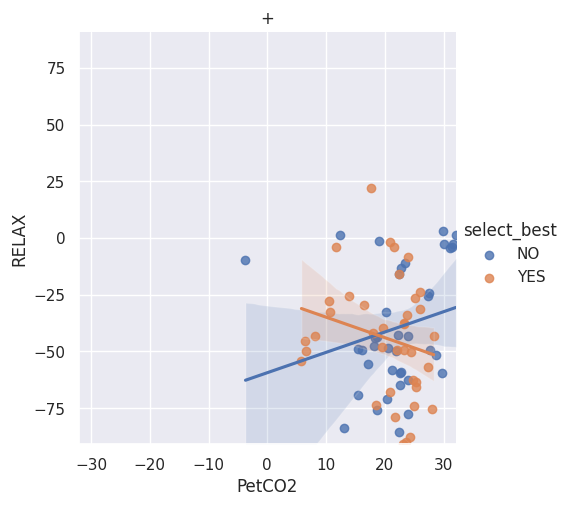

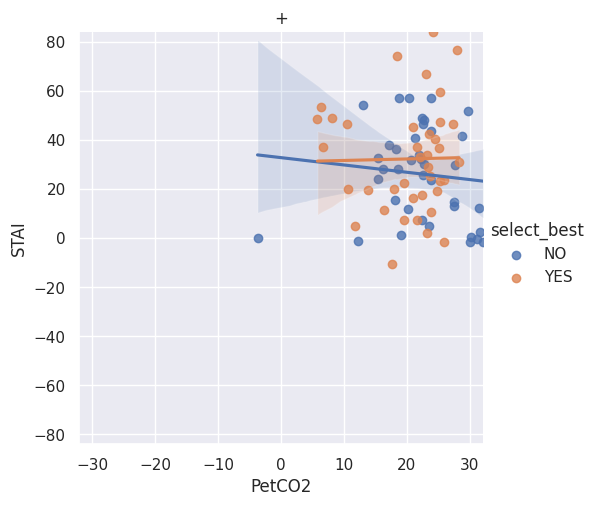

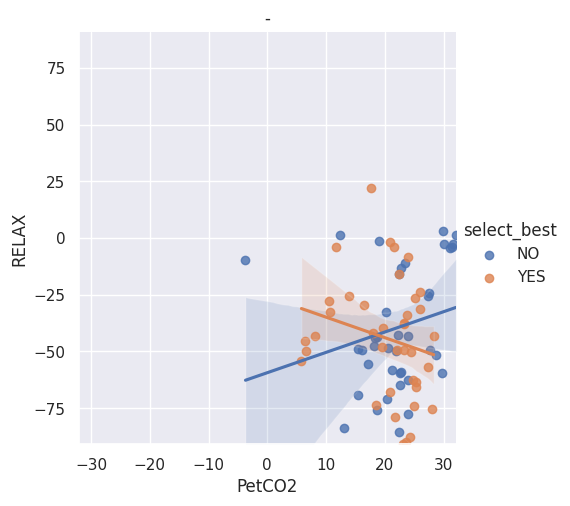

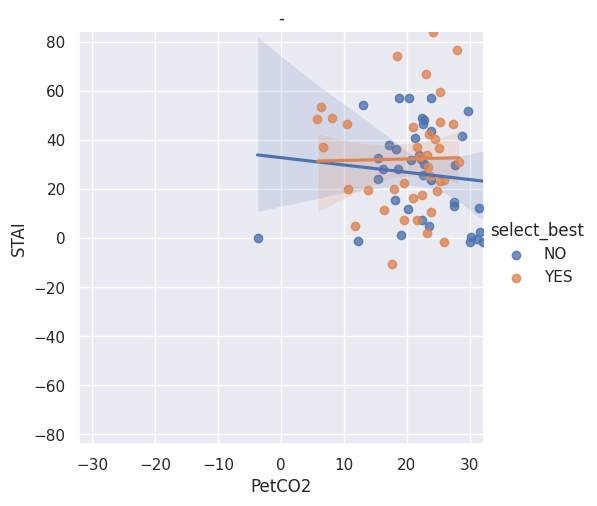

In [ ]:
scale = np.array([np.abs(df_CO2_diff_intra['PetCO2'].values.min()), np.abs(df_CO2_diff_intra['PetCO2'].values.max())]).max()

for odor in odor_list:

    scale_y = np.array([np.abs(df_CO2_diff_intra['RELAX'].values.min()), np.abs(df_CO2_diff_intra['RELAX'].values.max())]).max()
    sns.lmplot(data=df_plot, x="PetCO2", y="RELAX", hue="select_best", height=5)
    plt.title(odor)
    plt.xlim(-scale,scale)
    plt.ylim(-scale_y,scale_y)
    plt.show()

    scale_y = np.array([np.abs(df_CO2_diff_intra['STAI'].values.min()), np.abs(df_CO2_diff_intra['STAI'].values.max())]).max()
    sns.lmplot(data=df_plot, x="PetCO2", y="STAI", hue="select_best", height=5)
    plt.title(odor)
    plt.xlim(-scale,scale)
    plt.ylim(-scale_y,scale_y)
    plt.show()

## FILTER

In [ ]:
df_relax.query(f"sujet == '{sujet}' and cond == 'CO2' and session == 'o'")['val']

22    13.207547
Name: val, dtype: float64

In [ ]:
sujet_best_CO2 = []
sujet_best_MECA = []

for sujet in sujet_list:

    if df_relax.query(f"sujet == '{sujet}' and cond == 'CO2' and session == 'o'")['val'].values < df_relax.query(f"sujet == '{sujet}' and cond == 'CO2' and session == '+'")['val'].values:
        sujet_best_CO2.append(sujet)
    if df_relax.query(f"sujet == '{sujet}' and cond == 'MECA' and session == 'o'")['val'].values < df_relax.query(f"sujet == '{sujet}' and cond == 'CO2' and session == '+'")['val'].values:
        sujet_best_MECA.append(sujet)    

print(sujet_best_CO2)
print(sujet_best_MECA)

['MJ02', 'GB04', 'LV05', 'DM08', 'TA09', 'BH10', 'BD12', 'FP13', 'MD14', 'GM16', 'TM19', 'ZV21', 'DI22', 'TJ24', 'MN26', 'BD27', 'SC29', 'HJ31', 'CM32', 'MA33']
['GB04', 'TA09', 'TJ24', 'AR30', 'HJ31', 'MA33']


(0.0, 10.0)

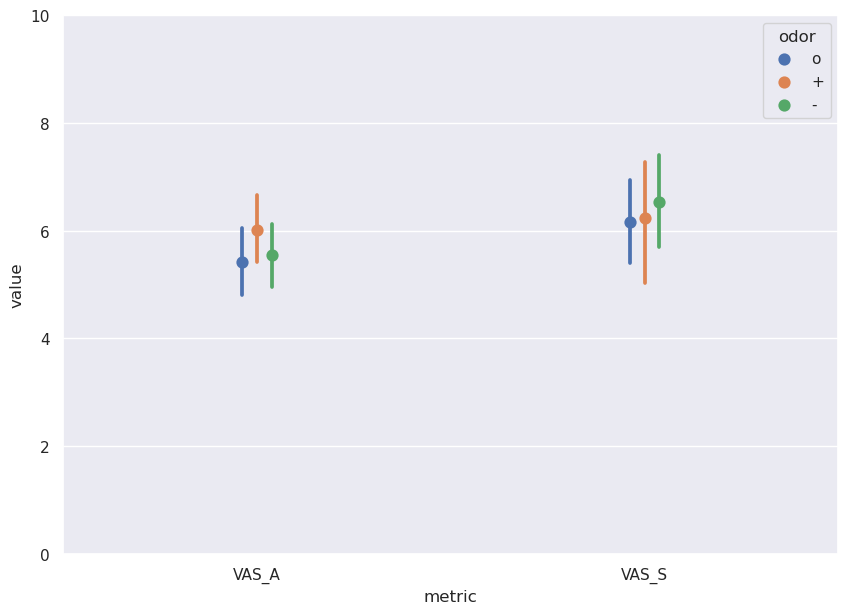

In [ ]:
df_plot = df_CO2.query(f"metric in {['VAS_A', 'VAS_S']} and sujet in {sujet_best_CO2}")
sns.pointplot(data=df_plot, x="metric", y="value", hue="odor", errorbar='sd', linestyles='none', dodge=True)
sns.set(rc={'figure.figsize':(10,7)})
plt.ylim(0,10)

<AxesSubplot:xlabel='metric', ylabel='value'>

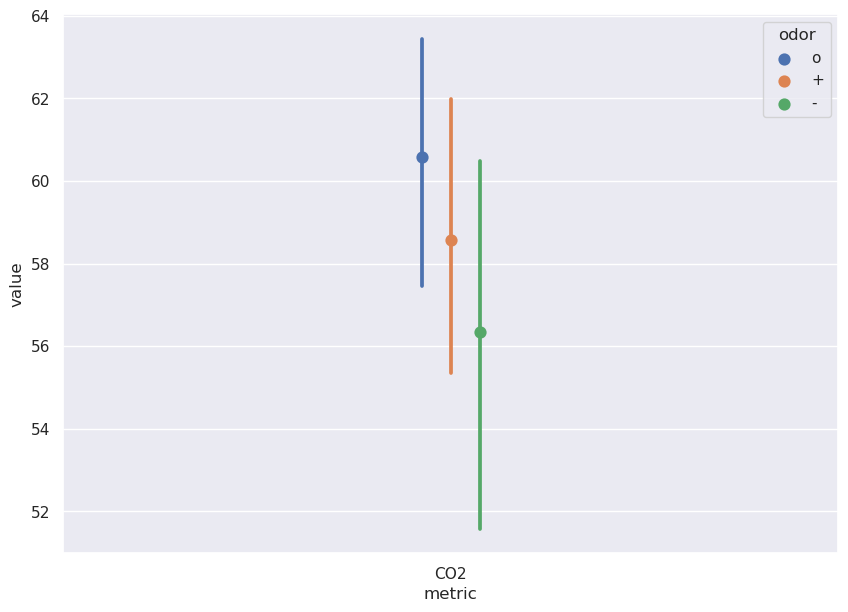

In [ ]:
df_plot = df_CO2.query(f"metric == 'CO2' and sujet in {sujet_best_CO2}")
sns.pointplot(data=df_plot, x="metric", y="value", hue="odor", errorbar='sd', linestyles='none', dodge=True)

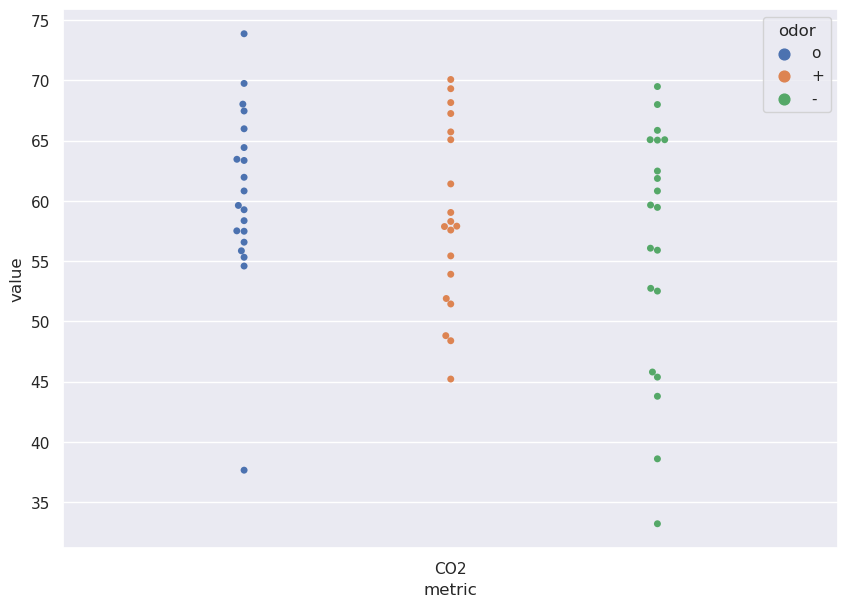

In [ ]:
df_plot = df_CO2.query(f"metric == 'CO2' and sujet in {sujet_best_CO2}")
sns.swarmplot(data=df_plot, x="metric", y="value", hue="odor", dodge=True)
sns.set(rc={'figure.figsize':(10,7)})

In [ ]:
df_relax.query(f"sujet in ['DM08', 'DI22', 'TA09', 'AR30']")

,sujet,session,cond,val
678,DM08,o,FR_CV1,93.037975
686,DM08,o,MECA,45.569620
694,DM08,o,CO2,41.401274
702,DM08,o,FR_CV2,89.171975
710,DM08,+,FR_CV1,44.585987
718,DM08,+,MECA,75.796178
726,DM08,+,CO2,43.949045
734,DM08,+,FR_CV2,59.872611
742,DM08,-,FR_CV1,89.171975
750,DM08,-,MECA,73.885350
